In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
sns.set(style="white")
sns.set(style="whitegrid", color_codes=True)
#plt.rc("font", size=14)

from collections import Counter
from imblearn.over_sampling import RandomOverSampler,ADASYN,SMOTE,BorderlineSMOTE
from imblearn.under_sampling import RandomUnderSampler,NearMiss
from imblearn.combine import SMOTETomek,SMOTEENN
from imblearn.pipeline import make_pipeline
from imblearn.pipeline import Pipeline
from scipy.stats import randint as sp_randint
from numpy import where
from numpy import random
from numpy.random import uniform
from sklearn.dummy import DummyClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import ExtraTreesClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import AdaBoostClassifier
from xgboost import XGBClassifier
import lightgbm as lgb
from catboost import CatBoostClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.naive_bayes import MultinomialNB
from sklearn.svm import SVC
from sklearn.neural_network import MLPClassifier
from sklearn.preprocessing import MinMaxScaler
from sklearn import preprocessing
from sklearn import tree
from sklearn import metrics  
from sklearn.metrics import confusion_matrix,plot_confusion_matrix, classification_report, accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, roc_curve, precision_recall_curve
from sklearn.datasets import make_classification
from sklearn.model_selection import train_test_split
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import RandomizedSearchCV
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import train_test_split
from sklearn.model_selection import StratifiedKFold
from sklearn.preprocessing import MinMaxScaler


import warnings
warnings.filterwarnings("ignore")

# Prepare Data for Modelling

## Define Method for plotting Confusion Matrix

In [2]:
class_names = ['Retained','Lapsed']

# Declare a method named as 'plot_confusion_matrix' with five arguments (cm, classes, normalize, title, cmap)
def plot_confusion_matrix(cm, classes,
                          normalize = False,
                          title = 'Confusion matrix',
                          cmap = plt.cm.GnBu):
    plt.imshow(cm, interpolation = 'nearest', cmap = cmap)     # Call imshow() for the data interpolation and color map
    plt.title(title)                                           # Assign the title
    plt.colorbar()                                             # Assign the color bar
    tick_marks = np.arange(len(classes))                       # len(classes) provides the number of classes
    plt.xticks(tick_marks, classes, rotation = 45)             # Rotation of text along the horizontal line
    plt.yticks(tick_marks, classes)  

    fmt = '.2f' if normalize else 'd'
    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, format(cm[i, j], fmt),
                 horizontalalignment = "center",
                 color="white" if cm[i, j] > thresh else "black")

    
    plt.xlabel('Predicted Label',fontsize = 11,color = 'teal',fontweight = 'bold')
    plt.ylabel('True Label',fontsize = 11,color = 'teal',fontweight = 'bold')
    plt.tight_layout()
    plt.xticks(fontsize = 10)
    plt.yticks(fontsize = 10)
    plt.grid(False)


## Define Method for ROC_AUC Curve

In [3]:
def roc_auc_curve(y_test,best_model,method,test_name,X_test):
    roc_auc = roc_auc_score(y_test, best_model.predict(X_test))
    fpr, tpr, thresholds = roc_curve(y_test,best_model.predict_proba(X_test)[:,1])
    plt.figure()
    plt.plot(fpr, tpr, label=f'{model_name} {method} {test_name} (area = %0.2f)' % roc_auc)
    plt.plot([0, 1], [0, 1],'r--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.legend(loc="lower right")
    plt.savefig(f'{model_name}_ROC {method} {test_name}')
    plt.show()



In [4]:
def precision_recall_curve(y_predict,i,l):
    precision, recall, thresholds = precision_recall_curve(p, y_predict)
# plot the precision-recall curve
    plt.plot(recall, precision)
    plt.xlabel('Recall')
    plt.ylabel('Precision')
    plt.ylim([0.0, 1.05])
    plt.xlim([0.0, 1.0])
    plt.savefig(f'{model_name}_PRC_{i}_{l}')
    plt.show()

## Define Method for Feature Importances

In [5]:
def feature_importance(best_model,model_name,method,test_name):
    importances = best_model.feature_importances_
    feature_imp = pd.Series(importances,index = X_df.columns.values).sort_values(ascending=False)
    # Creating a bar plot
    sns.barplot(x=feature_imp, y=feature_imp.index)
    # Add labels to your graph
    plt.xlabel('Feature Importance Score')
    plt.ylabel('Features')
    plt.title(f'{model_name} {method} {test_name} - Important Features', fontsize = 14, fontweight = "bold")
    plt.legend()
    plt.show()

In [6]:
def feature_importance_pipe(best_model,model_name,method,test_name):
    importances = best_model.named_steps["clf"].feature_importances_
    feature_imp = pd.Series(importances,index = X_df.columns.values).sort_values(ascending=False)
    # Creating a bar plot
    sns.barplot(x=feature_imp, y=feature_imp.index)
    # Add labels to your graph
    plt.xlabel('Feature Importance Score')
    plt.ylabel('Features')
    plt.title(f'{model_name} {method} {test_name} - Important Features', fontsize = 14, fontweight = "bold")
    plt.legend()
    plt.show()

## Import Encoded Data

In [7]:
#read csv file
df = pd.read_csv('Policy Review Data - Encoded.csv')
df.head()

,REVIEW_YEAR,SUM_ASSURED_BEFORE,CRITICAL_ILLNESS_BEFORE,AGE_AT_REVIEW,BRANCH,ASSIGNED_FLAG,ASTERISKED_ORPHAN,SINGLE,JOINT_LIFE_1ST,DUAL_LIFE,PRIMARY_AGENT_STATUS,REVIEW_MONTH,PREMIUM_INCREASE_5Y,REVIEW_OUTCOME
0,30,137196.0,0.0,58,5.0,1.0,0.0,0.0,1.0,0.0,1.0,7.0,213.60,0.0
1,30,144704.0,0.0,68,6.0,0.0,0.0,0.0,0.0,1.0,1.0,7.0,76.29,0.0
2,31,84359.5,0.0,67,9.0,0.0,0.0,1.0,0.0,0.0,1.0,6.0,3046.35,1.0
3,30,50280.5,0.0,69,6.0,0.0,1.0,0.0,1.0,0.0,1.0,1.0,401.47,0.0
4,30,111801.0,0.0,72,3.0,0.0,0.0,0.0,0.0,1.0,1.0,6.0,244.11,0.0


In [8]:
df = df[df['REVIEW_MONTH'] >= 1]       
df.dropna(axis = 1)
df.shape

(7131, 14)

In [9]:
X_df = df.drop('REVIEW_OUTCOME', axis = 1)

## Split into Train/Test datasets

In [10]:

# Create the independent and dependent variables
X = df.drop('REVIEW_OUTCOME', axis = 1).values
y = df['REVIEW_OUTCOME'].values

# summarize class distribution
counter = Counter(y)
print(counter)

# Split the data into train and test for 90/10, 80/10 and 70/30 permutations
X_train_90, X_test_10, y_train_90, y_test_10 = train_test_split(X, y, test_size = 0.1,random_state = 28, stratify = y)
X_train_80, X_test_20, y_train_80, y_test_20 = train_test_split(X, y, test_size = 0.2,random_state = 28, stratify = y)
X_train_70, X_test_30, y_train_70, y_test_30 = train_test_split(X, y, test_size = 0.3,random_state = 28, stratify = y)

resamplers = [RandomOverSampler(random_state = 42),ADASYN(random_state = 42),SMOTE(random_state = 42),BorderlineSMOTE(random_state = 42),SMOTETomek(random_state = 42),SMOTEENN(random_state = 42),RandomUnderSampler(random_state = 42),
              NearMiss(version=1,n_neighbors=3),NearMiss(version=2,n_neighbors=3),NearMiss(version=3,n_neighbors=3)]

resampler_names = ["ROS","ADASYN","SMOTE","BLSMOTE","SMOTETomek","SMOTEENN","RUS","NM1","NM2","NM3"]
train_names = ["70pc_Train","80pc_Train","90pc_Train"]
test_names = ["30pc_Test","20pc_Test","10pc_Test"]

X_training_splits = [X_train_70,X_train_80,X_train_90]
y_training_splits = [y_train_70,y_train_80,y_train_90]
X_testing_splits = [X_test_30,X_test_20,X_test_10]
y_testing_splits = [y_test_30,y_test_20,y_test_10]

class_weights = ["None","Balanced"]

Counter({0.0: 6209, 1.0: 922})


## Baseline Model

Baseline IMB_70pc_Train F1 Score : 0.00%
Baseline IMB_30pc_Test F1 Score : 0.00%


NameError: name 'itertools' is not defined

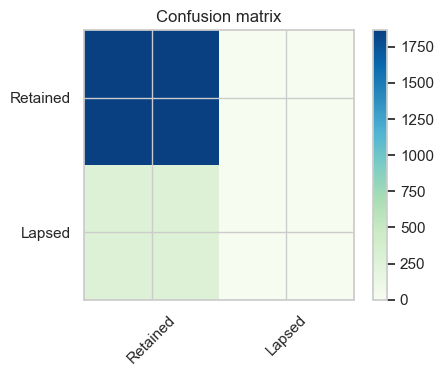

In [18]:
model_name = "Baseline"

strategies = ['most_frequent', 'stratified', 'uniform', 'constant']

clf = DummyClassifier()

for train_name, test_name, X_train, y_train, X_test,y_test in zip(train_names,test_names, X_training_splits, y_training_splits, X_testing_splits, y_testing_splits):
        
    model = clf
    method = "IMB" 
    param_grid = [{'strategy': ['most_frequent']}]
    model.fit(X_train,y_train)
    y_predict = model.predict(X_test)
    y_train_predict = model.predict(X_train)
    
    exec(f'{model_name}_roc_auc_{method}_{train_name} =  roc_auc_score(y_train,y_train_predict)')
    exec(f'{model_name}_a_{method}_{train_name} = metrics.accuracy_score(y_train,y_train_predict)') 
    exec(f'{model_name}_p_{method}_{train_name} = metrics.precision_score(y_train,y_train_predict)') 
    exec(f'{model_name}_r_{method}_{train_name}  = metrics.recall_score(y_train,y_train_predict)') 
    exec(f'{model_name}_f1_{method}_{train_name} = metrics.f1_score(y_train,y_train_predict)')
    print(f'{model_name} {method}_{train_name} F1 Score : %.2f%%' % (metrics.f1_score(y_train, y_train_predict) * 100.0))

    # Call fit() method to train the model
    # Predict the results
    
    
    exec(f'{model_name}_roc_auc_{method}_{test_name} =  roc_auc_score(y_test,y_predict)')
    exec(f'{model_name}_a_{method}_{test_name} = metrics.accuracy_score(y_test, y_predict)') 
    exec(f'{model_name}_p_{method}_{test_name} = metrics.precision_score(y_test, y_predict)') 
    exec(f'{model_name}_r_{method}_{test_name}  = metrics.recall_score(y_test, y_predict)') 
    exec(f'{model_name}_f1_{method}_{test_name} = metrics.f1_score(y_test, y_predict)')
    print(f'{model_name} {method}_{test_name} F1 Score : %.2f%%' % (metrics.f1_score(y_test, y_predict) * 100.0))
 

 
     # Compute confusion matrix
    cnf_matrix = confusion_matrix(y_test, y_predict)
    # Plot non-normalized confusion matrix
    plt.figure(figsize = (5, 3.5))
    plot_confusion_matrix(cnf_matrix, classes = class_names)
    plt.title(f'{model_name} {method} {test_name}',fontsize = 13, fontweight = "bold")
    plt.show()

    # print the classification_report based on y_test and y_predict) 
    print(f'{model_name} {method} {test_name} - Classification Report')
    print(classification_report(y_test, y_predict))

    roc_auc_curve(y_test,best_model,method,test_name,X_test)


    
    

## kNN Classifier Model

Best parameters KNN IMB ('30pc_Test',): {'leaf_size': 15, 'n_neighbors': 1, 'weights': 'uniform'}
KNN IMB_70pc_Train F1 Score : 100.00%
KNN IMB_30pc_Test F1 Score : 14.44%


NameError: name 'itertools' is not defined

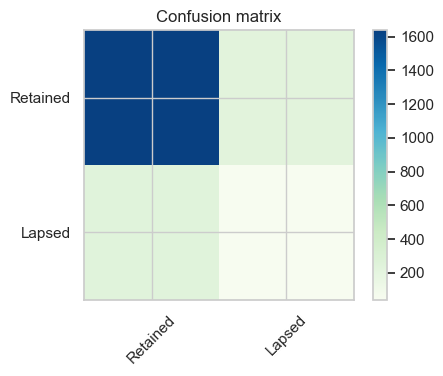

In [19]:
model_name = "KNN"

clf = KNeighborsClassifier()

for train_name, test_name, X_train, y_train, X_test,y_test in zip(train_names,test_names, X_training_splits, y_training_splits, X_testing_splits, y_testing_splits):
        
    model = clf
    method = "IMB"
    param_grid =  [{'n_neighbors': range(1,11),
         'weights': ['uniform', 'distance'],
         'leaf_size': [15, 20]}]

    stratified_kfold = StratifiedKFold(n_splits=5,shuffle=True,random_state=11)
    gs = GridSearchCV(estimator=model,
                      param_grid=param_grid,
                      scoring='f1',
                      cv=stratified_kfold,
                      n_jobs=-1)
    gs.fit(X_train,y_train)

    # Print the best parameters and best score obtained during the grid search
    print(f'Best parameters {model_name} {method} {test_name,}:', gs.best_params_)

    best_model = gs.best_estimator_
    # Call fit() method to train the model
    best_model.fit(X_train,y_train)
    # Predict the results
    y_train_predict = best_model.predict(X_train)
    y_predict = best_model.predict(X_test)
    
    exec(f'{model_name}_roc_auc_{method}_{train_name} =  roc_auc_score(y_train,y_train_predict)')
    exec(f'{model_name}_a_{method}_{train_name} = metrics.accuracy_score(y_train,y_train_predict)') 
    exec(f'{model_name}_p_{method}_{train_name} = metrics.precision_score(y_train,y_train_predict)') 
    exec(f'{model_name}_r_{method}_{train_name}  = metrics.recall_score(y_train,y_train_predict)') 
    exec(f'{model_name}_f1_{method}_{train_name} = metrics.f1_score(y_train,y_train_predict)')
    print(f'{model_name} {method}_{train_name} F1 Score : %.2f%%' % (metrics.f1_score(y_train, y_train_predict) * 100.0))

    # Call fit() method to train the model
    # Predict the results
    
    
    exec(f'{model_name}_roc_auc_{method}_{test_name} =  roc_auc_score(y_test,y_predict)')
    exec(f'{model_name}_a_{method}_{test_name} = metrics.accuracy_score(y_test, y_predict)') 
    exec(f'{model_name}_p_{method}_{test_name} = metrics.precision_score(y_test, y_predict)') 
    exec(f'{model_name}_r_{method}_{test_name}  = metrics.recall_score(y_test, y_predict)') 
    exec(f'{model_name}_f1_{method}_{test_name} = metrics.f1_score(y_test, y_predict)')
    print(f'{model_name} {method}_{test_name} F1 Score : %.2f%%' % (metrics.f1_score(y_test, y_predict) * 100.0))
 

 
     # Compute confusion matrix
    cnf_matrix = confusion_matrix(y_test, y_predict)
    # Plot non-normalized confusion matrix
    plt.figure(figsize = (5, 3.5))
    plot_confusion_matrix(cnf_matrix, classes = class_names)
    plt.title(f'{model_name} {method} {test_name}',fontsize = 13, fontweight = "bold")
    plt.show()

    # print the classification_report based on y_test and y_predict) 
    print(f'{model_name} {method} {test_name} - Classification Report')
    print(classification_report(y_test, y_predict))

    roc_auc_curve(y_test,best_model,method,test_name,X_test)
    

for method,resampler in zip(resampler_names,resamplers):
    for train_name, test_name, X_train, y_train, X_test,y_test in zip(train_names,test_names, X_training_splits, y_training_splits, X_testing_splits, y_testing_splits):
        
        model = Pipeline([('resampler', resampler),
                     ('mms', MinMaxScaler()),
                     ('clf',clf)])
        
        param_grid =  [{'clf__n_neighbors': [1,2,3,4,5,6,7,8,9],
         'clf__weights': ['uniform', 'distance'],
         'clf__leaf_size': [15, 20]}]


        stratified_kfold = StratifiedKFold(n_splits=5,shuffle=True,random_state=11)
        gs = GridSearchCV(estimator=model,
                          param_grid=param_grid,
                          scoring='f1',
                          cv=stratified_kfold,
                          n_jobs=-1)
        gs.fit(X_train,y_train)

        # Print the best parameters and best score obtained during the grid search
        print(f'Best parameters {model_name} {method} {test_name,}:', gs.best_params_)

        best_model = gs.best_estimator_
        # Call fit() method to train the model
        best_model.fit(X_train,y_train)
        # Predict the results
        y_train_predict = best_model.predict(X_train)
        y_predict = best_model.predict(X_test)

        exec(f'{model_name}_roc_auc_{method}_{train_name} =  roc_auc_score(y_train,y_train_predict)')
        exec(f'{model_name}_a_{method}_{train_name} = metrics.accuracy_score(y_train,y_train_predict)') 
        exec(f'{model_name}_p_{method}_{train_name} = metrics.precision_score(y_train,y_train_predict)') 
        exec(f'{model_name}_r_{method}_{train_name}  = metrics.recall_score(y_train,y_train_predict)') 
        exec(f'{model_name}_f1_{method}_{train_name} = metrics.f1_score(y_train,y_train_predict)')
        print(f'{model_name} {method}_{train_name} F1 Score : %.2f%%' % (metrics.f1_score(y_train, y_train_predict) * 100.0))

        # Call fit() method to train the model
        # Predict the results


        exec(f'{model_name}_roc_auc_{method}_{test_name} =  roc_auc_score(y_test,y_predict)')
        exec(f'{model_name}_a_{method}_{test_name} = metrics.accuracy_score(y_test, y_predict)') 
        exec(f'{model_name}_p_{method}_{test_name} = metrics.precision_score(y_test, y_predict)') 
        exec(f'{model_name}_r_{method}_{test_name}  = metrics.recall_score(y_test, y_predict)') 
        exec(f'{model_name}_f1_{method}_{test_name} = metrics.f1_score(y_test, y_predict)')
        print(f'{model_name} {method}_{test_name} F1 Score : %.2f%%' % (metrics.f1_score(y_test, y_predict) * 100.0))



         # Compute confusion matrix
        cnf_matrix = confusion_matrix(y_test, y_predict)
        # Plot non-normalized confusion matrix
        plt.figure(figsize = (5, 3.5))
        plot_confusion_matrix(cnf_matrix, classes = class_names)
        plt.title(f'{model_name} {method} {test_name}',fontsize = 13, fontweight = "bold")
        plt.show()

        # print the classification_report based on y_test and y_predict) 
        print(f'{model_name} {method} {test_name} - Classification Report')
        print(classification_report(y_test, y_predict))

        roc_auc_curve(y_test,best_model,method,test_name,X_test)





## Naive Bayes Model

In [ ]:
model_name = "NB"

clf = MultinomialNB()

for train_name, test_name, X_train, y_train, X_test,y_test in zip(train_names,test_names, X_training_splits, y_training_splits, X_testing_splits, y_testing_splits):
        
    model = clf
    method = "IMB"
    param_grid =  [{'alpha': [0.05]}]

    stratified_kfold = StratifiedKFold(n_splits=5,shuffle=True,random_state=11)
    gs = GridSearchCV(estimator=model,
                      param_grid=param_grid,
                      scoring='f1',
                      cv=stratified_kfold,
                      n_jobs=-1)
    gs.fit(X_train,y_train)

    # Print the best parameters and best score obtained during the grid search
    print(f'Best parameters {model_name} {method} {test_name,}:', gs.best_params_)

    best_model = gs.best_estimator_
    # Call fit() method to train the model
    best_model.fit(X_train,y_train)
    # Predict the results
    y_train_predict = best_model.predict(X_train)
    y_predict = best_model.predict(X_test)
    
    exec(f'{model_name}_roc_auc_{method}_{train_name} =  roc_auc_score(y_train,y_train_predict)')
    exec(f'{model_name}_a_{method}_{train_name} = metrics.accuracy_score(y_train,y_train_predict)') 
    exec(f'{model_name}_p_{method}_{train_name} = metrics.precision_score(y_train,y_train_predict)') 
    exec(f'{model_name}_r_{method}_{train_name}  = metrics.recall_score(y_train,y_train_predict)') 
    exec(f'{model_name}_f1_{method}_{train_name} = metrics.f1_score(y_train,y_train_predict)')
    print(f'{model_name} {method}_{train_name} F1 Score : %.2f%%' % (metrics.f1_score(y_train, y_train_predict) * 100.0))

    # Call fit() method to train the model
    # Predict the results
    
    
    exec(f'{model_name}_roc_auc_{method}_{test_name} =  roc_auc_score(y_test,y_predict)')
    exec(f'{model_name}_a_{method}_{test_name} = metrics.accuracy_score(y_test, y_predict)') 
    exec(f'{model_name}_p_{method}_{test_name} = metrics.precision_score(y_test, y_predict)') 
    exec(f'{model_name}_r_{method}_{test_name}  = metrics.recall_score(y_test, y_predict)') 
    exec(f'{model_name}_f1_{method}_{test_name} = metrics.f1_score(y_test, y_predict)')
    print(f'{model_name} {method}_{test_name} F1 Score : %.2f%%' % (metrics.f1_score(y_test, y_predict) * 100.0))
 

 
     # Compute confusion matrix
    cnf_matrix = confusion_matrix(y_test, y_predict)
    # Plot non-normalized confusion matrix
    plt.figure(figsize = (5, 3.5))
    plot_confusion_matrix(cnf_matrix, classes = class_names)
    plt.title(f'{model_name} {method} {test_name}',fontsize = 13, fontweight = "bold")
    plt.show()

    # print the classification_report based on y_test and y_predict) 
    print(f'{model_name} {method} {test_name} - Classification Report')
    print(classification_report(y_test, y_predict))

    roc_auc_curve(y_test,best_model,method,test_name,X_test)
    

for method,resampler in zip(resampler_names,resamplers):
    for train_name, test_name, X_train, y_train, X_test,y_test in zip(train_names,test_names, X_training_splits, y_training_splits, X_testing_splits, y_testing_splits):
        
        model = Pipeline([('resampler', resampler),
                     ('mms', MinMaxScaler()),
                     ('clf',clf)])
        
        param_grid =  [{'clf__alpha': [0.05]}]


        stratified_kfold = StratifiedKFold(n_splits=5,shuffle=True,random_state=11)
        gs = GridSearchCV(estimator=model,
                          param_grid=param_grid,
                          scoring='f1',
                          cv=stratified_kfold,
                          n_jobs=-1)
        gs.fit(X_train,y_train)

        # Print the best parameters and best score obtained during the grid search
        print(f'Best parameters {model_name} {method} {test_name,}:', gs.best_params_)

        best_model = gs.best_estimator_
        # Call fit() method to train the model
        best_model.fit(X_train,y_train)
        # Predict the results
        y_train_predict = best_model.predict(X_train)
        y_predict = best_model.predict(X_test)

        exec(f'{model_name}_roc_auc_{method}_{train_name} =  roc_auc_score(y_train,y_train_predict)')
        exec(f'{model_name}_a_{method}_{train_name} = metrics.accuracy_score(y_train,y_train_predict)') 
        exec(f'{model_name}_p_{method}_{train_name} = metrics.precision_score(y_train,y_train_predict)') 
        exec(f'{model_name}_r_{method}_{train_name}  = metrics.recall_score(y_train,y_train_predict)') 
        exec(f'{model_name}_f1_{method}_{train_name} = metrics.f1_score(y_train,y_train_predict)')
        print(f'{model_name} {method}_{train_name} F1 Score : %.2f%%' % (metrics.f1_score(y_train, y_train_predict) * 100.0))

        # Call fit() method to train the model
        # Predict the results


        exec(f'{model_name}_roc_auc_{method}_{test_name} =  roc_auc_score(y_test,y_predict)')
        exec(f'{model_name}_a_{method}_{test_name} = metrics.accuracy_score(y_test, y_predict)') 
        exec(f'{model_name}_p_{method}_{test_name} = metrics.precision_score(y_test, y_predict)') 
        exec(f'{model_name}_r_{method}_{test_name}  = metrics.recall_score(y_test, y_predict)') 
        exec(f'{model_name}_f1_{method}_{test_name} = metrics.f1_score(y_test, y_predict)')
        print(f'{model_name} {method}_{test_name} F1 Score : %.2f%%' % (metrics.f1_score(y_test, y_predict) * 100.0))



         # Compute confusion matrix
        cnf_matrix = confusion_matrix(y_test, y_predict)
        # Plot non-normalized confusion matrix
        plt.figure(figsize = (5, 3.5))
        plot_confusion_matrix(cnf_matrix, classes = class_names)
        plt.title(f'{model_name} {method} {test_name}',fontsize = 13, fontweight = "bold")
        plt.show()

        # print the classification_report based on y_test and y_predict) 
        print(f'{model_name} {method} {test_name} - Classification Report')
        print(classification_report(y_test, y_predict))

        roc_auc_curve(y_test,best_model,method,test_name,X_test)





## Logistic Regression Model

In [ ]:
model_name = "LR"
clf = LogisticRegression()

for train_name, test_name, X_train, y_train, X_test,y_test in zip(train_names,test_names, X_training_splits, y_training_splits, X_testing_splits, y_testing_splits):
        
    model = clf
    method = "IMB"    
    param_grid = {'class_weight': ['None']}  
    
        
    stratified_kfold = StratifiedKFold(n_splits=5,shuffle=True,random_state=11)
    gs = GridSearchCV(estimator=model,
                      param_grid=param_grid,
                      scoring='f1',
                      cv=stratified_kfold,
                      n_jobs=-1)
    gs.fit(X_train,y_train)

    # Print the best parameters and best score obtained during the grid search
    print(f'Best parameters {model_name} {method} {test_name,}:', gs.best_params_)
    
    best_model = gs.best_estimator_
    # Call fit() method to train the model
    best_model.fit(X_train,y_train)
    # Predict the results
    y_train_predict = best_model.predict(X_train)
    y_predict = best_model.predict(X_test)

    exec(f'{model_name}_roc_auc_{method}_{train_name} =  roc_auc_score(y_train,y_train_predict)')
    exec(f'{model_name}_a_{method}_{train_name} = metrics.accuracy_score(y_train,y_train_predict)') 
    exec(f'{model_name}_p_{method}_{train_name} = metrics.precision_score(y_train,y_train_predict)') 
    exec(f'{model_name}_r_{method}_{train_name}  = metrics.recall_score(y_train,y_train_predict)') 
    exec(f'{model_name}_f1_{method}_{train_name} = metrics.f1_score(y_train,y_train_predict)')
    print(f'{model_name} {method}_{train_name} F1 Score : %.2f%%' % (metrics.f1_score(y_train, y_train_predict) * 100.0))

    # Call fit() method to train the model
    # Predict the results


    exec(f'{model_name}_roc_auc_{method}_{test_name} =  roc_auc_score(y_test,y_predict)')
    exec(f'{model_name}_a_{method}_{test_name} = metrics.accuracy_score(y_test, y_predict)') 
    exec(f'{model_name}_p_{method}_{test_name} = metrics.precision_score(y_test, y_predict)') 
    exec(f'{model_name}_r_{method}_{test_name}  = metrics.recall_score(y_test, y_predict)') 
    exec(f'{model_name}_f1_{method}_{test_name} = metrics.f1_score(y_test, y_predict)')
    print(f'{model_name} {method}_{test_name} F1 Score : %.2f%%' % (metrics.f1_score(y_test, y_predict) * 100.0))



     # Compute confusion matrix
    cnf_matrix = confusion_matrix(y_test, y_predict)
    # Plot non-normalized confusion matrix
    plt.figure(figsize = (5, 3.5))
    plot_confusion_matrix(cnf_matrix, classes = class_names)
    plt.title(f'{model_name} {method} {test_name}',fontsize = 13, fontweight = "bold")
    plt.show()

    # print the classification_report based on y_test and y_predict) 
    print(f'{model_name} {method} {test_name} - Classification Report')
    print(classification_report(y_test, y_predict))

    roc_auc_curve(y_test,best_model,method,test_name,X_test)

    
        
for train_name, test_name, X_train, y_train, X_test,y_test in zip(train_names,test_names, X_training_splits, y_training_splits, X_testing_splits, y_testing_splits):
        
    param_grid = {'class_weight': ['balanced']}
    method = "CWB"
        
    stratified_kfold = StratifiedKFold(n_splits=5,shuffle=True,random_state=11)
    gs = GridSearchCV(estimator=model,
                      param_grid=param_grid,
                      scoring='f1',
                      cv=stratified_kfold,
                      n_jobs=-1)
    gs.fit(X_train,y_train)

    # Print the best parameters and best score obtained during the grid search
    print(f'Best parameters {model_name} {method} {test_name,}:', gs.best_params_)
    
    best_model = gs.best_estimator_
    # Call fit() method to train the model
    best_model.fit(X_train,y_train)
    # Predict the results
    y_train_predict = best_model.predict(X_train)
    y_predict = best_model.predict(X_test)

    exec(f'{model_name}_roc_auc_{method}_{train_name} =  roc_auc_score(y_train,y_train_predict)')
    exec(f'{model_name}_a_{method}_{train_name} = metrics.accuracy_score(y_train,y_train_predict)') 
    exec(f'{model_name}_p_{method}_{train_name} = metrics.precision_score(y_train,y_train_predict)') 
    exec(f'{model_name}_r_{method}_{train_name}  = metrics.recall_score(y_train,y_train_predict)') 
    exec(f'{model_name}_f1_{method}_{train_name} = metrics.f1_score(y_train,y_train_predict)')
    print(f'{model_name} {method}_{train_name} F1 Score : %.2f%%' % (metrics.f1_score(y_train, y_train_predict) * 100.0))

    # Call fit() method to train the model
    # Predict the results


    exec(f'{model_name}_roc_auc_{method}_{test_name} =  roc_auc_score(y_test,y_predict)')
    exec(f'{model_name}_a_{method}_{test_name} = metrics.accuracy_score(y_test, y_predict)') 
    exec(f'{model_name}_p_{method}_{test_name} = metrics.precision_score(y_test, y_predict)') 
    exec(f'{model_name}_r_{method}_{test_name}  = metrics.recall_score(y_test, y_predict)') 
    exec(f'{model_name}_f1_{method}_{test_name} = metrics.f1_score(y_test, y_predict)')
    print(f'{model_name} {method}_{test_name} F1 Score : %.2f%%' % (metrics.f1_score(y_test, y_predict) * 100.0))



     # Compute confusion matrix
    cnf_matrix = confusion_matrix(y_test, y_predict)
    # Plot non-normalized confusion matrix
    plt.figure(figsize = (5, 3.5))
    plot_confusion_matrix(cnf_matrix, classes = class_names)
    plt.title(f'{model_name} {method} {test_name}',fontsize = 13, fontweight = "bold")
    plt.show()

    # print the classification_report based on y_test and y_predict) 
    print(f'{model_name} {method} {test_name} - Classification Report')
    print(classification_report(y_test, y_predict))

    roc_auc_curve(y_test,best_model,method,test_name,X_test)

     

for method,resampler in zip(resampler_names,resamplers):
    for train_name, test_name, X_train, y_train, X_test,y_test in zip(train_names,test_names, X_training_splits, y_training_splits, X_testing_splits, y_testing_splits):
        model = Pipeline([('resampler', resampler),
                     ('mms', MinMaxScaler()),
                     ('clf', clf)])
        
        param_grid = {'clf__class_weight': ['None']}

        stratified_kfold = StratifiedKFold(n_splits=5,shuffle=True,random_state=11)
        gs = GridSearchCV(estimator=model,
                          param_grid=param_grid,
                          scoring='f1',
                          cv=stratified_kfold,
                          n_jobs=-1)
        gs.fit(X_train,y_train)

        # Print the best parameters and best score obtained during the grid search
        print(f'Best parameters {model_name} {method} {test_name,}:', gs.best_params_)

        best_model = gs.best_estimator_
        # Call fit() method to train the model
        best_model.fit(X_train,y_train)
        # Predict the results
        y_train_predict = best_model.predict(X_train)
        y_predict = best_model.predict(X_test)

        exec(f'{model_name}_roc_auc_{method}_{train_name} =  roc_auc_score(y_train,y_train_predict)')
        exec(f'{model_name}_a_{method}_{train_name} = metrics.accuracy_score(y_train,y_train_predict)') 
        exec(f'{model_name}_p_{method}_{train_name} = metrics.precision_score(y_train,y_train_predict)') 
        exec(f'{model_name}_r_{method}_{train_name}  = metrics.recall_score(y_train,y_train_predict)') 
        exec(f'{model_name}_f1_{method}_{train_name} = metrics.f1_score(y_train,y_train_predict)')
        print(f'{model_name} {method}_{train_name} F1 Score : %.2f%%' % (metrics.f1_score(y_train, y_train_predict) * 100.0))

        # Call fit() method to train the model
        # Predict the results


        exec(f'{model_name}_roc_auc_{method}_{test_name} =  roc_auc_score(y_test,y_predict)')
        exec(f'{model_name}_a_{method}_{test_name} = metrics.accuracy_score(y_test, y_predict)') 
        exec(f'{model_name}_p_{method}_{test_name} = metrics.precision_score(y_test, y_predict)') 
        exec(f'{model_name}_r_{method}_{test_name}  = metrics.recall_score(y_test, y_predict)') 
        exec(f'{model_name}_f1_{method}_{test_name} = metrics.f1_score(y_test, y_predict)')
        print(f'{model_name} {method}_{test_name} F1 Score : %.2f%%' % (metrics.f1_score(y_test, y_predict) * 100.0))



         # Compute confusion matrix
        cnf_matrix = confusion_matrix(y_test, y_predict)
        # Plot non-normalized confusion matrix
        plt.figure(figsize = (5, 3.5))
        plot_confusion_matrix(cnf_matrix, classes = class_names)
        plt.title(f'{model_name} {method} {test_name}',fontsize = 13, fontweight = "bold")
        plt.show()

        # print the classification_report based on y_test and y_predict) 
        print(f'{model_name} {method} {test_name} - Classification Report')
        print(classification_report(y_test, y_predict))

        roc_auc_curve(y_test,best_model,method,test_name,X_test)





## Support Vector Machine Model

In [ ]:
model_name = "SVM"

clf = SVC(probability = True, random_state = 42)

for train_name, test_name, X_train, y_train, X_test,y_test in zip(train_names,test_names, X_training_splits, y_training_splits, X_testing_splits, y_testing_splits):
        
    model = clf
    method = "IMB"
    param_grid = {'kernel':['rbf'],'C': [1000], 'gamma' : [1,0.0001]}

    stratified_kfold = StratifiedKFold(n_splits=5,shuffle=True,random_state=11)
    gs = GridSearchCV(estimator=model,
                      param_grid=param_grid,
                      scoring='f1',
                      cv=stratified_kfold,
                      n_jobs=-1)
    gs.fit(X_train,y_train)

    # Print the best parameters and best score obtained during the grid search
    print(f'Best parameters {model_name} {method} {test_name,}:', gs.best_params_)

    best_model = gs.best_estimator_
    # Call fit() method to train the model
    best_model.fit(X_train,y_train)
    # Predict the results
    y_train_predict = best_model.predict(X_train)
    y_predict = best_model.predict(X_test)
    
    exec(f'{model_name}_roc_auc_{method}_{train_name} =  roc_auc_score(y_train,y_train_predict)')
    exec(f'{model_name}_a_{method}_{train_name} = metrics.accuracy_score(y_train,y_train_predict)') 
    exec(f'{model_name}_p_{method}_{train_name} = metrics.precision_score(y_train,y_train_predict)') 
    exec(f'{model_name}_r_{method}_{train_name}  = metrics.recall_score(y_train,y_train_predict)') 
    exec(f'{model_name}_f1_{method}_{train_name} = metrics.f1_score(y_train,y_train_predict)')
    print(f'{model_name} {method}_{train_name} F1 Score : %.2f%%' % (metrics.f1_score(y_train, y_train_predict) * 100.0))

    # Call fit() method to train the model
    # Predict the results
    
    
    exec(f'{model_name}_roc_auc_{method}_{test_name} =  roc_auc_score(y_test,y_predict)')
    exec(f'{model_name}_a_{method}_{test_name} = metrics.accuracy_score(y_test, y_predict)') 
    exec(f'{model_name}_p_{method}_{test_name} = metrics.precision_score(y_test, y_predict)') 
    exec(f'{model_name}_r_{method}_{test_name}  = metrics.recall_score(y_test, y_predict)') 
    exec(f'{model_name}_f1_{method}_{test_name} = metrics.f1_score(y_test, y_predict)')
    print(f'{model_name} {method}_{test_name} F1 Score : %.2f%%' % (metrics.f1_score(y_test, y_predict) * 100.0))
 

 
     # Compute confusion matrix
    cnf_matrix = confusion_matrix(y_test, y_predict)
    # Plot non-normalized confusion matrix
    plt.figure(figsize = (5, 3.5))
    plot_confusion_matrix(cnf_matrix, classes = class_names)
    plt.title(f'{model_name} {method} {test_name}',fontsize = 13, fontweight = "bold")
    plt.show()

    # print the classification_report based on y_test and y_predict) 
    print(f'{model_name} {method} {test_name} - Classification Report')
    print(classification_report(y_test, y_predict))

    roc_auc_curve(y_test,best_model,method,test_name,X_test)

model_name = "SVM"

clf = SVC(probability = True, random_state = 42)

for train_name, test_name, X_train, y_train, X_test,y_test in zip(train_names,test_names, X_training_splits, y_training_splits, X_testing_splits, y_testing_splits):
        
    model = clf
    method = "CWB"
    param_grid = {'kernel':['rbf'],'C': [1000], 'gamma' : [1,0.0001],'class_weight':['balanced']}

    stratified_kfold = StratifiedKFold(n_splits=5,shuffle=True,random_state=11)
    gs = GridSearchCV(estimator=model,
                      param_grid=param_grid,
                      scoring='f1',
                      cv=stratified_kfold,
                      n_jobs=-1)
    gs.fit(X_train,y_train)

    # Print the best parameters and best score obtained during the grid search
    print(f'Best parameters {model_name} {method} {test_name,}:', gs.best_params_)

    best_model = gs.best_estimator_
    # Call fit() method to train the model
    best_model.fit(X_train,y_train)
    # Predict the results
    y_train_predict = best_model.predict(X_train)
    y_predict = best_model.predict(X_test)
    
    exec(f'{model_name}_roc_auc_{method}_{train_name} =  roc_auc_score(y_train,y_train_predict)')
    exec(f'{model_name}_a_{method}_{train_name} = metrics.accuracy_score(y_train,y_train_predict)') 
    exec(f'{model_name}_p_{method}_{train_name} = metrics.precision_score(y_train,y_train_predict)') 
    exec(f'{model_name}_r_{method}_{train_name}  = metrics.recall_score(y_train,y_train_predict)') 
    exec(f'{model_name}_f1_{method}_{train_name} = metrics.f1_score(y_train,y_train_predict)')
    print(f'{model_name} {method}_{train_name} F1 Score : %.2f%%' % (metrics.f1_score(y_train, y_train_predict) * 100.0))

    # Call fit() method to train the model
    # Predict the results
    
    
    exec(f'{model_name}_roc_auc_{method}_{test_name} =  roc_auc_score(y_test,y_predict)')
    exec(f'{model_name}_a_{method}_{test_name} = metrics.accuracy_score(y_test, y_predict)') 
    exec(f'{model_name}_p_{method}_{test_name} = metrics.precision_score(y_test, y_predict)') 
    exec(f'{model_name}_r_{method}_{test_name}  = metrics.recall_score(y_test, y_predict)') 
    exec(f'{model_name}_f1_{method}_{test_name} = metrics.f1_score(y_test, y_predict)')
    print(f'{model_name} {method}_{test_name} F1 Score : %.2f%%' % (metrics.f1_score(y_test, y_predict) * 100.0))
 

 
     # Compute confusion matrix
    cnf_matrix = confusion_matrix(y_test, y_predict)
    # Plot non-normalized confusion matrix
    plt.figure(figsize = (5, 3.5))
    plot_confusion_matrix(cnf_matrix, classes = class_names)
    plt.title(f'{model_name} {method} {test_name}',fontsize = 13, fontweight = "bold")
    plt.show()

    # print the classification_report based on y_test and y_predict) 
    print(f'{model_name} {method} {test_name} - Classification Report')
    print(classification_report(y_test, y_predict))

    roc_auc_curve(y_test,best_model,method,test_name,X_test)
    

for method,resampler in zip(resampler_names,resamplers):
    for train_name, test_name, X_train, y_train, X_test,y_test in zip(train_names,test_names, X_training_splits, y_training_splits, X_testing_splits, y_testing_splits):
        
        model = Pipeline([('resampler', resampler),
                     ('mms', MinMaxScaler()),
                     ('clf',clf)])
        
        param_grid = {'clf__kernel':['rbf'],'clf__C': [1000], 'clf__gamma' : [1,0.0001]}


        stratified_kfold = StratifiedKFold(n_splits=5,shuffle=True,random_state=11)
        gs = GridSearchCV(estimator=model,
                          param_grid=param_grid,
                          scoring='f1',
                          cv=stratified_kfold,
                          n_jobs=-1)
        gs.fit(X_train,y_train)

        # Print the best parameters and best score obtained during the grid search
        print(f'Best parameters {model_name} {method} {test_name,}:', gs.best_params_)

        best_model = gs.best_estimator_
        # Call fit() method to train the model
        best_model.fit(X_train,y_train)
        # Predict the results
        y_train_predict = best_model.predict(X_train)
        y_predict = best_model.predict(X_test)

        exec(f'{model_name}_roc_auc_{method}_{train_name} =  roc_auc_score(y_train,y_train_predict)')
        exec(f'{model_name}_a_{method}_{train_name} = metrics.accuracy_score(y_train,y_train_predict)') 
        exec(f'{model_name}_p_{method}_{train_name} = metrics.precision_score(y_train,y_train_predict)') 
        exec(f'{model_name}_r_{method}_{train_name}  = metrics.recall_score(y_train,y_train_predict)') 
        exec(f'{model_name}_f1_{method}_{train_name} = metrics.f1_score(y_train,y_train_predict)')
        print(f'{model_name} {method}_{train_name} F1 Score : %.2f%%' % (metrics.f1_score(y_train, y_train_predict) * 100.0))

        # Call fit() method to train the model
        # Predict the results


        exec(f'{model_name}_roc_auc_{method}_{test_name} =  roc_auc_score(y_test,y_predict)')
        exec(f'{model_name}_a_{method}_{test_name} = metrics.accuracy_score(y_test, y_predict)') 
        exec(f'{model_name}_p_{method}_{test_name} = metrics.precision_score(y_test, y_predict)') 
        exec(f'{model_name}_r_{method}_{test_name}  = metrics.recall_score(y_test, y_predict)') 
        exec(f'{model_name}_f1_{method}_{test_name} = metrics.f1_score(y_test, y_predict)')
        print(f'{model_name} {method}_{test_name} F1 Score : %.2f%%' % (metrics.f1_score(y_test, y_predict) * 100.0))



         # Compute confusion matrix
        cnf_matrix = confusion_matrix(y_test, y_predict)
        # Plot non-normalized confusion matrix
        plt.figure(figsize = (5, 3.5))
        plot_confusion_matrix(cnf_matrix, classes = class_names)
        plt.title(f'{model_name} {method} {test_name}',fontsize = 13, fontweight = "bold")
        plt.show()

        # print the classification_report based on y_test and y_predict) 
        print(f'{model_name} {method} {test_name} - Classification Report')
        print(classification_report(y_test, y_predict))

        roc_auc_curve(y_test,best_model,method,test_name,X_test)




## Decision Tree Classifier Model

Best parameters DT IMB ('30pc_Test',): {'max_depth': 10}
DT IMB_70pc_Train F1 Score : 37.84%
DT IMB_30pc_Test F1 Score : 8.33%


NameError: name 'itertools' is not defined

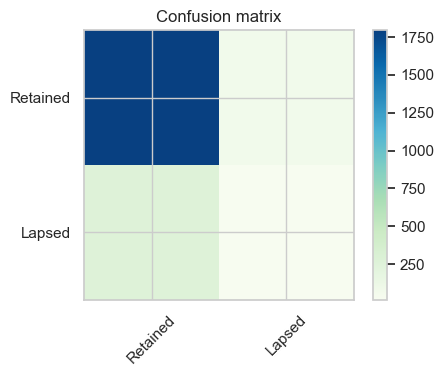

In [20]:
model_name = "DT"
clf = DecisionTreeClassifier(random_state = 42)

for train_name, test_name, X_train, y_train, X_test,y_test in zip(train_names,test_names, X_training_splits, y_training_splits, X_testing_splits, y_testing_splits):
    
    model = clf
    method = "IMB"
    param_grid = {'max_depth': range(1, 11)}
    stratified_kfold = StratifiedKFold(n_splits=5,shuffle=True,random_state=11)
    gs = GridSearchCV(estimator=model,
                      param_grid=param_grid,
                      scoring='f1',
                      cv=stratified_kfold,
                      n_jobs=-1)
    gs.fit(X_train,y_train)

    # Print the best parameters and best score obtained during the grid search
    print(f'Best parameters {model_name} {method} {test_name,}:', gs.best_params_)
    
    best_model = gs.best_estimator_
    # Call fit() method to train the model
    best_model.fit(X_train,y_train)
    # Predict the results
    y_train_predict = best_model.predict(X_train)
    y_predict = best_model.predict(X_test)
    
    exec(f'{model_name}_roc_auc_{method}_{train_name} =  roc_auc_score(y_train,y_train_predict)')
    exec(f'{model_name}_a_{method}_{train_name} = metrics.accuracy_score(y_train,y_train_predict)') 
    exec(f'{model_name}_p_{method}_{train_name} = metrics.precision_score(y_train,y_train_predict)') 
    exec(f'{model_name}_r_{method}_{train_name}  = metrics.recall_score(y_train,y_train_predict)') 
    exec(f'{model_name}_f1_{method}_{train_name} = metrics.f1_score(y_train,y_train_predict)')
    print(f'{model_name} {method}_{train_name} F1 Score : %.2f%%' % (metrics.f1_score(y_train, y_train_predict) * 100.0))

    # Call fit() method to train the model
    # Predict the results
    
    
    exec(f'{model_name}_roc_auc_{method}_{test_name} =  roc_auc_score(y_test,y_predict)')
    exec(f'{model_name}_a_{method}_{test_name} = metrics.accuracy_score(y_test, y_predict)') 
    exec(f'{model_name}_p_{method}_{test_name} = metrics.precision_score(y_test, y_predict)') 
    exec(f'{model_name}_r_{method}_{test_name}  = metrics.recall_score(y_test, y_predict)') 
    exec(f'{model_name}_f1_{method}_{test_name} = metrics.f1_score(y_test, y_predict)')
    print(f'{model_name} {method}_{test_name} F1 Score : %.2f%%' % (metrics.f1_score(y_test, y_predict) * 100.0))
 

 
     # Compute confusion matrix
    cnf_matrix = confusion_matrix(y_test, y_predict)
    # Plot non-normalized confusion matrix
    plt.figure(figsize = (5, 3.5))
    plot_confusion_matrix(cnf_matrix, classes = class_names)
    plt.title(f'{model_name} {method} {test_name}',fontsize = 13, fontweight = "bold")
    plt.show()

    # print the classification_report based on y_test and y_predict) 
    print(f'{model_name} {method} {test_name} - Classification Report')
    print(classification_report(y_test, y_predict))

    roc_auc_curve(y_test,best_model,method,test_name,X_test)
    feature_importance(best_model,model_name, method, test_name)
    
        
for train_name, test_name, X_train, y_train, X_test,y_test in zip(train_names,test_names, X_training_splits, y_training_splits, X_testing_splits, y_testing_splits):
    
    model = clf 
    method = "CWB"
    param_grid = {'max_depth': range(1, 11),'class_weight':['balanced']}    
    stratified_kfold = StratifiedKFold(n_splits=5,shuffle=True,random_state=11)
    gs = GridSearchCV(estimator=model,
                      param_grid=param_grid,
                      scoring='f1',
                      cv=stratified_kfold,
                      n_jobs=-1)
    gs.fit(X_train,y_train)

    # Print the best parameters and best score obtained during the grid search
    print(f'Best parameters {model_name} {method} {test_name,}:', gs.best_params_)
    
    best_model = gs.best_estimator_
    # Call fit() method to train the model
    best_model.fit(X_train,y_train)
    # Predict the results
    y_train_predict = best_model.predict(X_train)
    y_predict = best_model.predict(X_test)
    
    exec(f'{model_name}_roc_auc_{method}_{train_name} =  roc_auc_score(y_train,y_train_predict)')
    exec(f'{model_name}_a_{method}_{train_name} = metrics.accuracy_score(y_train,y_train_predict)') 
    exec(f'{model_name}_p_{method}_{train_name} = metrics.precision_score(y_train,y_train_predict)') 
    exec(f'{model_name}_r_{method}_{train_name}  = metrics.recall_score(y_train,y_train_predict)') 
    exec(f'{model_name}_f1_{method}_{train_name} = metrics.f1_score(y_train,y_train_predict)')
    print(f'{model_name} {method}_{train_name} F1 Score : %.2f%%' % (metrics.f1_score(y_train, y_train_predict) * 100.0))

    # Call fit() method to train the model
    # Predict the results
    
    
    exec(f'{model_name}_roc_auc_{method}_{test_name} =  roc_auc_score(y_test,y_predict)')
    exec(f'{model_name}_a_{method}_{test_name} = metrics.accuracy_score(y_test, y_predict)') 
    exec(f'{model_name}_p_{method}_{test_name} = metrics.precision_score(y_test, y_predict)') 
    exec(f'{model_name}_r_{method}_{test_name}  = metrics.recall_score(y_test, y_predict)') 
    exec(f'{model_name}_f1_{method}_{test_name} = metrics.f1_score(y_test, y_predict)')
    print(f'{model_name} {method}_{test_name} F1 Score : %.2f%%' % (metrics.f1_score(y_test, y_predict) * 100.0))
 

 
     # Compute confusion matrix
    cnf_matrix = confusion_matrix(y_test, y_predict)
    # Plot non-normalized confusion matrix
    plt.figure(figsize = (5, 3.5))
    plot_confusion_matrix(cnf_matrix, classes = class_names)
    plt.title(f'{model_name} {method} {test_name}',fontsize = 13, fontweight = "bold")
    plt.show()

    # print the classification_report based on y_test and y_predict) 
    print(f'{model_name} {method} {test_name} - Classification Report')
    print(classification_report(y_test, y_predict))

    roc_auc_curve(y_test,best_model,method,test_name,X_test)
    feature_importance(best_model,model_name, method, test_name)

for method,resampler in zip(resampler_names,resamplers):
    for train_name, test_name, X_train, y_train, X_test,y_test in zip(train_names,test_names, X_training_splits, y_training_splits, X_testing_splits, y_testing_splits):
        
        model = Pipeline([('resampler', resampler),
                     ('mms', MinMaxScaler()),
                     ('clf',clf)])
        
        param_grid = {'clf__max_depth': range(1, 11)}

        stratified_kfold = StratifiedKFold(n_splits=5,shuffle=True,random_state=11)
        gs = GridSearchCV(estimator=model,
                          param_grid=param_grid,
                          scoring='f1',
                          cv=stratified_kfold,
                          n_jobs=-1)
        gs.fit(X_train,y_train)

        # Print the best parameters and best score obtained during the grid search
        print(f'Best parameters {model_name} {method} {test_name,}:', gs.best_params_)

        best_model = gs.best_estimator_
        # Call fit() method to train the model
        best_model.fit(X_train,y_train)
        # Predict the results
        y_train_predict = best_model.predict(X_train)
        y_predict = best_model.predict(X_test)

        exec(f'{model_name}_roc_auc_{method}_{train_name} =  roc_auc_score(y_train,y_train_predict)')
        exec(f'{model_name}_a_{method}_{train_name} = metrics.accuracy_score(y_train,y_train_predict)') 
        exec(f'{model_name}_p_{method}_{train_name} = metrics.precision_score(y_train,y_train_predict)') 
        exec(f'{model_name}_r_{method}_{train_name}  = metrics.recall_score(y_train,y_train_predict)') 
        exec(f'{model_name}_f1_{method}_{train_name} = metrics.f1_score(y_train,y_train_predict)')
        print(f'{model_name} {method}_{train_name} F1 Score : %.2f%%' % (metrics.f1_score(y_train, y_train_predict) * 100.0))

        # Call fit() method to train the model
        # Predict the results


        exec(f'{model_name}_roc_auc_{method}_{test_name} =  roc_auc_score(y_test,y_predict)')
        exec(f'{model_name}_a_{method}_{test_name} = metrics.accuracy_score(y_test, y_predict)') 
        exec(f'{model_name}_p_{method}_{test_name} = metrics.precision_score(y_test, y_predict)') 
        exec(f'{model_name}_r_{method}_{test_name}  = metrics.recall_score(y_test, y_predict)') 
        exec(f'{model_name}_f1_{method}_{test_name} = metrics.f1_score(y_test, y_predict)')
        print(f'{model_name} {method}_{test_name} F1 Score : %.2f%%' % (metrics.f1_score(y_test, y_predict) * 100.0))



         # Compute confusion matrix
        cnf_matrix = confusion_matrix(y_test, y_predict)
        # Plot non-normalized confusion matrix
        plt.figure(figsize = (5, 3.5))
        plot_confusion_matrix(cnf_matrix, classes = class_names)
        plt.title(f'{model_name} {method} {test_name}',fontsize = 13, fontweight = "bold")
        plt.show()

        # print the classification_report based on y_test and y_predict) 
        print(f'{model_name} {method} {test_name} - Classification Report')
        print(classification_report(y_test, y_predict))

        roc_auc_curve(y_test,best_model,method,test_name,X_test)
        feature_importance_pipe(best_model,model_name, method, test_name)

## Random Forest Classifier

In [ ]:
model_name = "RF"
clf = RandomForestClassifier(random_state = 42)

for train_name, test_name, X_train, y_train, X_test,y_test in zip(train_names,test_names, X_training_splits, y_training_splits, X_testing_splits, y_testing_splits):
    
    model = clf
    method = "IMB"
    param_grid = {'n_estimators': [10, 50, 100],'max_depth': range(1, 11)}
    stratified_kfold = StratifiedKFold(n_splits=5,shuffle=True,random_state=11)
    gs = GridSearchCV(estimator=model,
                      param_grid=param_grid,
                      scoring='f1',
                      cv=stratified_kfold,
                      n_jobs=-1)
    gs.fit(X_train,y_train)

    # Print the best parameters and best score obtained during the grid search
    print(f'Best parameters {model_name} {method} {test_name,}:', gs.best_params_)
    
    best_model = gs.best_estimator_
    # Call fit() method to train the model
    best_model.fit(X_train,y_train)
    # Predict the results
    y_train_predict = best_model.predict(X_train)
    y_predict = best_model.predict(X_test)
    
    exec(f'{model_name}_roc_auc_{method}_{train_name} =  roc_auc_score(y_train,y_train_predict)')
    exec(f'{model_name}_a_{method}_{train_name} = metrics.accuracy_score(y_train,y_train_predict)') 
    exec(f'{model_name}_p_{method}_{train_name} = metrics.precision_score(y_train,y_train_predict)') 
    exec(f'{model_name}_r_{method}_{train_name}  = metrics.recall_score(y_train,y_train_predict)') 
    exec(f'{model_name}_f1_{method}_{train_name} = metrics.f1_score(y_train,y_train_predict)')
    print(f'{model_name} {method}_{train_name} F1 Score : %.2f%%' % (metrics.f1_score(y_train, y_train_predict) * 100.0))

    # Call fit() method to train the model
    # Predict the results
    
    
    exec(f'{model_name}_roc_auc_{method}_{test_name} =  roc_auc_score(y_test,y_predict)')
    exec(f'{model_name}_a_{method}_{test_name} = metrics.accuracy_score(y_test, y_predict)') 
    exec(f'{model_name}_p_{method}_{test_name} = metrics.precision_score(y_test, y_predict)') 
    exec(f'{model_name}_r_{method}_{test_name}  = metrics.recall_score(y_test, y_predict)') 
    exec(f'{model_name}_f1_{method}_{test_name} = metrics.f1_score(y_test, y_predict)')
    print(f'{model_name} {method}_{test_name} F1 Score : %.2f%%' % (metrics.f1_score(y_test, y_predict) * 100.0))
 

 
     # Compute confusion matrix
    cnf_matrix = confusion_matrix(y_test, y_predict)
    # Plot non-normalized confusion matrix
    plt.figure(figsize = (5, 3.5))
    plot_confusion_matrix(cnf_matrix, classes = class_names)
    plt.title(f'{model_name} {method} {test_name}',fontsize = 13, fontweight = "bold")
    plt.show()

    # print the classification_report based on y_test and y_predict) 
    print(f'{model_name} {method} {test_name} - Classification Report')
    print(classification_report(y_test, y_predict))

    roc_auc_curve(y_test,best_model,method,test_name,X_test)
    feature_importance(best_model,model_name, method, test_name)
        
for train_name, test_name, X_train, y_train, X_test,y_test in zip(train_names,test_names, X_training_splits, y_training_splits, X_testing_splits, y_testing_splits):
    
    model = clf 
    method = "CWB"
    param_grid = {'n_estimators': [10, 50, 100],'max_depth': range(1, 11),'class_weight':['balanced']}    
    stratified_kfold = StratifiedKFold(n_splits=5,shuffle=True,random_state=11)
    gs = GridSearchCV(estimator=model,
                      param_grid=param_grid,
                      scoring='f1',
                      cv=stratified_kfold,
                      n_jobs=-1)
    gs.fit(X_train,y_train)

    # Print the best parameters and best score obtained during the grid search
    print(f'Best parameters {model_name} {method} {test_name,}:', gs.best_params_)
    
    best_model = gs.best_estimator_
    # Call fit() method to train the model
    best_model.fit(X_train,y_train)
    # Predict the results
    y_train_predict = best_model.predict(X_train)
    y_predict = best_model.predict(X_test)
    
    exec(f'{model_name}_roc_auc_{method}_{train_name} =  roc_auc_score(y_train,y_train_predict)')
    exec(f'{model_name}_a_{method}_{train_name} = metrics.accuracy_score(y_train,y_train_predict)') 
    exec(f'{model_name}_p_{method}_{train_name} = metrics.precision_score(y_train,y_train_predict)') 
    exec(f'{model_name}_r_{method}_{train_name}  = metrics.recall_score(y_train,y_train_predict)') 
    exec(f'{model_name}_f1_{method}_{train_name} = metrics.f1_score(y_train,y_train_predict)')
    print(f'{model_name} {method}_{train_name} F1 Score : %.2f%%' % (metrics.f1_score(y_train, y_train_predict) * 100.0))

    # Call fit() method to train the model
    # Predict the results
    
    
    exec(f'{model_name}_roc_auc_{method}_{test_name} =  roc_auc_score(y_test,y_predict)')
    exec(f'{model_name}_a_{method}_{test_name} = metrics.accuracy_score(y_test, y_predict)') 
    exec(f'{model_name}_p_{method}_{test_name} = metrics.precision_score(y_test, y_predict)') 
    exec(f'{model_name}_r_{method}_{test_name}  = metrics.recall_score(y_test, y_predict)') 
    exec(f'{model_name}_f1_{method}_{test_name} = metrics.f1_score(y_test, y_predict)')
    print(f'{model_name} {method}_{test_name} F1 Score : %.2f%%' % (metrics.f1_score(y_test, y_predict) * 100.0))
 

 
     # Compute confusion matrix
    cnf_matrix = confusion_matrix(y_test, y_predict)
    # Plot non-normalized confusion matrix
    plt.figure(figsize = (5, 3.5))
    plot_confusion_matrix(cnf_matrix, classes = class_names)
    plt.title(f'{model_name} {method} {test_name}',fontsize = 13, fontweight = "bold")
    plt.show()

    # print the classification_report based on y_test and y_predict) 
    print(f'{model_name} {method} {test_name} - Classification Report')
    print(classification_report(y_test, y_predict))

    roc_auc_curve(y_test,best_model,method,test_name,X_test)
    feature_importance(best_model,model_name, method, test_name)

for method,resampler in zip(resampler_names,resamplers):
    for train_name, test_name, X_train, y_train, X_test,y_test in zip(train_names,test_names, X_training_splits, y_training_splits, X_testing_splits, y_testing_splits):
        
        model = Pipeline([('resampler', resampler),
                     ('mms', MinMaxScaler()),
                     ('clf',clf)])
        
        param_grid = {'clf__n_estimators': [10, 50, 100],'clf__max_depth': range(1, 11)}

        stratified_kfold = StratifiedKFold(n_splits=5,shuffle=True,random_state=11)
        gs = GridSearchCV(estimator=model,
                          param_grid=param_grid,
                          scoring='f1',
                          cv=stratified_kfold,
                          n_jobs=-1)
        gs.fit(X_train,y_train)

        # Print the best parameters and best score obtained during the grid search
        print(f'Best parameters {model_name} {method} {test_name,}:', gs.best_params_)

        best_model = gs.best_estimator_
        # Call fit() method to train the model
        best_model.fit(X_train,y_train)
        # Predict the results
        y_train_predict = best_model.predict(X_train)
        y_predict = best_model.predict(X_test)

        exec(f'{model_name}_roc_auc_{method}_{train_name} =  roc_auc_score(y_train,y_train_predict)')
        exec(f'{model_name}_a_{method}_{train_name} = metrics.accuracy_score(y_train,y_train_predict)') 
        exec(f'{model_name}_p_{method}_{train_name} = metrics.precision_score(y_train,y_train_predict)') 
        exec(f'{model_name}_r_{method}_{train_name}  = metrics.recall_score(y_train,y_train_predict)') 
        exec(f'{model_name}_f1_{method}_{train_name} = metrics.f1_score(y_train,y_train_predict)')
        print(f'{model_name} {method}_{train_name} F1 Score : %.2f%%' % (metrics.f1_score(y_train, y_train_predict) * 100.0))

        # Call fit() method to train the model
        # Predict the results


        exec(f'{model_name}_roc_auc_{method}_{test_name} =  roc_auc_score(y_test,y_predict)')
        exec(f'{model_name}_a_{method}_{test_name} = metrics.accuracy_score(y_test, y_predict)') 
        exec(f'{model_name}_p_{method}_{test_name} = metrics.precision_score(y_test, y_predict)') 
        exec(f'{model_name}_r_{method}_{test_name}  = metrics.recall_score(y_test, y_predict)') 
        exec(f'{model_name}_f1_{method}_{test_name} = metrics.f1_score(y_test, y_predict)')
        print(f'{model_name} {method}_{test_name} F1 Score : %.2f%%' % (metrics.f1_score(y_test, y_predict) * 100.0))



         # Compute confusion matrix
        cnf_matrix = confusion_matrix(y_test, y_predict)
        # Plot non-normalized confusion matrix
        plt.figure(figsize = (5, 3.5))
        plot_confusion_matrix(cnf_matrix, classes = class_names)
        plt.title(f'{model_name} {method} {test_name}',fontsize = 13, fontweight = "bold")
        plt.show()

        # print the classification_report based on y_test and y_predict) 
        print(f'{model_name} {method} {test_name} - Classification Report')
        print(classification_report(y_test, y_predict))

        roc_auc_curve(y_test,best_model,method,test_name,X_test)
        feature_importance_pipe(best_model,model_name, method, test_name)

## Extra Trees Classifier

Best parameters ET IMB ('30pc_Test',): {'max_depth': 10, 'n_estimators': 10}
ET IMB_70pc_Train F1 Score : 14.39%
ET IMB_30pc_Test F1 Score : 0.00%


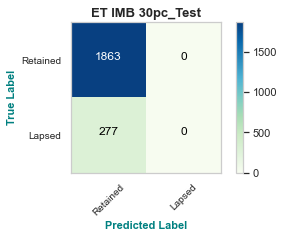

ET IMB 30pc_Test - Classification Report
              precision    recall  f1-score   support

         0.0       0.87      1.00      0.93      1863
         1.0       0.00      0.00      0.00       277

    accuracy                           0.87      2140
   macro avg       0.44      0.50      0.47      2140
weighted avg       0.76      0.87      0.81      2140



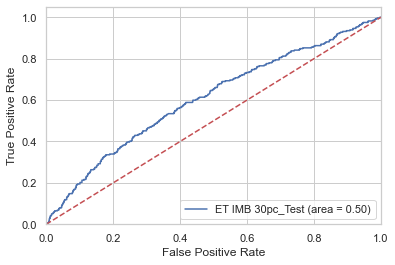

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


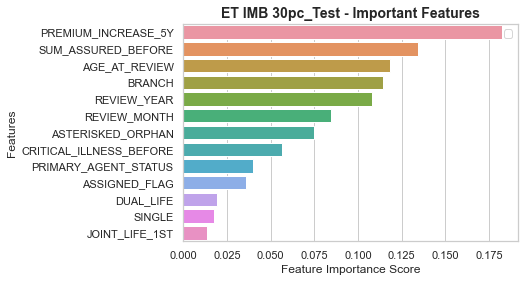

Best parameters ET IMB ('20pc_Test',): {'max_depth': 10, 'n_estimators': 10}
ET IMB_80pc_Train F1 Score : 12.71%
ET IMB_20pc_Test F1 Score : 0.00%


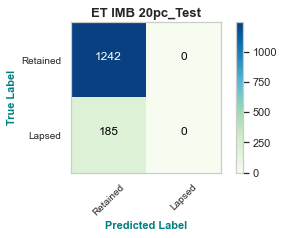

ET IMB 20pc_Test - Classification Report
              precision    recall  f1-score   support

         0.0       0.87      1.00      0.93      1242
         1.0       0.00      0.00      0.00       185

    accuracy                           0.87      1427
   macro avg       0.44      0.50      0.47      1427
weighted avg       0.76      0.87      0.81      1427



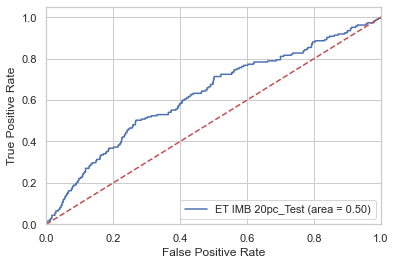

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


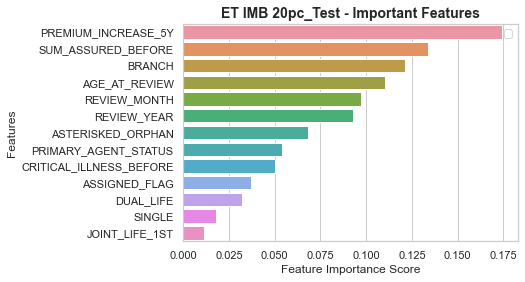

Best parameters ET IMB ('10pc_Test',): {'max_depth': 9, 'n_estimators': 10}
ET IMB_90pc_Train F1 Score : 6.53%
ET IMB_10pc_Test F1 Score : 0.00%


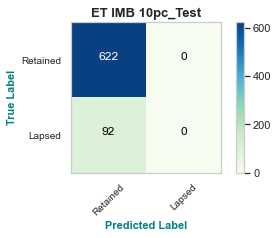

ET IMB 10pc_Test - Classification Report
              precision    recall  f1-score   support

         0.0       0.87      1.00      0.93       622
         1.0       0.00      0.00      0.00        92

    accuracy                           0.87       714
   macro avg       0.44      0.50      0.47       714
weighted avg       0.76      0.87      0.81       714



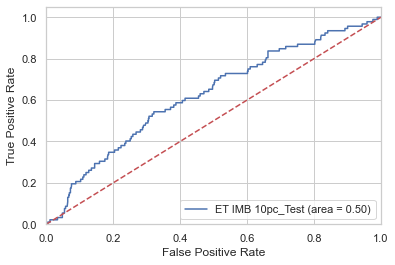

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


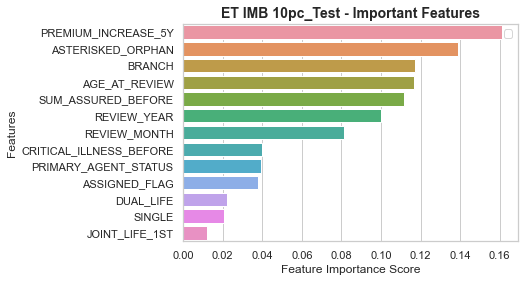

Best parameters ET CWB ('30pc_Test',): {'class_weight': 'balanced', 'max_depth': 4, 'n_estimators': 10}
ET CWB_70pc_Train F1 Score : 28.80%
ET CWB_30pc_Test F1 Score : 27.71%


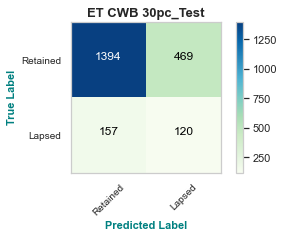

ET CWB 30pc_Test - Classification Report
              precision    recall  f1-score   support

         0.0       0.90      0.75      0.82      1863
         1.0       0.20      0.43      0.28       277

    accuracy                           0.71      2140
   macro avg       0.55      0.59      0.55      2140
weighted avg       0.81      0.71      0.75      2140



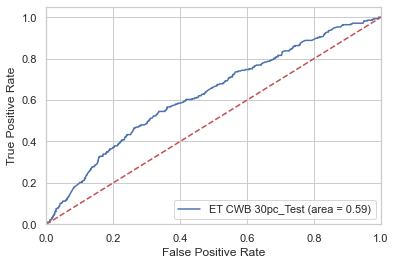

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


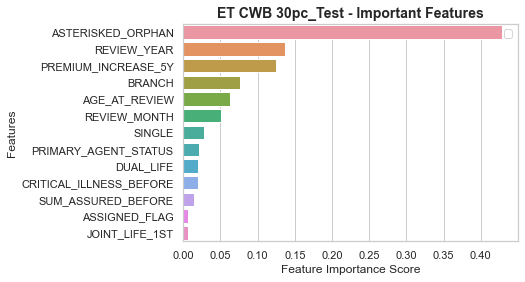

Best parameters ET CWB ('20pc_Test',): {'class_weight': 'balanced', 'max_depth': 7, 'n_estimators': 100}
ET CWB_80pc_Train F1 Score : 36.00%
ET CWB_20pc_Test F1 Score : 29.43%


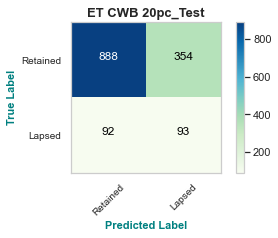

ET CWB 20pc_Test - Classification Report
              precision    recall  f1-score   support

         0.0       0.91      0.71      0.80      1242
         1.0       0.21      0.50      0.29       185

    accuracy                           0.69      1427
   macro avg       0.56      0.61      0.55      1427
weighted avg       0.82      0.69      0.73      1427



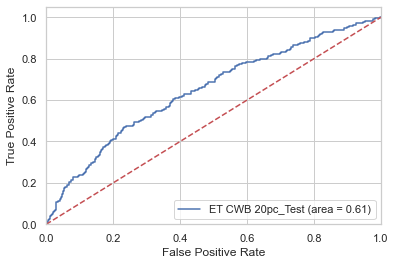

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


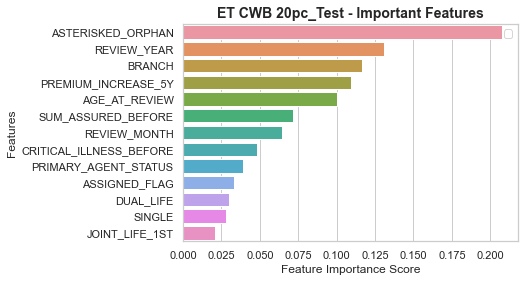

Best parameters ET CWB ('10pc_Test',): {'class_weight': 'balanced', 'max_depth': 6, 'n_estimators': 50}
ET CWB_90pc_Train F1 Score : 31.90%
ET CWB_10pc_Test F1 Score : 31.25%


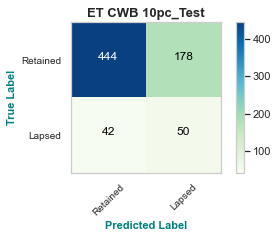

ET CWB 10pc_Test - Classification Report
              precision    recall  f1-score   support

         0.0       0.91      0.71      0.80       622
         1.0       0.22      0.54      0.31        92

    accuracy                           0.69       714
   macro avg       0.57      0.63      0.56       714
weighted avg       0.82      0.69      0.74       714



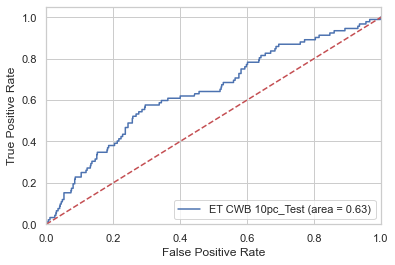

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


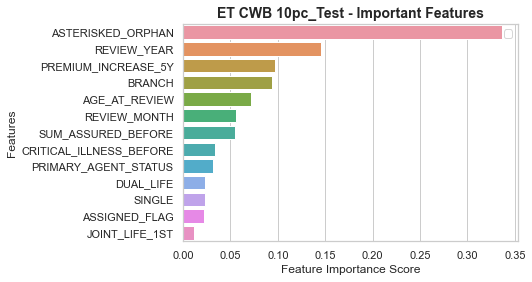

Best parameters ET ROS ('30pc_Test',): {'clf__max_depth': 6, 'clf__n_estimators': 100}
ET ROS_70pc_Train F1 Score : 33.39%
ET ROS_30pc_Test F1 Score : 26.36%


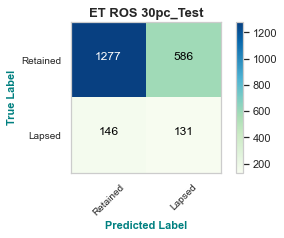

ET ROS 30pc_Test - Classification Report
              precision    recall  f1-score   support

         0.0       0.90      0.69      0.78      1863
         1.0       0.18      0.47      0.26       277

    accuracy                           0.66      2140
   macro avg       0.54      0.58      0.52      2140
weighted avg       0.80      0.66      0.71      2140



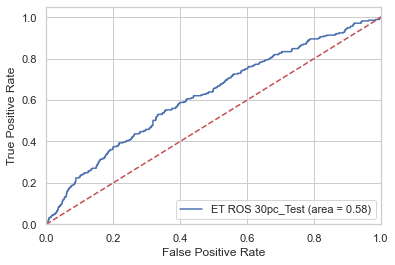

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


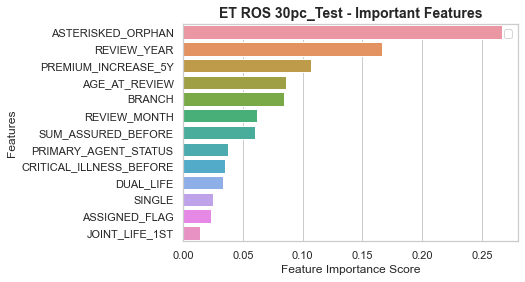

Best parameters ET ROS ('20pc_Test',): {'clf__max_depth': 4, 'clf__n_estimators': 50}
ET ROS_80pc_Train F1 Score : 27.67%
ET ROS_20pc_Test F1 Score : 30.50%


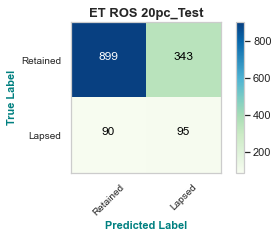

ET ROS 20pc_Test - Classification Report
              precision    recall  f1-score   support

         0.0       0.91      0.72      0.81      1242
         1.0       0.22      0.51      0.30       185

    accuracy                           0.70      1427
   macro avg       0.56      0.62      0.56      1427
weighted avg       0.82      0.70      0.74      1427



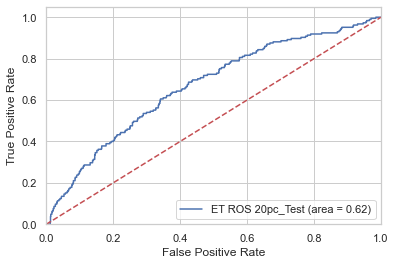

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


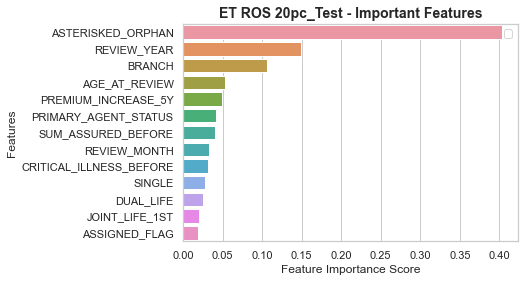

Best parameters ET ROS ('10pc_Test',): {'clf__max_depth': 7, 'clf__n_estimators': 50}
ET ROS_90pc_Train F1 Score : 34.35%
ET ROS_10pc_Test F1 Score : 27.63%


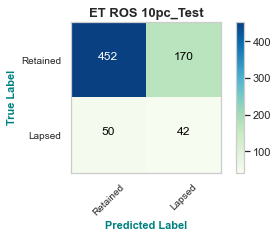

ET ROS 10pc_Test - Classification Report
              precision    recall  f1-score   support

         0.0       0.90      0.73      0.80       622
         1.0       0.20      0.46      0.28        92

    accuracy                           0.69       714
   macro avg       0.55      0.59      0.54       714
weighted avg       0.81      0.69      0.74       714



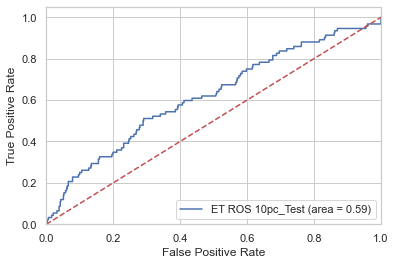

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


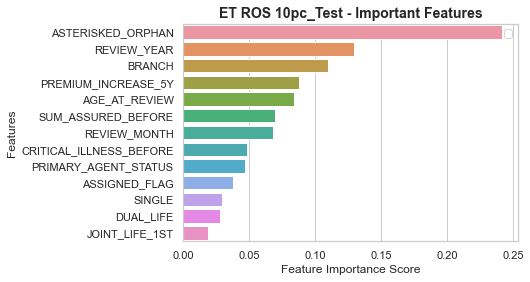

Best parameters ET ADASYN ('30pc_Test',): {'clf__max_depth': 3, 'clf__n_estimators': 10}
ET ADASYN_70pc_Train F1 Score : 24.15%
ET ADASYN_30pc_Test F1 Score : 24.00%


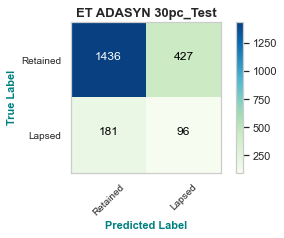

ET ADASYN 30pc_Test - Classification Report
              precision    recall  f1-score   support

         0.0       0.89      0.77      0.83      1863
         1.0       0.18      0.35      0.24       277

    accuracy                           0.72      2140
   macro avg       0.54      0.56      0.53      2140
weighted avg       0.80      0.72      0.75      2140



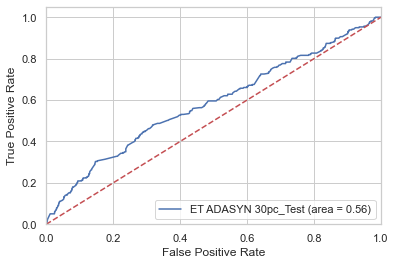

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


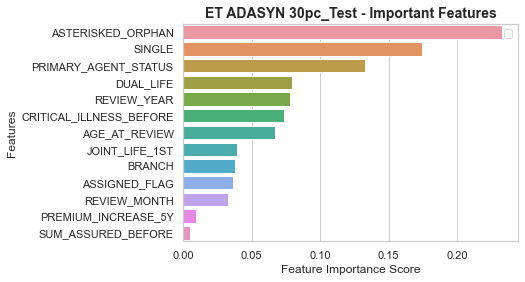

Best parameters ET ADASYN ('20pc_Test',): {'clf__max_depth': 1, 'clf__n_estimators': 100}
ET ADASYN_80pc_Train F1 Score : 23.30%
ET ADASYN_20pc_Test F1 Score : 28.40%


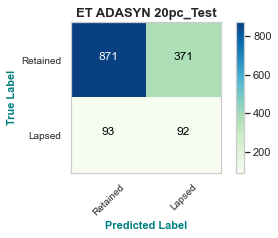

ET ADASYN 20pc_Test - Classification Report
              precision    recall  f1-score   support

         0.0       0.90      0.70      0.79      1242
         1.0       0.20      0.50      0.28       185

    accuracy                           0.67      1427
   macro avg       0.55      0.60      0.54      1427
weighted avg       0.81      0.67      0.72      1427



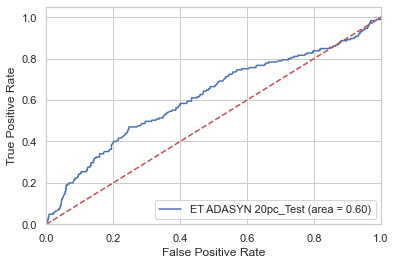

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


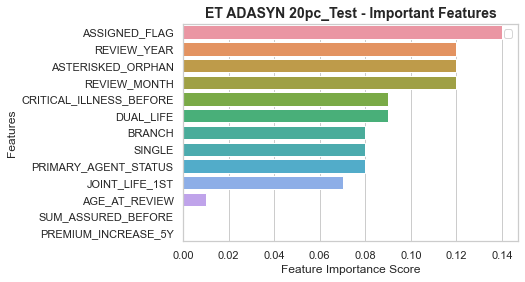

Best parameters ET ADASYN ('10pc_Test',): {'clf__max_depth': 4, 'clf__n_estimators': 10}
ET ADASYN_90pc_Train F1 Score : 24.15%
ET ADASYN_10pc_Test F1 Score : 25.12%


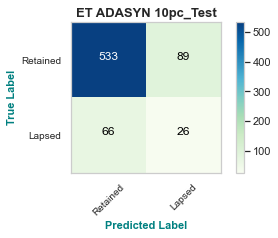

ET ADASYN 10pc_Test - Classification Report
              precision    recall  f1-score   support

         0.0       0.89      0.86      0.87       622
         1.0       0.23      0.28      0.25        92

    accuracy                           0.78       714
   macro avg       0.56      0.57      0.56       714
weighted avg       0.80      0.78      0.79       714



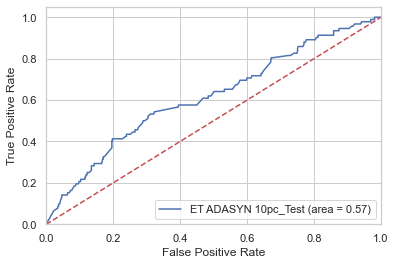

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


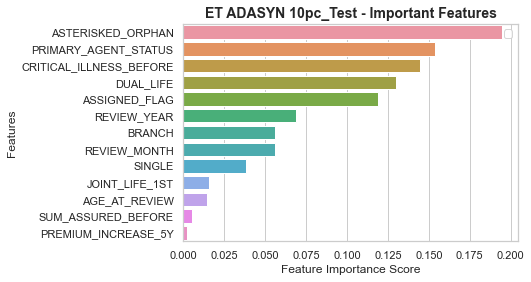

Best parameters ET SMOTE ('30pc_Test',): {'clf__max_depth': 2, 'clf__n_estimators': 10}
ET SMOTE_70pc_Train F1 Score : 22.75%
ET SMOTE_30pc_Test F1 Score : 22.25%


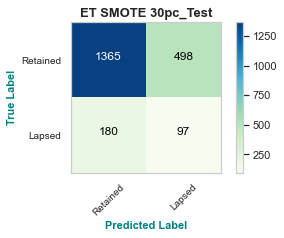

ET SMOTE 30pc_Test - Classification Report
              precision    recall  f1-score   support

         0.0       0.88      0.73      0.80      1863
         1.0       0.16      0.35      0.22       277

    accuracy                           0.68      2140
   macro avg       0.52      0.54      0.51      2140
weighted avg       0.79      0.68      0.73      2140



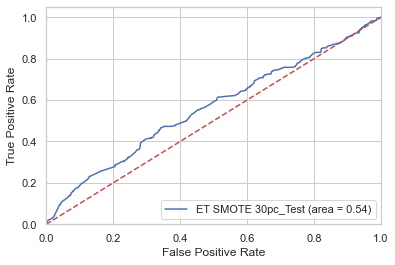

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


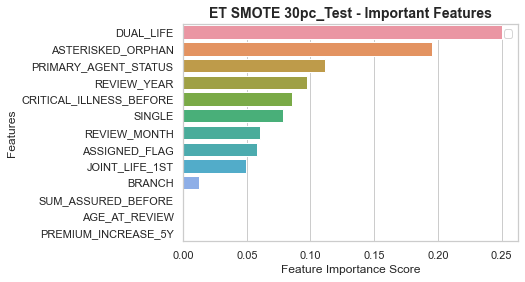

Best parameters ET SMOTE ('20pc_Test',): {'clf__max_depth': 1, 'clf__n_estimators': 50}
ET SMOTE_80pc_Train F1 Score : 22.40%
ET SMOTE_20pc_Test F1 Score : 30.25%


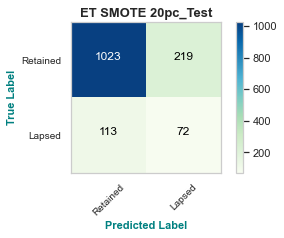

ET SMOTE 20pc_Test - Classification Report
              precision    recall  f1-score   support

         0.0       0.90      0.82      0.86      1242
         1.0       0.25      0.39      0.30       185

    accuracy                           0.77      1427
   macro avg       0.57      0.61      0.58      1427
weighted avg       0.82      0.77      0.79      1427



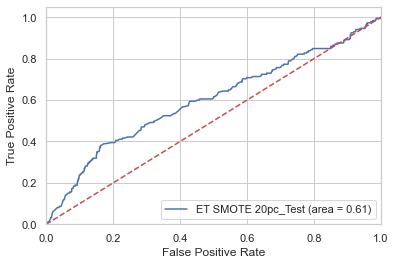

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


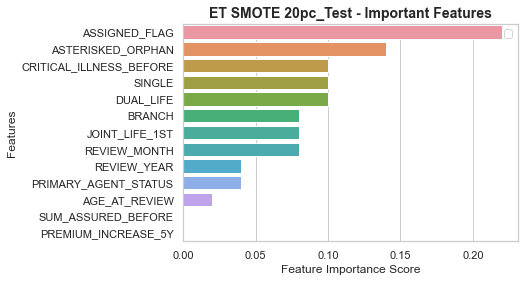

Best parameters ET SMOTE ('10pc_Test',): {'clf__max_depth': 1, 'clf__n_estimators': 100}
ET SMOTE_90pc_Train F1 Score : 23.17%
ET SMOTE_10pc_Test F1 Score : 30.84%


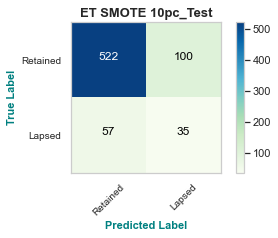

ET SMOTE 10pc_Test - Classification Report
              precision    recall  f1-score   support

         0.0       0.90      0.84      0.87       622
         1.0       0.26      0.38      0.31        92

    accuracy                           0.78       714
   macro avg       0.58      0.61      0.59       714
weighted avg       0.82      0.78      0.80       714



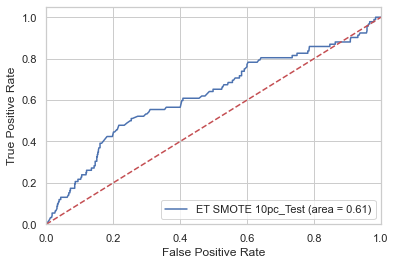

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


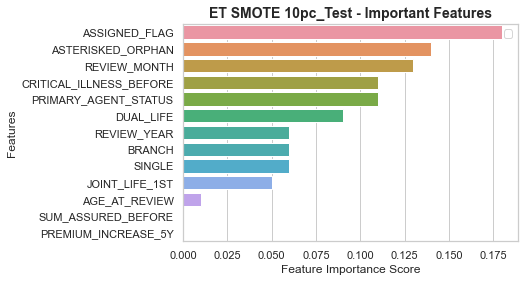

Best parameters ET BLSMOTE ('30pc_Test',): {'clf__max_depth': 3, 'clf__n_estimators': 10}
ET BLSMOTE_70pc_Train F1 Score : 23.96%
ET BLSMOTE_30pc_Test F1 Score : 24.69%


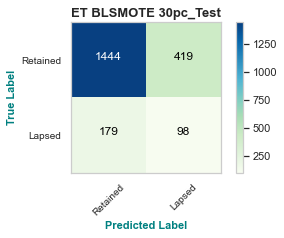

ET BLSMOTE 30pc_Test - Classification Report
              precision    recall  f1-score   support

         0.0       0.89      0.78      0.83      1863
         1.0       0.19      0.35      0.25       277

    accuracy                           0.72      2140
   macro avg       0.54      0.56      0.54      2140
weighted avg       0.80      0.72      0.75      2140



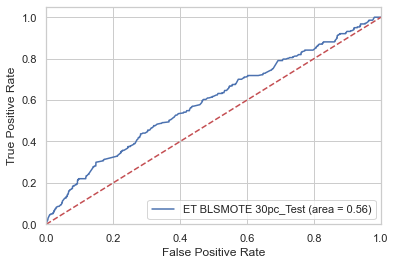

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


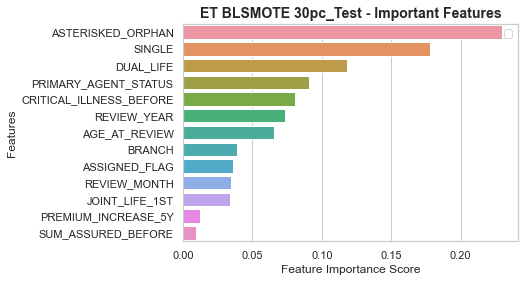

Best parameters ET BLSMOTE ('20pc_Test',): {'clf__max_depth': 2, 'clf__n_estimators': 10}
ET BLSMOTE_80pc_Train F1 Score : 21.77%
ET BLSMOTE_20pc_Test F1 Score : 24.58%


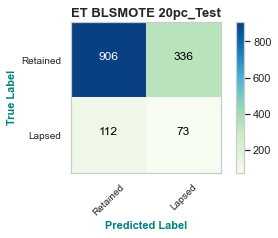

ET BLSMOTE 20pc_Test - Classification Report
              precision    recall  f1-score   support

         0.0       0.89      0.73      0.80      1242
         1.0       0.18      0.39      0.25       185

    accuracy                           0.69      1427
   macro avg       0.53      0.56      0.52      1427
weighted avg       0.80      0.69      0.73      1427



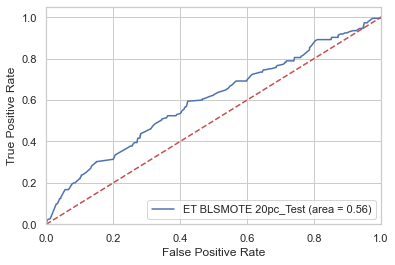

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


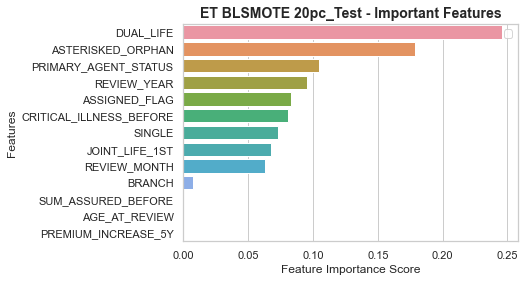

Best parameters ET BLSMOTE ('10pc_Test',): {'clf__max_depth': 1, 'clf__n_estimators': 50}
ET BLSMOTE_90pc_Train F1 Score : 23.33%
ET BLSMOTE_10pc_Test F1 Score : 30.84%


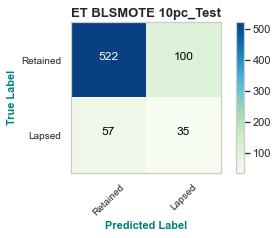

ET BLSMOTE 10pc_Test - Classification Report
              precision    recall  f1-score   support

         0.0       0.90      0.84      0.87       622
         1.0       0.26      0.38      0.31        92

    accuracy                           0.78       714
   macro avg       0.58      0.61      0.59       714
weighted avg       0.82      0.78      0.80       714



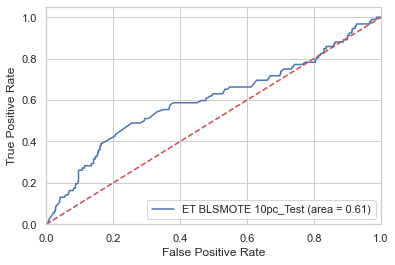

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


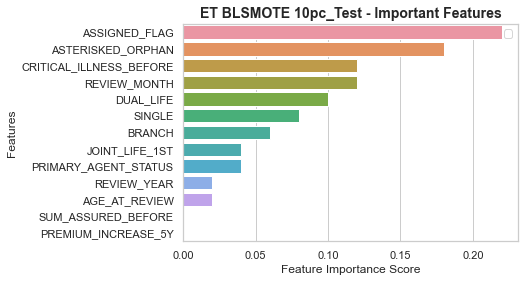

Best parameters ET SMOTETomek ('30pc_Test',): {'clf__max_depth': 1, 'clf__n_estimators': 100}
ET SMOTETomek_70pc_Train F1 Score : 22.59%
ET SMOTETomek_30pc_Test F1 Score : 25.49%


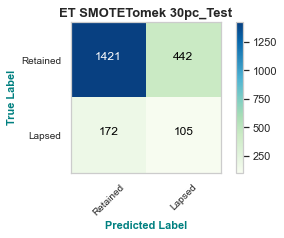

ET SMOTETomek 30pc_Test - Classification Report
              precision    recall  f1-score   support

         0.0       0.89      0.76      0.82      1863
         1.0       0.19      0.38      0.25       277

    accuracy                           0.71      2140
   macro avg       0.54      0.57      0.54      2140
weighted avg       0.80      0.71      0.75      2140



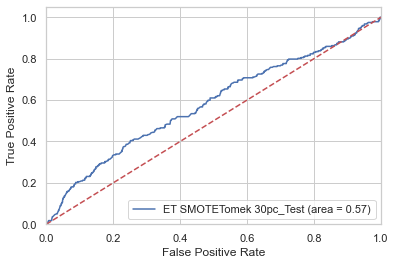

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


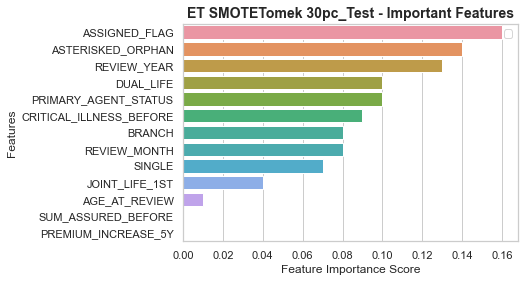

Best parameters ET SMOTETomek ('20pc_Test',): {'clf__max_depth': 2, 'clf__n_estimators': 10}
ET SMOTETomek_80pc_Train F1 Score : 22.00%
ET SMOTETomek_20pc_Test F1 Score : 24.63%


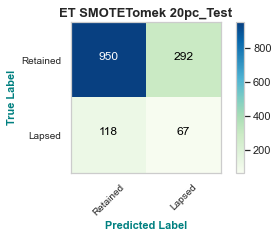

ET SMOTETomek 20pc_Test - Classification Report
              precision    recall  f1-score   support

         0.0       0.89      0.76      0.82      1242
         1.0       0.19      0.36      0.25       185

    accuracy                           0.71      1427
   macro avg       0.54      0.56      0.53      1427
weighted avg       0.80      0.71      0.75      1427



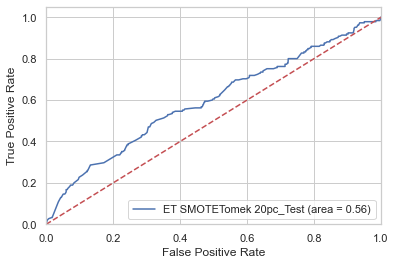

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


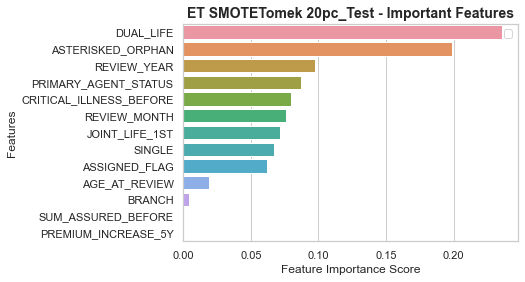

Best parameters ET SMOTETomek ('10pc_Test',): {'clf__max_depth': 1, 'clf__n_estimators': 50}
ET SMOTETomek_90pc_Train F1 Score : 23.20%
ET SMOTETomek_10pc_Test F1 Score : 31.30%


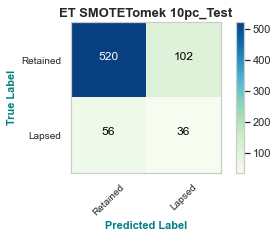

ET SMOTETomek 10pc_Test - Classification Report
              precision    recall  f1-score   support

         0.0       0.90      0.84      0.87       622
         1.0       0.26      0.39      0.31        92

    accuracy                           0.78       714
   macro avg       0.58      0.61      0.59       714
weighted avg       0.82      0.78      0.80       714



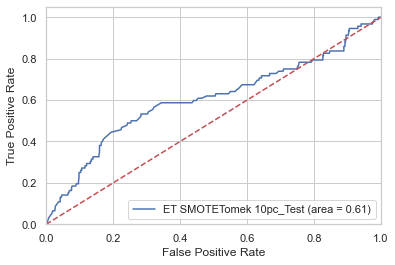

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


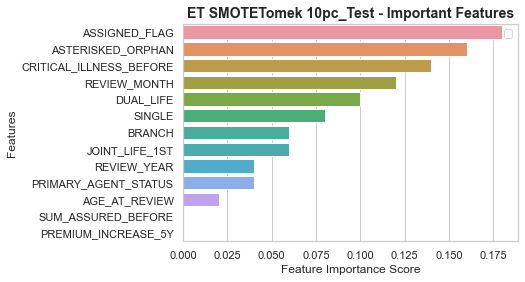

Best parameters ET SMOTEENN ('30pc_Test',): {'clf__max_depth': 1, 'clf__n_estimators': 100}
ET SMOTEENN_70pc_Train F1 Score : 24.16%
ET SMOTEENN_30pc_Test F1 Score : 23.26%


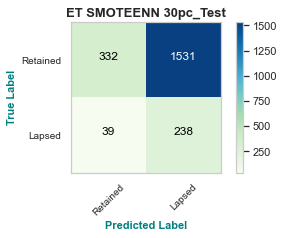

ET SMOTEENN 30pc_Test - Classification Report
              precision    recall  f1-score   support

         0.0       0.89      0.18      0.30      1863
         1.0       0.13      0.86      0.23       277

    accuracy                           0.27      2140
   macro avg       0.51      0.52      0.26      2140
weighted avg       0.80      0.27      0.29      2140



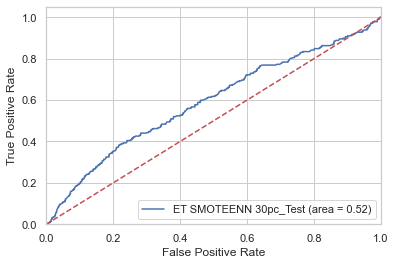

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


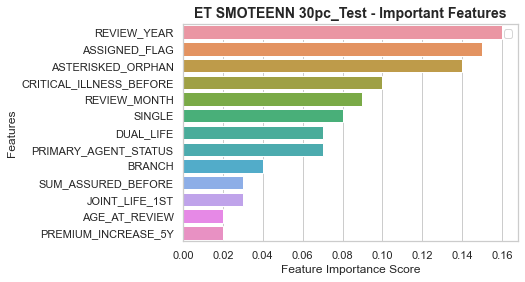

Best parameters ET SMOTEENN ('20pc_Test',): {'clf__max_depth': 1, 'clf__n_estimators': 100}
ET SMOTEENN_80pc_Train F1 Score : 24.09%
ET SMOTEENN_20pc_Test F1 Score : 25.46%


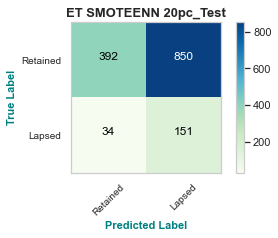

ET SMOTEENN 20pc_Test - Classification Report
              precision    recall  f1-score   support

         0.0       0.92      0.32      0.47      1242
         1.0       0.15      0.82      0.25       185

    accuracy                           0.38      1427
   macro avg       0.54      0.57      0.36      1427
weighted avg       0.82      0.38      0.44      1427



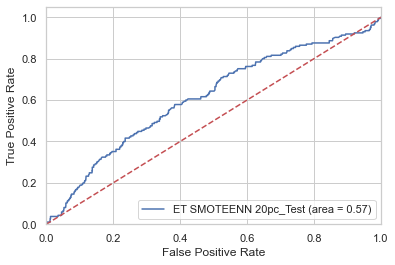

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


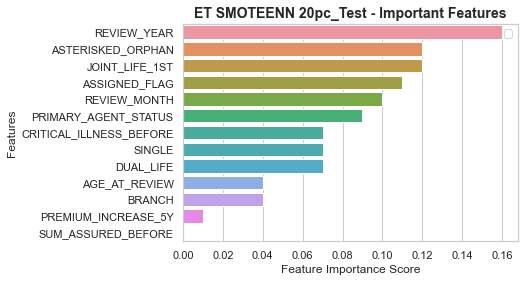

Best parameters ET SMOTEENN ('10pc_Test',): {'clf__max_depth': 3, 'clf__n_estimators': 10}
ET SMOTEENN_90pc_Train F1 Score : 25.79%
ET SMOTEENN_10pc_Test F1 Score : 28.24%


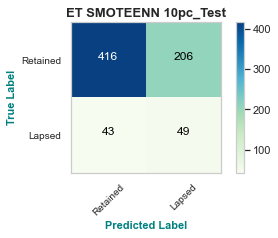

ET SMOTEENN 10pc_Test - Classification Report
              precision    recall  f1-score   support

         0.0       0.91      0.67      0.77       622
         1.0       0.19      0.53      0.28        92

    accuracy                           0.65       714
   macro avg       0.55      0.60      0.53       714
weighted avg       0.81      0.65      0.71       714



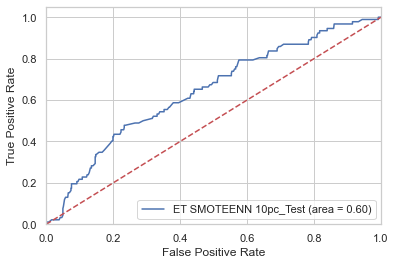

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


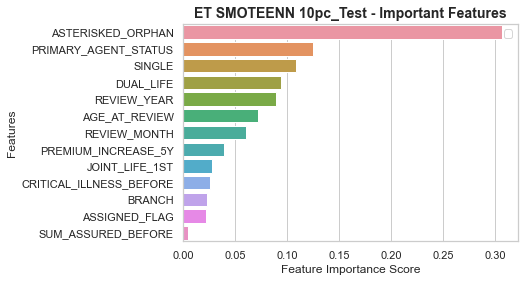

Best parameters ET RUS ('30pc_Test',): {'clf__max_depth': 7, 'clf__n_estimators': 10}
ET RUS_70pc_Train F1 Score : 32.61%
ET RUS_30pc_Test F1 Score : 26.38%


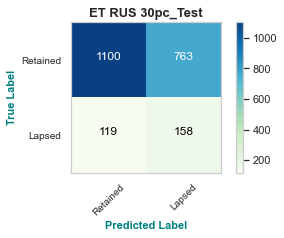

ET RUS 30pc_Test - Classification Report
              precision    recall  f1-score   support

         0.0       0.90      0.59      0.71      1863
         1.0       0.17      0.57      0.26       277

    accuracy                           0.59      2140
   macro avg       0.54      0.58      0.49      2140
weighted avg       0.81      0.59      0.66      2140



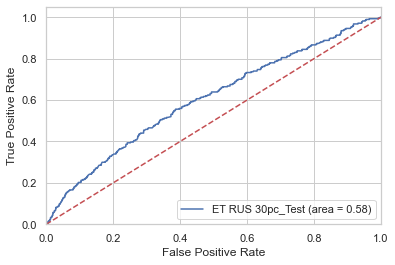

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


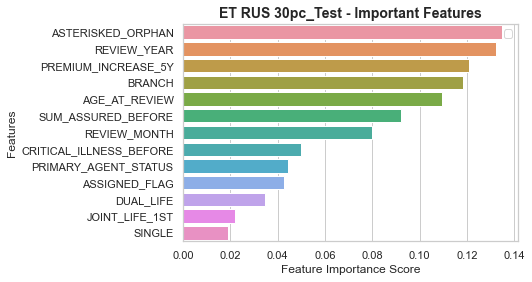

Best parameters ET RUS ('20pc_Test',): {'clf__max_depth': 8, 'clf__n_estimators': 10}
ET RUS_80pc_Train F1 Score : 31.94%
ET RUS_20pc_Test F1 Score : 29.26%


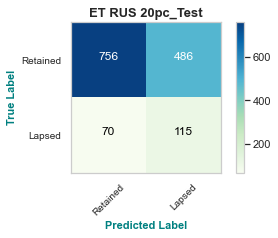

ET RUS 20pc_Test - Classification Report
              precision    recall  f1-score   support

         0.0       0.92      0.61      0.73      1242
         1.0       0.19      0.62      0.29       185

    accuracy                           0.61      1427
   macro avg       0.55      0.62      0.51      1427
weighted avg       0.82      0.61      0.67      1427



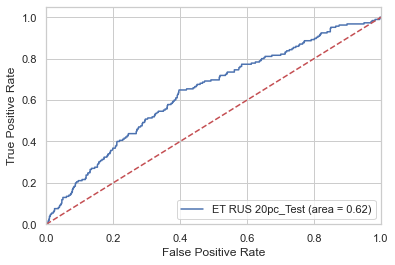

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


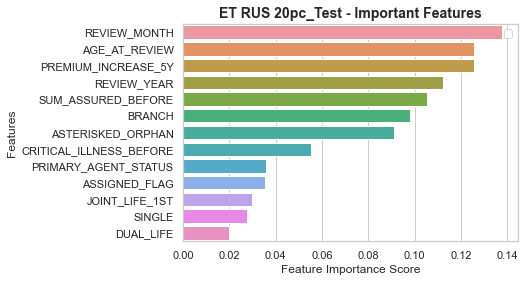

Best parameters ET RUS ('10pc_Test',): {'clf__max_depth': 8, 'clf__n_estimators': 50}
ET RUS_90pc_Train F1 Score : 33.52%
ET RUS_10pc_Test F1 Score : 27.84%


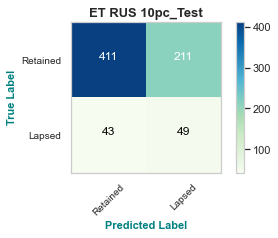

ET RUS 10pc_Test - Classification Report
              precision    recall  f1-score   support

         0.0       0.91      0.66      0.76       622
         1.0       0.19      0.53      0.28        92

    accuracy                           0.64       714
   macro avg       0.55      0.60      0.52       714
weighted avg       0.81      0.64      0.70       714



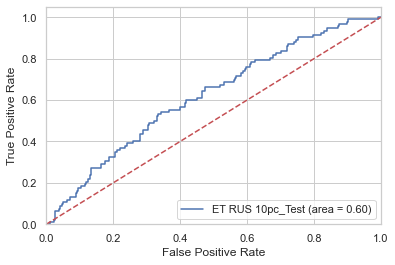

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


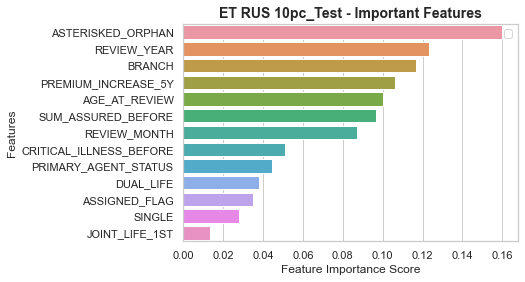

Best parameters ET NM1 ('30pc_Test',): {'clf__max_depth': 1, 'clf__n_estimators': 50}
ET NM1_70pc_Train F1 Score : 25.21%
ET NM1_30pc_Test F1 Score : 27.48%


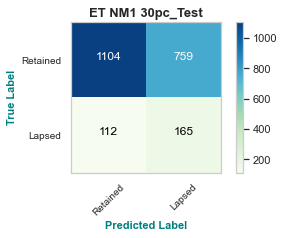

ET NM1 30pc_Test - Classification Report
              precision    recall  f1-score   support

         0.0       0.91      0.59      0.72      1863
         1.0       0.18      0.60      0.27       277

    accuracy                           0.59      2140
   macro avg       0.54      0.59      0.50      2140
weighted avg       0.81      0.59      0.66      2140



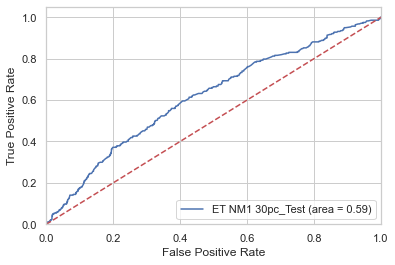

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


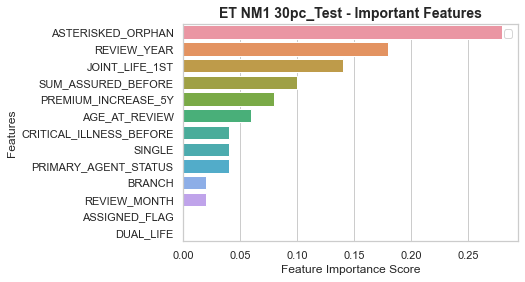

Best parameters ET NM1 ('20pc_Test',): {'clf__max_depth': 10, 'clf__n_estimators': 100}
ET NM1_80pc_Train F1 Score : 30.77%
ET NM1_20pc_Test F1 Score : 27.32%


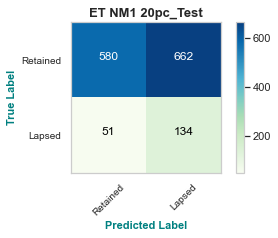

ET NM1 20pc_Test - Classification Report
              precision    recall  f1-score   support

         0.0       0.92      0.47      0.62      1242
         1.0       0.17      0.72      0.27       185

    accuracy                           0.50      1427
   macro avg       0.54      0.60      0.45      1427
weighted avg       0.82      0.50      0.57      1427



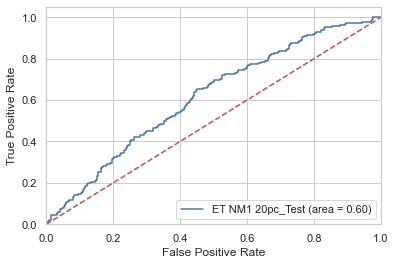

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


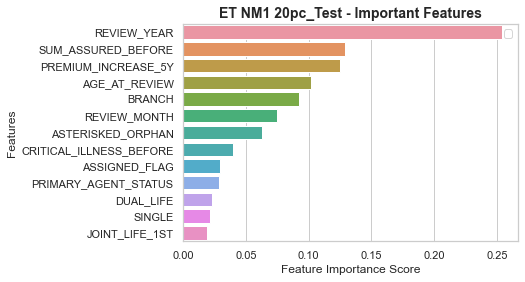

Best parameters ET NM1 ('10pc_Test',): {'clf__max_depth': 1, 'clf__n_estimators': 50}
ET NM1_90pc_Train F1 Score : 25.21%
ET NM1_10pc_Test F1 Score : 30.05%


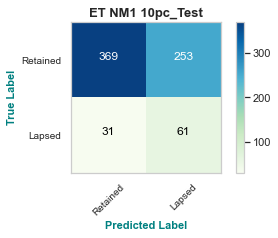

ET NM1 10pc_Test - Classification Report
              precision    recall  f1-score   support

         0.0       0.92      0.59      0.72       622
         1.0       0.19      0.66      0.30        92

    accuracy                           0.60       714
   macro avg       0.56      0.63      0.51       714
weighted avg       0.83      0.60      0.67       714



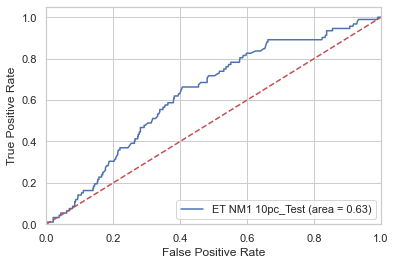

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


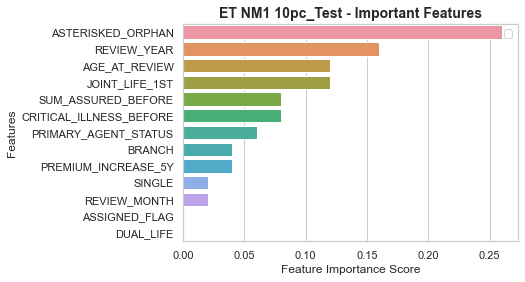

Best parameters ET NM2 ('30pc_Test',): {'clf__max_depth': 5, 'clf__n_estimators': 10}
ET NM2_70pc_Train F1 Score : 23.47%
ET NM2_30pc_Test F1 Score : 22.36%


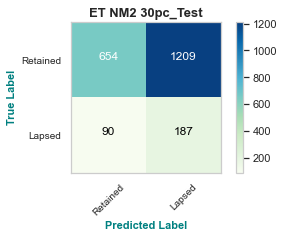

ET NM2 30pc_Test - Classification Report
              precision    recall  f1-score   support

         0.0       0.88      0.35      0.50      1863
         1.0       0.13      0.68      0.22       277

    accuracy                           0.39      2140
   macro avg       0.51      0.51      0.36      2140
weighted avg       0.78      0.39      0.47      2140



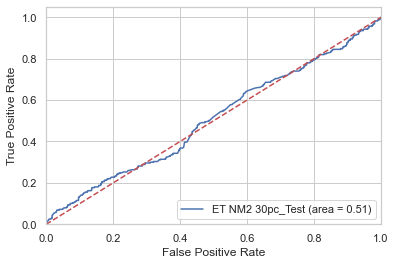

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


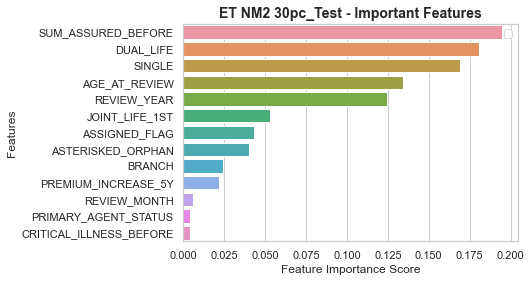

Best parameters ET NM2 ('20pc_Test',): {'clf__max_depth': 8, 'clf__n_estimators': 10}
ET NM2_80pc_Train F1 Score : 23.83%
ET NM2_20pc_Test F1 Score : 22.36%


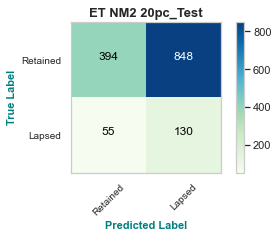

ET NM2 20pc_Test - Classification Report
              precision    recall  f1-score   support

         0.0       0.88      0.32      0.47      1242
         1.0       0.13      0.70      0.22       185

    accuracy                           0.37      1427
   macro avg       0.51      0.51      0.34      1427
weighted avg       0.78      0.37      0.43      1427



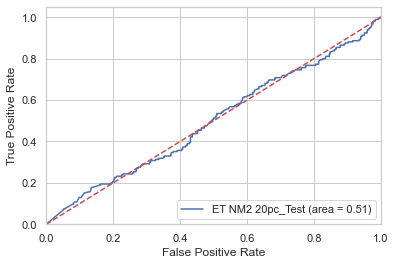

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


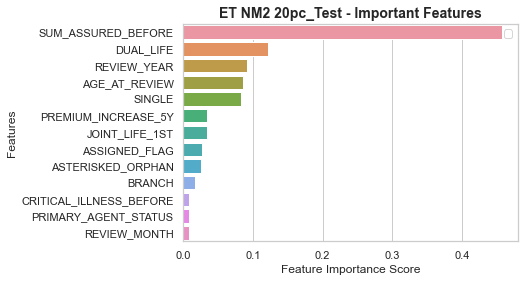

Best parameters ET NM2 ('10pc_Test',): {'clf__max_depth': 4, 'clf__n_estimators': 50}
ET NM2_90pc_Train F1 Score : 22.50%
ET NM2_10pc_Test F1 Score : 22.46%


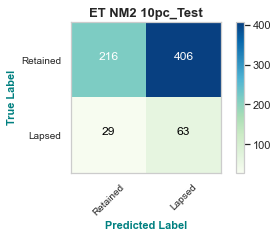

ET NM2 10pc_Test - Classification Report
              precision    recall  f1-score   support

         0.0       0.88      0.35      0.50       622
         1.0       0.13      0.68      0.22        92

    accuracy                           0.39       714
   macro avg       0.51      0.52      0.36       714
weighted avg       0.79      0.39      0.46       714



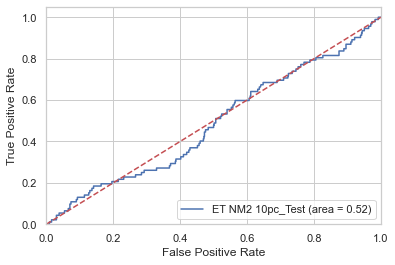

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


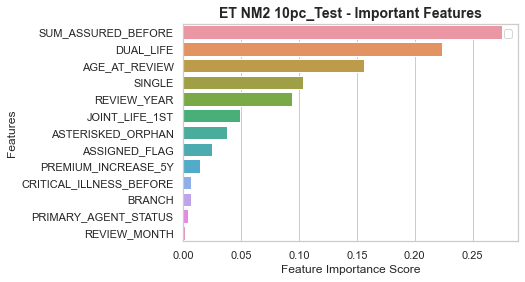

Best parameters ET NM3 ('30pc_Test',): {'clf__max_depth': 6, 'clf__n_estimators': 10}
ET NM3_70pc_Train F1 Score : 26.66%
ET NM3_30pc_Test F1 Score : 22.31%


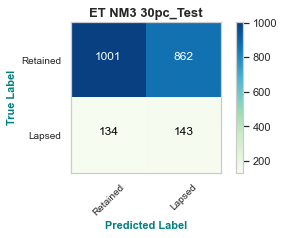

ET NM3 30pc_Test - Classification Report
              precision    recall  f1-score   support

         0.0       0.88      0.54      0.67      1863
         1.0       0.14      0.52      0.22       277

    accuracy                           0.53      2140
   macro avg       0.51      0.53      0.45      2140
weighted avg       0.79      0.53      0.61      2140



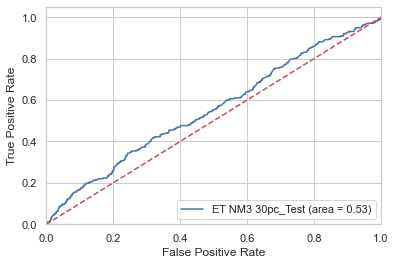

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


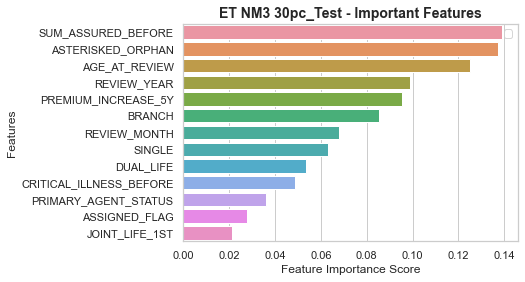

Best parameters ET NM3 ('20pc_Test',): {'clf__max_depth': 3, 'clf__n_estimators': 10}
ET NM3_80pc_Train F1 Score : 23.88%
ET NM3_20pc_Test F1 Score : 25.52%


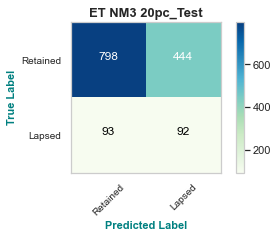

ET NM3 20pc_Test - Classification Report
              precision    recall  f1-score   support

         0.0       0.90      0.64      0.75      1242
         1.0       0.17      0.50      0.26       185

    accuracy                           0.62      1427
   macro avg       0.53      0.57      0.50      1427
weighted avg       0.80      0.62      0.68      1427



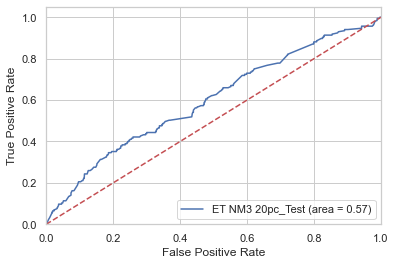

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


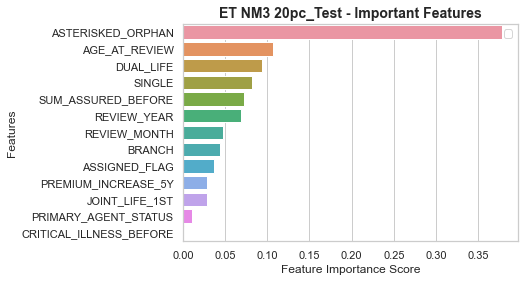

Best parameters ET NM3 ('10pc_Test',): {'clf__max_depth': 8, 'clf__n_estimators': 100}
ET NM3_90pc_Train F1 Score : 30.29%
ET NM3_10pc_Test F1 Score : 24.94%


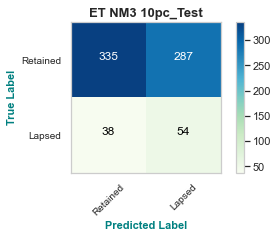

ET NM3 10pc_Test - Classification Report
              precision    recall  f1-score   support

         0.0       0.90      0.54      0.67       622
         1.0       0.16      0.59      0.25        92

    accuracy                           0.54       714
   macro avg       0.53      0.56      0.46       714
weighted avg       0.80      0.54      0.62       714



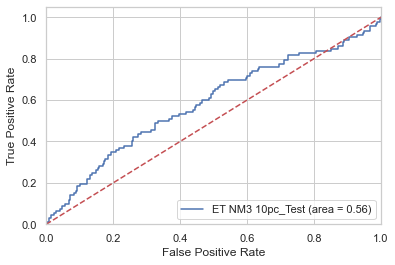

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


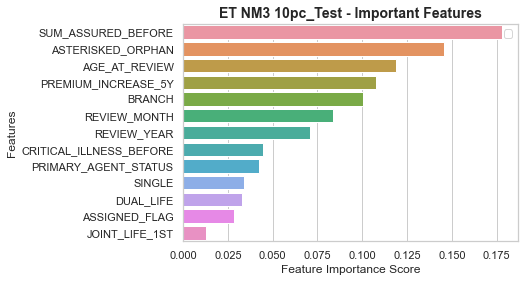

In [33]:
model_name = "ET"
clf = ExtraTreesClassifier(random_state = 42)

for train_name, test_name, X_train, y_train, X_test,y_test in zip(train_names,test_names, X_training_splits, y_training_splits, X_testing_splits, y_testing_splits):
    
    model = clf
    method = "IMB"
    param_grid = {'n_estimators': [10, 50, 100],'max_depth': range(1, 11)}
    stratified_kfold = StratifiedKFold(n_splits=5,shuffle=True,random_state=11)
    gs = GridSearchCV(estimator=model,
                      param_grid=param_grid,
                      scoring='f1',
                      cv=stratified_kfold,
                      n_jobs=-1)
    gs.fit(X_train,y_train)

    # Print the best parameters and best score obtained during the grid search
    print(f'Best parameters {model_name} {method} {test_name,}:', gs.best_params_)
    
    best_model = gs.best_estimator_
    # Call fit() method to train the model
    best_model.fit(X_train,y_train)
    # Predict the results
    y_train_predict = best_model.predict(X_train)
    y_predict = best_model.predict(X_test)
    
    exec(f'{model_name}_roc_auc_{method}_{train_name} =  roc_auc_score(y_train,y_train_predict)')
    exec(f'{model_name}_a_{method}_{train_name} = metrics.accuracy_score(y_train,y_train_predict)') 
    exec(f'{model_name}_p_{method}_{train_name} = metrics.precision_score(y_train,y_train_predict)') 
    exec(f'{model_name}_r_{method}_{train_name}  = metrics.recall_score(y_train,y_train_predict)') 
    exec(f'{model_name}_f1_{method}_{train_name} = metrics.f1_score(y_train,y_train_predict)')
    print(f'{model_name} {method}_{train_name} F1 Score : %.2f%%' % (metrics.f1_score(y_train, y_train_predict) * 100.0))

    # Call fit() method to train the model
    # Predict the results
    
    
    exec(f'{model_name}_roc_auc_{method}_{test_name} =  roc_auc_score(y_test,y_predict)')
    exec(f'{model_name}_a_{method}_{test_name} = metrics.accuracy_score(y_test, y_predict)') 
    exec(f'{model_name}_p_{method}_{test_name} = metrics.precision_score(y_test, y_predict)') 
    exec(f'{model_name}_r_{method}_{test_name}  = metrics.recall_score(y_test, y_predict)') 
    exec(f'{model_name}_f1_{method}_{test_name} = metrics.f1_score(y_test, y_predict)')
    print(f'{model_name} {method}_{test_name} F1 Score : %.2f%%' % (metrics.f1_score(y_test, y_predict) * 100.0))
 

 
     # Compute confusion matrix
    cnf_matrix = confusion_matrix(y_test, y_predict)
    # Plot non-normalized confusion matrix
    plt.figure(figsize = (5, 3.5))
    plot_confusion_matrix(cnf_matrix, classes = class_names)
    plt.title(f'{model_name} {method} {test_name}',fontsize = 13, fontweight = "bold")
    plt.show()

    # print the classification_report based on y_test and y_predict) 
    print(f'{model_name} {method} {test_name} - Classification Report')
    print(classification_report(y_test, y_predict))

    roc_auc_curve(y_test,best_model,method,test_name,X_test)
    feature_importance(best_model,model_name, method, test_name)
        
for train_name, test_name, X_train, y_train, X_test,y_test in zip(train_names,test_names, X_training_splits, y_training_splits, X_testing_splits, y_testing_splits):
    
    model = clf 
    method = "CWB"
    param_grid = {'n_estimators': [10, 50, 100],'max_depth': range(1, 11),'class_weight':['balanced']}    
    stratified_kfold = StratifiedKFold(n_splits=5,shuffle=True,random_state=11)
    gs = GridSearchCV(estimator=model,
                      param_grid=param_grid,
                      scoring='f1',
                      cv=stratified_kfold,
                      n_jobs=-1)
    gs.fit(X_train,y_train)

    # Print the best parameters and best score obtained during the grid search
    print(f'Best parameters {model_name} {method} {test_name,}:', gs.best_params_)
    
    best_model = gs.best_estimator_
    # Call fit() method to train the model
    best_model.fit(X_train,y_train)
    # Predict the results
    y_train_predict = best_model.predict(X_train)
    y_predict = best_model.predict(X_test)
    
    exec(f'{model_name}_roc_auc_{method}_{train_name} =  roc_auc_score(y_train,y_train_predict)')
    exec(f'{model_name}_a_{method}_{train_name} = metrics.accuracy_score(y_train,y_train_predict)') 
    exec(f'{model_name}_p_{method}_{train_name} = metrics.precision_score(y_train,y_train_predict)') 
    exec(f'{model_name}_r_{method}_{train_name}  = metrics.recall_score(y_train,y_train_predict)') 
    exec(f'{model_name}_f1_{method}_{train_name} = metrics.f1_score(y_train,y_train_predict)')
    print(f'{model_name} {method}_{train_name} F1 Score : %.2f%%' % (metrics.f1_score(y_train, y_train_predict) * 100.0))

    # Call fit() method to train the model
    # Predict the results
    
    
    exec(f'{model_name}_roc_auc_{method}_{test_name} =  roc_auc_score(y_test,y_predict)')
    exec(f'{model_name}_a_{method}_{test_name} = metrics.accuracy_score(y_test, y_predict)') 
    exec(f'{model_name}_p_{method}_{test_name} = metrics.precision_score(y_test, y_predict)') 
    exec(f'{model_name}_r_{method}_{test_name}  = metrics.recall_score(y_test, y_predict)') 
    exec(f'{model_name}_f1_{method}_{test_name} = metrics.f1_score(y_test, y_predict)')
    print(f'{model_name} {method}_{test_name} F1 Score : %.2f%%' % (metrics.f1_score(y_test, y_predict) * 100.0))
 

 
     # Compute confusion matrix
    cnf_matrix = confusion_matrix(y_test, y_predict)
    # Plot non-normalized confusion matrix
    plt.figure(figsize = (5, 3.5))
    plot_confusion_matrix(cnf_matrix, classes = class_names)
    plt.title(f'{model_name} {method} {test_name}',fontsize = 13, fontweight = "bold")
    plt.show()

    # print the classification_report based on y_test and y_predict) 
    print(f'{model_name} {method} {test_name} - Classification Report')
    print(classification_report(y_test, y_predict))

    roc_auc_curve(y_test,best_model,method,test_name,X_test)
    feature_importance(best_model,model_name, method, test_name)

for method,resampler in zip(resampler_names,resamplers):
    for train_name, test_name, X_train, y_train, X_test,y_test in zip(train_names,test_names, X_training_splits, y_training_splits, X_testing_splits, y_testing_splits):
        
        model = Pipeline([('resampler', resampler),
                     ('mms', MinMaxScaler()),
                     ('clf',clf)])
        
        param_grid = {'clf__n_estimators': [10, 50, 100],'clf__max_depth': range(1, 11)}

        stratified_kfold = StratifiedKFold(n_splits=5,shuffle=True,random_state=11)
        gs = GridSearchCV(estimator=model,
                          param_grid=param_grid,
                          scoring='f1',
                          cv=stratified_kfold,
                          n_jobs=-1)
        gs.fit(X_train,y_train)

        # Print the best parameters and best score obtained during the grid search
        print(f'Best parameters {model_name} {method} {test_name,}:', gs.best_params_)

        best_model = gs.best_estimator_
        # Call fit() method to train the model
        best_model.fit(X_train,y_train)
        # Predict the results
        y_train_predict = best_model.predict(X_train)
        y_predict = best_model.predict(X_test)

        exec(f'{model_name}_roc_auc_{method}_{train_name} =  roc_auc_score(y_train,y_train_predict)')
        exec(f'{model_name}_a_{method}_{train_name} = metrics.accuracy_score(y_train,y_train_predict)') 
        exec(f'{model_name}_p_{method}_{train_name} = metrics.precision_score(y_train,y_train_predict)') 
        exec(f'{model_name}_r_{method}_{train_name}  = metrics.recall_score(y_train,y_train_predict)') 
        exec(f'{model_name}_f1_{method}_{train_name} = metrics.f1_score(y_train,y_train_predict)')
        print(f'{model_name} {method}_{train_name} F1 Score : %.2f%%' % (metrics.f1_score(y_train, y_train_predict) * 100.0))

        # Call fit() method to train the model
        # Predict the results


        exec(f'{model_name}_roc_auc_{method}_{test_name} =  roc_auc_score(y_test,y_predict)')
        exec(f'{model_name}_a_{method}_{test_name} = metrics.accuracy_score(y_test, y_predict)') 
        exec(f'{model_name}_p_{method}_{test_name} = metrics.precision_score(y_test, y_predict)') 
        exec(f'{model_name}_r_{method}_{test_name}  = metrics.recall_score(y_test, y_predict)') 
        exec(f'{model_name}_f1_{method}_{test_name} = metrics.f1_score(y_test, y_predict)')
        print(f'{model_name} {method}_{test_name} F1 Score : %.2f%%' % (metrics.f1_score(y_test, y_predict) * 100.0))



         # Compute confusion matrix
        cnf_matrix = confusion_matrix(y_test, y_predict)
        # Plot non-normalized confusion matrix
        plt.figure(figsize = (5, 3.5))
        plot_confusion_matrix(cnf_matrix, classes = class_names)
        plt.title(f'{model_name} {method} {test_name}',fontsize = 13, fontweight = "bold")
        plt.show()

        # print the classification_report based on y_test and y_predict) 
        print(f'{model_name} {method} {test_name} - Classification Report')
        print(classification_report(y_test, y_predict))

        roc_auc_curve(y_test,best_model,method,test_name,X_test)
        feature_importance_pipe(best_model,model_name, method, test_name)


## Extreme Gradient Boosting Model

Best parameters XGB IMB ('30pc_Test',): {'learning_rate': 1, 'max_depth': 4, 'n_estimators': 100}
XGB IMB_70pc_Train F1 Score : 85.56%
XGB IMB_30pc_Test F1 Score : 13.33%


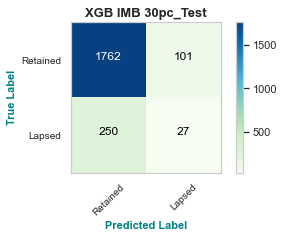

XGB IMB 30pc_Test - Classification Report
              precision    recall  f1-score   support

         0.0       0.88      0.95      0.91      1863
         1.0       0.21      0.10      0.13       277

    accuracy                           0.84      2140
   macro avg       0.54      0.52      0.52      2140
weighted avg       0.79      0.84      0.81      2140



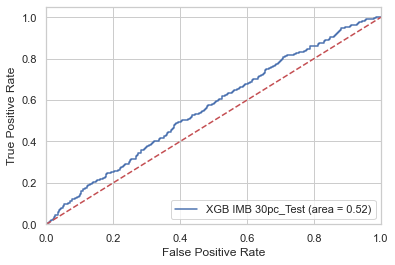

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


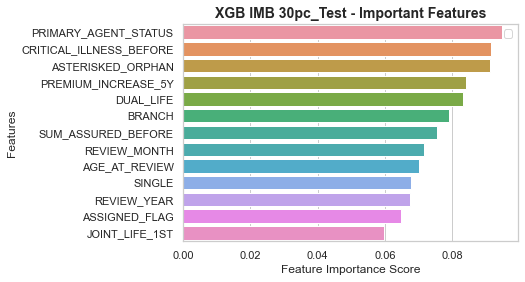

Best parameters XGB IMB ('20pc_Test',): {'learning_rate': 1, 'max_depth': 4, 'n_estimators': 100}
XGB IMB_80pc_Train F1 Score : 83.53%
XGB IMB_20pc_Test F1 Score : 12.95%


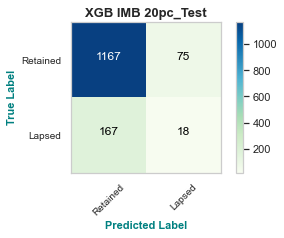

XGB IMB 20pc_Test - Classification Report
              precision    recall  f1-score   support

         0.0       0.87      0.94      0.91      1242
         1.0       0.19      0.10      0.13       185

    accuracy                           0.83      1427
   macro avg       0.53      0.52      0.52      1427
weighted avg       0.79      0.83      0.81      1427



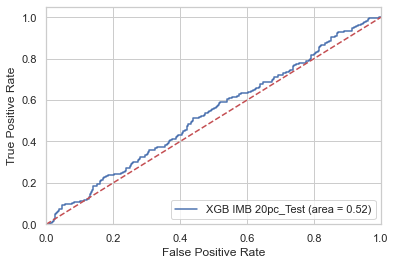

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


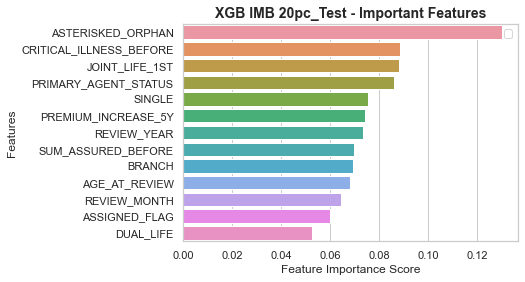

Best parameters XGB IMB ('10pc_Test',): {'learning_rate': 1, 'max_depth': 4, 'n_estimators': 50}
XGB IMB_90pc_Train F1 Score : 52.65%
XGB IMB_10pc_Test F1 Score : 6.72%


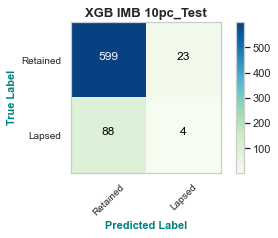

XGB IMB 10pc_Test - Classification Report
              precision    recall  f1-score   support

         0.0       0.87      0.96      0.92       622
         1.0       0.15      0.04      0.07        92

    accuracy                           0.84       714
   macro avg       0.51      0.50      0.49       714
weighted avg       0.78      0.84      0.81       714



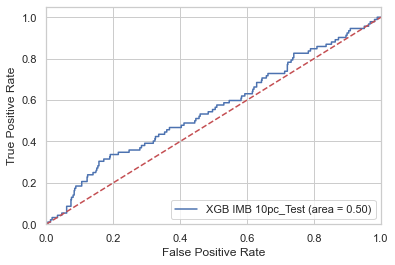

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


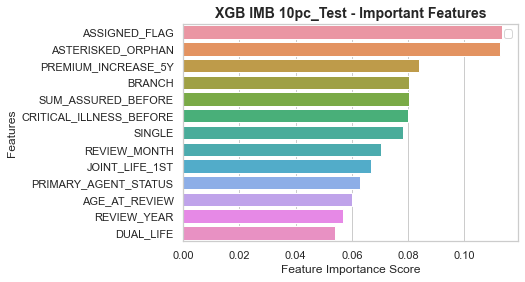

[14:41:03] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.6.0/src/learner.cc:627: 
Parameters: { "class_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


Best parameters XGB CWB ('30pc_Test',): {'class_weight': 'balanced', 'learning_rate': 1, 'max_depth': 4, 'n_estimators': 100}
[14:41:04] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.6.0/src/learner.cc:627: 
Parameters: { "class_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


XGB CWB_70pc_Train F1 Score : 85

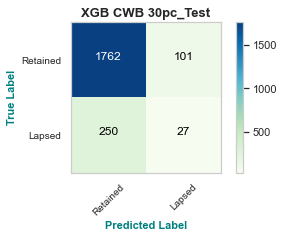

XGB CWB 30pc_Test - Classification Report
              precision    recall  f1-score   support

         0.0       0.88      0.95      0.91      1863
         1.0       0.21      0.10      0.13       277

    accuracy                           0.84      2140
   macro avg       0.54      0.52      0.52      2140
weighted avg       0.79      0.84      0.81      2140



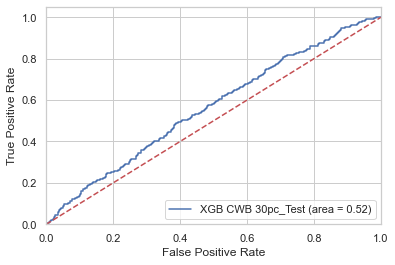

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


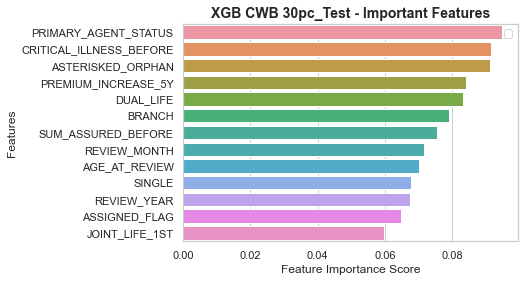

[14:41:13] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.6.0/src/learner.cc:627: 
Parameters: { "class_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


Best parameters XGB CWB ('20pc_Test',): {'class_weight': 'balanced', 'learning_rate': 1, 'max_depth': 4, 'n_estimators': 100}
[14:41:13] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.6.0/src/learner.cc:627: 
Parameters: { "class_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


XGB CWB_80pc_Train F1 Score : 83

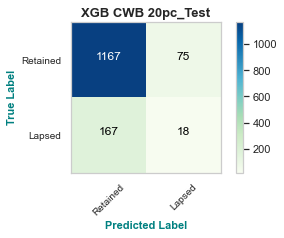

XGB CWB 20pc_Test - Classification Report
              precision    recall  f1-score   support

         0.0       0.87      0.94      0.91      1242
         1.0       0.19      0.10      0.13       185

    accuracy                           0.83      1427
   macro avg       0.53      0.52      0.52      1427
weighted avg       0.79      0.83      0.81      1427



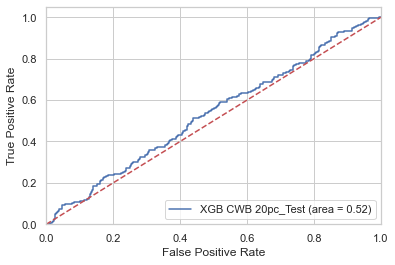

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


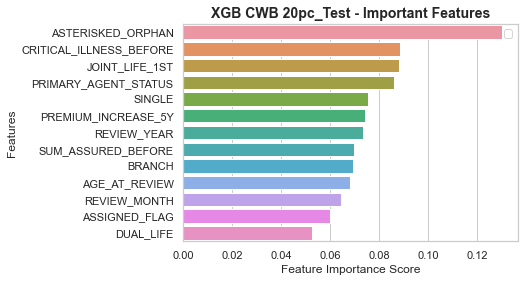

[14:41:23] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.6.0/src/learner.cc:627: 
Parameters: { "class_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


Best parameters XGB CWB ('10pc_Test',): {'class_weight': 'balanced', 'learning_rate': 1, 'max_depth': 4, 'n_estimators': 50}
[14:41:23] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.6.0/src/learner.cc:627: 
Parameters: { "class_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


XGB CWB_90pc_Train F1 Score : 52.

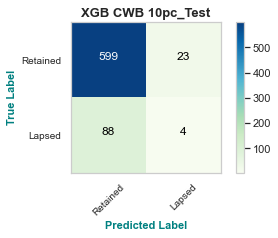

XGB CWB 10pc_Test - Classification Report
              precision    recall  f1-score   support

         0.0       0.87      0.96      0.92       622
         1.0       0.15      0.04      0.07        92

    accuracy                           0.84       714
   macro avg       0.51      0.50      0.49       714
weighted avg       0.78      0.84      0.81       714



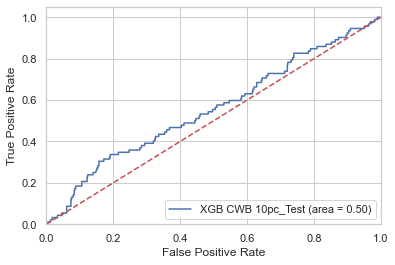

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


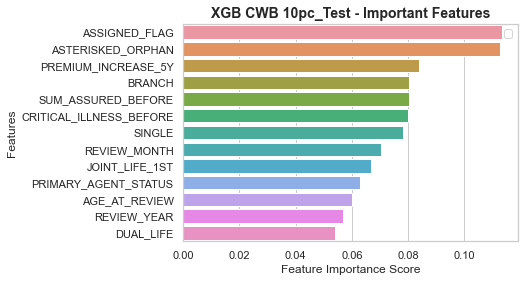

Best parameters XGB ROS ('30pc_Test',): {'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 50}
XGB ROS_70pc_Train F1 Score : 29.52%
XGB ROS_30pc_Test F1 Score : 29.63%


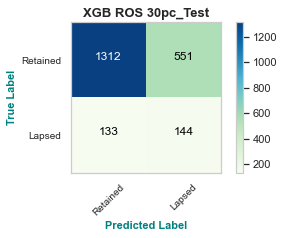

XGB ROS 30pc_Test - Classification Report
              precision    recall  f1-score   support

         0.0       0.91      0.70      0.79      1863
         1.0       0.21      0.52      0.30       277

    accuracy                           0.68      2140
   macro avg       0.56      0.61      0.54      2140
weighted avg       0.82      0.68      0.73      2140



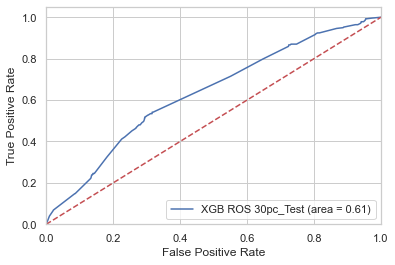

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


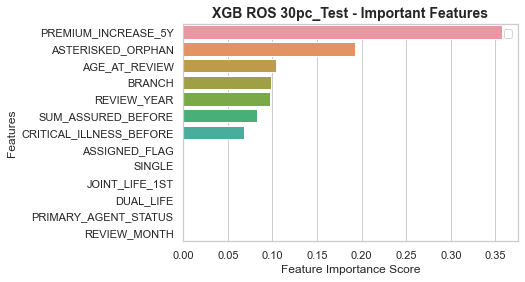

Best parameters XGB ROS ('20pc_Test',): {'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 10}
XGB ROS_80pc_Train F1 Score : 29.33%
XGB ROS_20pc_Test F1 Score : 29.81%


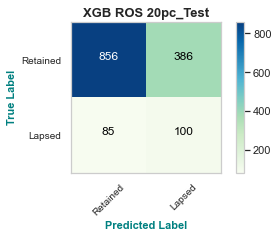

XGB ROS 20pc_Test - Classification Report
              precision    recall  f1-score   support

         0.0       0.91      0.69      0.78      1242
         1.0       0.21      0.54      0.30       185

    accuracy                           0.67      1427
   macro avg       0.56      0.61      0.54      1427
weighted avg       0.82      0.67      0.72      1427



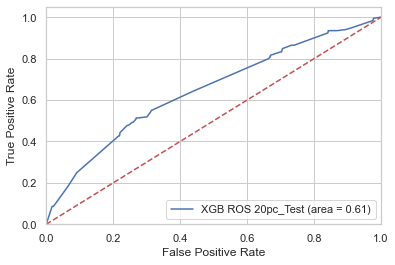

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


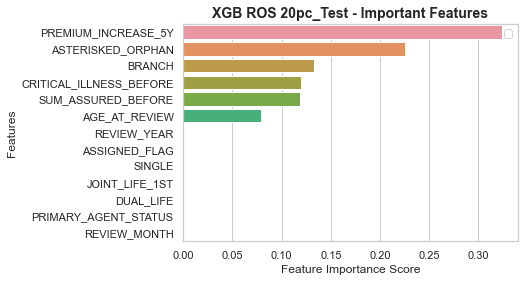

Best parameters XGB ROS ('10pc_Test',): {'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 10}
XGB ROS_90pc_Train F1 Score : 28.99%
XGB ROS_10pc_Test F1 Score : 29.52%


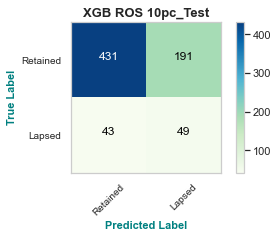

XGB ROS 10pc_Test - Classification Report
              precision    recall  f1-score   support

         0.0       0.91      0.69      0.79       622
         1.0       0.20      0.53      0.30        92

    accuracy                           0.67       714
   macro avg       0.56      0.61      0.54       714
weighted avg       0.82      0.67      0.72       714



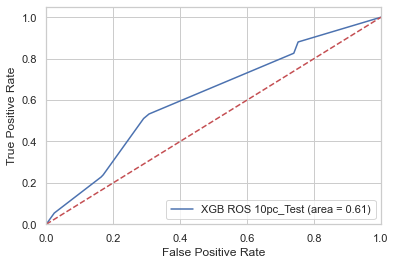

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


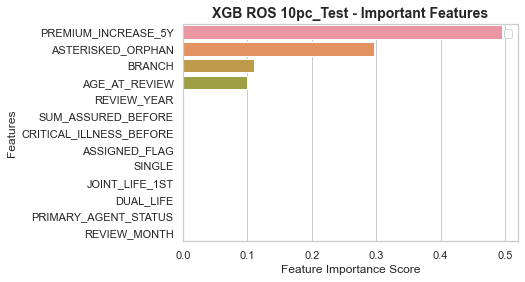

Best parameters XGB ADASYN ('30pc_Test',): {'clf__learning_rate': 0.1, 'clf__max_depth': 1, 'clf__n_estimators': 10}
XGB ADASYN_70pc_Train F1 Score : 24.43%
XGB ADASYN_30pc_Test F1 Score : 25.90%


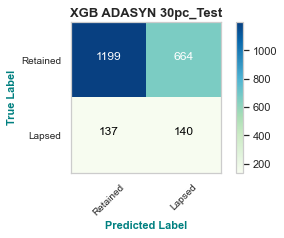

XGB ADASYN 30pc_Test - Classification Report
              precision    recall  f1-score   support

         0.0       0.90      0.64      0.75      1863
         1.0       0.17      0.51      0.26       277

    accuracy                           0.63      2140
   macro avg       0.54      0.57      0.50      2140
weighted avg       0.80      0.63      0.69      2140



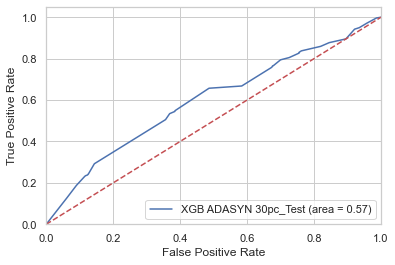

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


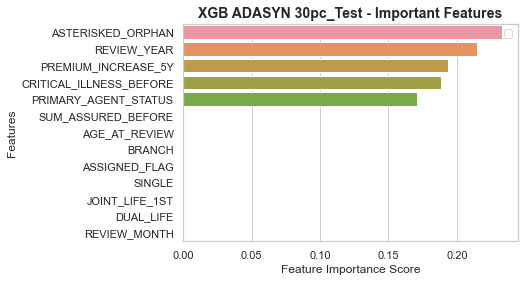

Best parameters XGB ADASYN ('20pc_Test',): {'clf__learning_rate': 0.01, 'clf__max_depth': 1, 'clf__n_estimators': 10}
XGB ADASYN_80pc_Train F1 Score : 22.34%
XGB ADASYN_20pc_Test F1 Score : 31.49%


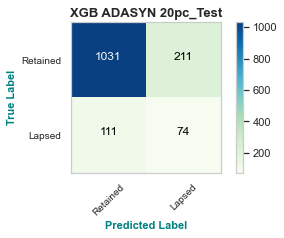

XGB ADASYN 20pc_Test - Classification Report
              precision    recall  f1-score   support

         0.0       0.90      0.83      0.86      1242
         1.0       0.26      0.40      0.31       185

    accuracy                           0.77      1427
   macro avg       0.58      0.62      0.59      1427
weighted avg       0.82      0.77      0.79      1427



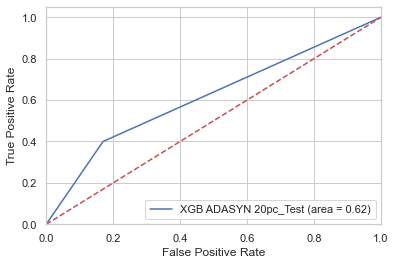

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


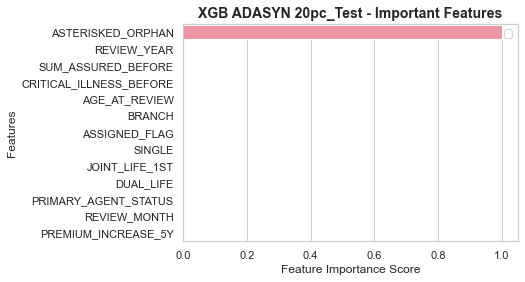

Best parameters XGB ADASYN ('10pc_Test',): {'clf__learning_rate': 0.01, 'clf__max_depth': 1, 'clf__n_estimators': 10}
XGB ADASYN_90pc_Train F1 Score : 23.43%
XGB ADASYN_10pc_Test F1 Score : 31.30%


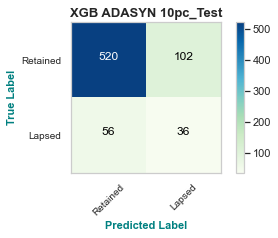

XGB ADASYN 10pc_Test - Classification Report
              precision    recall  f1-score   support

         0.0       0.90      0.84      0.87       622
         1.0       0.26      0.39      0.31        92

    accuracy                           0.78       714
   macro avg       0.58      0.61      0.59       714
weighted avg       0.82      0.78      0.80       714



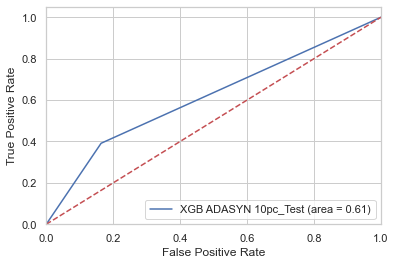

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


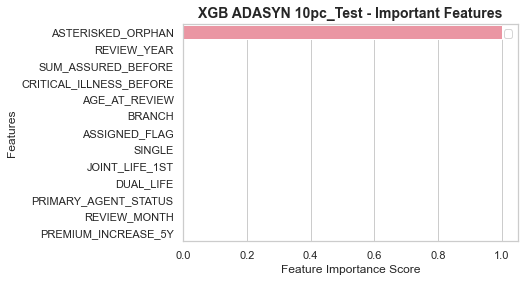

Best parameters XGB SMOTE ('30pc_Test',): {'clf__learning_rate': 0.1, 'clf__max_depth': 1, 'clf__n_estimators': 10}
XGB SMOTE_70pc_Train F1 Score : 22.16%
XGB SMOTE_30pc_Test F1 Score : 26.11%


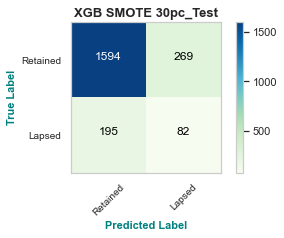

XGB SMOTE 30pc_Test - Classification Report
              precision    recall  f1-score   support

         0.0       0.89      0.86      0.87      1863
         1.0       0.23      0.30      0.26       277

    accuracy                           0.78      2140
   macro avg       0.56      0.58      0.57      2140
weighted avg       0.81      0.78      0.79      2140



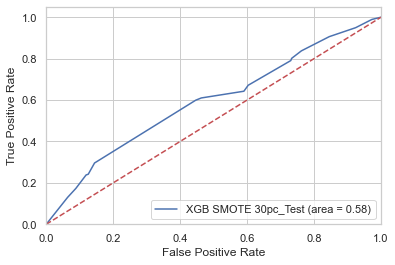

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


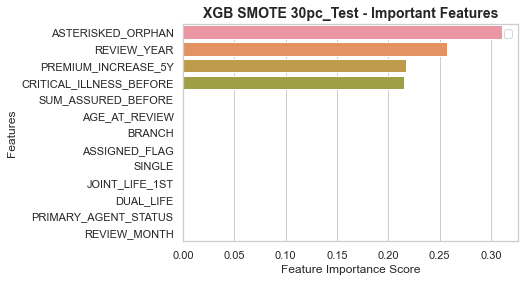

Best parameters XGB SMOTE ('20pc_Test',): {'clf__learning_rate': 0.1, 'clf__max_depth': 1, 'clf__n_estimators': 10}
XGB SMOTE_80pc_Train F1 Score : 22.30%
XGB SMOTE_20pc_Test F1 Score : 30.52%


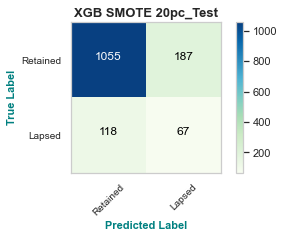

XGB SMOTE 20pc_Test - Classification Report
              precision    recall  f1-score   support

         0.0       0.90      0.85      0.87      1242
         1.0       0.26      0.36      0.31       185

    accuracy                           0.79      1427
   macro avg       0.58      0.61      0.59      1427
weighted avg       0.82      0.79      0.80      1427



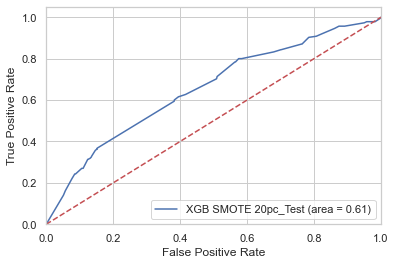

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


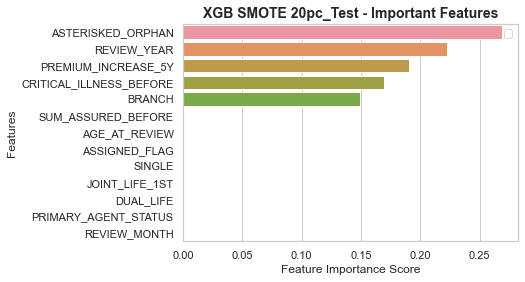

Best parameters XGB SMOTE ('10pc_Test',): {'clf__learning_rate': 0.01, 'clf__max_depth': 1, 'clf__n_estimators': 10}
XGB SMOTE_90pc_Train F1 Score : 23.43%
XGB SMOTE_10pc_Test F1 Score : 31.30%


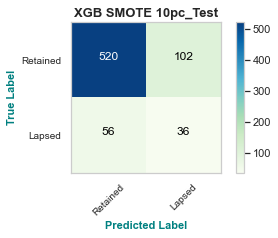

XGB SMOTE 10pc_Test - Classification Report
              precision    recall  f1-score   support

         0.0       0.90      0.84      0.87       622
         1.0       0.26      0.39      0.31        92

    accuracy                           0.78       714
   macro avg       0.58      0.61      0.59       714
weighted avg       0.82      0.78      0.80       714



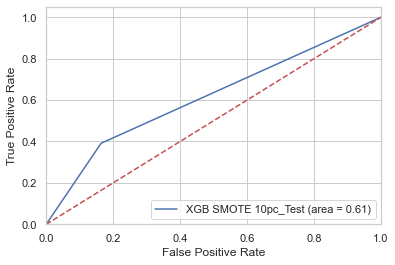

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


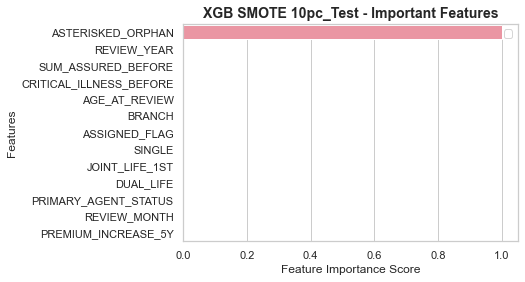

Best parameters XGB BLSMOTE ('30pc_Test',): {'clf__learning_rate': 0.1, 'clf__max_depth': 1, 'clf__n_estimators': 10}
XGB BLSMOTE_70pc_Train F1 Score : 24.51%
XGB BLSMOTE_30pc_Test F1 Score : 25.97%


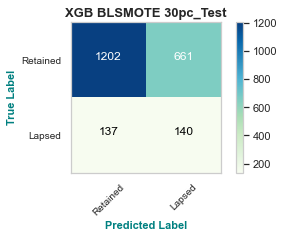

XGB BLSMOTE 30pc_Test - Classification Report
              precision    recall  f1-score   support

         0.0       0.90      0.65      0.75      1863
         1.0       0.17      0.51      0.26       277

    accuracy                           0.63      2140
   macro avg       0.54      0.58      0.51      2140
weighted avg       0.80      0.63      0.69      2140



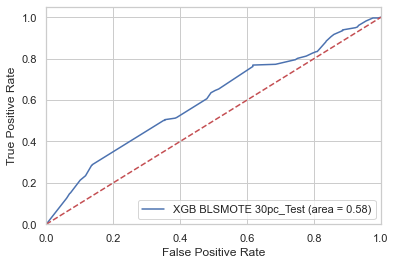

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


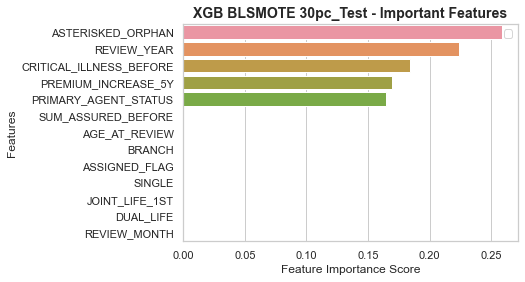

Best parameters XGB BLSMOTE ('20pc_Test',): {'clf__learning_rate': 0.01, 'clf__max_depth': 1, 'clf__n_estimators': 100}
XGB BLSMOTE_80pc_Train F1 Score : 22.15%
XGB BLSMOTE_20pc_Test F1 Score : 30.63%


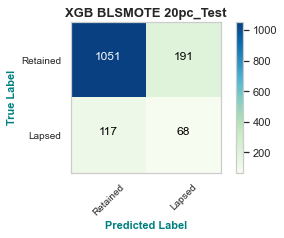

XGB BLSMOTE 20pc_Test - Classification Report
              precision    recall  f1-score   support

         0.0       0.90      0.85      0.87      1242
         1.0       0.26      0.37      0.31       185

    accuracy                           0.78      1427
   macro avg       0.58      0.61      0.59      1427
weighted avg       0.82      0.78      0.80      1427



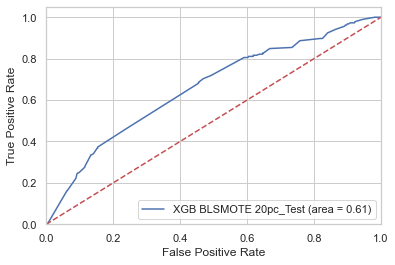

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


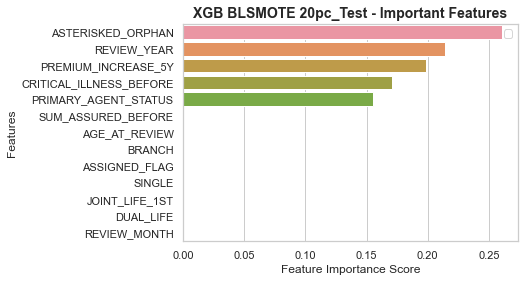

Best parameters XGB BLSMOTE ('10pc_Test',): {'clf__learning_rate': 0.01, 'clf__max_depth': 1, 'clf__n_estimators': 10}
XGB BLSMOTE_90pc_Train F1 Score : 23.43%
XGB BLSMOTE_10pc_Test F1 Score : 31.30%


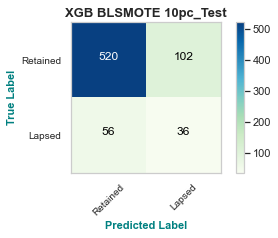

XGB BLSMOTE 10pc_Test - Classification Report
              precision    recall  f1-score   support

         0.0       0.90      0.84      0.87       622
         1.0       0.26      0.39      0.31        92

    accuracy                           0.78       714
   macro avg       0.58      0.61      0.59       714
weighted avg       0.82      0.78      0.80       714



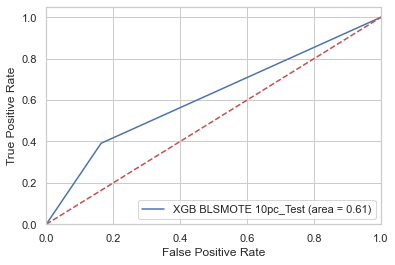

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


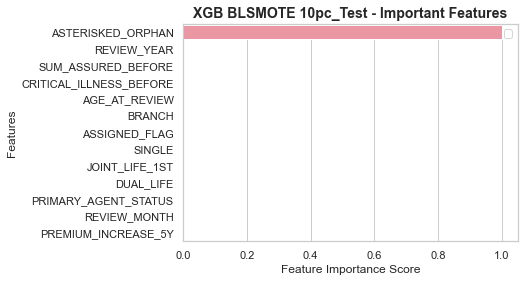

Best parameters XGB SMOTETomek ('30pc_Test',): {'clf__learning_rate': 0.01, 'clf__max_depth': 1, 'clf__n_estimators': 100}
XGB SMOTETomek_70pc_Train F1 Score : 22.16%
XGB SMOTETomek_30pc_Test F1 Score : 26.11%


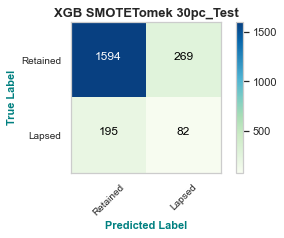

XGB SMOTETomek 30pc_Test - Classification Report
              precision    recall  f1-score   support

         0.0       0.89      0.86      0.87      1863
         1.0       0.23      0.30      0.26       277

    accuracy                           0.78      2140
   macro avg       0.56      0.58      0.57      2140
weighted avg       0.81      0.78      0.79      2140



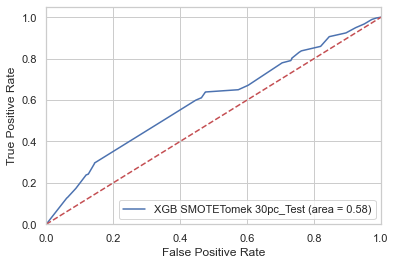

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


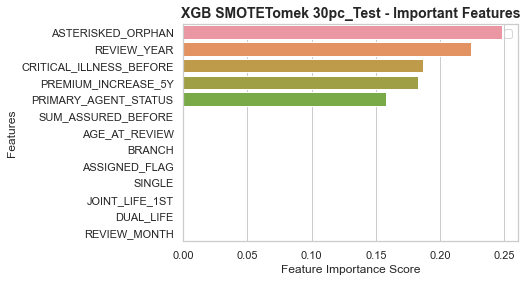

Best parameters XGB SMOTETomek ('20pc_Test',): {'clf__learning_rate': 0.1, 'clf__max_depth': 1, 'clf__n_estimators': 10}
XGB SMOTETomek_80pc_Train F1 Score : 22.20%
XGB SMOTETomek_20pc_Test F1 Score : 30.70%


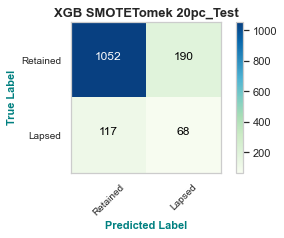

XGB SMOTETomek 20pc_Test - Classification Report
              precision    recall  f1-score   support

         0.0       0.90      0.85      0.87      1242
         1.0       0.26      0.37      0.31       185

    accuracy                           0.78      1427
   macro avg       0.58      0.61      0.59      1427
weighted avg       0.82      0.78      0.80      1427



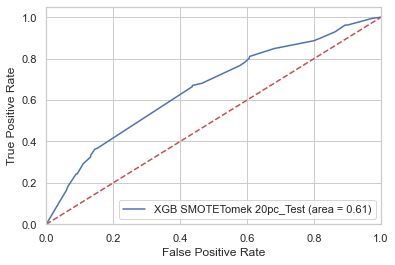

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


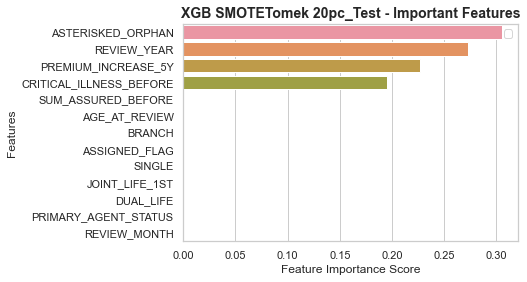

Best parameters XGB SMOTETomek ('10pc_Test',): {'clf__learning_rate': 0.01, 'clf__max_depth': 1, 'clf__n_estimators': 10}
XGB SMOTETomek_90pc_Train F1 Score : 23.43%
XGB SMOTETomek_10pc_Test F1 Score : 31.30%


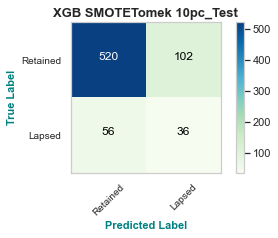

XGB SMOTETomek 10pc_Test - Classification Report
              precision    recall  f1-score   support

         0.0       0.90      0.84      0.87       622
         1.0       0.26      0.39      0.31        92

    accuracy                           0.78       714
   macro avg       0.58      0.61      0.59       714
weighted avg       0.82      0.78      0.80       714



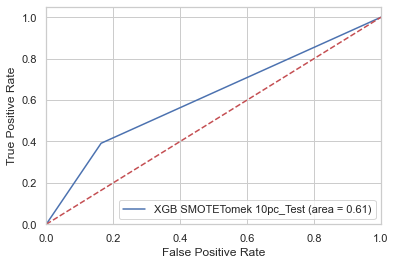

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


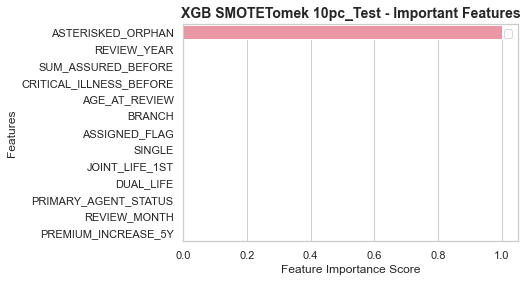

Best parameters XGB SMOTEENN ('30pc_Test',): {'clf__learning_rate': 0.01, 'clf__max_depth': 2, 'clf__n_estimators': 100}
XGB SMOTEENN_70pc_Train F1 Score : 25.85%
XGB SMOTEENN_30pc_Test F1 Score : 24.09%


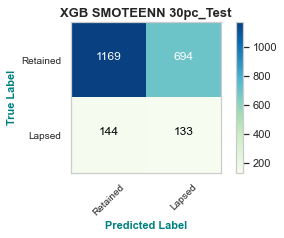

XGB SMOTEENN 30pc_Test - Classification Report
              precision    recall  f1-score   support

         0.0       0.89      0.63      0.74      1863
         1.0       0.16      0.48      0.24       277

    accuracy                           0.61      2140
   macro avg       0.53      0.55      0.49      2140
weighted avg       0.80      0.61      0.67      2140



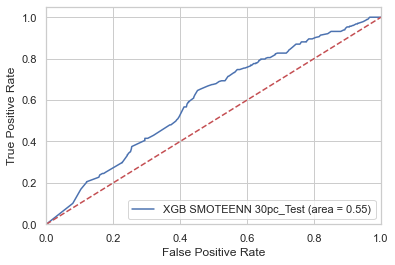

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


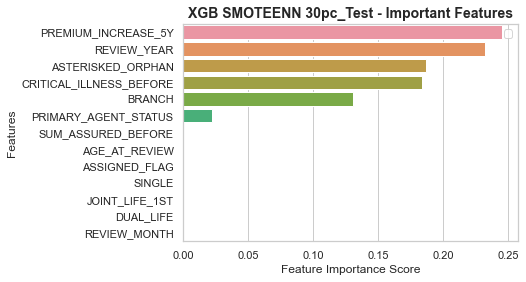

Best parameters XGB SMOTEENN ('20pc_Test',): {'clf__learning_rate': 0.01, 'clf__max_depth': 1, 'clf__n_estimators': 100}
XGB SMOTEENN_80pc_Train F1 Score : 25.93%
XGB SMOTEENN_20pc_Test F1 Score : 27.12%


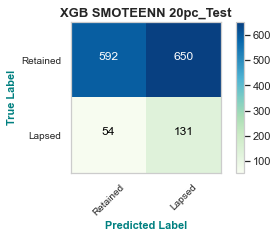

XGB SMOTEENN 20pc_Test - Classification Report
              precision    recall  f1-score   support

         0.0       0.92      0.48      0.63      1242
         1.0       0.17      0.71      0.27       185

    accuracy                           0.51      1427
   macro avg       0.54      0.59      0.45      1427
weighted avg       0.82      0.51      0.58      1427



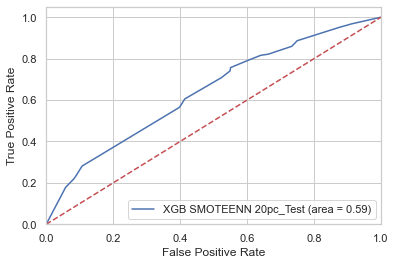

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


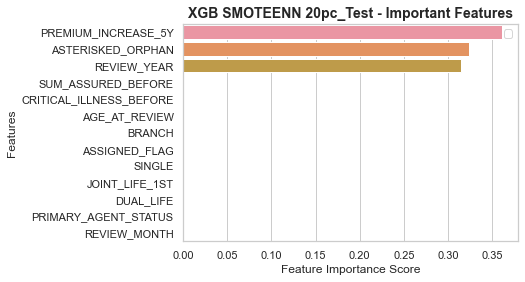

Best parameters XGB SMOTEENN ('10pc_Test',): {'clf__learning_rate': 0.01, 'clf__max_depth': 1, 'clf__n_estimators': 100}
XGB SMOTEENN_90pc_Train F1 Score : 25.94%
XGB SMOTEENN_10pc_Test F1 Score : 27.46%


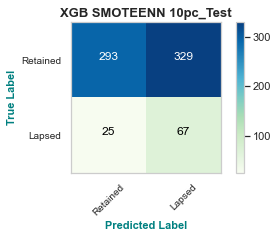

XGB SMOTEENN 10pc_Test - Classification Report
              precision    recall  f1-score   support

         0.0       0.92      0.47      0.62       622
         1.0       0.17      0.73      0.27        92

    accuracy                           0.50       714
   macro avg       0.55      0.60      0.45       714
weighted avg       0.82      0.50      0.58       714



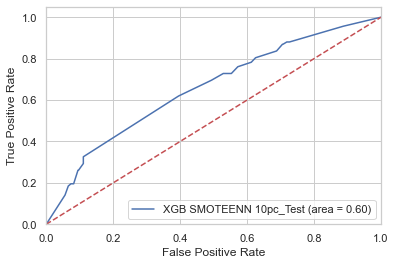

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


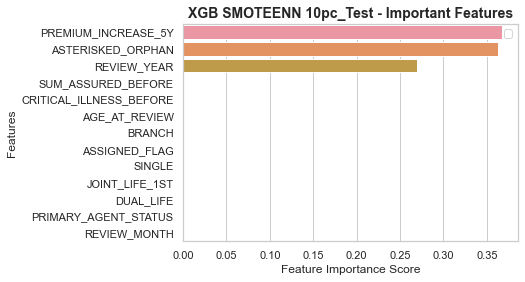

Best parameters XGB RUS ('30pc_Test',): {'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 50}
XGB RUS_70pc_Train F1 Score : 28.78%
XGB RUS_30pc_Test F1 Score : 25.95%


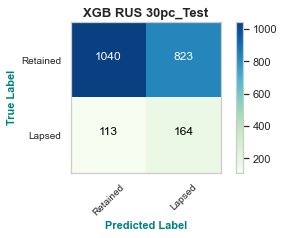

XGB RUS 30pc_Test - Classification Report
              precision    recall  f1-score   support

         0.0       0.90      0.56      0.69      1863
         1.0       0.17      0.59      0.26       277

    accuracy                           0.56      2140
   macro avg       0.53      0.58      0.47      2140
weighted avg       0.81      0.56      0.63      2140



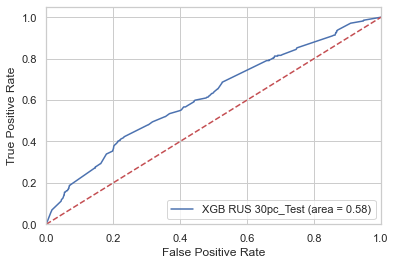

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


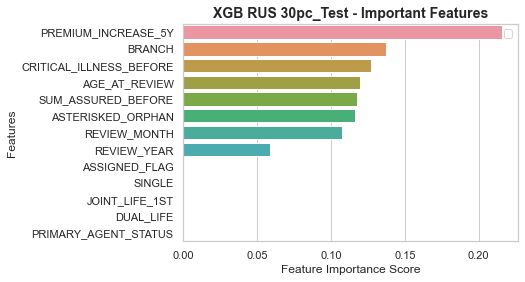

Best parameters XGB RUS ('20pc_Test',): {'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 50}
XGB RUS_80pc_Train F1 Score : 27.77%
XGB RUS_20pc_Test F1 Score : 30.20%


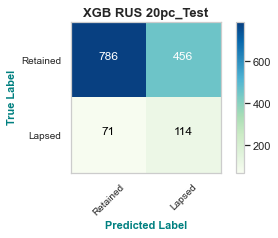

XGB RUS 20pc_Test - Classification Report
              precision    recall  f1-score   support

         0.0       0.92      0.63      0.75      1242
         1.0       0.20      0.62      0.30       185

    accuracy                           0.63      1427
   macro avg       0.56      0.62      0.53      1427
weighted avg       0.82      0.63      0.69      1427



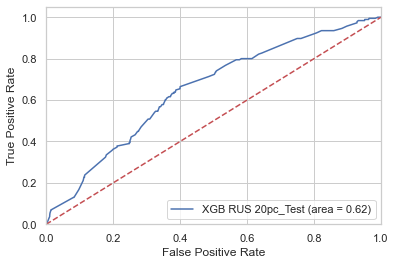

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


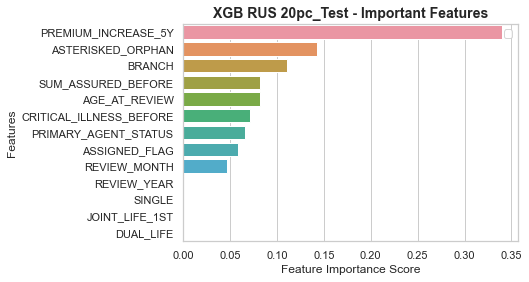

Best parameters XGB RUS ('10pc_Test',): {'clf__learning_rate': 0.01, 'clf__max_depth': 2, 'clf__n_estimators': 50}
XGB RUS_90pc_Train F1 Score : 28.52%
XGB RUS_10pc_Test F1 Score : 28.31%


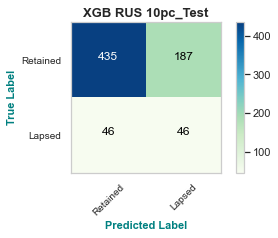

XGB RUS 10pc_Test - Classification Report
              precision    recall  f1-score   support

         0.0       0.90      0.70      0.79       622
         1.0       0.20      0.50      0.28        92

    accuracy                           0.67       714
   macro avg       0.55      0.60      0.54       714
weighted avg       0.81      0.67      0.72       714



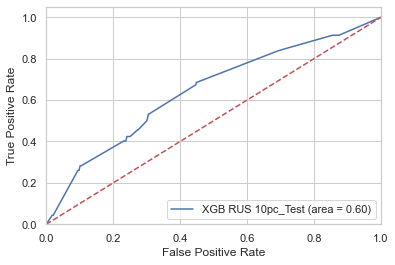

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


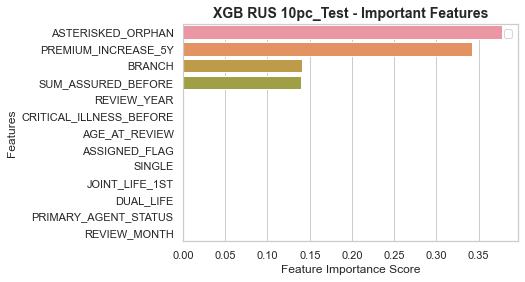

Best parameters XGB NM1 ('30pc_Test',): {'clf__learning_rate': 0.1, 'clf__max_depth': 1, 'clf__n_estimators': 100}
XGB NM1_70pc_Train F1 Score : 26.00%
XGB NM1_30pc_Test F1 Score : 25.56%


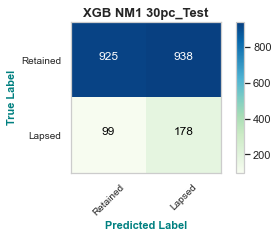

XGB NM1 30pc_Test - Classification Report
              precision    recall  f1-score   support

         0.0       0.90      0.50      0.64      1863
         1.0       0.16      0.64      0.26       277

    accuracy                           0.52      2140
   macro avg       0.53      0.57      0.45      2140
weighted avg       0.81      0.52      0.59      2140



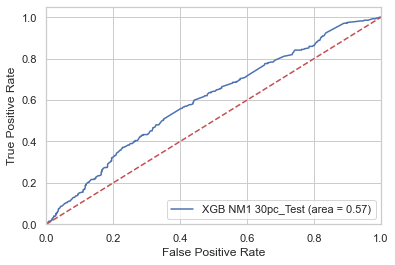

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


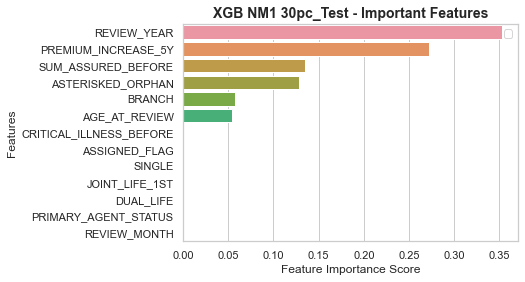

Best parameters XGB NM1 ('20pc_Test',): {'clf__learning_rate': 0.1, 'clf__max_depth': 2, 'clf__n_estimators': 50}
XGB NM1_80pc_Train F1 Score : 25.02%
XGB NM1_20pc_Test F1 Score : 25.14%


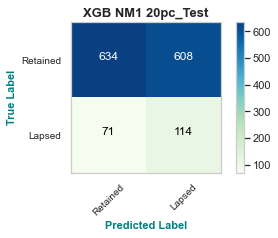

XGB NM1 20pc_Test - Classification Report
              precision    recall  f1-score   support

         0.0       0.90      0.51      0.65      1242
         1.0       0.16      0.62      0.25       185

    accuracy                           0.52      1427
   macro avg       0.53      0.56      0.45      1427
weighted avg       0.80      0.52      0.60      1427



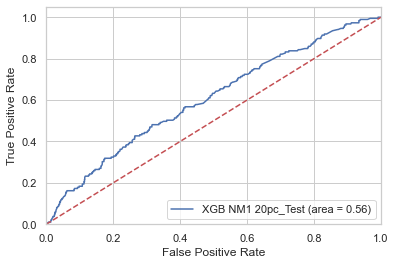

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


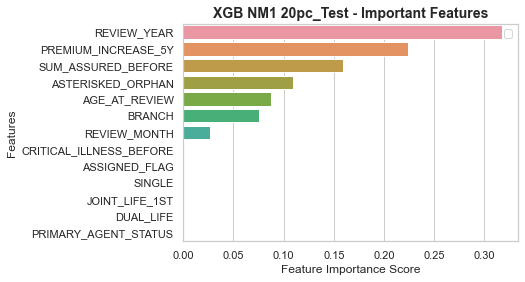

Best parameters XGB NM1 ('10pc_Test',): {'clf__learning_rate': 1, 'clf__max_depth': 1, 'clf__n_estimators': 10}
XGB NM1_90pc_Train F1 Score : 25.71%
XGB NM1_10pc_Test F1 Score : 26.87%


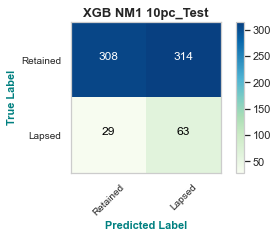

XGB NM1 10pc_Test - Classification Report
              precision    recall  f1-score   support

         0.0       0.91      0.50      0.64       622
         1.0       0.17      0.68      0.27        92

    accuracy                           0.52       714
   macro avg       0.54      0.59      0.46       714
weighted avg       0.82      0.52      0.59       714



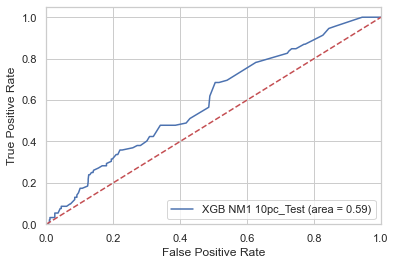

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


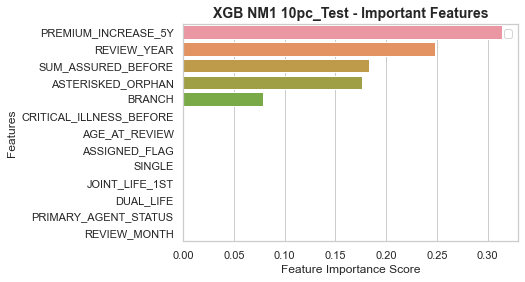

Best parameters XGB NM2 ('30pc_Test',): {'clf__learning_rate': 1, 'clf__max_depth': 3, 'clf__n_estimators': 100}
XGB NM2_70pc_Train F1 Score : 25.97%
XGB NM2_30pc_Test F1 Score : 21.75%


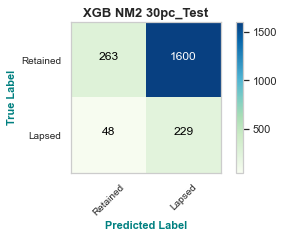

XGB NM2 30pc_Test - Classification Report
              precision    recall  f1-score   support

         0.0       0.85      0.14      0.24      1863
         1.0       0.13      0.83      0.22       277

    accuracy                           0.23      2140
   macro avg       0.49      0.48      0.23      2140
weighted avg       0.75      0.23      0.24      2140



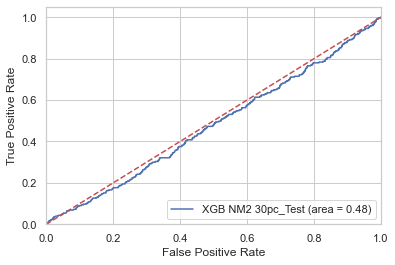

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


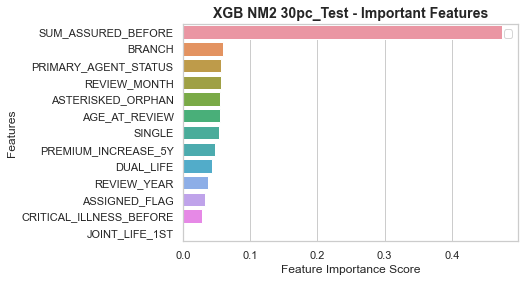

Best parameters XGB NM2 ('20pc_Test',): {'clf__learning_rate': 1, 'clf__max_depth': 2, 'clf__n_estimators': 100}
XGB NM2_80pc_Train F1 Score : 25.05%
XGB NM2_20pc_Test F1 Score : 21.31%


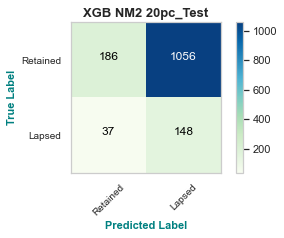

XGB NM2 20pc_Test - Classification Report
              precision    recall  f1-score   support

         0.0       0.83      0.15      0.25      1242
         1.0       0.12      0.80      0.21       185

    accuracy                           0.23      1427
   macro avg       0.48      0.47      0.23      1427
weighted avg       0.74      0.23      0.25      1427



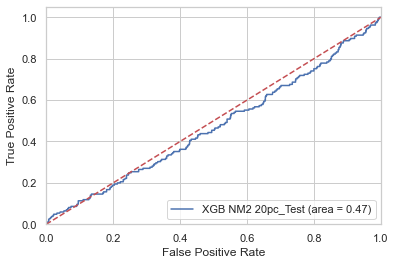

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


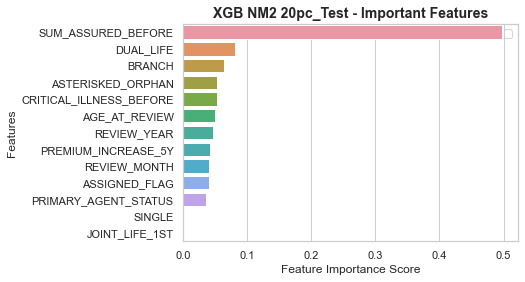

Best parameters XGB NM2 ('10pc_Test',): {'clf__learning_rate': 1, 'clf__max_depth': 3, 'clf__n_estimators': 100}
XGB NM2_90pc_Train F1 Score : 25.94%
XGB NM2_10pc_Test F1 Score : 20.61%


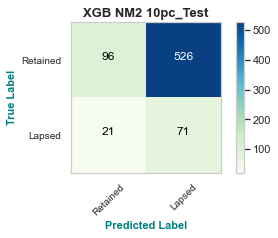

XGB NM2 10pc_Test - Classification Report
              precision    recall  f1-score   support

         0.0       0.82      0.15      0.26       622
         1.0       0.12      0.77      0.21        92

    accuracy                           0.23       714
   macro avg       0.47      0.46      0.23       714
weighted avg       0.73      0.23      0.25       714



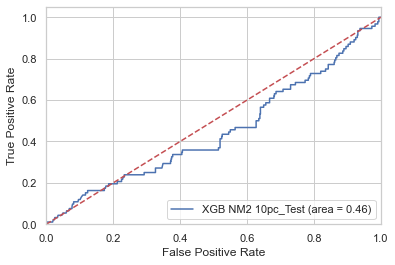

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


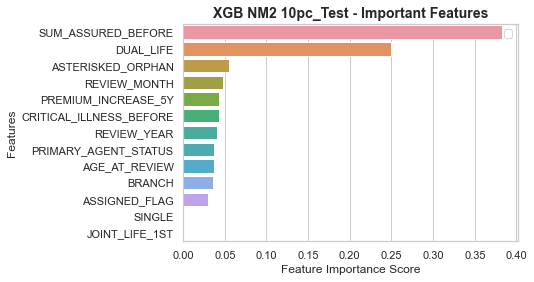

Best parameters XGB NM3 ('30pc_Test',): {'clf__learning_rate': 0.1, 'clf__max_depth': 3, 'clf__n_estimators': 100}
XGB NM3_70pc_Train F1 Score : 28.84%
XGB NM3_30pc_Test F1 Score : 23.97%


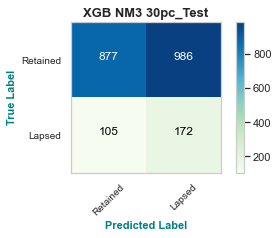

XGB NM3 30pc_Test - Classification Report
              precision    recall  f1-score   support

         0.0       0.89      0.47      0.62      1863
         1.0       0.15      0.62      0.24       277

    accuracy                           0.49      2140
   macro avg       0.52      0.55      0.43      2140
weighted avg       0.80      0.49      0.57      2140



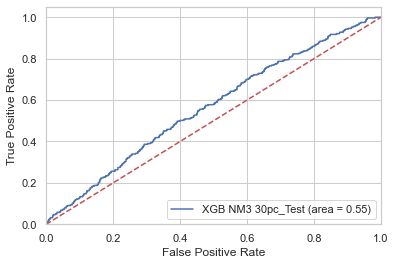

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


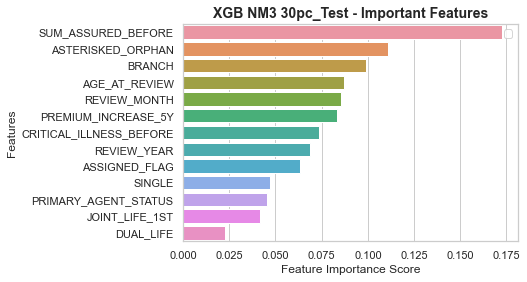

Best parameters XGB NM3 ('20pc_Test',): {'clf__learning_rate': 1, 'clf__max_depth': 1, 'clf__n_estimators': 100}
XGB NM3_80pc_Train F1 Score : 26.23%
XGB NM3_20pc_Test F1 Score : 22.82%


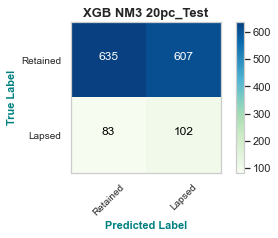

XGB NM3 20pc_Test - Classification Report
              precision    recall  f1-score   support

         0.0       0.88      0.51      0.65      1242
         1.0       0.14      0.55      0.23       185

    accuracy                           0.52      1427
   macro avg       0.51      0.53      0.44      1427
weighted avg       0.79      0.52      0.59      1427



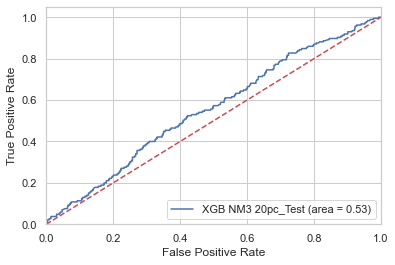

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


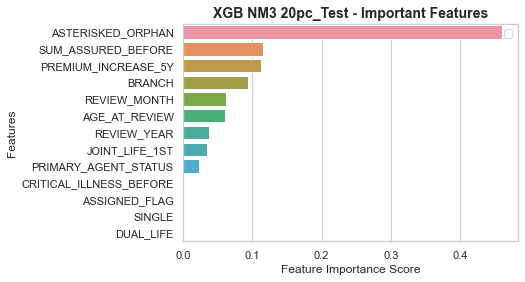

Best parameters XGB NM3 ('10pc_Test',): {'clf__learning_rate': 0.1, 'clf__max_depth': 3, 'clf__n_estimators': 100}
XGB NM3_90pc_Train F1 Score : 28.48%
XGB NM3_10pc_Test F1 Score : 25.59%


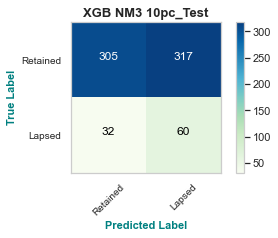

XGB NM3 10pc_Test - Classification Report
              precision    recall  f1-score   support

         0.0       0.91      0.49      0.64       622
         1.0       0.16      0.65      0.26        92

    accuracy                           0.51       714
   macro avg       0.53      0.57      0.45       714
weighted avg       0.81      0.51      0.59       714



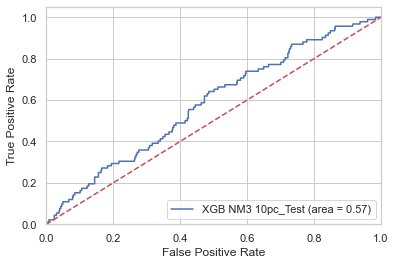

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


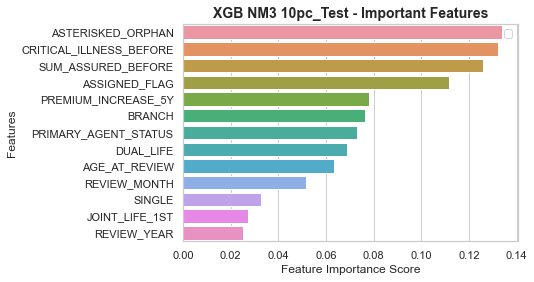

In [46]:
model_name = "XGB"
clf = XGBClassifier()

for train_name, test_name, X_train, y_train, X_test,y_test in zip(train_names,test_names, X_training_splits, y_training_splits, X_testing_splits, y_testing_splits):
    
    model = clf
    method = "IMB"
    param_grid = {'learning_rate': [0.01, 0.1, 1],'n_estimators': [10, 50, 100],'max_depth': range(1, 5)}
    stratified_kfold = StratifiedKFold(n_splits=5,shuffle=True,random_state=11)
    gs = GridSearchCV(estimator=model,
                      param_grid=param_grid,
                      scoring='f1',
                      cv=stratified_kfold,
                      n_jobs=-1)
    gs.fit(X_train,y_train)

    # Print the best parameters and best score obtained during the grid search
    print(f'Best parameters {model_name} {method} {test_name,}:', gs.best_params_)
    
    best_model = gs.best_estimator_
    # Call fit() method to train the model
    best_model.fit(X_train,y_train)
    # Predict the results
    y_train_predict = best_model.predict(X_train)
    y_predict = best_model.predict(X_test)
    
    exec(f'{model_name}_roc_auc_{method}_{train_name} =  roc_auc_score(y_train,y_train_predict)')
    exec(f'{model_name}_a_{method}_{train_name} = metrics.accuracy_score(y_train,y_train_predict)') 
    exec(f'{model_name}_p_{method}_{train_name} = metrics.precision_score(y_train,y_train_predict)') 
    exec(f'{model_name}_r_{method}_{train_name}  = metrics.recall_score(y_train,y_train_predict)') 
    exec(f'{model_name}_f1_{method}_{train_name} = metrics.f1_score(y_train,y_train_predict)')
    print(f'{model_name} {method}_{train_name} F1 Score : %.2f%%' % (metrics.f1_score(y_train, y_train_predict) * 100.0))

    # Call fit() method to train the model
    # Predict the results
    
    
    exec(f'{model_name}_roc_auc_{method}_{test_name} =  roc_auc_score(y_test,y_predict)')
    exec(f'{model_name}_a_{method}_{test_name} = metrics.accuracy_score(y_test, y_predict)') 
    exec(f'{model_name}_p_{method}_{test_name} = metrics.precision_score(y_test, y_predict)') 
    exec(f'{model_name}_r_{method}_{test_name}  = metrics.recall_score(y_test, y_predict)') 
    exec(f'{model_name}_f1_{method}_{test_name} = metrics.f1_score(y_test, y_predict)')
    print(f'{model_name} {method}_{test_name} F1 Score : %.2f%%' % (metrics.f1_score(y_test, y_predict) * 100.0))
 

 
     # Compute confusion matrix
    cnf_matrix = confusion_matrix(y_test, y_predict)
    # Plot non-normalized confusion matrix
    plt.figure(figsize = (5, 3.5))
    plot_confusion_matrix(cnf_matrix, classes = class_names)
    plt.title(f'{model_name} {method} {test_name}',fontsize = 13, fontweight = "bold")
    plt.show()

    # print the classification_report based on y_test and y_predict) 
    print(f'{model_name} {method} {test_name} - Classification Report')
    print(classification_report(y_test, y_predict))

    roc_auc_curve(y_test,best_model,method,test_name,X_test)
    feature_importance(best_model,model_name, method, test_name)
    

for train_name, test_name, X_train, y_train, X_test,y_test in zip(train_names,test_names, X_training_splits, y_training_splits, X_testing_splits, y_testing_splits):
    
    model = clf
    method = "CWB"
    param_grid = {'learning_rate': [0.01, 0.1, 1],'n_estimators': [10, 50, 100],'max_depth': range(1, 5),'class_weight':['balanced']}
    stratified_kfold = StratifiedKFold(n_splits=5,shuffle=True,random_state=11)
    gs = GridSearchCV(estimator=model,
                      param_grid=param_grid,
                      scoring='f1',
                      cv=stratified_kfold,
                      n_jobs=-1)
    gs.fit(X_train,y_train)

    # Print the best parameters and best score obtained during the grid search
    print(f'Best parameters {model_name} {method} {test_name,}:', gs.best_params_)
    
    best_model = gs.best_estimator_
    # Call fit() method to train the model
    best_model.fit(X_train,y_train)
    # Predict the results
    y_train_predict = best_model.predict(X_train)
    y_predict = best_model.predict(X_test)
    
    exec(f'{model_name}_roc_auc_{method}_{train_name} =  roc_auc_score(y_train,y_train_predict)')
    exec(f'{model_name}_a_{method}_{train_name} = metrics.accuracy_score(y_train,y_train_predict)') 
    exec(f'{model_name}_p_{method}_{train_name} = metrics.precision_score(y_train,y_train_predict)') 
    exec(f'{model_name}_r_{method}_{train_name}  = metrics.recall_score(y_train,y_train_predict)') 
    exec(f'{model_name}_f1_{method}_{train_name} = metrics.f1_score(y_train,y_train_predict)')
    print(f'{model_name} {method}_{train_name} F1 Score : %.2f%%' % (metrics.f1_score(y_train, y_train_predict) * 100.0))

    # Call fit() method to train the model
    # Predict the results
    
    
    exec(f'{model_name}_roc_auc_{method}_{test_name} =  roc_auc_score(y_test,y_predict)')
    exec(f'{model_name}_a_{method}_{test_name} = metrics.accuracy_score(y_test, y_predict)') 
    exec(f'{model_name}_p_{method}_{test_name} = metrics.precision_score(y_test, y_predict)') 
    exec(f'{model_name}_r_{method}_{test_name}  = metrics.recall_score(y_test, y_predict)') 
    exec(f'{model_name}_f1_{method}_{test_name} = metrics.f1_score(y_test, y_predict)')
    print(f'{model_name} {method}_{test_name} F1 Score : %.2f%%' % (metrics.f1_score(y_test, y_predict) * 100.0))
 

 
     # Compute confusion matrix
    cnf_matrix = confusion_matrix(y_test, y_predict)
    # Plot non-normalized confusion matrix
    plt.figure(figsize = (5, 3.5))
    plot_confusion_matrix(cnf_matrix, classes = class_names)
    plt.title(f'{model_name} {method} {test_name}',fontsize = 13, fontweight = "bold")
    plt.show()

    # print the classification_report based on y_test and y_predict) 
    print(f'{model_name} {method} {test_name} - Classification Report')
    print(classification_report(y_test, y_predict))

    roc_auc_curve(y_test,best_model,method,test_name,X_test)
    feature_importance(best_model,model_name, method, test_name)

for method,resampler in zip(resampler_names,resamplers):
    for train_name, test_name, X_train, y_train, X_test,y_test in zip(train_names,test_names, X_training_splits, y_training_splits, X_testing_splits, y_testing_splits):
        
        model = Pipeline([('resampler', resampler),
                     ('mms', MinMaxScaler()),
                     ('clf',clf)])
        
        param_grid = {'clf__learning_rate': [0.01, 0.1, 1],'clf__n_estimators': [10, 50, 100],'clf__max_depth': range(1, 4)}

        stratified_kfold = StratifiedKFold(n_splits=5,shuffle=True,random_state=11)
        gs = GridSearchCV(estimator=model,
                          param_grid=param_grid,
                          scoring='f1',
                          cv=stratified_kfold,
                          n_jobs=-1)
        gs.fit(X_train,y_train)

        # Print the best parameters and best score obtained during the grid search
        print(f'Best parameters {model_name} {method} {test_name,}:', gs.best_params_)

        best_model = gs.best_estimator_
        # Call fit() method to train the model
        best_model.fit(X_train,y_train)
        # Predict the results
        y_train_predict = best_model.predict(X_train)
        y_predict = best_model.predict(X_test)

        exec(f'{model_name}_roc_auc_{method}_{train_name} =  roc_auc_score(y_train,y_train_predict)')
        exec(f'{model_name}_a_{method}_{train_name} = metrics.accuracy_score(y_train,y_train_predict)') 
        exec(f'{model_name}_p_{method}_{train_name} = metrics.precision_score(y_train,y_train_predict)') 
        exec(f'{model_name}_r_{method}_{train_name}  = metrics.recall_score(y_train,y_train_predict)') 
        exec(f'{model_name}_f1_{method}_{train_name} = metrics.f1_score(y_train,y_train_predict)')
        print(f'{model_name} {method}_{train_name} F1 Score : %.2f%%' % (metrics.f1_score(y_train, y_train_predict) * 100.0))

        # Call fit() method to train the model
        # Predict the results


        exec(f'{model_name}_roc_auc_{method}_{test_name} =  roc_auc_score(y_test,y_predict)')
        exec(f'{model_name}_a_{method}_{test_name} = metrics.accuracy_score(y_test, y_predict)') 
        exec(f'{model_name}_p_{method}_{test_name} = metrics.precision_score(y_test, y_predict)') 
        exec(f'{model_name}_r_{method}_{test_name}  = metrics.recall_score(y_test, y_predict)') 
        exec(f'{model_name}_f1_{method}_{test_name} = metrics.f1_score(y_test, y_predict)')
        print(f'{model_name} {method}_{test_name} F1 Score : %.2f%%' % (metrics.f1_score(y_test, y_predict) * 100.0))



         # Compute confusion matrix
        cnf_matrix = confusion_matrix(y_test, y_predict)
        # Plot non-normalized confusion matrix
        plt.figure(figsize = (5, 3.5))
        plot_confusion_matrix(cnf_matrix, classes = class_names)
        plt.title(f'{model_name} {method} {test_name}',fontsize = 13, fontweight = "bold")
        plt.show()

        # print the classification_report based on y_test and y_predict) 
        print(f'{model_name} {method} {test_name} - Classification Report')
        print(classification_report(y_test, y_predict))

        roc_auc_curve(y_test,best_model,method,test_name,X_test)
        feature_importance_pipe(best_model,model_name, method, test_name)

## LightGBM

Best parameters LGBM IMB ('30pc_Test',): {'learning_rate': 1, 'max_depth': 3, 'n_estimators': 100, 'num_leaves': 10}
LGBM IMB_70pc_Train F1 Score : 53.51%
LGBM IMB_30pc_Test F1 Score : 8.38%


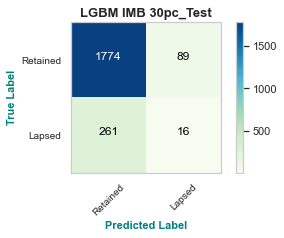

LGBM IMB 30pc_Test - Classification Report
              precision    recall  f1-score   support

         0.0       0.87      0.95      0.91      1863
         1.0       0.15      0.06      0.08       277

    accuracy                           0.84      2140
   macro avg       0.51      0.50      0.50      2140
weighted avg       0.78      0.84      0.80      2140



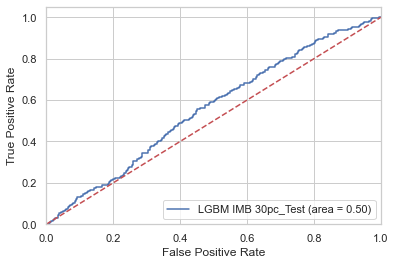

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


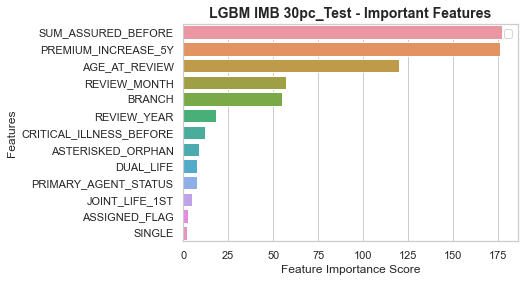

Best parameters LGBM IMB ('20pc_Test',): {'learning_rate': 1, 'max_depth': 3, 'n_estimators': 100, 'num_leaves': 5}
LGBM IMB_80pc_Train F1 Score : 36.97%
LGBM IMB_20pc_Test F1 Score : 7.23%


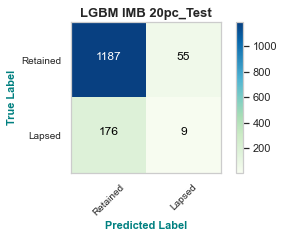

LGBM IMB 20pc_Test - Classification Report
              precision    recall  f1-score   support

         0.0       0.87      0.96      0.91      1242
         1.0       0.14      0.05      0.07       185

    accuracy                           0.84      1427
   macro avg       0.51      0.50      0.49      1427
weighted avg       0.78      0.84      0.80      1427



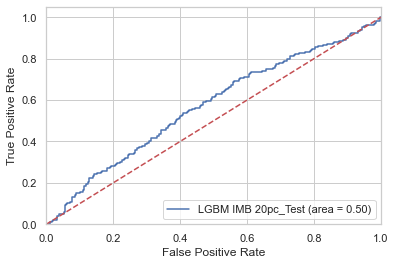

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


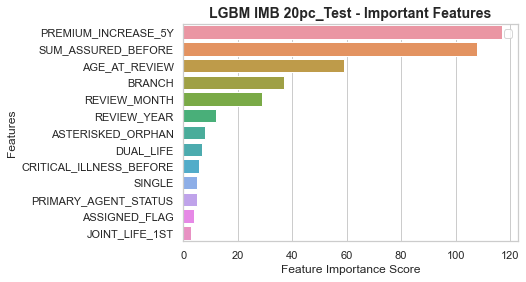

Best parameters LGBM IMB ('10pc_Test',): {'learning_rate': 1, 'max_depth': 3, 'n_estimators': 100, 'num_leaves': 10}
LGBM IMB_90pc_Train F1 Score : 47.18%
LGBM IMB_10pc_Test F1 Score : 7.81%


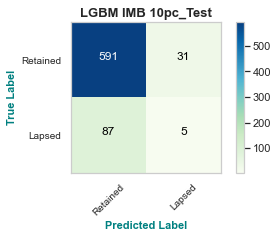

LGBM IMB 10pc_Test - Classification Report
              precision    recall  f1-score   support

         0.0       0.87      0.95      0.91       622
         1.0       0.14      0.05      0.08        92

    accuracy                           0.83       714
   macro avg       0.51      0.50      0.49       714
weighted avg       0.78      0.83      0.80       714



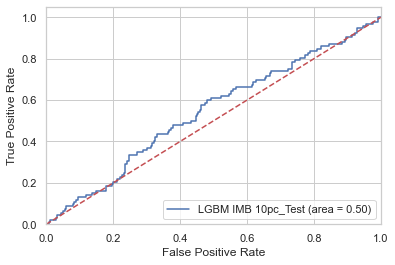

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


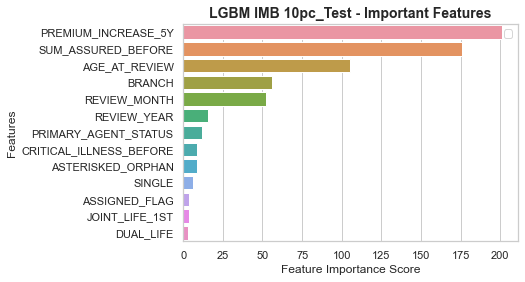

Best parameters LGBM CWB ('30pc_Test',): {'class_weight': 'balanced', 'learning_rate': 0.01, 'max_depth': 3, 'n_estimators': 10, 'num_leaves': 10}
LGBM CWB_70pc_Train F1 Score : 29.49%
LGBM CWB_30pc_Test F1 Score : 28.28%


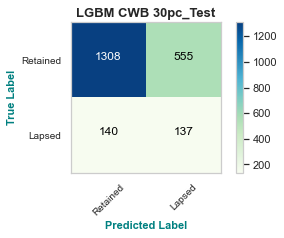

LGBM CWB 30pc_Test - Classification Report
              precision    recall  f1-score   support

         0.0       0.90      0.70      0.79      1863
         1.0       0.20      0.49      0.28       277

    accuracy                           0.68      2140
   macro avg       0.55      0.60      0.54      2140
weighted avg       0.81      0.68      0.72      2140



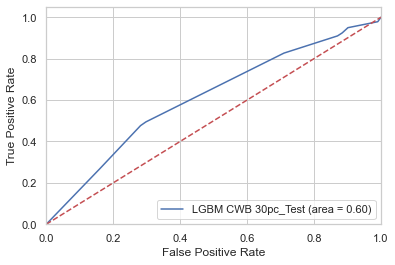

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


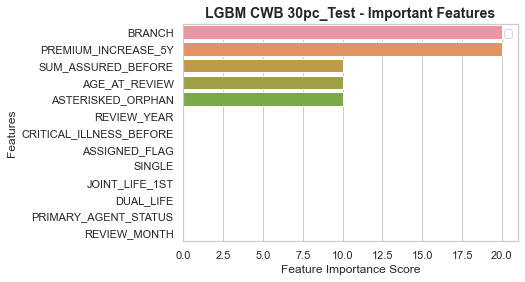

Best parameters LGBM CWB ('20pc_Test',): {'class_weight': 'balanced', 'learning_rate': 0.01, 'max_depth': 3, 'n_estimators': 10, 'num_leaves': 10}
LGBM CWB_80pc_Train F1 Score : 28.93%
LGBM CWB_20pc_Test F1 Score : 29.95%


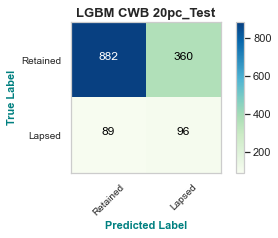

LGBM CWB 20pc_Test - Classification Report
              precision    recall  f1-score   support

         0.0       0.91      0.71      0.80      1242
         1.0       0.21      0.52      0.30       185

    accuracy                           0.69      1427
   macro avg       0.56      0.61      0.55      1427
weighted avg       0.82      0.69      0.73      1427



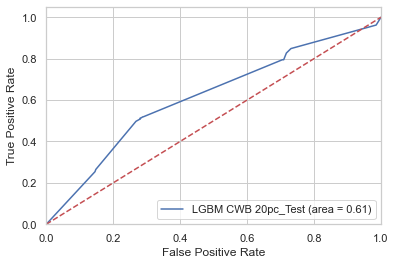

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


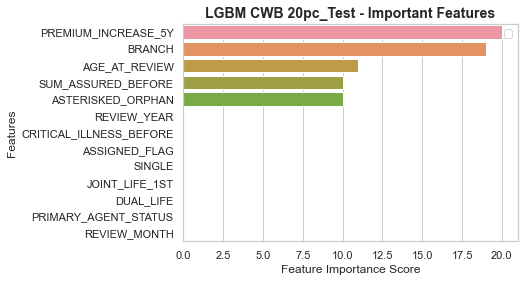

Best parameters LGBM CWB ('10pc_Test',): {'class_weight': 'balanced', 'learning_rate': 0.1, 'max_depth': 3, 'n_estimators': 10, 'num_leaves': 10}
LGBM CWB_90pc_Train F1 Score : 29.83%
LGBM CWB_10pc_Test F1 Score : 30.63%


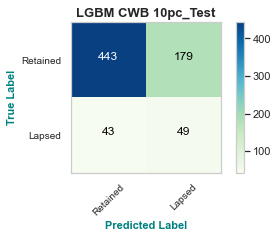

LGBM CWB 10pc_Test - Classification Report
              precision    recall  f1-score   support

         0.0       0.91      0.71      0.80       622
         1.0       0.21      0.53      0.31        92

    accuracy                           0.69       714
   macro avg       0.56      0.62      0.55       714
weighted avg       0.82      0.69      0.74       714



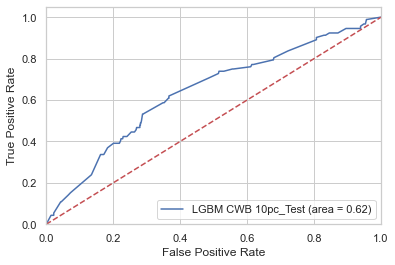

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


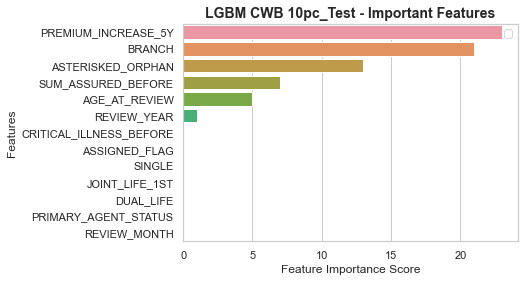

Best parameters LGBM ROS ('30pc_Test',): {'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 50, 'clf__num_leaves': 10}
LGBM ROS_70pc_Train F1 Score : 29.27%
LGBM ROS_30pc_Test F1 Score : 29.38%


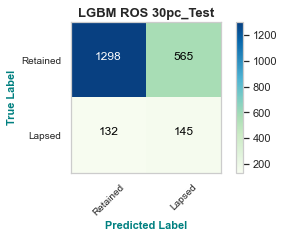

LGBM ROS 30pc_Test - Classification Report
              precision    recall  f1-score   support

         0.0       0.91      0.70      0.79      1863
         1.0       0.20      0.52      0.29       277

    accuracy                           0.67      2140
   macro avg       0.56      0.61      0.54      2140
weighted avg       0.82      0.67      0.72      2140



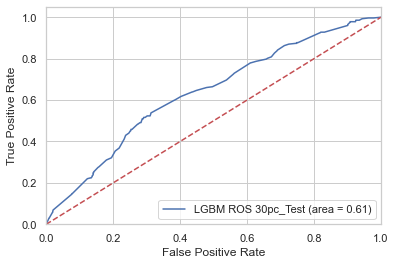

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


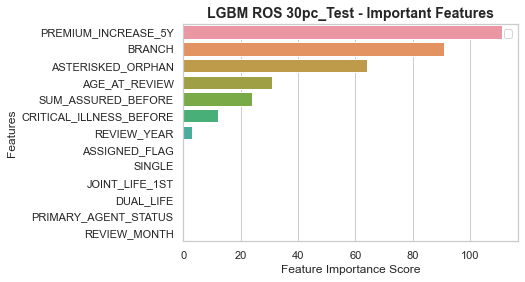

Best parameters LGBM ROS ('20pc_Test',): {'clf__learning_rate': 0.01, 'clf__max_depth': 5, 'clf__n_estimators': 10, 'clf__num_leaves': 10}
LGBM ROS_80pc_Train F1 Score : 29.99%
LGBM ROS_20pc_Test F1 Score : 30.46%


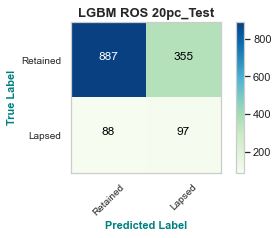

LGBM ROS 20pc_Test - Classification Report
              precision    recall  f1-score   support

         0.0       0.91      0.71      0.80      1242
         1.0       0.21      0.52      0.30       185

    accuracy                           0.69      1427
   macro avg       0.56      0.62      0.55      1427
weighted avg       0.82      0.69      0.74      1427



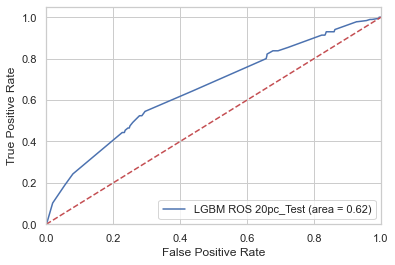

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


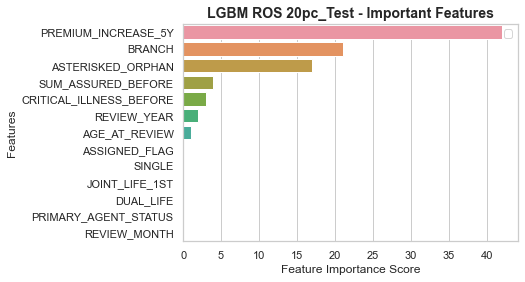

Best parameters LGBM ROS ('10pc_Test',): {'clf__learning_rate': 0.01, 'clf__max_depth': 4, 'clf__n_estimators': 50, 'clf__num_leaves': 10}
LGBM ROS_90pc_Train F1 Score : 29.64%
LGBM ROS_10pc_Test F1 Score : 29.27%


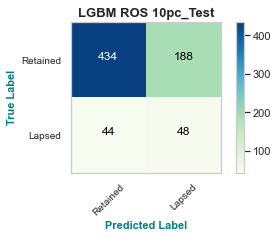

LGBM ROS 10pc_Test - Classification Report
              precision    recall  f1-score   support

         0.0       0.91      0.70      0.79       622
         1.0       0.20      0.52      0.29        92

    accuracy                           0.68       714
   macro avg       0.56      0.61      0.54       714
weighted avg       0.82      0.68      0.73       714



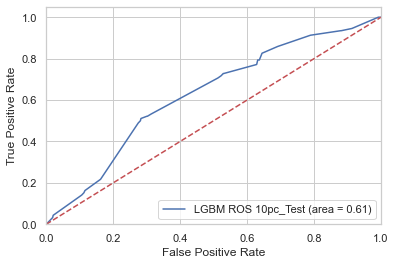

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


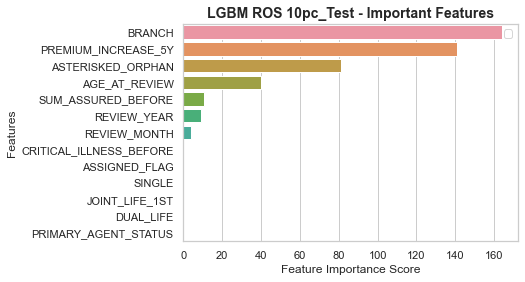

Best parameters LGBM ADASYN ('30pc_Test',): {'clf__learning_rate': 0.01, 'clf__max_depth': 1, 'clf__n_estimators': 100, 'clf__num_leaves': 5}
LGBM ADASYN_70pc_Train F1 Score : 24.55%
LGBM ADASYN_30pc_Test F1 Score : 25.90%


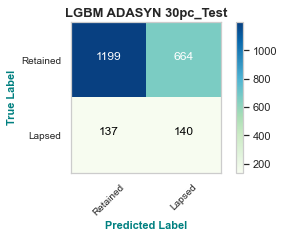

LGBM ADASYN 30pc_Test - Classification Report
              precision    recall  f1-score   support

         0.0       0.90      0.64      0.75      1863
         1.0       0.17      0.51      0.26       277

    accuracy                           0.63      2140
   macro avg       0.54      0.57      0.50      2140
weighted avg       0.80      0.63      0.69      2140



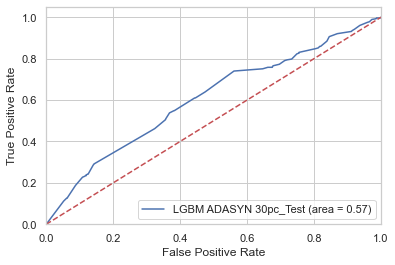

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


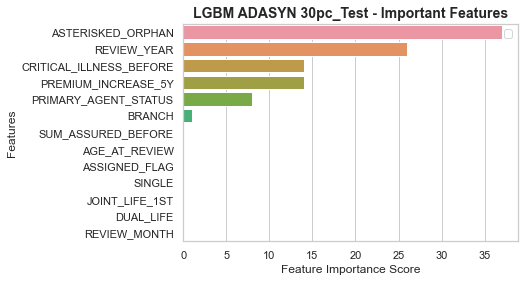

Best parameters LGBM ADASYN ('20pc_Test',): {'clf__learning_rate': 0.01, 'clf__max_depth': 1, 'clf__n_estimators': 10, 'clf__num_leaves': 5}
LGBM ADASYN_80pc_Train F1 Score : 22.34%
LGBM ADASYN_20pc_Test F1 Score : 31.49%


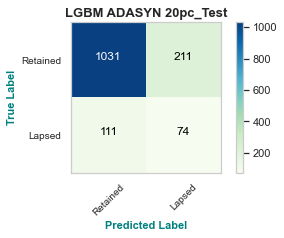

LGBM ADASYN 20pc_Test - Classification Report
              precision    recall  f1-score   support

         0.0       0.90      0.83      0.86      1242
         1.0       0.26      0.40      0.31       185

    accuracy                           0.77      1427
   macro avg       0.58      0.62      0.59      1427
weighted avg       0.82      0.77      0.79      1427



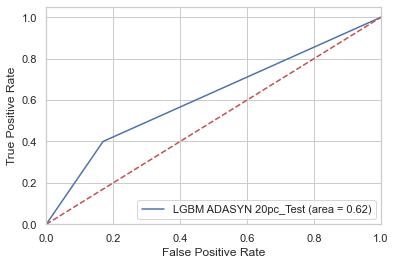

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


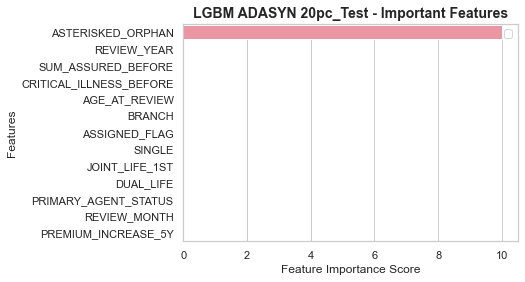

Best parameters LGBM ADASYN ('10pc_Test',): {'clf__learning_rate': 0.01, 'clf__max_depth': 1, 'clf__n_estimators': 10, 'clf__num_leaves': 5}
LGBM ADASYN_90pc_Train F1 Score : 23.43%
LGBM ADASYN_10pc_Test F1 Score : 31.30%


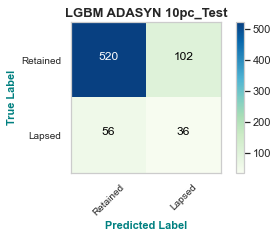

LGBM ADASYN 10pc_Test - Classification Report
              precision    recall  f1-score   support

         0.0       0.90      0.84      0.87       622
         1.0       0.26      0.39      0.31        92

    accuracy                           0.78       714
   macro avg       0.58      0.61      0.59       714
weighted avg       0.82      0.78      0.80       714



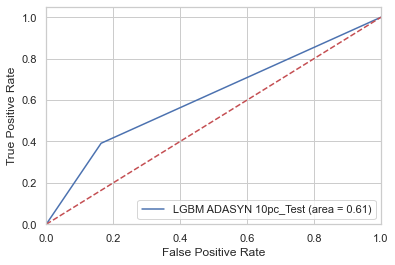

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


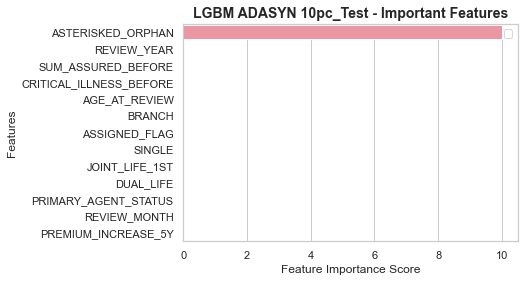

Best parameters LGBM SMOTE ('30pc_Test',): {'clf__learning_rate': 0.01, 'clf__max_depth': 1, 'clf__n_estimators': 10, 'clf__num_leaves': 5}
LGBM SMOTE_70pc_Train F1 Score : 22.84%
LGBM SMOTE_30pc_Test F1 Score : 27.35%


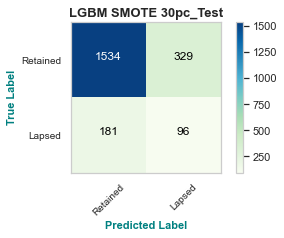

LGBM SMOTE 30pc_Test - Classification Report
              precision    recall  f1-score   support

         0.0       0.89      0.82      0.86      1863
         1.0       0.23      0.35      0.27       277

    accuracy                           0.76      2140
   macro avg       0.56      0.58      0.57      2140
weighted avg       0.81      0.76      0.78      2140



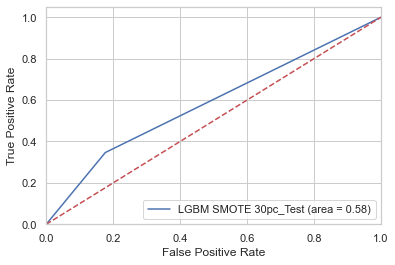

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


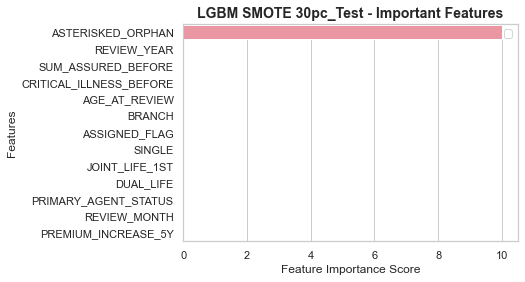

Best parameters LGBM SMOTE ('20pc_Test',): {'clf__learning_rate': 0.01, 'clf__max_depth': 1, 'clf__n_estimators': 10, 'clf__num_leaves': 5}
LGBM SMOTE_80pc_Train F1 Score : 22.34%
LGBM SMOTE_20pc_Test F1 Score : 31.49%


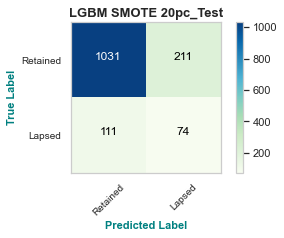

LGBM SMOTE 20pc_Test - Classification Report
              precision    recall  f1-score   support

         0.0       0.90      0.83      0.86      1242
         1.0       0.26      0.40      0.31       185

    accuracy                           0.77      1427
   macro avg       0.58      0.62      0.59      1427
weighted avg       0.82      0.77      0.79      1427



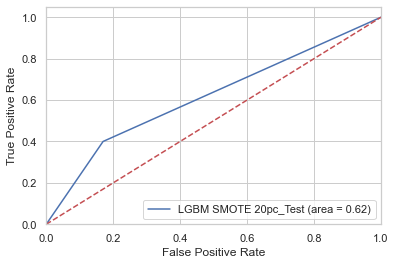

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


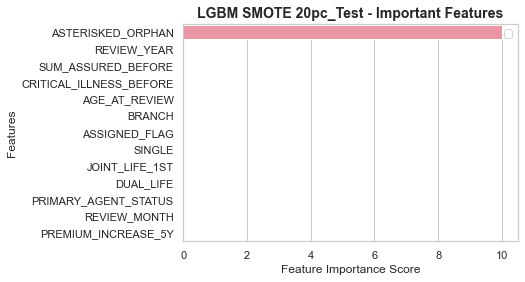

Best parameters LGBM SMOTE ('10pc_Test',): {'clf__learning_rate': 0.01, 'clf__max_depth': 1, 'clf__n_estimators': 10, 'clf__num_leaves': 5}
LGBM SMOTE_90pc_Train F1 Score : 23.43%
LGBM SMOTE_10pc_Test F1 Score : 31.30%


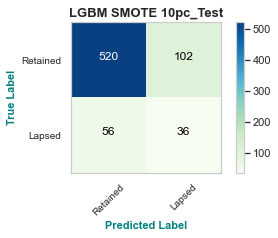

LGBM SMOTE 10pc_Test - Classification Report
              precision    recall  f1-score   support

         0.0       0.90      0.84      0.87       622
         1.0       0.26      0.39      0.31        92

    accuracy                           0.78       714
   macro avg       0.58      0.61      0.59       714
weighted avg       0.82      0.78      0.80       714



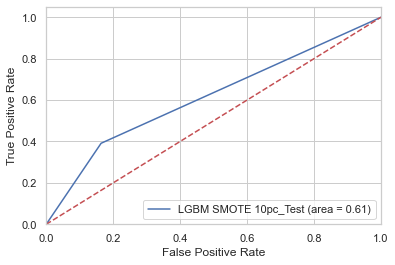

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


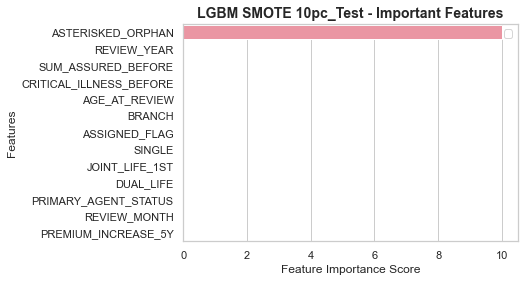

Best parameters LGBM BLSMOTE ('30pc_Test',): {'clf__learning_rate': 0.01, 'clf__max_depth': 1, 'clf__n_estimators': 100, 'clf__num_leaves': 5}
LGBM BLSMOTE_70pc_Train F1 Score : 24.43%
LGBM BLSMOTE_30pc_Test F1 Score : 27.00%


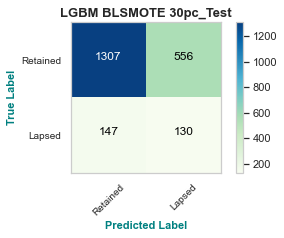

LGBM BLSMOTE 30pc_Test - Classification Report
              precision    recall  f1-score   support

         0.0       0.90      0.70      0.79      1863
         1.0       0.19      0.47      0.27       277

    accuracy                           0.67      2140
   macro avg       0.54      0.59      0.53      2140
weighted avg       0.81      0.67      0.72      2140



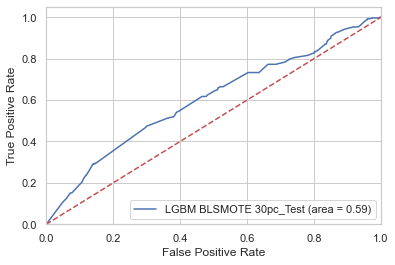

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


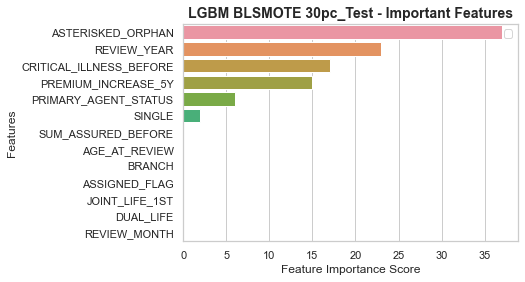

Best parameters LGBM BLSMOTE ('20pc_Test',): {'clf__learning_rate': 0.01, 'clf__max_depth': 1, 'clf__n_estimators': 100, 'clf__num_leaves': 5}
LGBM BLSMOTE_80pc_Train F1 Score : 22.15%
LGBM BLSMOTE_20pc_Test F1 Score : 30.63%


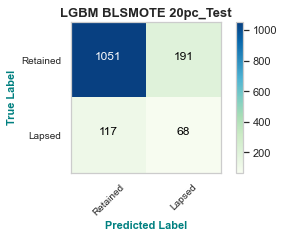

LGBM BLSMOTE 20pc_Test - Classification Report
              precision    recall  f1-score   support

         0.0       0.90      0.85      0.87      1242
         1.0       0.26      0.37      0.31       185

    accuracy                           0.78      1427
   macro avg       0.58      0.61      0.59      1427
weighted avg       0.82      0.78      0.80      1427



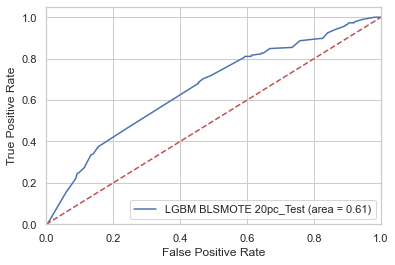

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


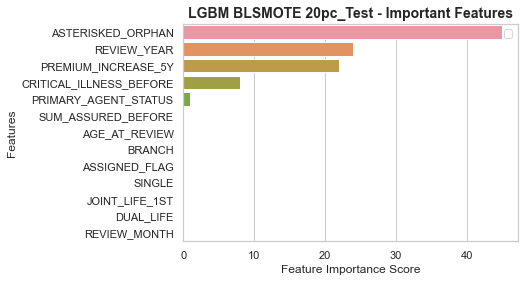

Best parameters LGBM BLSMOTE ('10pc_Test',): {'clf__learning_rate': 0.01, 'clf__max_depth': 1, 'clf__n_estimators': 10, 'clf__num_leaves': 5}
LGBM BLSMOTE_90pc_Train F1 Score : 23.43%
LGBM BLSMOTE_10pc_Test F1 Score : 31.30%


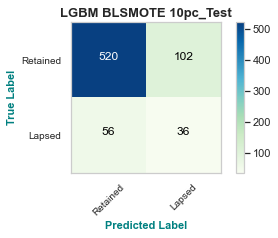

LGBM BLSMOTE 10pc_Test - Classification Report
              precision    recall  f1-score   support

         0.0       0.90      0.84      0.87       622
         1.0       0.26      0.39      0.31        92

    accuracy                           0.78       714
   macro avg       0.58      0.61      0.59       714
weighted avg       0.82      0.78      0.80       714



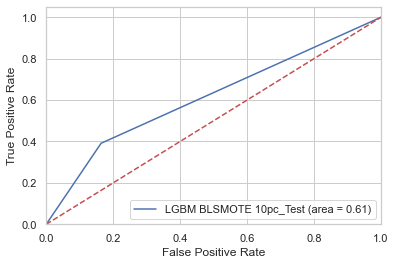

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


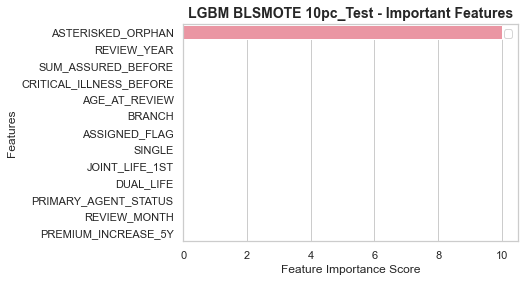

Best parameters LGBM SMOTETomek ('30pc_Test',): {'clf__learning_rate': 0.01, 'clf__max_depth': 1, 'clf__n_estimators': 100, 'clf__num_leaves': 5}
LGBM SMOTETomek_70pc_Train F1 Score : 22.16%
LGBM SMOTETomek_30pc_Test F1 Score : 26.11%


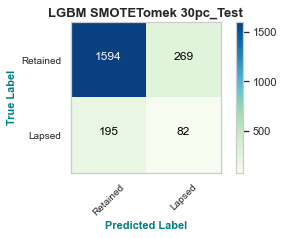

LGBM SMOTETomek 30pc_Test - Classification Report
              precision    recall  f1-score   support

         0.0       0.89      0.86      0.87      1863
         1.0       0.23      0.30      0.26       277

    accuracy                           0.78      2140
   macro avg       0.56      0.58      0.57      2140
weighted avg       0.81      0.78      0.79      2140



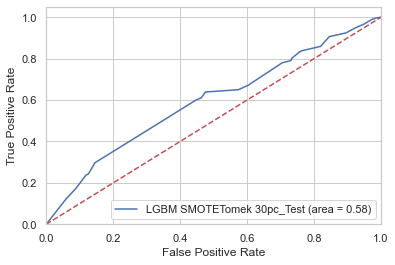

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


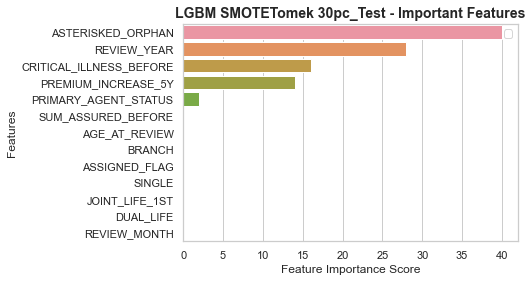

Best parameters LGBM SMOTETomek ('20pc_Test',): {'clf__learning_rate': 0.01, 'clf__max_depth': 1, 'clf__n_estimators': 100, 'clf__num_leaves': 5}
LGBM SMOTETomek_80pc_Train F1 Score : 22.20%
LGBM SMOTETomek_20pc_Test F1 Score : 30.70%


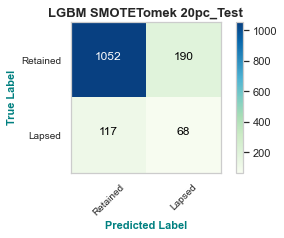

LGBM SMOTETomek 20pc_Test - Classification Report
              precision    recall  f1-score   support

         0.0       0.90      0.85      0.87      1242
         1.0       0.26      0.37      0.31       185

    accuracy                           0.78      1427
   macro avg       0.58      0.61      0.59      1427
weighted avg       0.82      0.78      0.80      1427



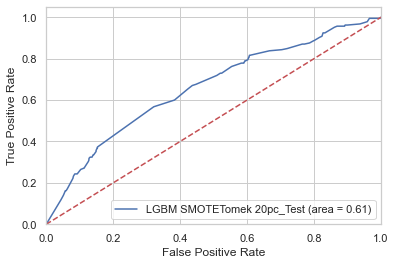

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


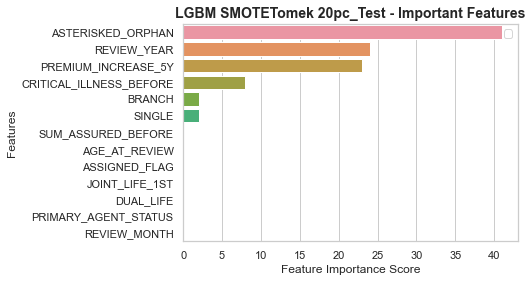

Best parameters LGBM SMOTETomek ('10pc_Test',): {'clf__learning_rate': 0.01, 'clf__max_depth': 1, 'clf__n_estimators': 10, 'clf__num_leaves': 5}
LGBM SMOTETomek_90pc_Train F1 Score : 23.43%
LGBM SMOTETomek_10pc_Test F1 Score : 31.30%


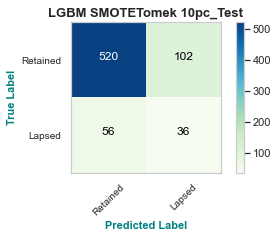

LGBM SMOTETomek 10pc_Test - Classification Report
              precision    recall  f1-score   support

         0.0       0.90      0.84      0.87       622
         1.0       0.26      0.39      0.31        92

    accuracy                           0.78       714
   macro avg       0.58      0.61      0.59       714
weighted avg       0.82      0.78      0.80       714



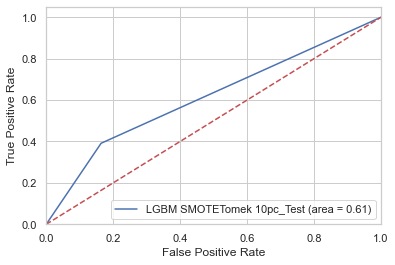

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


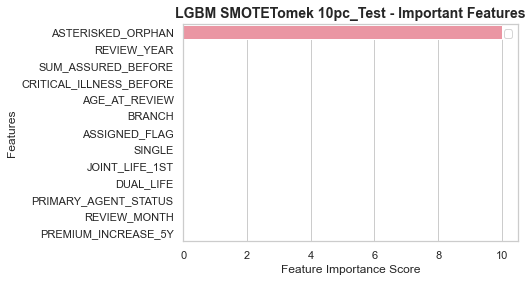

Best parameters LGBM SMOTEENN ('30pc_Test',): {'clf__learning_rate': 0.01, 'clf__max_depth': 2, 'clf__n_estimators': 100, 'clf__num_leaves': 5}
LGBM SMOTEENN_70pc_Train F1 Score : 26.08%
LGBM SMOTEENN_30pc_Test F1 Score : 24.50%


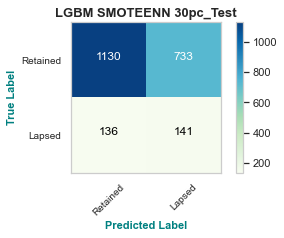

LGBM SMOTEENN 30pc_Test - Classification Report
              precision    recall  f1-score   support

         0.0       0.89      0.61      0.72      1863
         1.0       0.16      0.51      0.25       277

    accuracy                           0.59      2140
   macro avg       0.53      0.56      0.48      2140
weighted avg       0.80      0.59      0.66      2140



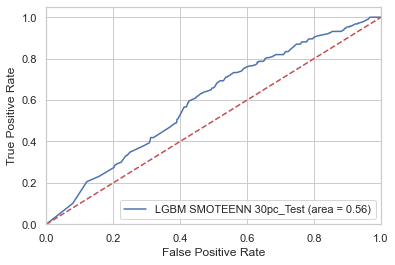

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


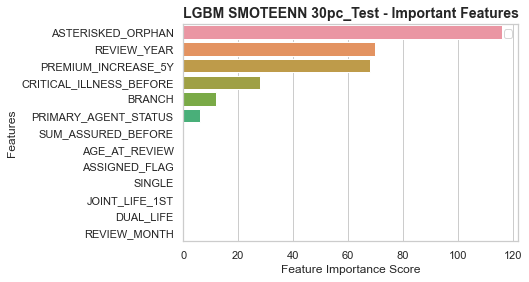

Best parameters LGBM SMOTEENN ('20pc_Test',): {'clf__learning_rate': 0.01, 'clf__max_depth': 1, 'clf__n_estimators': 100, 'clf__num_leaves': 5}
LGBM SMOTEENN_80pc_Train F1 Score : 25.96%
LGBM SMOTEENN_20pc_Test F1 Score : 27.12%


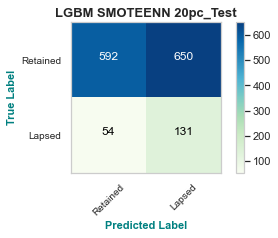

LGBM SMOTEENN 20pc_Test - Classification Report
              precision    recall  f1-score   support

         0.0       0.92      0.48      0.63      1242
         1.0       0.17      0.71      0.27       185

    accuracy                           0.51      1427
   macro avg       0.54      0.59      0.45      1427
weighted avg       0.82      0.51      0.58      1427



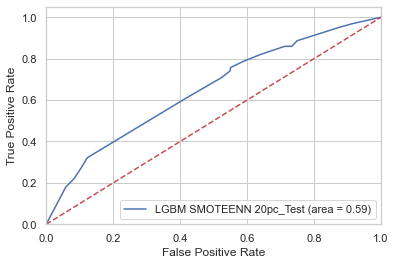

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


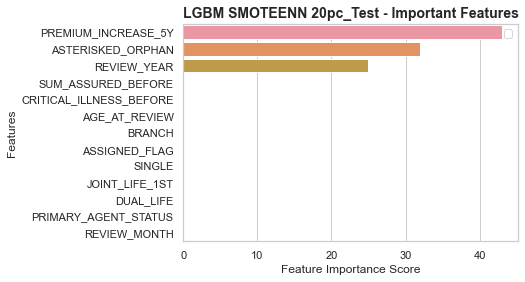

Best parameters LGBM SMOTEENN ('10pc_Test',): {'clf__learning_rate': 0.01, 'clf__max_depth': 5, 'clf__n_estimators': 10, 'clf__num_leaves': 10}
LGBM SMOTEENN_90pc_Train F1 Score : 25.65%
LGBM SMOTEENN_10pc_Test F1 Score : 27.62%


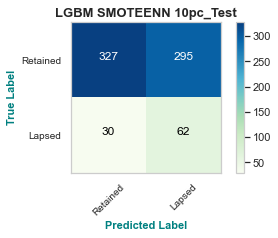

LGBM SMOTEENN 10pc_Test - Classification Report
              precision    recall  f1-score   support

         0.0       0.92      0.53      0.67       622
         1.0       0.17      0.67      0.28        92

    accuracy                           0.54       714
   macro avg       0.54      0.60      0.47       714
weighted avg       0.82      0.54      0.62       714



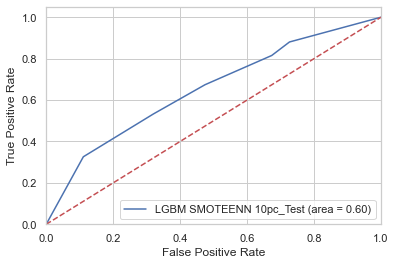

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


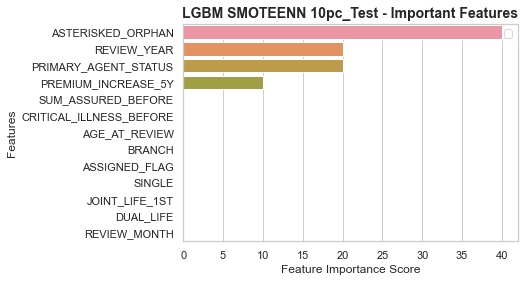

Best parameters LGBM RUS ('30pc_Test',): {'clf__learning_rate': 0.01, 'clf__max_depth': 4, 'clf__n_estimators': 10, 'clf__num_leaves': 10}
LGBM RUS_70pc_Train F1 Score : 25.92%
LGBM RUS_30pc_Test F1 Score : 25.09%


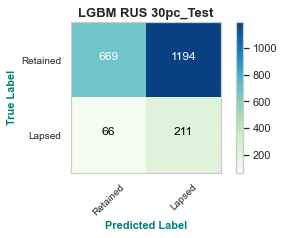

LGBM RUS 30pc_Test - Classification Report
              precision    recall  f1-score   support

         0.0       0.91      0.36      0.52      1863
         1.0       0.15      0.76      0.25       277

    accuracy                           0.41      2140
   macro avg       0.53      0.56      0.38      2140
weighted avg       0.81      0.41      0.48      2140



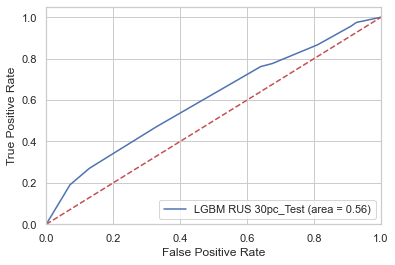

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


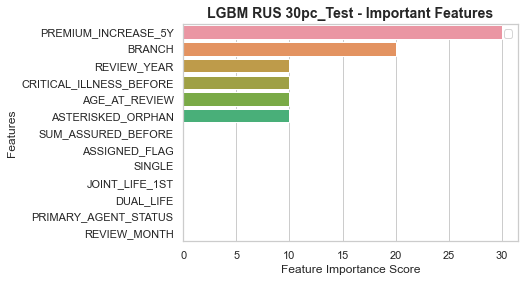

Best parameters LGBM RUS ('20pc_Test',): {'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__n_estimators': 100, 'clf__num_leaves': 10}
LGBM RUS_80pc_Train F1 Score : 28.44%
LGBM RUS_20pc_Test F1 Score : 29.69%


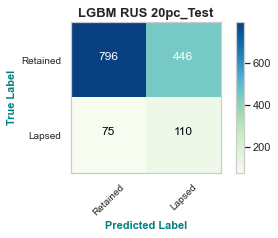

LGBM RUS 20pc_Test - Classification Report
              precision    recall  f1-score   support

         0.0       0.91      0.64      0.75      1242
         1.0       0.20      0.59      0.30       185

    accuracy                           0.63      1427
   macro avg       0.56      0.62      0.53      1427
weighted avg       0.82      0.63      0.69      1427



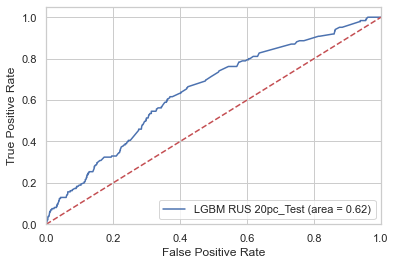

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


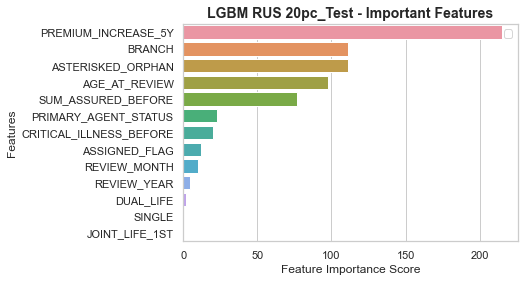

Best parameters LGBM RUS ('10pc_Test',): {'clf__learning_rate': 0.01, 'clf__max_depth': 2, 'clf__n_estimators': 100, 'clf__num_leaves': 5}
LGBM RUS_90pc_Train F1 Score : 28.79%
LGBM RUS_10pc_Test F1 Score : 28.00%


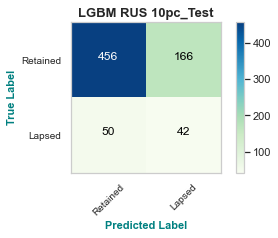

LGBM RUS 10pc_Test - Classification Report
              precision    recall  f1-score   support

         0.0       0.90      0.73      0.81       622
         1.0       0.20      0.46      0.28        92

    accuracy                           0.70       714
   macro avg       0.55      0.59      0.54       714
weighted avg       0.81      0.70      0.74       714



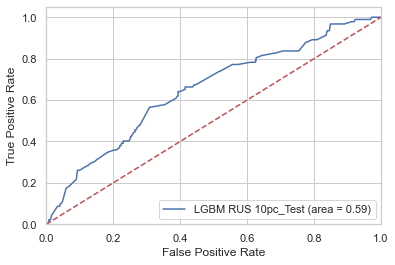

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


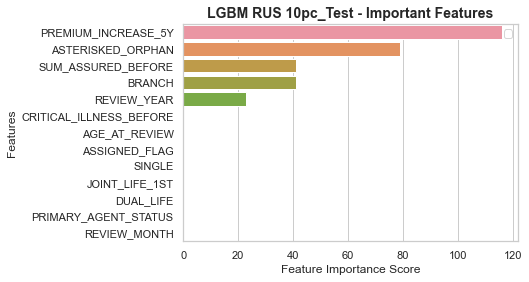

Best parameters LGBM NM1 ('30pc_Test',): {'clf__learning_rate': 1, 'clf__max_depth': 1, 'clf__n_estimators': 10, 'clf__num_leaves': 5}
LGBM NM1_70pc_Train F1 Score : 25.89%
LGBM NM1_30pc_Test F1 Score : 26.10%


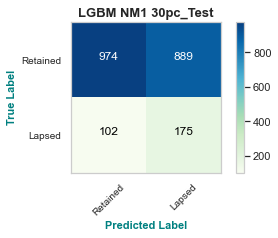

LGBM NM1 30pc_Test - Classification Report
              precision    recall  f1-score   support

         0.0       0.91      0.52      0.66      1863
         1.0       0.16      0.63      0.26       277

    accuracy                           0.54      2140
   macro avg       0.53      0.58      0.46      2140
weighted avg       0.81      0.54      0.61      2140



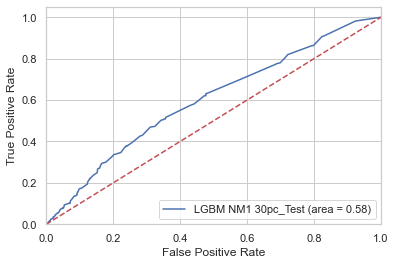

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


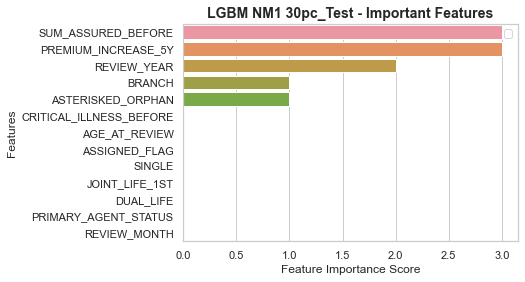

Best parameters LGBM NM1 ('20pc_Test',): {'clf__learning_rate': 1, 'clf__max_depth': 1, 'clf__n_estimators': 10, 'clf__num_leaves': 5}
LGBM NM1_80pc_Train F1 Score : 25.27%
LGBM NM1_20pc_Test F1 Score : 26.40%


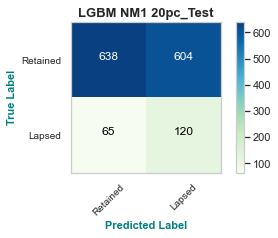

LGBM NM1 20pc_Test - Classification Report
              precision    recall  f1-score   support

         0.0       0.91      0.51      0.66      1242
         1.0       0.17      0.65      0.26       185

    accuracy                           0.53      1427
   macro avg       0.54      0.58      0.46      1427
weighted avg       0.81      0.53      0.61      1427



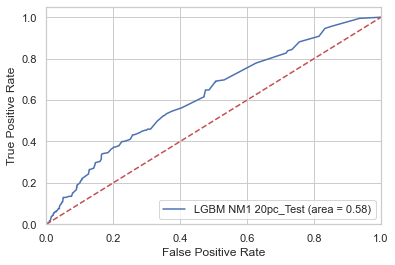

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


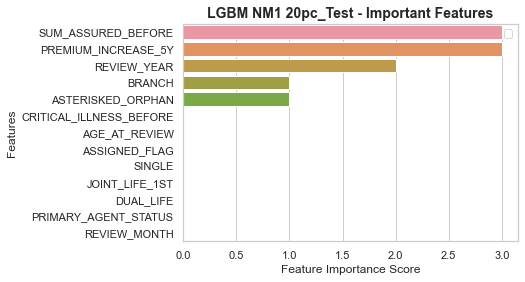

Best parameters LGBM NM1 ('10pc_Test',): {'clf__learning_rate': 1, 'clf__max_depth': 1, 'clf__n_estimators': 10, 'clf__num_leaves': 5}
LGBM NM1_90pc_Train F1 Score : 25.70%
LGBM NM1_10pc_Test F1 Score : 26.81%


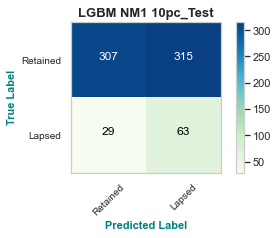

LGBM NM1 10pc_Test - Classification Report
              precision    recall  f1-score   support

         0.0       0.91      0.49      0.64       622
         1.0       0.17      0.68      0.27        92

    accuracy                           0.52       714
   macro avg       0.54      0.59      0.45       714
weighted avg       0.82      0.52      0.59       714



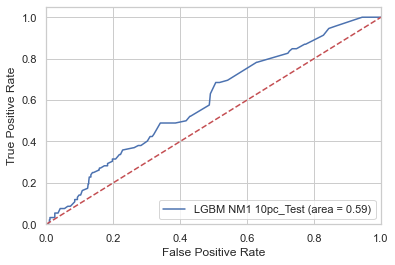

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


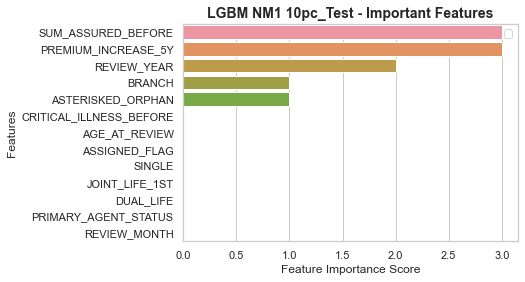

Best parameters LGBM NM2 ('30pc_Test',): {'clf__learning_rate': 1, 'clf__max_depth': 6, 'clf__n_estimators': 50, 'clf__num_leaves': 10}
LGBM NM2_70pc_Train F1 Score : 26.00%
LGBM NM2_30pc_Test F1 Score : 21.45%


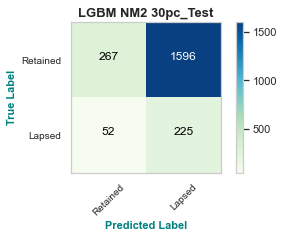

LGBM NM2 30pc_Test - Classification Report
              precision    recall  f1-score   support

         0.0       0.84      0.14      0.24      1863
         1.0       0.12      0.81      0.21       277

    accuracy                           0.23      2140
   macro avg       0.48      0.48      0.23      2140
weighted avg       0.74      0.23      0.24      2140



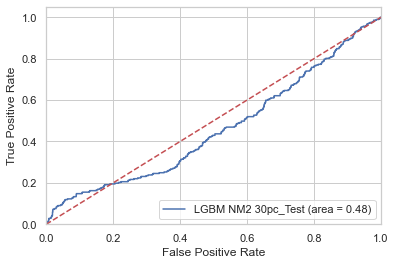

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


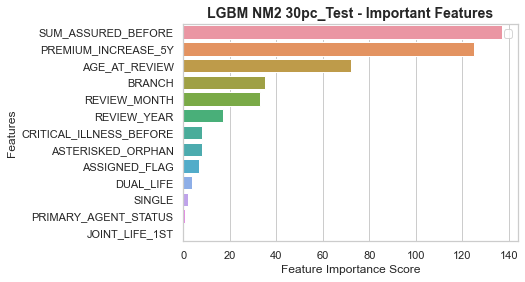

Best parameters LGBM NM2 ('20pc_Test',): {'clf__learning_rate': 1, 'clf__max_depth': 4, 'clf__n_estimators': 50, 'clf__num_leaves': 10}
LGBM NM2_80pc_Train F1 Score : 25.97%
LGBM NM2_20pc_Test F1 Score : 21.12%


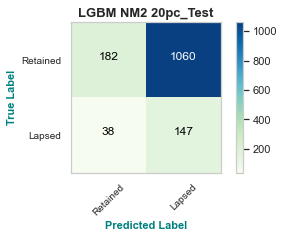

LGBM NM2 20pc_Test - Classification Report
              precision    recall  f1-score   support

         0.0       0.83      0.15      0.25      1242
         1.0       0.12      0.79      0.21       185

    accuracy                           0.23      1427
   macro avg       0.47      0.47      0.23      1427
weighted avg       0.74      0.23      0.24      1427



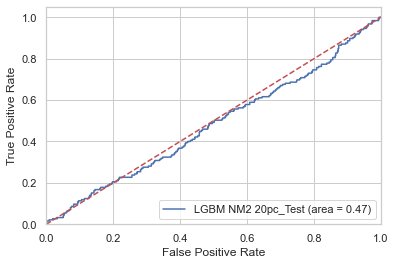

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


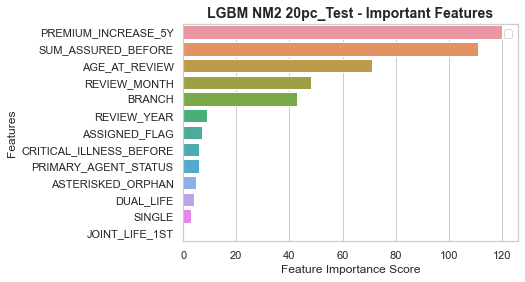

Best parameters LGBM NM2 ('10pc_Test',): {'clf__learning_rate': 1, 'clf__max_depth': 7, 'clf__n_estimators': 10, 'clf__num_leaves': 10}
LGBM NM2_90pc_Train F1 Score : 24.24%
LGBM NM2_10pc_Test F1 Score : 20.09%


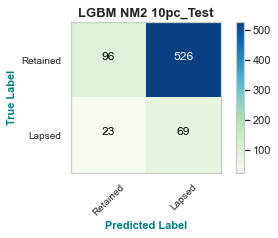

LGBM NM2 10pc_Test - Classification Report
              precision    recall  f1-score   support

         0.0       0.81      0.15      0.26       622
         1.0       0.12      0.75      0.20        92

    accuracy                           0.23       714
   macro avg       0.46      0.45      0.23       714
weighted avg       0.72      0.23      0.25       714



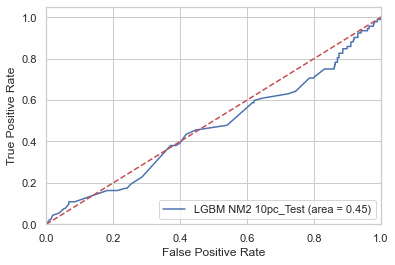

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


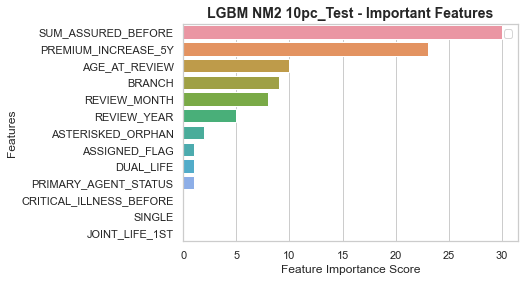

Best parameters LGBM NM3 ('30pc_Test',): {'clf__learning_rate': 1, 'clf__max_depth': 4, 'clf__n_estimators': 10, 'clf__num_leaves': 5}
LGBM NM3_70pc_Train F1 Score : 28.78%
LGBM NM3_30pc_Test F1 Score : 24.42%


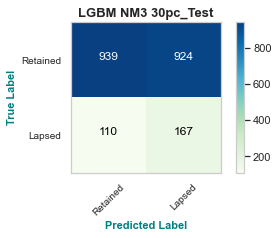

LGBM NM3 30pc_Test - Classification Report
              precision    recall  f1-score   support

         0.0       0.90      0.50      0.64      1863
         1.0       0.15      0.60      0.24       277

    accuracy                           0.52      2140
   macro avg       0.52      0.55      0.44      2140
weighted avg       0.80      0.52      0.59      2140



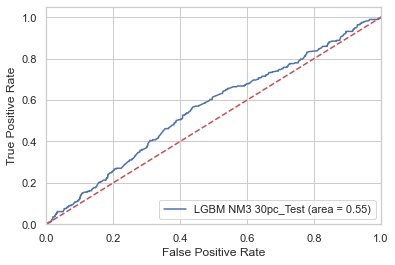

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


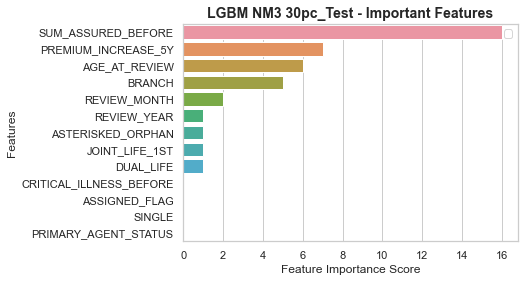

Best parameters LGBM NM3 ('20pc_Test',): {'clf__learning_rate': 1, 'clf__max_depth': 1, 'clf__n_estimators': 50, 'clf__num_leaves': 5}
LGBM NM3_80pc_Train F1 Score : 25.92%
LGBM NM3_20pc_Test F1 Score : 23.95%


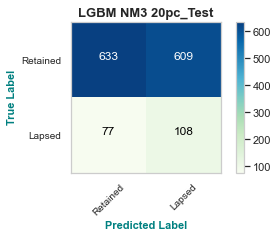

LGBM NM3 20pc_Test - Classification Report
              precision    recall  f1-score   support

         0.0       0.89      0.51      0.65      1242
         1.0       0.15      0.58      0.24       185

    accuracy                           0.52      1427
   macro avg       0.52      0.55      0.44      1427
weighted avg       0.80      0.52      0.60      1427



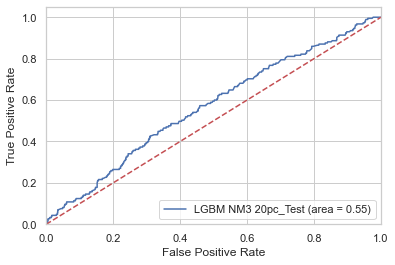

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


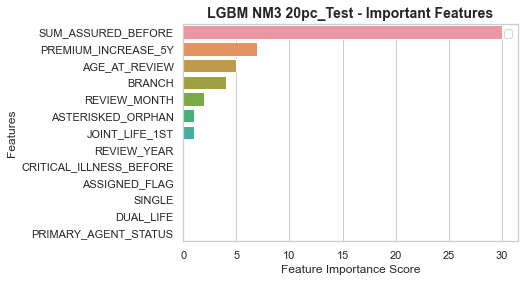

Best parameters LGBM NM3 ('10pc_Test',): {'clf__learning_rate': 1, 'clf__max_depth': 4, 'clf__n_estimators': 10, 'clf__num_leaves': 5}
LGBM NM3_90pc_Train F1 Score : 28.30%
LGBM NM3_10pc_Test F1 Score : 26.75%


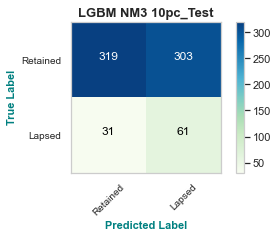

LGBM NM3 10pc_Test - Classification Report
              precision    recall  f1-score   support

         0.0       0.91      0.51      0.66       622
         1.0       0.17      0.66      0.27        92

    accuracy                           0.53       714
   macro avg       0.54      0.59      0.46       714
weighted avg       0.82      0.53      0.61       714



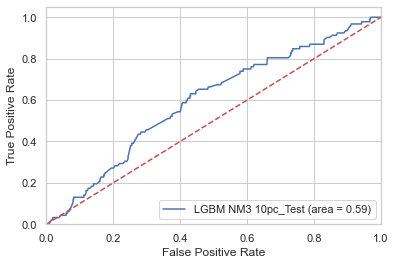

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


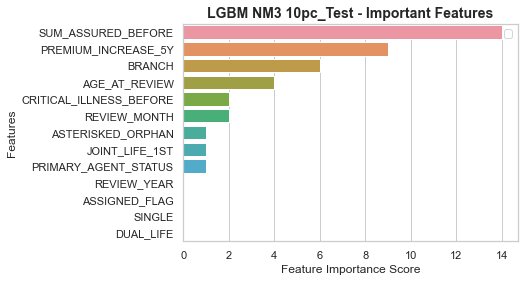

In [47]:
model_name = "LGBM"
clf = lgb.LGBMClassifier()

for train_name, test_name, X_train, y_train, X_test,y_test in zip(train_names,test_names, X_training_splits, y_training_splits, X_testing_splits, y_testing_splits):
    
    model = clf
    method = "IMB"
    param_grid = {'num_leaves':[1,5,10],
                  'max_depth':range(1,4),
                  'learning_rate': [0.01,0.1,1],
                      'n_estimators': [10, 50, 100]}
    stratified_kfold = StratifiedKFold(n_splits=5,shuffle=True,random_state=11)
    gs = GridSearchCV(estimator=model,
                      param_grid=param_grid,
                      scoring='f1',
                      cv=stratified_kfold,
                      n_jobs=-1)
    gs.fit(X_train,y_train)

    # Print the best parameters and best score obtained during the grid search
    print(f'Best parameters {model_name} {method} {test_name,}:', gs.best_params_)
    
    best_model = gs.best_estimator_
    # Call fit() method to train the model
    best_model.fit(X_train,y_train)
    # Predict the results
    y_train_predict = best_model.predict(X_train)
    y_predict = best_model.predict(X_test)
    
    exec(f'{model_name}_roc_auc_{method}_{train_name} =  roc_auc_score(y_train,y_train_predict)')
    exec(f'{model_name}_a_{method}_{train_name} = metrics.accuracy_score(y_train,y_train_predict)') 
    exec(f'{model_name}_p_{method}_{train_name} = metrics.precision_score(y_train,y_train_predict)') 
    exec(f'{model_name}_r_{method}_{train_name}  = metrics.recall_score(y_train,y_train_predict)') 
    exec(f'{model_name}_f1_{method}_{train_name} = metrics.f1_score(y_train,y_train_predict)')
    print(f'{model_name} {method}_{train_name} F1 Score : %.2f%%' % (metrics.f1_score(y_train, y_train_predict) * 100.0))

    # Call fit() method to train the model
    # Predict the results
    
    
    exec(f'{model_name}_roc_auc_{method}_{test_name} =  roc_auc_score(y_test,y_predict)')
    exec(f'{model_name}_a_{method}_{test_name} = metrics.accuracy_score(y_test, y_predict)') 
    exec(f'{model_name}_p_{method}_{test_name} = metrics.precision_score(y_test, y_predict)') 
    exec(f'{model_name}_r_{method}_{test_name}  = metrics.recall_score(y_test, y_predict)') 
    exec(f'{model_name}_f1_{method}_{test_name} = metrics.f1_score(y_test, y_predict)')
    print(f'{model_name} {method}_{test_name} F1 Score : %.2f%%' % (metrics.f1_score(y_test, y_predict) * 100.0))
 

 
     # Compute confusion matrix
    cnf_matrix = confusion_matrix(y_test, y_predict)
    # Plot non-normalized confusion matrix
    plt.figure(figsize = (5, 3.5))
    plot_confusion_matrix(cnf_matrix, classes = class_names)
    plt.title(f'{model_name} {method} {test_name}',fontsize = 13, fontweight = "bold")
    plt.show()

    # print the classification_report based on y_test and y_predict) 
    print(f'{model_name} {method} {test_name} - Classification Report')
    print(classification_report(y_test, y_predict))

    roc_auc_curve(y_test,best_model,method,test_name,X_test)
    feature_importance(best_model,model_name, method, test_name)
    


for train_name, test_name, X_train, y_train, X_test,y_test in zip(train_names,test_names, X_training_splits, y_training_splits, X_testing_splits, y_testing_splits):
    
    model = clf
    method = "CWB"
    param_grid = {'num_leaves':[1,5,10],
                  'max_depth':range(1,4),
                  'learning_rate': [0.01,0.1,1],
                      'n_estimators': [10, 50, 100],'class_weight':["balanced"]}
    stratified_kfold = StratifiedKFold(n_splits=5,shuffle=True,random_state=11)
    gs = GridSearchCV(estimator=model,
                      param_grid=param_grid,
                      scoring='f1',
                      cv=stratified_kfold,
                      n_jobs=-1)
    gs.fit(X_train,y_train)

    # Print the best parameters and best score obtained during the grid search
    print(f'Best parameters {model_name} {method} {test_name,}:', gs.best_params_)
    
    best_model = gs.best_estimator_
    # Call fit() method to train the model
    best_model.fit(X_train,y_train)
    # Predict the results
    y_train_predict = best_model.predict(X_train)
    y_predict = best_model.predict(X_test)
    
    exec(f'{model_name}_roc_auc_{method}_{train_name} =  roc_auc_score(y_train,y_train_predict)')
    exec(f'{model_name}_a_{method}_{train_name} = metrics.accuracy_score(y_train,y_train_predict)') 
    exec(f'{model_name}_p_{method}_{train_name} = metrics.precision_score(y_train,y_train_predict)') 
    exec(f'{model_name}_r_{method}_{train_name}  = metrics.recall_score(y_train,y_train_predict)') 
    exec(f'{model_name}_f1_{method}_{train_name} = metrics.f1_score(y_train,y_train_predict)')
    print(f'{model_name} {method}_{train_name} F1 Score : %.2f%%' % (metrics.f1_score(y_train, y_train_predict) * 100.0))

    # Call fit() method to train the model
    # Predict the results
    
    
    exec(f'{model_name}_roc_auc_{method}_{test_name} =  roc_auc_score(y_test,y_predict)')
    exec(f'{model_name}_a_{method}_{test_name} = metrics.accuracy_score(y_test, y_predict)') 
    exec(f'{model_name}_p_{method}_{test_name} = metrics.precision_score(y_test, y_predict)') 
    exec(f'{model_name}_r_{method}_{test_name}  = metrics.recall_score(y_test, y_predict)') 
    exec(f'{model_name}_f1_{method}_{test_name} = metrics.f1_score(y_test, y_predict)')
    print(f'{model_name} {method}_{test_name} F1 Score : %.2f%%' % (metrics.f1_score(y_test, y_predict) * 100.0))
 

 
     # Compute confusion matrix
    cnf_matrix = confusion_matrix(y_test, y_predict)
    # Plot non-normalized confusion matrix
    plt.figure(figsize = (5, 3.5))
    plot_confusion_matrix(cnf_matrix, classes = class_names)
    plt.title(f'{model_name} {method} {test_name}',fontsize = 13, fontweight = "bold")
    plt.show()

    # print the classification_report based on y_test and y_predict) 
    print(f'{model_name} {method} {test_name} - Classification Report')
    print(classification_report(y_test, y_predict))

    roc_auc_curve(y_test,best_model,method,test_name,X_test)
    feature_importance(best_model,model_name, method, test_name)

for method,resampler in zip(resampler_names,resamplers):
    for train_name, test_name, X_train, y_train, X_test,y_test in zip(train_names,test_names, X_training_splits, y_training_splits, X_testing_splits, y_testing_splits):
        
        model = Pipeline([('resampler', resampler),
                     ('mms', MinMaxScaler()),
                     ('clf',clf)])
        
        param_grid = {'clf__num_leaves':[1,5,10],
                      'clf__max_depth':range(1,11),'clf__learning_rate': [0.01,1, 1],
                      'clf__n_estimators': [10, 50, 100]}

        stratified_kfold = StratifiedKFold(n_splits=5,shuffle=True,random_state=11)
        gs = GridSearchCV(estimator=model,
                          param_grid=param_grid,
                          scoring='f1',
                          cv=stratified_kfold,
                          n_jobs=-1)
        gs.fit(X_train,y_train)

        # Print the best parameters and best score obtained during the grid search
        print(f'Best parameters {model_name} {method} {test_name,}:', gs.best_params_)

        best_model = gs.best_estimator_
        # Call fit() method to train the model
        best_model.fit(X_train,y_train)
        # Predict the results
        y_train_predict = best_model.predict(X_train)
        y_predict = best_model.predict(X_test)

        exec(f'{model_name}_roc_auc_{method}_{train_name} =  roc_auc_score(y_train,y_train_predict)')
        exec(f'{model_name}_a_{method}_{train_name} = metrics.accuracy_score(y_train,y_train_predict)') 
        exec(f'{model_name}_p_{method}_{train_name} = metrics.precision_score(y_train,y_train_predict)') 
        exec(f'{model_name}_r_{method}_{train_name}  = metrics.recall_score(y_train,y_train_predict)') 
        exec(f'{model_name}_f1_{method}_{train_name} = metrics.f1_score(y_train,y_train_predict)')
        print(f'{model_name} {method}_{train_name} F1 Score : %.2f%%' % (metrics.f1_score(y_train, y_train_predict) * 100.0))

        # Call fit() method to train the model
        # Predict the results


        exec(f'{model_name}_roc_auc_{method}_{test_name} =  roc_auc_score(y_test,y_predict)')
        exec(f'{model_name}_a_{method}_{test_name} = metrics.accuracy_score(y_test, y_predict)') 
        exec(f'{model_name}_p_{method}_{test_name} = metrics.precision_score(y_test, y_predict)') 
        exec(f'{model_name}_r_{method}_{test_name}  = metrics.recall_score(y_test, y_predict)') 
        exec(f'{model_name}_f1_{method}_{test_name} = metrics.f1_score(y_test, y_predict)')
        print(f'{model_name} {method}_{test_name} F1 Score : %.2f%%' % (metrics.f1_score(y_test, y_predict) * 100.0))



         # Compute confusion matrix
        cnf_matrix = confusion_matrix(y_test, y_predict)
        # Plot non-normalized confusion matrix
        plt.figure(figsize = (5, 3.5))
        plot_confusion_matrix(cnf_matrix, classes = class_names)
        plt.title(f'{model_name} {method} {test_name}',fontsize = 13, fontweight = "bold")
        plt.show()

        # print the classification_report based on y_test and y_predict) 
        print(f'{model_name} {method} {test_name} - Classification Report')
        print(classification_report(y_test, y_predict))

        roc_auc_curve(y_test,best_model,method,test_name,X_test)
        feature_importance_pipe(best_model,model_name, method, test_name)

## AdaBoost Classifier

Best parameters ADA IMB ('30pc_Test',): {'learning_rate': 1, 'n_estimators': 100}
ADA IMB_70pc_Train F1 Score : 3.64%
ADA IMB_30pc_Test F1 Score : 0.00%


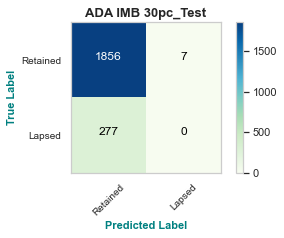

ADA IMB 30pc_Test - Classification Report
              precision    recall  f1-score   support

         0.0       0.87      1.00      0.93      1863
         1.0       0.00      0.00      0.00       277

    accuracy                           0.87      2140
   macro avg       0.44      0.50      0.46      2140
weighted avg       0.76      0.87      0.81      2140



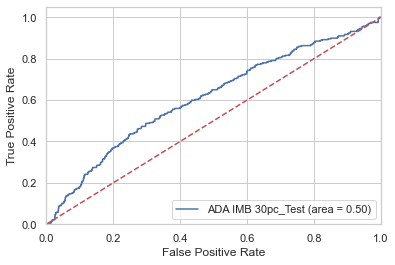

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


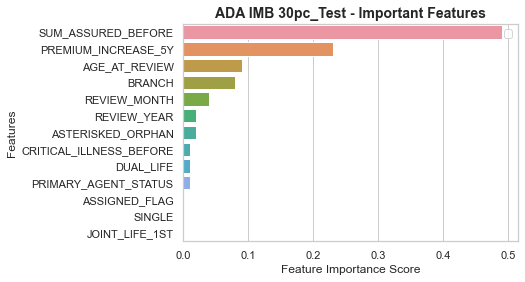

Best parameters ADA IMB ('20pc_Test',): {'learning_rate': 1, 'n_estimators': 100}
ADA IMB_80pc_Train F1 Score : 3.45%
ADA IMB_20pc_Test F1 Score : 0.00%


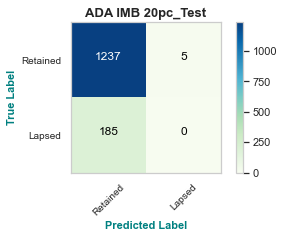

ADA IMB 20pc_Test - Classification Report
              precision    recall  f1-score   support

         0.0       0.87      1.00      0.93      1242
         1.0       0.00      0.00      0.00       185

    accuracy                           0.87      1427
   macro avg       0.43      0.50      0.46      1427
weighted avg       0.76      0.87      0.81      1427



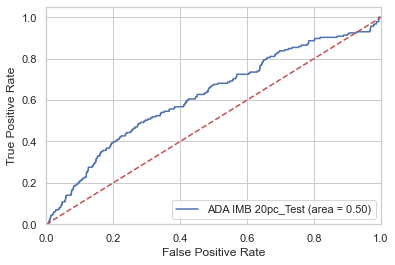

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


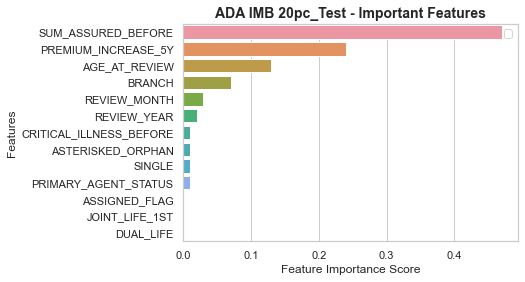

Best parameters ADA IMB ('10pc_Test',): {'learning_rate': 1, 'n_estimators': 50}
ADA IMB_90pc_Train F1 Score : 1.67%
ADA IMB_10pc_Test F1 Score : 0.00%


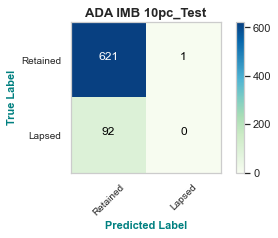

ADA IMB 10pc_Test - Classification Report
              precision    recall  f1-score   support

         0.0       0.87      1.00      0.93       622
         1.0       0.00      0.00      0.00        92

    accuracy                           0.87       714
   macro avg       0.44      0.50      0.47       714
weighted avg       0.76      0.87      0.81       714



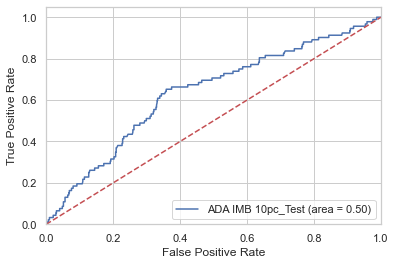

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


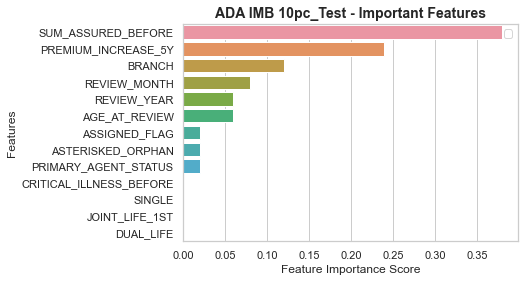

Best parameters ADA ROS ('30pc_Test',): {'clf__learning_rate': 0.01, 'clf__n_estimators': 100}
ADA ROS_70pc_Train F1 Score : 27.59%
ADA ROS_30pc_Test F1 Score : 29.08%


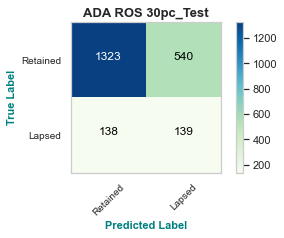

ADA ROS 30pc_Test - Classification Report
              precision    recall  f1-score   support

         0.0       0.91      0.71      0.80      1863
         1.0       0.20      0.50      0.29       277

    accuracy                           0.68      2140
   macro avg       0.56      0.61      0.54      2140
weighted avg       0.81      0.68      0.73      2140



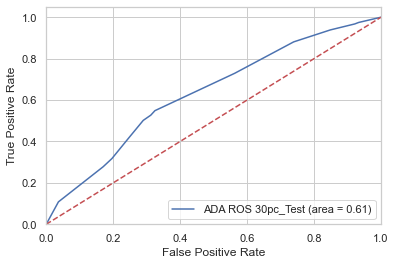

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


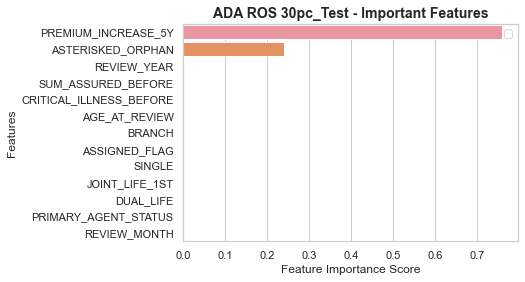

Best parameters ADA ROS ('20pc_Test',): {'clf__learning_rate': 0.01, 'clf__n_estimators': 100}
ADA ROS_80pc_Train F1 Score : 27.48%
ADA ROS_20pc_Test F1 Score : 30.44%


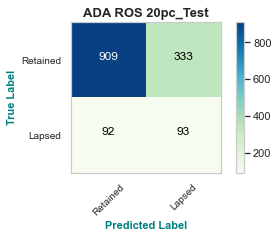

ADA ROS 20pc_Test - Classification Report
              precision    recall  f1-score   support

         0.0       0.91      0.73      0.81      1242
         1.0       0.22      0.50      0.30       185

    accuracy                           0.70      1427
   macro avg       0.56      0.62      0.56      1427
weighted avg       0.82      0.70      0.74      1427



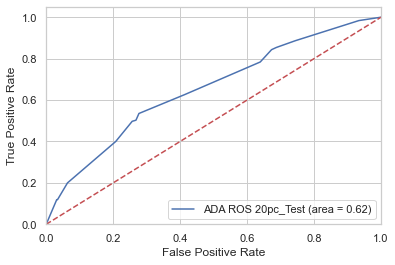

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


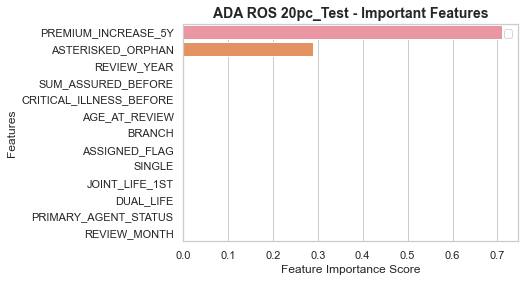

Best parameters ADA ROS ('10pc_Test',): {'clf__learning_rate': 0.01, 'clf__n_estimators': 100}
ADA ROS_90pc_Train F1 Score : 28.08%
ADA ROS_10pc_Test F1 Score : 31.30%


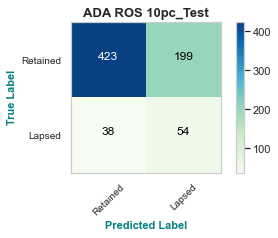

ADA ROS 10pc_Test - Classification Report
              precision    recall  f1-score   support

         0.0       0.92      0.68      0.78       622
         1.0       0.21      0.59      0.31        92

    accuracy                           0.67       714
   macro avg       0.57      0.63      0.55       714
weighted avg       0.83      0.67      0.72       714



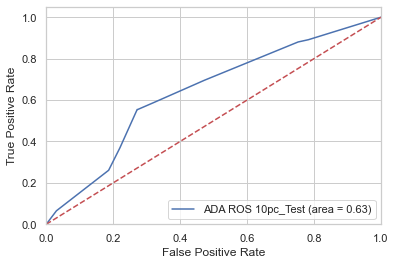

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


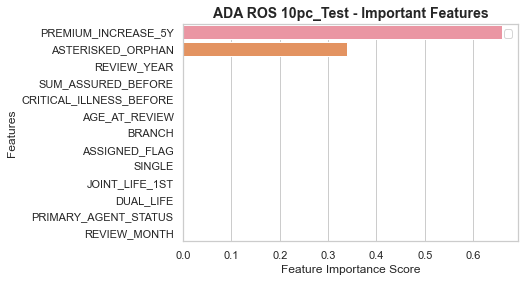

Best parameters ADA ADASYN ('30pc_Test',): {'clf__learning_rate': 0.1, 'clf__n_estimators': 10}
ADA ADASYN_70pc_Train F1 Score : 24.43%
ADA ADASYN_30pc_Test F1 Score : 25.90%


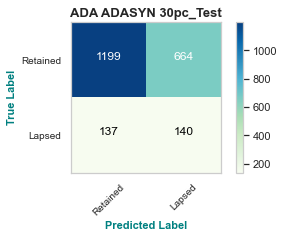

ADA ADASYN 30pc_Test - Classification Report
              precision    recall  f1-score   support

         0.0       0.90      0.64      0.75      1863
         1.0       0.17      0.51      0.26       277

    accuracy                           0.63      2140
   macro avg       0.54      0.57      0.50      2140
weighted avg       0.80      0.63      0.69      2140



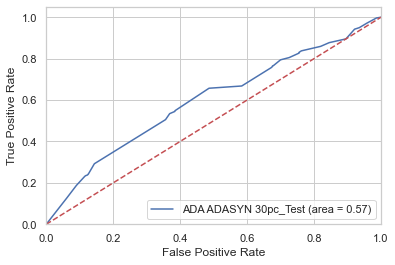

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


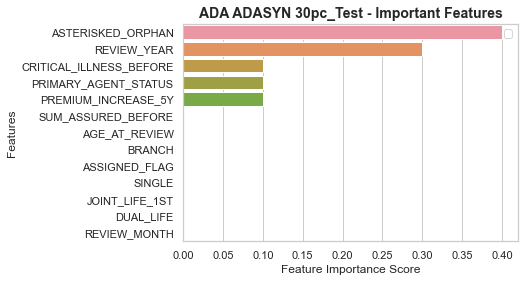

Best parameters ADA ADASYN ('20pc_Test',): {'clf__learning_rate': 0.01, 'clf__n_estimators': 10}
ADA ADASYN_80pc_Train F1 Score : 22.34%
ADA ADASYN_20pc_Test F1 Score : 31.49%


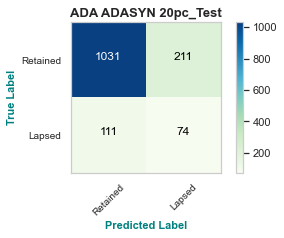

ADA ADASYN 20pc_Test - Classification Report
              precision    recall  f1-score   support

         0.0       0.90      0.83      0.86      1242
         1.0       0.26      0.40      0.31       185

    accuracy                           0.77      1427
   macro avg       0.58      0.62      0.59      1427
weighted avg       0.82      0.77      0.79      1427



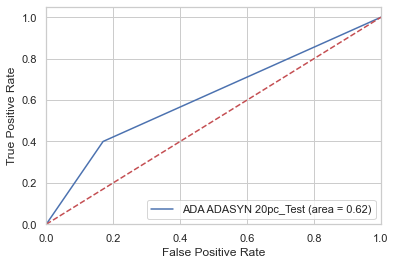

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


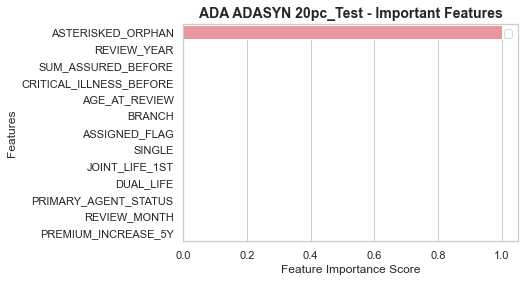

Best parameters ADA ADASYN ('10pc_Test',): {'clf__learning_rate': 0.01, 'clf__n_estimators': 10}
ADA ADASYN_90pc_Train F1 Score : 23.43%
ADA ADASYN_10pc_Test F1 Score : 31.30%


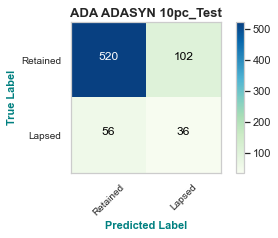

ADA ADASYN 10pc_Test - Classification Report
              precision    recall  f1-score   support

         0.0       0.90      0.84      0.87       622
         1.0       0.26      0.39      0.31        92

    accuracy                           0.78       714
   macro avg       0.58      0.61      0.59       714
weighted avg       0.82      0.78      0.80       714



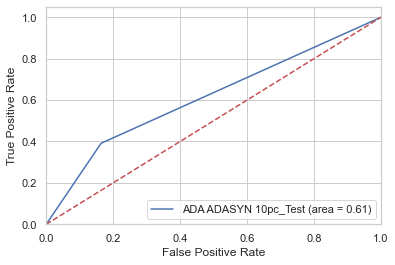

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


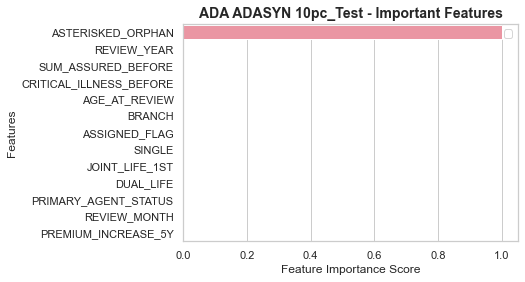

Best parameters ADA SMOTE ('30pc_Test',): {'clf__learning_rate': 0.01, 'clf__n_estimators': 10}
ADA SMOTE_70pc_Train F1 Score : 22.84%
ADA SMOTE_30pc_Test F1 Score : 27.35%


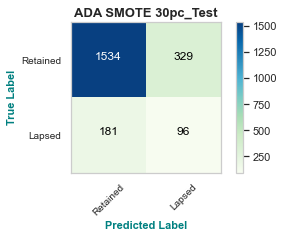

ADA SMOTE 30pc_Test - Classification Report
              precision    recall  f1-score   support

         0.0       0.89      0.82      0.86      1863
         1.0       0.23      0.35      0.27       277

    accuracy                           0.76      2140
   macro avg       0.56      0.58      0.57      2140
weighted avg       0.81      0.76      0.78      2140



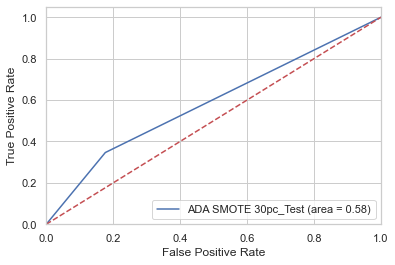

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


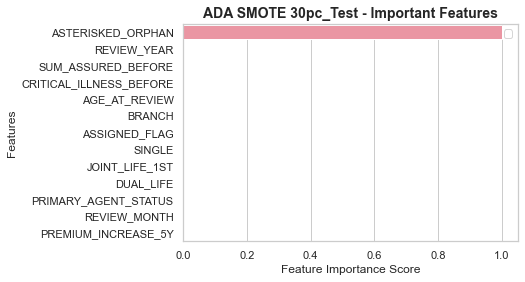

Best parameters ADA SMOTE ('20pc_Test',): {'clf__learning_rate': 0.1, 'clf__n_estimators': 10}
ADA SMOTE_80pc_Train F1 Score : 22.09%
ADA SMOTE_20pc_Test F1 Score : 30.41%


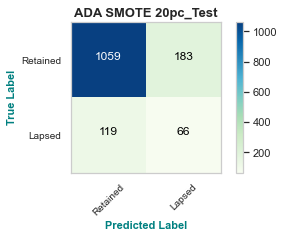

ADA SMOTE 20pc_Test - Classification Report
              precision    recall  f1-score   support

         0.0       0.90      0.85      0.88      1242
         1.0       0.27      0.36      0.30       185

    accuracy                           0.79      1427
   macro avg       0.58      0.60      0.59      1427
weighted avg       0.82      0.79      0.80      1427



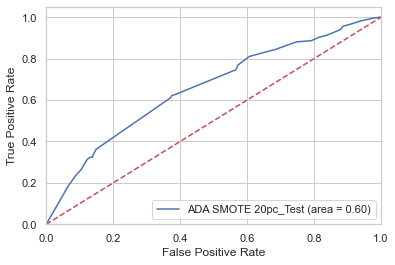

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


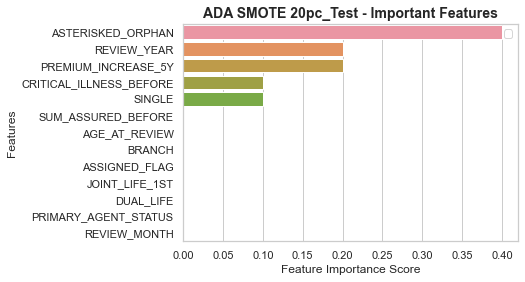

Best parameters ADA SMOTE ('10pc_Test',): {'clf__learning_rate': 0.01, 'clf__n_estimators': 10}
ADA SMOTE_90pc_Train F1 Score : 23.43%
ADA SMOTE_10pc_Test F1 Score : 31.30%


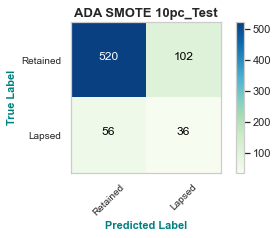

ADA SMOTE 10pc_Test - Classification Report
              precision    recall  f1-score   support

         0.0       0.90      0.84      0.87       622
         1.0       0.26      0.39      0.31        92

    accuracy                           0.78       714
   macro avg       0.58      0.61      0.59       714
weighted avg       0.82      0.78      0.80       714



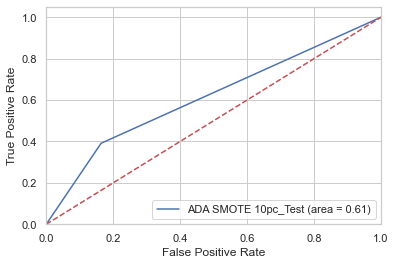

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


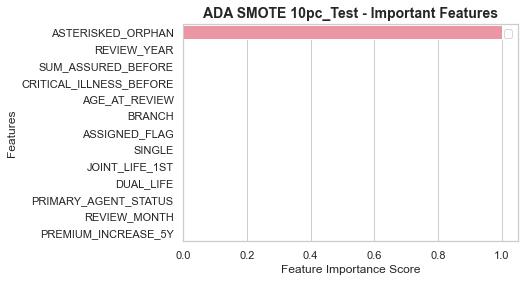

Best parameters ADA BLSMOTE ('30pc_Test',): {'clf__learning_rate': 0.1, 'clf__n_estimators': 10}
ADA BLSMOTE_70pc_Train F1 Score : 24.51%
ADA BLSMOTE_30pc_Test F1 Score : 25.97%


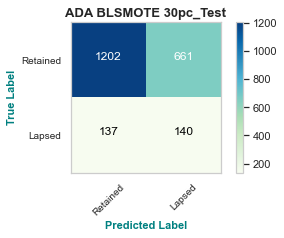

ADA BLSMOTE 30pc_Test - Classification Report
              precision    recall  f1-score   support

         0.0       0.90      0.65      0.75      1863
         1.0       0.17      0.51      0.26       277

    accuracy                           0.63      2140
   macro avg       0.54      0.58      0.51      2140
weighted avg       0.80      0.63      0.69      2140



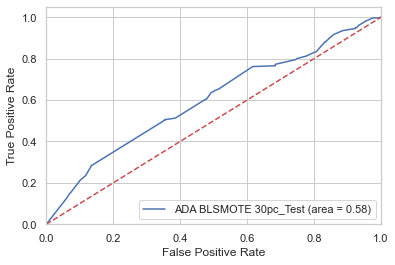

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


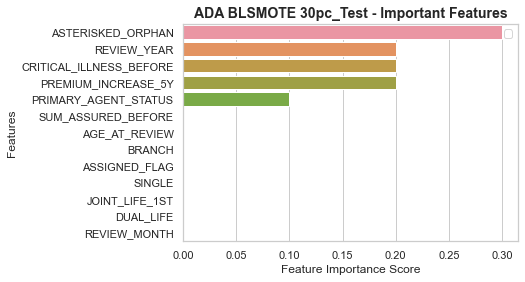

Best parameters ADA BLSMOTE ('20pc_Test',): {'clf__learning_rate': 0.01, 'clf__n_estimators': 100}
ADA BLSMOTE_80pc_Train F1 Score : 22.15%
ADA BLSMOTE_20pc_Test F1 Score : 30.63%


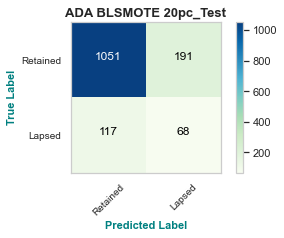

ADA BLSMOTE 20pc_Test - Classification Report
              precision    recall  f1-score   support

         0.0       0.90      0.85      0.87      1242
         1.0       0.26      0.37      0.31       185

    accuracy                           0.78      1427
   macro avg       0.58      0.61      0.59      1427
weighted avg       0.82      0.78      0.80      1427



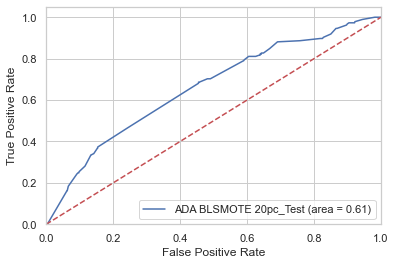

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


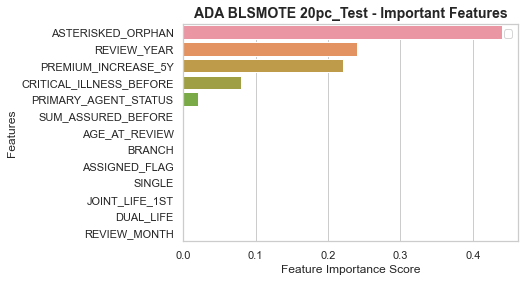

Best parameters ADA BLSMOTE ('10pc_Test',): {'clf__learning_rate': 0.01, 'clf__n_estimators': 10}
ADA BLSMOTE_90pc_Train F1 Score : 23.43%
ADA BLSMOTE_10pc_Test F1 Score : 31.30%


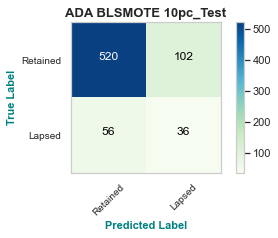

ADA BLSMOTE 10pc_Test - Classification Report
              precision    recall  f1-score   support

         0.0       0.90      0.84      0.87       622
         1.0       0.26      0.39      0.31        92

    accuracy                           0.78       714
   macro avg       0.58      0.61      0.59       714
weighted avg       0.82      0.78      0.80       714



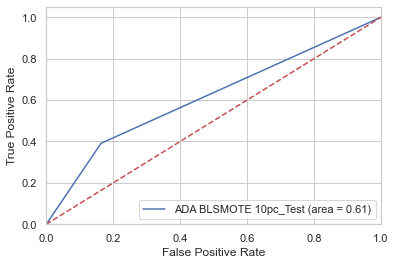

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


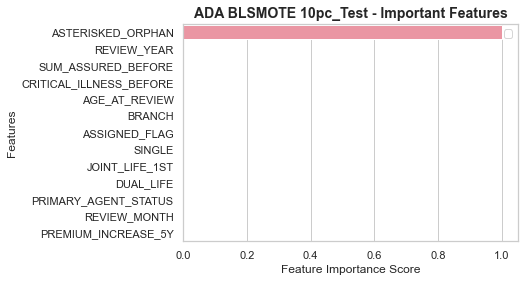

Best parameters ADA SMOTETomek ('30pc_Test',): {'clf__learning_rate': 0.1, 'clf__n_estimators': 10}
ADA SMOTETomek_70pc_Train F1 Score : 22.16%
ADA SMOTETomek_30pc_Test F1 Score : 26.11%


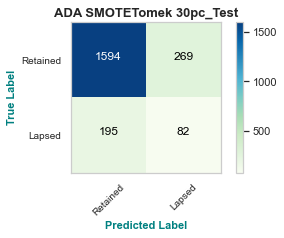

ADA SMOTETomek 30pc_Test - Classification Report
              precision    recall  f1-score   support

         0.0       0.89      0.86      0.87      1863
         1.0       0.23      0.30      0.26       277

    accuracy                           0.78      2140
   macro avg       0.56      0.58      0.57      2140
weighted avg       0.81      0.78      0.79      2140



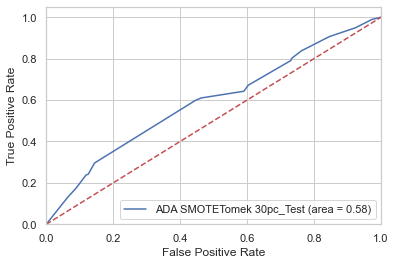

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


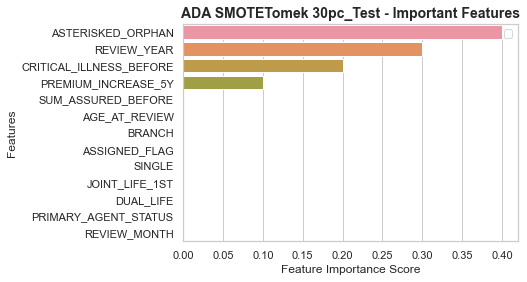

Best parameters ADA SMOTETomek ('20pc_Test',): {'clf__learning_rate': 0.01, 'clf__n_estimators': 100}
ADA SMOTETomek_80pc_Train F1 Score : 22.20%
ADA SMOTETomek_20pc_Test F1 Score : 30.70%


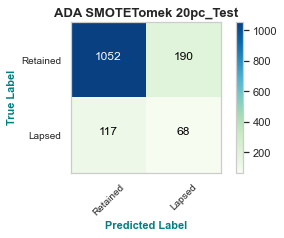

ADA SMOTETomek 20pc_Test - Classification Report
              precision    recall  f1-score   support

         0.0       0.90      0.85      0.87      1242
         1.0       0.26      0.37      0.31       185

    accuracy                           0.78      1427
   macro avg       0.58      0.61      0.59      1427
weighted avg       0.82      0.78      0.80      1427



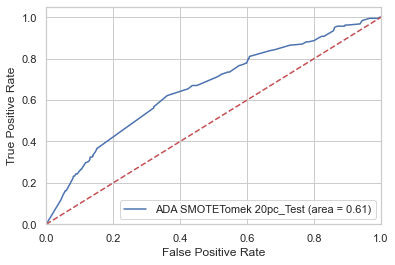

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


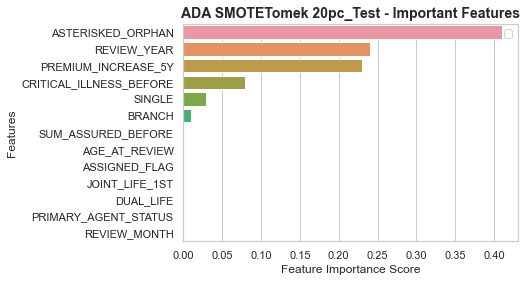

Best parameters ADA SMOTETomek ('10pc_Test',): {'clf__learning_rate': 0.01, 'clf__n_estimators': 50}
ADA SMOTETomek_90pc_Train F1 Score : 23.43%
ADA SMOTETomek_10pc_Test F1 Score : 31.30%


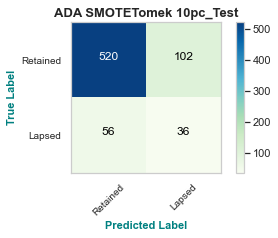

ADA SMOTETomek 10pc_Test - Classification Report
              precision    recall  f1-score   support

         0.0       0.90      0.84      0.87       622
         1.0       0.26      0.39      0.31        92

    accuracy                           0.78       714
   macro avg       0.58      0.61      0.59       714
weighted avg       0.82      0.78      0.80       714



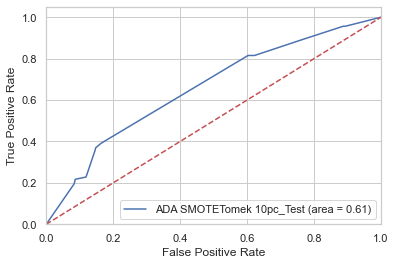

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


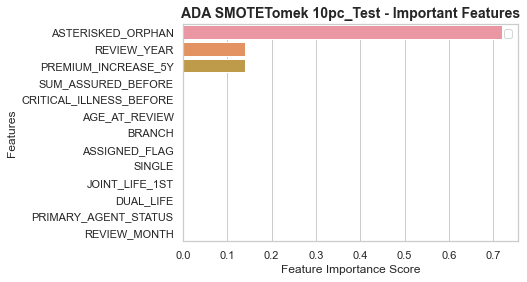

Best parameters ADA SMOTEENN ('30pc_Test',): {'clf__learning_rate': 0.01, 'clf__n_estimators': 50}
ADA SMOTEENN_70pc_Train F1 Score : 25.94%
ADA SMOTEENN_30pc_Test F1 Score : 26.21%


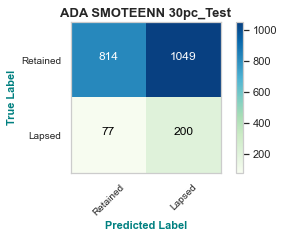

ADA SMOTEENN 30pc_Test - Classification Report
              precision    recall  f1-score   support

         0.0       0.91      0.44      0.59      1863
         1.0       0.16      0.72      0.26       277

    accuracy                           0.47      2140
   macro avg       0.54      0.58      0.43      2140
weighted avg       0.82      0.47      0.55      2140



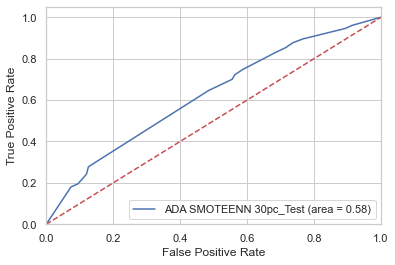

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


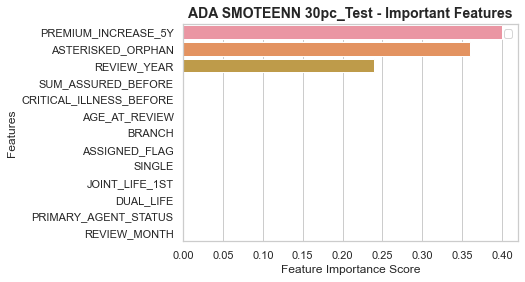

Best parameters ADA SMOTEENN ('20pc_Test',): {'clf__learning_rate': 0.01, 'clf__n_estimators': 100}
ADA SMOTEENN_80pc_Train F1 Score : 25.93%
ADA SMOTEENN_20pc_Test F1 Score : 27.12%


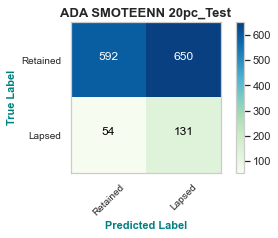

ADA SMOTEENN 20pc_Test - Classification Report
              precision    recall  f1-score   support

         0.0       0.92      0.48      0.63      1242
         1.0       0.17      0.71      0.27       185

    accuracy                           0.51      1427
   macro avg       0.54      0.59      0.45      1427
weighted avg       0.82      0.51      0.58      1427



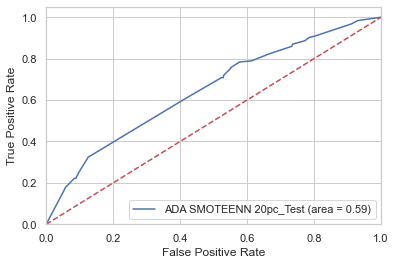

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


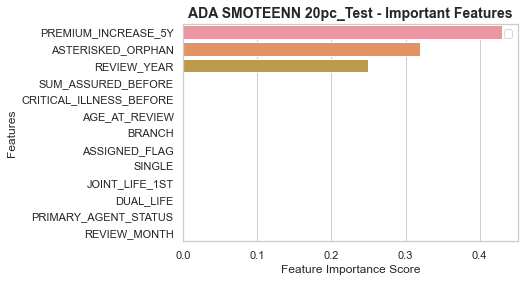

Best parameters ADA SMOTEENN ('10pc_Test',): {'clf__learning_rate': 0.01, 'clf__n_estimators': 100}
ADA SMOTEENN_90pc_Train F1 Score : 25.59%
ADA SMOTEENN_10pc_Test F1 Score : 27.65%


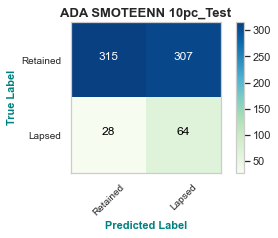

ADA SMOTEENN 10pc_Test - Classification Report
              precision    recall  f1-score   support

         0.0       0.92      0.51      0.65       622
         1.0       0.17      0.70      0.28        92

    accuracy                           0.53       714
   macro avg       0.55      0.60      0.46       714
weighted avg       0.82      0.53      0.60       714



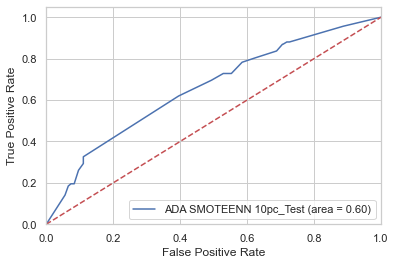

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


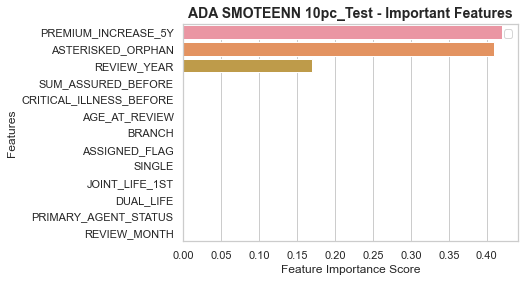

Best parameters ADA RUS ('30pc_Test',): {'clf__learning_rate': 0.1, 'clf__n_estimators': 10}
ADA RUS_70pc_Train F1 Score : 25.78%
ADA RUS_30pc_Test F1 Score : 24.63%


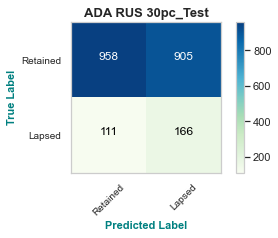

ADA RUS 30pc_Test - Classification Report
              precision    recall  f1-score   support

         0.0       0.90      0.51      0.65      1863
         1.0       0.15      0.60      0.25       277

    accuracy                           0.53      2140
   macro avg       0.53      0.56      0.45      2140
weighted avg       0.80      0.53      0.60      2140



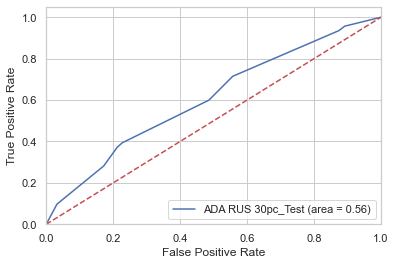

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


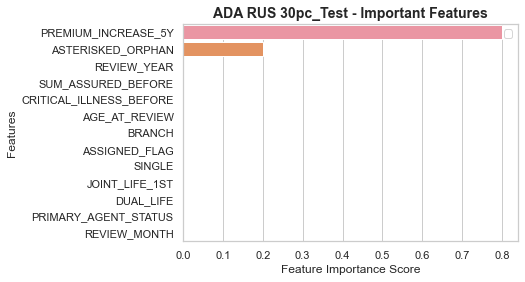

Best parameters ADA RUS ('20pc_Test',): {'clf__learning_rate': 0.1, 'clf__n_estimators': 10}
ADA RUS_80pc_Train F1 Score : 25.14%
ADA RUS_20pc_Test F1 Score : 27.10%


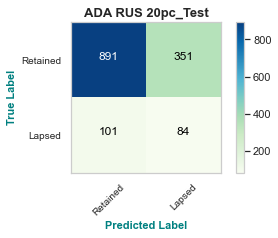

ADA RUS 20pc_Test - Classification Report
              precision    recall  f1-score   support

         0.0       0.90      0.72      0.80      1242
         1.0       0.19      0.45      0.27       185

    accuracy                           0.68      1427
   macro avg       0.55      0.59      0.53      1427
weighted avg       0.81      0.68      0.73      1427



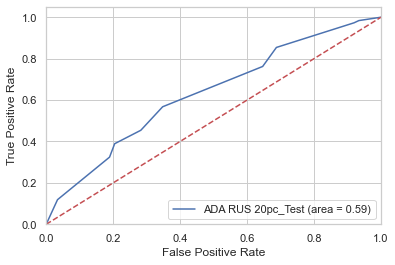

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


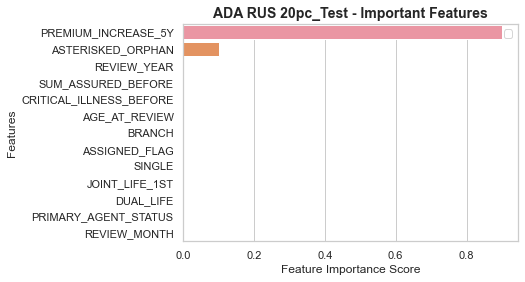

Best parameters ADA RUS ('10pc_Test',): {'clf__learning_rate': 0.1, 'clf__n_estimators': 10}
ADA RUS_90pc_Train F1 Score : 27.92%
ADA RUS_10pc_Test F1 Score : 30.03%


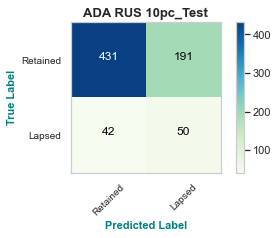

ADA RUS 10pc_Test - Classification Report
              precision    recall  f1-score   support

         0.0       0.91      0.69      0.79       622
         1.0       0.21      0.54      0.30        92

    accuracy                           0.67       714
   macro avg       0.56      0.62      0.54       714
weighted avg       0.82      0.67      0.72       714



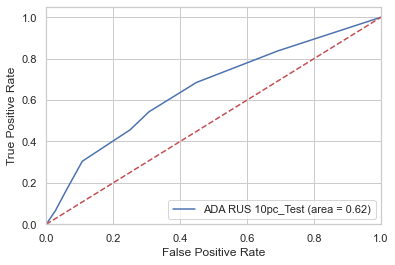

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


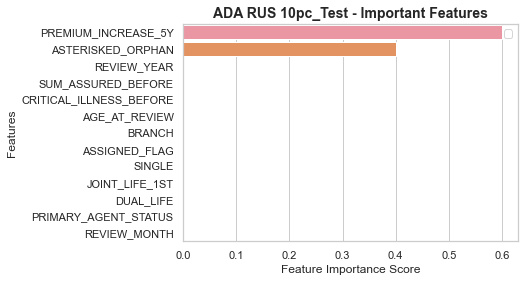

Best parameters ADA NM1 ('30pc_Test',): {'clf__learning_rate': 0.1, 'clf__n_estimators': 100}
ADA NM1_70pc_Train F1 Score : 25.73%
ADA NM1_30pc_Test F1 Score : 25.61%


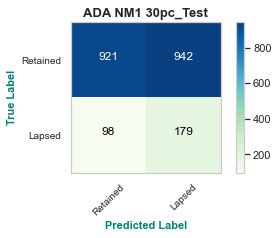

ADA NM1 30pc_Test - Classification Report
              precision    recall  f1-score   support

         0.0       0.90      0.49      0.64      1863
         1.0       0.16      0.65      0.26       277

    accuracy                           0.51      2140
   macro avg       0.53      0.57      0.45      2140
weighted avg       0.81      0.51      0.59      2140



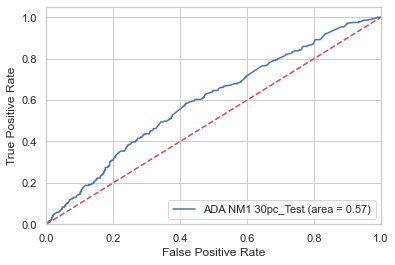

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


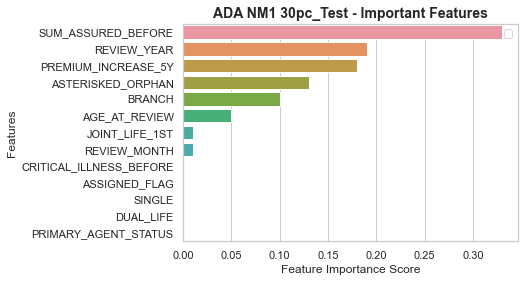

Best parameters ADA NM1 ('20pc_Test',): {'clf__learning_rate': 0.1, 'clf__n_estimators': 100}
ADA NM1_80pc_Train F1 Score : 25.49%
ADA NM1_20pc_Test F1 Score : 26.33%


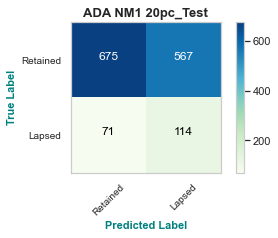

ADA NM1 20pc_Test - Classification Report
              precision    recall  f1-score   support

         0.0       0.90      0.54      0.68      1242
         1.0       0.17      0.62      0.26       185

    accuracy                           0.55      1427
   macro avg       0.54      0.58      0.47      1427
weighted avg       0.81      0.55      0.63      1427



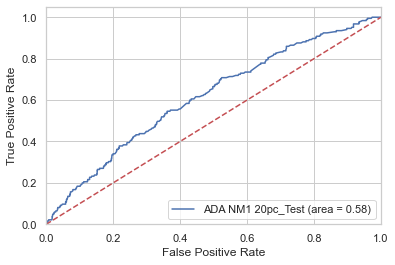

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


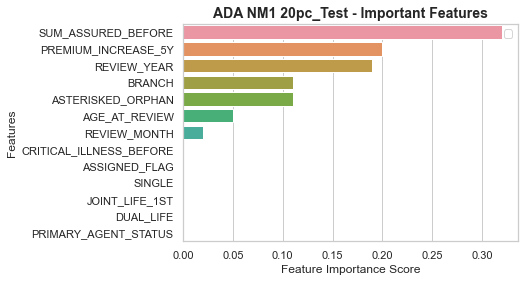

Best parameters ADA NM1 ('10pc_Test',): {'clf__learning_rate': 1, 'clf__n_estimators': 10}
ADA NM1_90pc_Train F1 Score : 25.68%
ADA NM1_10pc_Test F1 Score : 26.53%


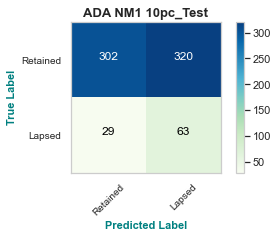

ADA NM1 10pc_Test - Classification Report
              precision    recall  f1-score   support

         0.0       0.91      0.49      0.63       622
         1.0       0.16      0.68      0.27        92

    accuracy                           0.51       714
   macro avg       0.54      0.59      0.45       714
weighted avg       0.82      0.51      0.59       714



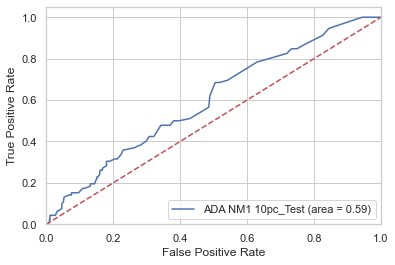

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


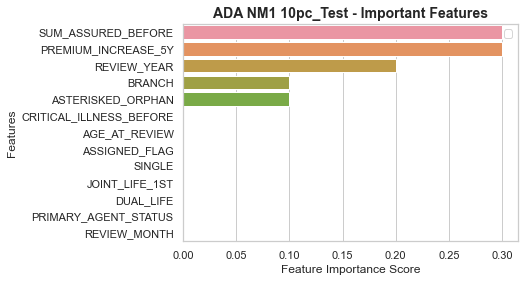

Best parameters ADA NM2 ('30pc_Test',): {'clf__learning_rate': 0.1, 'clf__n_estimators': 10}
ADA NM2_70pc_Train F1 Score : 22.54%
ADA NM2_30pc_Test F1 Score : 21.82%


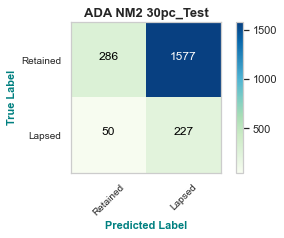

ADA NM2 30pc_Test - Classification Report
              precision    recall  f1-score   support

         0.0       0.85      0.15      0.26      1863
         1.0       0.13      0.82      0.22       277

    accuracy                           0.24      2140
   macro avg       0.49      0.49      0.24      2140
weighted avg       0.76      0.24      0.25      2140



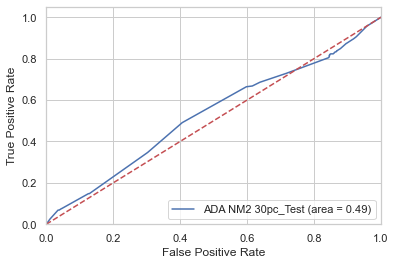

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


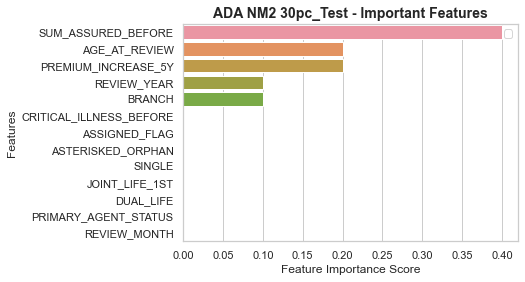

Best parameters ADA NM2 ('20pc_Test',): {'clf__learning_rate': 1, 'clf__n_estimators': 10}
ADA NM2_80pc_Train F1 Score : 22.50%
ADA NM2_20pc_Test F1 Score : 21.56%


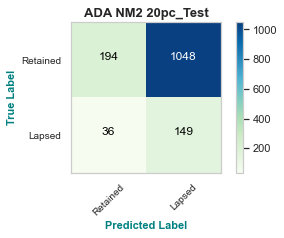

ADA NM2 20pc_Test - Classification Report
              precision    recall  f1-score   support

         0.0       0.84      0.16      0.26      1242
         1.0       0.12      0.81      0.22       185

    accuracy                           0.24      1427
   macro avg       0.48      0.48      0.24      1427
weighted avg       0.75      0.24      0.26      1427



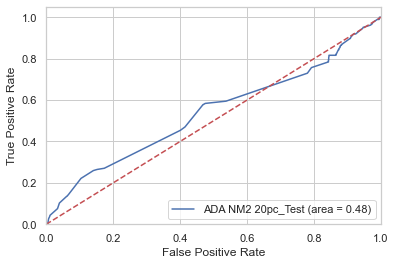

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


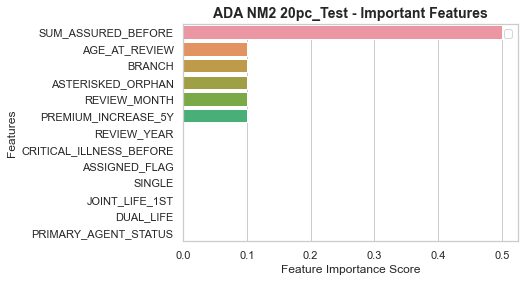

Best parameters ADA NM2 ('10pc_Test',): {'clf__learning_rate': 1, 'clf__n_estimators': 100}
ADA NM2_90pc_Train F1 Score : 22.63%
ADA NM2_10pc_Test F1 Score : 20.93%


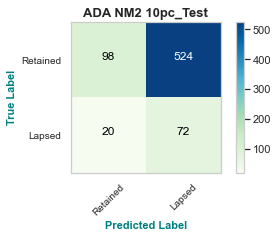

ADA NM2 10pc_Test - Classification Report
              precision    recall  f1-score   support

         0.0       0.83      0.16      0.26       622
         1.0       0.12      0.78      0.21        92

    accuracy                           0.24       714
   macro avg       0.48      0.47      0.24       714
weighted avg       0.74      0.24      0.26       714



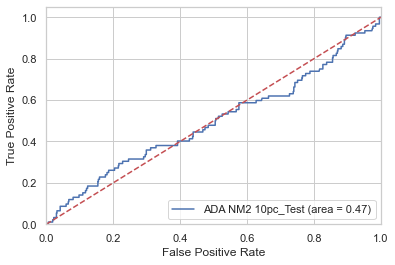

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


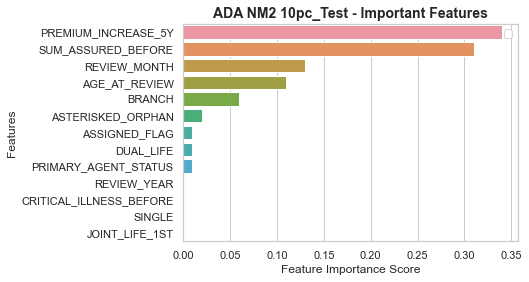

Best parameters ADA NM3 ('30pc_Test',): {'clf__learning_rate': 1, 'clf__n_estimators': 100}
ADA NM3_70pc_Train F1 Score : 26.50%
ADA NM3_30pc_Test F1 Score : 23.88%


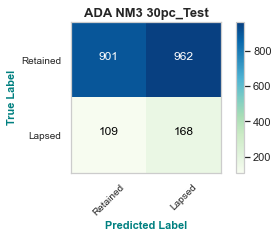

ADA NM3 30pc_Test - Classification Report
              precision    recall  f1-score   support

         0.0       0.89      0.48      0.63      1863
         1.0       0.15      0.61      0.24       277

    accuracy                           0.50      2140
   macro avg       0.52      0.55      0.43      2140
weighted avg       0.80      0.50      0.58      2140



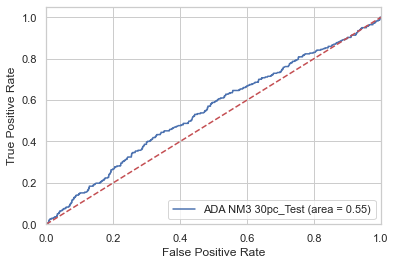

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


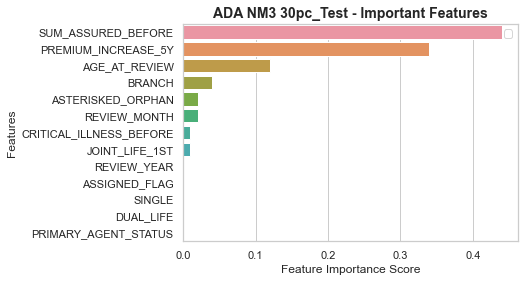

Best parameters ADA NM3 ('20pc_Test',): {'clf__learning_rate': 1, 'clf__n_estimators': 50}
ADA NM3_80pc_Train F1 Score : 26.15%
ADA NM3_20pc_Test F1 Score : 22.71%


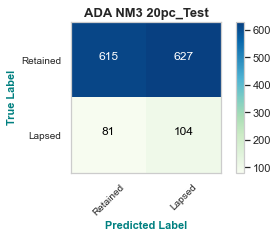

ADA NM3 20pc_Test - Classification Report
              precision    recall  f1-score   support

         0.0       0.88      0.50      0.63      1242
         1.0       0.14      0.56      0.23       185

    accuracy                           0.50      1427
   macro avg       0.51      0.53      0.43      1427
weighted avg       0.79      0.50      0.58      1427



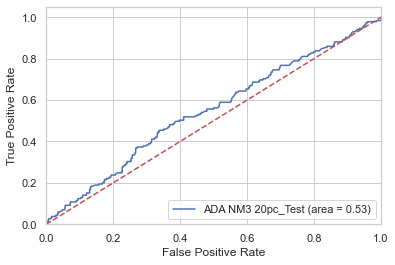

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


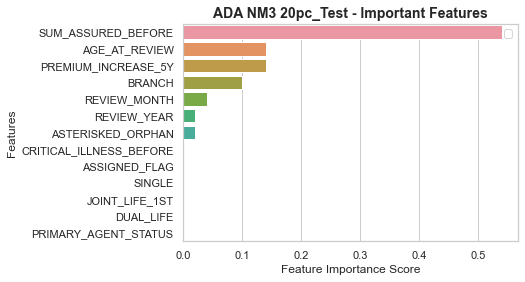

Best parameters ADA NM3 ('10pc_Test',): {'clf__learning_rate': 1, 'clf__n_estimators': 50}
ADA NM3_90pc_Train F1 Score : 25.31%
ADA NM3_10pc_Test F1 Score : 25.50%


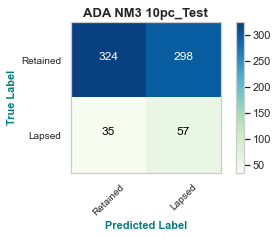

ADA NM3 10pc_Test - Classification Report
              precision    recall  f1-score   support

         0.0       0.90      0.52      0.66       622
         1.0       0.16      0.62      0.26        92

    accuracy                           0.53       714
   macro avg       0.53      0.57      0.46       714
weighted avg       0.81      0.53      0.61       714



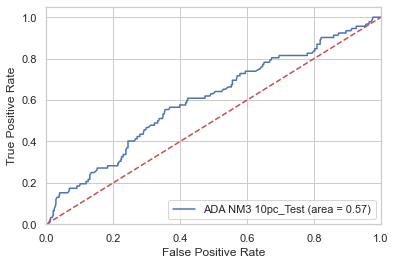

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


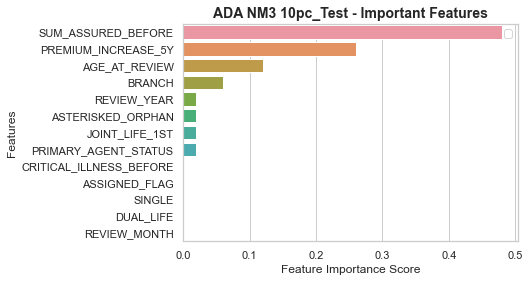

In [48]:
model_name = "ADA"
clf = AdaBoostClassifier()

for train_name, test_name, X_train, y_train, X_test,y_test in zip(train_names,test_names, X_training_splits, y_training_splits, X_testing_splits, y_testing_splits):
    
    model = clf
    method = "IMB"
    param_grid = {'learning_rate': [0.01, 0.1, 1],
                      'n_estimators': [10, 50, 100]}
    stratified_kfold = StratifiedKFold(n_splits=5,shuffle=True,random_state=11)
    gs = GridSearchCV(estimator=model,
                      param_grid=param_grid,
                      scoring='f1',
                      cv=stratified_kfold,
                      n_jobs=-1)
    gs.fit(X_train,y_train)

    # Print the best parameters and best score obtained during the grid search
    print(f'Best parameters {model_name} {method} {test_name,}:', gs.best_params_)
    
    best_model = gs.best_estimator_
    # Call fit() method to train the model
    best_model.fit(X_train,y_train)
    # Predict the results
    y_train_predict = best_model.predict(X_train)
    y_predict = best_model.predict(X_test)
    
    exec(f'{model_name}_roc_auc_{method}_{train_name} =  roc_auc_score(y_train,y_train_predict)')
    exec(f'{model_name}_a_{method}_{train_name} = metrics.accuracy_score(y_train,y_train_predict)') 
    exec(f'{model_name}_p_{method}_{train_name} = metrics.precision_score(y_train,y_train_predict)') 
    exec(f'{model_name}_r_{method}_{train_name}  = metrics.recall_score(y_train,y_train_predict)') 
    exec(f'{model_name}_f1_{method}_{train_name} = metrics.f1_score(y_train,y_train_predict)')
    print(f'{model_name} {method}_{train_name} F1 Score : %.2f%%' % (metrics.f1_score(y_train, y_train_predict) * 100.0))

    # Call fit() method to train the model
    # Predict the results
    
    
    exec(f'{model_name}_roc_auc_{method}_{test_name} =  roc_auc_score(y_test,y_predict)')
    exec(f'{model_name}_a_{method}_{test_name} = metrics.accuracy_score(y_test, y_predict)') 
    exec(f'{model_name}_p_{method}_{test_name} = metrics.precision_score(y_test, y_predict)') 
    exec(f'{model_name}_r_{method}_{test_name}  = metrics.recall_score(y_test, y_predict)') 
    exec(f'{model_name}_f1_{method}_{test_name} = metrics.f1_score(y_test, y_predict)')
    print(f'{model_name} {method}_{test_name} F1 Score : %.2f%%' % (metrics.f1_score(y_test, y_predict) * 100.0))
 

 
     # Compute confusion matrix
    cnf_matrix = confusion_matrix(y_test, y_predict)
    # Plot non-normalized confusion matrix
    plt.figure(figsize = (5, 3.5))
    plot_confusion_matrix(cnf_matrix, classes = class_names)
    plt.title(f'{model_name} {method} {test_name}',fontsize = 13, fontweight = "bold")
    plt.show()

    # print the classification_report based on y_test and y_predict) 
    print(f'{model_name} {method} {test_name} - Classification Report')
    print(classification_report(y_test, y_predict))

    roc_auc_curve(y_test,best_model,method,test_name,X_test)
    feature_importance(best_model,model_name, method, test_name)
        

for method,resampler in zip(resampler_names,resamplers):
    for train_name, test_name, X_train, y_train, X_test,y_test in zip(train_names,test_names, X_training_splits, y_training_splits, X_testing_splits, y_testing_splits):
        
        model = Pipeline([('resampler', resampler),
                     ('mms', MinMaxScaler()),
                     ('clf',clf)])
        
        param_grid = {'clf__learning_rate': [0.01, 0.1, 1],
                      'clf__n_estimators': [10, 50, 100]}

        stratified_kfold = StratifiedKFold(n_splits=5,shuffle=True,random_state=11)
        gs = GridSearchCV(estimator=model,
                          param_grid=param_grid,
                          scoring='f1',
                          cv=stratified_kfold,
                          n_jobs=-1)
        gs.fit(X_train,y_train)

        # Print the best parameters and best score obtained during the grid search
        print(f'Best parameters {model_name} {method} {test_name,}:', gs.best_params_)

        best_model = gs.best_estimator_
        # Call fit() method to train the model
        best_model.fit(X_train,y_train)
        # Predict the results
        y_train_predict = best_model.predict(X_train)
        y_predict = best_model.predict(X_test)

        exec(f'{model_name}_roc_auc_{method}_{train_name} =  roc_auc_score(y_train,y_train_predict)')
        exec(f'{model_name}_a_{method}_{train_name} = metrics.accuracy_score(y_train,y_train_predict)') 
        exec(f'{model_name}_p_{method}_{train_name} = metrics.precision_score(y_train,y_train_predict)') 
        exec(f'{model_name}_r_{method}_{train_name}  = metrics.recall_score(y_train,y_train_predict)') 
        exec(f'{model_name}_f1_{method}_{train_name} = metrics.f1_score(y_train,y_train_predict)')
        print(f'{model_name} {method}_{train_name} F1 Score : %.2f%%' % (metrics.f1_score(y_train, y_train_predict) * 100.0))

        # Call fit() method to train the model
        # Predict the results


        exec(f'{model_name}_roc_auc_{method}_{test_name} =  roc_auc_score(y_test,y_predict)')
        exec(f'{model_name}_a_{method}_{test_name} = metrics.accuracy_score(y_test, y_predict)') 
        exec(f'{model_name}_p_{method}_{test_name} = metrics.precision_score(y_test, y_predict)') 
        exec(f'{model_name}_r_{method}_{test_name}  = metrics.recall_score(y_test, y_predict)') 
        exec(f'{model_name}_f1_{method}_{test_name} = metrics.f1_score(y_test, y_predict)')
        print(f'{model_name} {method}_{test_name} F1 Score : %.2f%%' % (metrics.f1_score(y_test, y_predict) * 100.0))



         # Compute confusion matrix
        cnf_matrix = confusion_matrix(y_test, y_predict)
        # Plot non-normalized confusion matrix
        plt.figure(figsize = (5, 3.5))
        plot_confusion_matrix(cnf_matrix, classes = class_names)
        plt.title(f'{model_name} {method} {test_name}',fontsize = 13, fontweight = "bold")
        plt.show()

        # print the classification_report based on y_test and y_predict) 
        print(f'{model_name} {method} {test_name} - Classification Report')
        print(classification_report(y_test, y_predict))

        roc_auc_curve(y_test,best_model,method,test_name,X_test)
        feature_importance_pipe(best_model,model_name, method, test_name)

## CatBoost

0:	learn: 0.3980528	total: 53.9ms	remaining: 5.33s
1:	learn: 0.3737249	total: 56.5ms	remaining: 2.77s
2:	learn: 0.3668906	total: 58.8ms	remaining: 1.9s
3:	learn: 0.3644943	total: 61.1ms	remaining: 1.47s
4:	learn: 0.3623139	total: 63.5ms	remaining: 1.21s
5:	learn: 0.3599746	total: 66ms	remaining: 1.03s
6:	learn: 0.3533900	total: 68.6ms	remaining: 911ms
7:	learn: 0.3501514	total: 70.9ms	remaining: 815ms
8:	learn: 0.3484399	total: 73.4ms	remaining: 742ms
9:	learn: 0.3467900	total: 76ms	remaining: 684ms
10:	learn: 0.3426091	total: 78.8ms	remaining: 637ms
11:	learn: 0.3414435	total: 81.3ms	remaining: 596ms
12:	learn: 0.3401703	total: 83.8ms	remaining: 561ms
13:	learn: 0.3395669	total: 86.3ms	remaining: 530ms
14:	learn: 0.3359978	total: 88.7ms	remaining: 503ms
15:	learn: 0.3318797	total: 94.2ms	remaining: 494ms
16:	learn: 0.3294562	total: 96.7ms	remaining: 472ms
17:	learn: 0.3259297	total: 98.9ms	remaining: 451ms
18:	learn: 0.3221874	total: 101ms	remaining: 431ms
19:	learn: 0.3192737	total: 

73:	learn: 0.2228021	total: 202ms	remaining: 71ms
74:	learn: 0.2218895	total: 204ms	remaining: 68.2ms
75:	learn: 0.2203762	total: 207ms	remaining: 65.3ms
76:	learn: 0.2198428	total: 209ms	remaining: 62.5ms
77:	learn: 0.2191465	total: 212ms	remaining: 59.7ms
78:	learn: 0.2178166	total: 214ms	remaining: 56.9ms
79:	learn: 0.2172099	total: 216ms	remaining: 54.1ms
80:	learn: 0.2170470	total: 219ms	remaining: 51.3ms
81:	learn: 0.2151169	total: 221ms	remaining: 48.5ms
82:	learn: 0.2140884	total: 224ms	remaining: 45.8ms
83:	learn: 0.2124450	total: 226ms	remaining: 43.1ms
84:	learn: 0.2112167	total: 229ms	remaining: 40.4ms
85:	learn: 0.2102162	total: 231ms	remaining: 37.6ms
86:	learn: 0.2081591	total: 234ms	remaining: 35ms
87:	learn: 0.2073753	total: 237ms	remaining: 32.3ms
88:	learn: 0.2062368	total: 239ms	remaining: 29.6ms
89:	learn: 0.2049178	total: 242ms	remaining: 26.9ms
90:	learn: 0.2032701	total: 245ms	remaining: 24.3ms
91:	learn: 0.2022133	total: 248ms	remaining: 21.5ms
92:	learn: 0.201

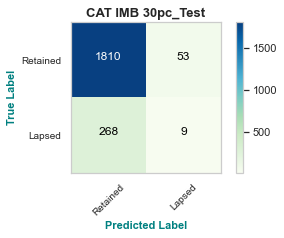

CAT IMB 30pc_Test - Classification Report
              precision    recall  f1-score   support

         0.0       0.87      0.97      0.92      1863
         1.0       0.15      0.03      0.05       277

    accuracy                           0.85      2140
   macro avg       0.51      0.50      0.49      2140
weighted avg       0.78      0.85      0.81      2140



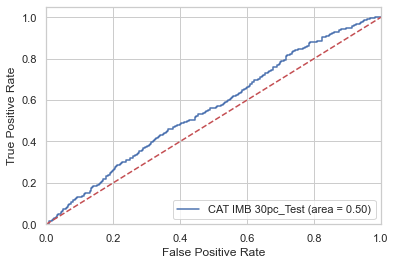

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


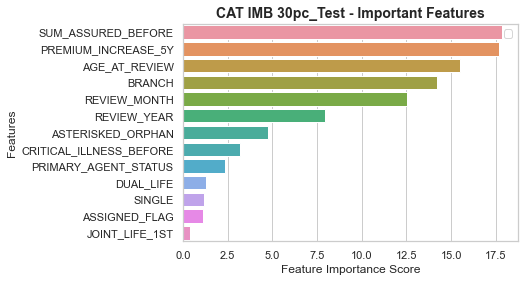

0:	learn: 0.3978648	total: 2.45ms	remaining: 242ms
1:	learn: 0.3746315	total: 4.68ms	remaining: 229ms
2:	learn: 0.3704236	total: 6.81ms	remaining: 220ms
3:	learn: 0.3669755	total: 9.07ms	remaining: 218ms
4:	learn: 0.3628119	total: 11.5ms	remaining: 219ms
5:	learn: 0.3586749	total: 13.7ms	remaining: 215ms
6:	learn: 0.3553714	total: 16.1ms	remaining: 214ms
7:	learn: 0.3539209	total: 18.4ms	remaining: 212ms
8:	learn: 0.3522768	total: 21.2ms	remaining: 214ms
9:	learn: 0.3498721	total: 23.4ms	remaining: 211ms
10:	learn: 0.3460226	total: 25.3ms	remaining: 205ms
11:	learn: 0.3440439	total: 27.4ms	remaining: 201ms
12:	learn: 0.3424120	total: 29.4ms	remaining: 196ms
13:	learn: 0.3402386	total: 31.8ms	remaining: 195ms
14:	learn: 0.3381952	total: 34.1ms	remaining: 193ms
15:	learn: 0.3340433	total: 36.4ms	remaining: 191ms
16:	learn: 0.3304183	total: 38.4ms	remaining: 188ms
17:	learn: 0.3278177	total: 40.4ms	remaining: 184ms
18:	learn: 0.3253705	total: 42.7ms	remaining: 182ms
19:	learn: 0.3218361	t

CAT IMB_80pc_Train F1 Score : 60.11%
CAT IMB_20pc_Test F1 Score : 12.93%


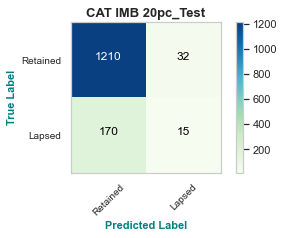

CAT IMB 20pc_Test - Classification Report
              precision    recall  f1-score   support

         0.0       0.88      0.97      0.92      1242
         1.0       0.32      0.08      0.13       185

    accuracy                           0.86      1427
   macro avg       0.60      0.53      0.53      1427
weighted avg       0.80      0.86      0.82      1427



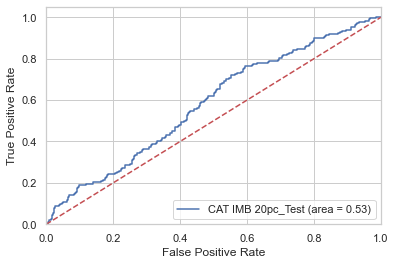

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


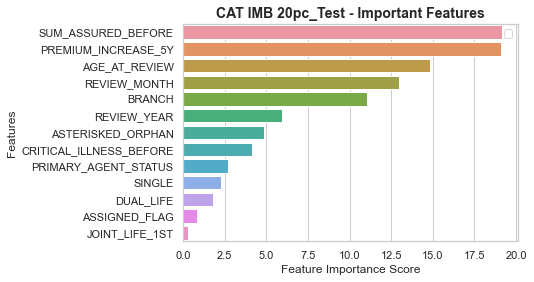

0:	learn: 0.3981740	total: 3.36ms	remaining: 333ms
1:	learn: 0.3741438	total: 5.6ms	remaining: 274ms
2:	learn: 0.3682004	total: 7.79ms	remaining: 252ms
3:	learn: 0.3643249	total: 10ms	remaining: 241ms
4:	learn: 0.3614713	total: 12.5ms	remaining: 237ms
5:	learn: 0.3584355	total: 14.9ms	remaining: 233ms
6:	learn: 0.3550554	total: 17.5ms	remaining: 232ms
7:	learn: 0.3527682	total: 19.7ms	remaining: 227ms
8:	learn: 0.3499090	total: 21.8ms	remaining: 220ms
9:	learn: 0.3484712	total: 24.1ms	remaining: 217ms
10:	learn: 0.3466046	total: 26.9ms	remaining: 217ms
11:	learn: 0.3460550	total: 29.2ms	remaining: 214ms
12:	learn: 0.3452118	total: 31.4ms	remaining: 210ms
13:	learn: 0.3437489	total: 33.5ms	remaining: 206ms
14:	learn: 0.3427915	total: 35.7ms	remaining: 202ms
15:	learn: 0.3410370	total: 38.1ms	remaining: 200ms
16:	learn: 0.3403030	total: 40.8ms	remaining: 199ms
17:	learn: 0.3386193	total: 43.5ms	remaining: 198ms
18:	learn: 0.3343216	total: 45.6ms	remaining: 195ms
19:	learn: 0.3318343	tota

71:	learn: 0.2542261	total: 233ms	remaining: 90.5ms
72:	learn: 0.2526312	total: 239ms	remaining: 88.3ms
73:	learn: 0.2510052	total: 249ms	remaining: 87.4ms
74:	learn: 0.2486559	total: 268ms	remaining: 89.5ms
75:	learn: 0.2476229	total: 275ms	remaining: 86.9ms
76:	learn: 0.2468835	total: 282ms	remaining: 84.4ms
77:	learn: 0.2461058	total: 287ms	remaining: 80.8ms
78:	learn: 0.2452203	total: 290ms	remaining: 77ms
79:	learn: 0.2445746	total: 293ms	remaining: 73.2ms
80:	learn: 0.2442608	total: 296ms	remaining: 69.5ms
81:	learn: 0.2436040	total: 299ms	remaining: 65.7ms
82:	learn: 0.2422679	total: 302ms	remaining: 62ms
83:	learn: 0.2413702	total: 306ms	remaining: 58.2ms
84:	learn: 0.2402007	total: 309ms	remaining: 54.5ms
85:	learn: 0.2396773	total: 312ms	remaining: 50.8ms
86:	learn: 0.2386725	total: 315ms	remaining: 47ms
87:	learn: 0.2372168	total: 317ms	remaining: 43.3ms
88:	learn: 0.2338702	total: 320ms	remaining: 39.5ms
89:	learn: 0.2326444	total: 323ms	remaining: 35.9ms
90:	learn: 0.23162

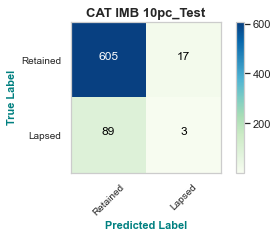

CAT IMB 10pc_Test - Classification Report
              precision    recall  f1-score   support

         0.0       0.87      0.97      0.92       622
         1.0       0.15      0.03      0.05        92

    accuracy                           0.85       714
   macro avg       0.51      0.50      0.49       714
weighted avg       0.78      0.85      0.81       714



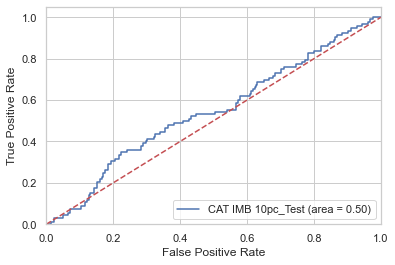

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


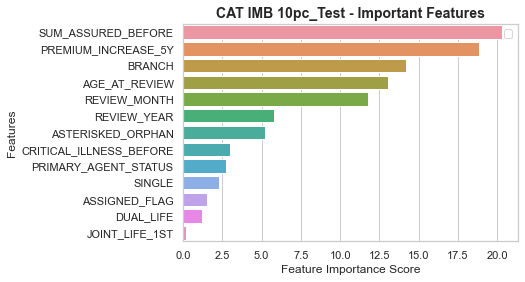

0:	learn: 0.6923405	total: 3.08ms	remaining: 151ms
1:	learn: 0.6917062	total: 6.19ms	remaining: 149ms
2:	learn: 0.6910562	total: 9.14ms	remaining: 143ms
3:	learn: 0.6905248	total: 12.3ms	remaining: 142ms
4:	learn: 0.6899606	total: 15.2ms	remaining: 137ms
5:	learn: 0.6892838	total: 17.7ms	remaining: 130ms
6:	learn: 0.6885824	total: 20.2ms	remaining: 124ms
7:	learn: 0.6880302	total: 23.1ms	remaining: 121ms
8:	learn: 0.6875240	total: 25.8ms	remaining: 117ms
9:	learn: 0.6869111	total: 28ms	remaining: 112ms
10:	learn: 0.6861841	total: 30.7ms	remaining: 109ms
11:	learn: 0.6856357	total: 33.2ms	remaining: 105ms
12:	learn: 0.6850067	total: 35.8ms	remaining: 102ms
13:	learn: 0.6843813	total: 38.6ms	remaining: 99.2ms
14:	learn: 0.6838161	total: 40.8ms	remaining: 95.2ms
15:	learn: 0.6832756	total: 43.4ms	remaining: 92.1ms
16:	learn: 0.6826959	total: 45.9ms	remaining: 89.1ms
17:	learn: 0.6823117	total: 48.7ms	remaining: 86.5ms
18:	learn: 0.6818072	total: 51.8ms	remaining: 84.6ms
19:	learn: 0.68125

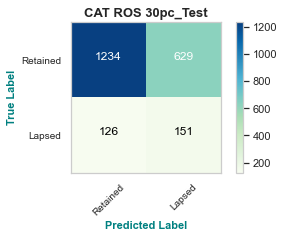

CAT ROS 30pc_Test - Classification Report
              precision    recall  f1-score   support

         0.0       0.91      0.66      0.77      1863
         1.0       0.19      0.55      0.29       277

    accuracy                           0.65      2140
   macro avg       0.55      0.60      0.53      2140
weighted avg       0.81      0.65      0.70      2140



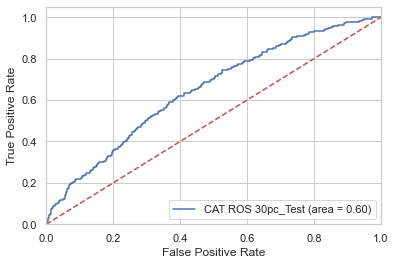

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


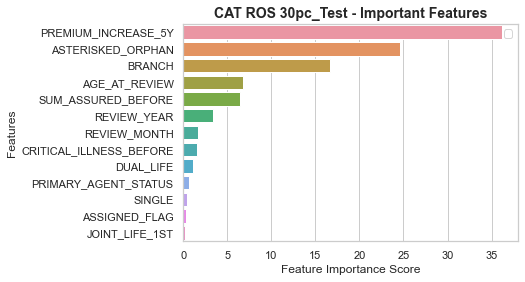

0:	learn: 0.6924702	total: 3.34ms	remaining: 164ms
1:	learn: 0.6919193	total: 6.1ms	remaining: 146ms
2:	learn: 0.6912961	total: 9.08ms	remaining: 142ms
3:	learn: 0.6907715	total: 12ms	remaining: 138ms
4:	learn: 0.6902361	total: 15.4ms	remaining: 139ms
5:	learn: 0.6896587	total: 18ms	remaining: 132ms
6:	learn: 0.6891294	total: 20.8ms	remaining: 128ms
7:	learn: 0.6886219	total: 23.6ms	remaining: 124ms
8:	learn: 0.6881517	total: 26.5ms	remaining: 121ms
9:	learn: 0.6876621	total: 29.6ms	remaining: 118ms
10:	learn: 0.6871477	total: 33.9ms	remaining: 120ms
11:	learn: 0.6866374	total: 37.1ms	remaining: 117ms
12:	learn: 0.6860354	total: 40ms	remaining: 114ms
13:	learn: 0.6854647	total: 42.5ms	remaining: 109ms
14:	learn: 0.6849902	total: 45.7ms	remaining: 107ms
15:	learn: 0.6845236	total: 49.2ms	remaining: 105ms
16:	learn: 0.6839815	total: 51.8ms	remaining: 100ms
17:	learn: 0.6835468	total: 54.3ms	remaining: 96.5ms
18:	learn: 0.6830957	total: 56.7ms	remaining: 92.5ms
19:	learn: 0.6825383	total:

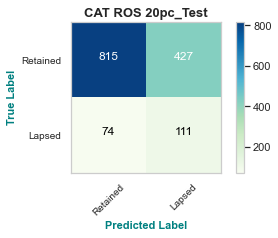

CAT ROS 20pc_Test - Classification Report
              precision    recall  f1-score   support

         0.0       0.92      0.66      0.76      1242
         1.0       0.21      0.60      0.31       185

    accuracy                           0.65      1427
   macro avg       0.56      0.63      0.54      1427
weighted avg       0.82      0.65      0.71      1427



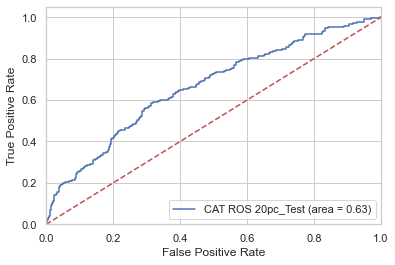

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


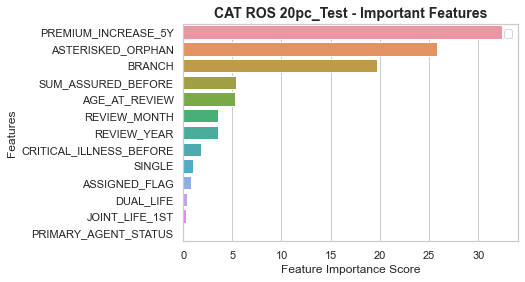

0:	learn: 0.6924594	total: 3.53ms	remaining: 349ms
1:	learn: 0.6918277	total: 6.69ms	remaining: 328ms
2:	learn: 0.6911997	total: 9.6ms	remaining: 310ms
3:	learn: 0.6906301	total: 13.7ms	remaining: 329ms
4:	learn: 0.6901168	total: 16.9ms	remaining: 321ms
5:	learn: 0.6894725	total: 19.9ms	remaining: 311ms
6:	learn: 0.6888596	total: 22.9ms	remaining: 304ms
7:	learn: 0.6882453	total: 25.9ms	remaining: 298ms
8:	learn: 0.6877641	total: 29ms	remaining: 294ms
9:	learn: 0.6872294	total: 32.3ms	remaining: 291ms
10:	learn: 0.6865957	total: 35.5ms	remaining: 288ms
11:	learn: 0.6860445	total: 38.7ms	remaining: 284ms
12:	learn: 0.6854545	total: 41.9ms	remaining: 281ms
13:	learn: 0.6848000	total: 44.6ms	remaining: 274ms
14:	learn: 0.6843123	total: 47.3ms	remaining: 268ms
15:	learn: 0.6838665	total: 50.5ms	remaining: 265ms
16:	learn: 0.6833158	total: 53.9ms	remaining: 263ms
17:	learn: 0.6828799	total: 56.7ms	remaining: 258ms
18:	learn: 0.6824043	total: 59.4ms	remaining: 253ms
19:	learn: 0.6818110	tota

CAT ROS_90pc_Train F1 Score : 31.00%
CAT ROS_10pc_Test F1 Score : 30.37%


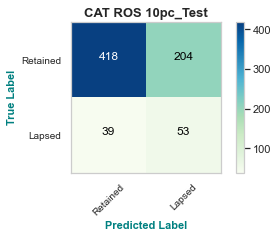

CAT ROS 10pc_Test - Classification Report
              precision    recall  f1-score   support

         0.0       0.91      0.67      0.77       622
         1.0       0.21      0.58      0.30        92

    accuracy                           0.66       714
   macro avg       0.56      0.62      0.54       714
weighted avg       0.82      0.66      0.71       714



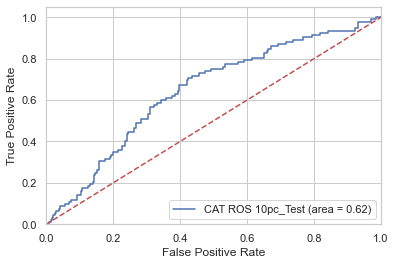

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


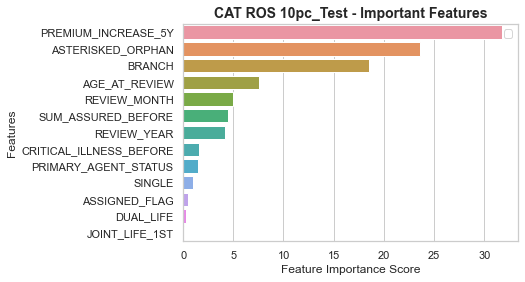

0:	learn: 0.4600148	total: 6.02ms	remaining: 596ms
1:	learn: 0.3924425	total: 11.9ms	remaining: 583ms
2:	learn: 0.3355119	total: 17.4ms	remaining: 562ms
3:	learn: 0.3061151	total: 23.5ms	remaining: 564ms
4:	learn: 0.2924091	total: 30ms	remaining: 570ms
5:	learn: 0.2843938	total: 36.7ms	remaining: 575ms
6:	learn: 0.2782806	total: 43.3ms	remaining: 575ms
7:	learn: 0.2712106	total: 49.5ms	remaining: 570ms
8:	learn: 0.2658576	total: 55ms	remaining: 556ms
9:	learn: 0.2593426	total: 61.3ms	remaining: 552ms
10:	learn: 0.2550965	total: 68.3ms	remaining: 553ms
11:	learn: 0.2482986	total: 74.3ms	remaining: 545ms
12:	learn: 0.2406016	total: 79.8ms	remaining: 534ms
13:	learn: 0.2386297	total: 86.1ms	remaining: 529ms
14:	learn: 0.2332732	total: 92.3ms	remaining: 523ms
15:	learn: 0.2308157	total: 98.1ms	remaining: 515ms
16:	learn: 0.2277834	total: 104ms	remaining: 508ms
17:	learn: 0.2243686	total: 109ms	remaining: 496ms
18:	learn: 0.2212523	total: 114ms	remaining: 488ms
19:	learn: 0.2162311	total: 1

CAT ADASYN_70pc_Train F1 Score : 66.40%
CAT ADASYN_30pc_Test F1 Score : 6.30%


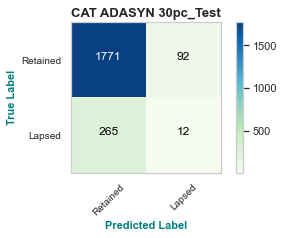

CAT ADASYN 30pc_Test - Classification Report
              precision    recall  f1-score   support

         0.0       0.87      0.95      0.91      1863
         1.0       0.12      0.04      0.06       277

    accuracy                           0.83      2140
   macro avg       0.49      0.50      0.49      2140
weighted avg       0.77      0.83      0.80      2140



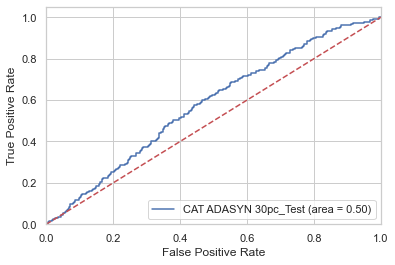

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


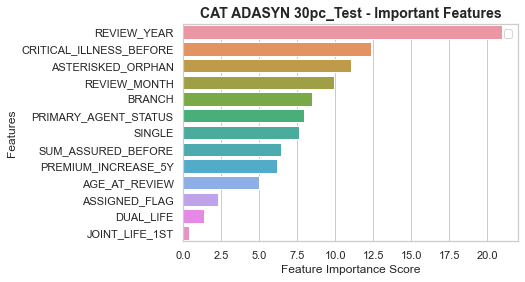

0:	learn: 0.4825615	total: 7.39ms	remaining: 732ms
1:	learn: 0.4110143	total: 15.3ms	remaining: 751ms
2:	learn: 0.3525485	total: 21.5ms	remaining: 694ms
3:	learn: 0.3142116	total: 29.4ms	remaining: 706ms
4:	learn: 0.2981142	total: 35.5ms	remaining: 675ms
5:	learn: 0.2857930	total: 42.3ms	remaining: 663ms
6:	learn: 0.2787359	total: 49.7ms	remaining: 660ms
7:	learn: 0.2734407	total: 55.7ms	remaining: 641ms
8:	learn: 0.2682345	total: 65.3ms	remaining: 661ms
9:	learn: 0.2640615	total: 71.2ms	remaining: 641ms
10:	learn: 0.2574885	total: 77.1ms	remaining: 624ms
11:	learn: 0.2476884	total: 83.9ms	remaining: 615ms
12:	learn: 0.2423728	total: 89.4ms	remaining: 598ms
13:	learn: 0.2389728	total: 97.7ms	remaining: 600ms
14:	learn: 0.2353508	total: 103ms	remaining: 586ms
15:	learn: 0.2287728	total: 110ms	remaining: 580ms
16:	learn: 0.2262628	total: 117ms	remaining: 572ms
17:	learn: 0.2234233	total: 124ms	remaining: 565ms
18:	learn: 0.2200144	total: 131ms	remaining: 559ms
19:	learn: 0.2169229	total:

79:	learn: 0.1381736	total: 381ms	remaining: 95.2ms
80:	learn: 0.1373986	total: 386ms	remaining: 90.6ms
81:	learn: 0.1363858	total: 392ms	remaining: 86ms
82:	learn: 0.1355181	total: 397ms	remaining: 81.4ms
83:	learn: 0.1350799	total: 403ms	remaining: 76.8ms
84:	learn: 0.1341146	total: 410ms	remaining: 72.4ms
85:	learn: 0.1332803	total: 416ms	remaining: 67.6ms
86:	learn: 0.1324856	total: 422ms	remaining: 63ms
87:	learn: 0.1316338	total: 428ms	remaining: 58.3ms
88:	learn: 0.1308563	total: 434ms	remaining: 53.6ms
89:	learn: 0.1304355	total: 440ms	remaining: 48.9ms
90:	learn: 0.1300524	total: 445ms	remaining: 44ms
91:	learn: 0.1290739	total: 450ms	remaining: 39.1ms
92:	learn: 0.1279693	total: 454ms	remaining: 34.2ms
93:	learn: 0.1274985	total: 460ms	remaining: 29.4ms
94:	learn: 0.1262633	total: 465ms	remaining: 24.5ms
95:	learn: 0.1253166	total: 471ms	remaining: 19.6ms
96:	learn: 0.1246537	total: 476ms	remaining: 14.7ms
97:	learn: 0.1239160	total: 481ms	remaining: 9.82ms
98:	learn: 0.12329

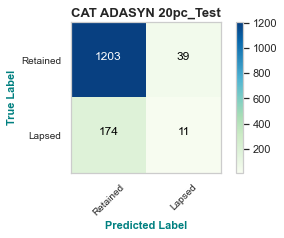

CAT ADASYN 20pc_Test - Classification Report
              precision    recall  f1-score   support

         0.0       0.87      0.97      0.92      1242
         1.0       0.22      0.06      0.09       185

    accuracy                           0.85      1427
   macro avg       0.55      0.51      0.51      1427
weighted avg       0.79      0.85      0.81      1427



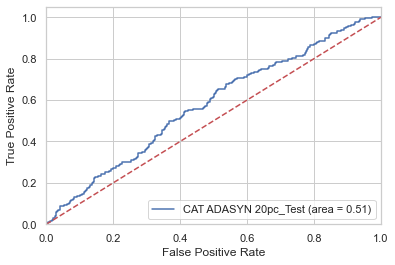

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


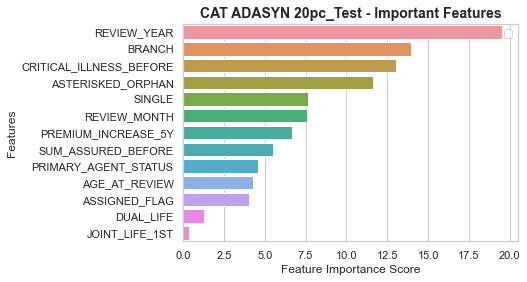

0:	learn: 0.4649698	total: 5.03ms	remaining: 498ms
1:	learn: 0.3949674	total: 9.99ms	remaining: 490ms
2:	learn: 0.3491680	total: 14.5ms	remaining: 470ms
3:	learn: 0.2986081	total: 19.8ms	remaining: 476ms
4:	learn: 0.2902316	total: 24.7ms	remaining: 470ms
5:	learn: 0.2783804	total: 29.2ms	remaining: 458ms
6:	learn: 0.2701591	total: 33.9ms	remaining: 451ms
7:	learn: 0.2638000	total: 38.9ms	remaining: 448ms
8:	learn: 0.2585128	total: 43.5ms	remaining: 440ms
9:	learn: 0.2552562	total: 47.9ms	remaining: 431ms
10:	learn: 0.2502486	total: 52.6ms	remaining: 426ms
11:	learn: 0.2472106	total: 57ms	remaining: 418ms
12:	learn: 0.2426047	total: 61.2ms	remaining: 409ms
13:	learn: 0.2391083	total: 65.2ms	remaining: 401ms
14:	learn: 0.2355013	total: 70ms	remaining: 397ms
15:	learn: 0.2339510	total: 74.3ms	remaining: 390ms
16:	learn: 0.2287210	total: 78.8ms	remaining: 385ms
17:	learn: 0.2219420	total: 84.2ms	remaining: 384ms
18:	learn: 0.2181647	total: 88.5ms	remaining: 377ms
19:	learn: 0.2152152	total

78:	learn: 0.1431722	total: 355ms	remaining: 94.5ms
79:	learn: 0.1426006	total: 361ms	remaining: 90.3ms
80:	learn: 0.1417197	total: 366ms	remaining: 85.8ms
81:	learn: 0.1410965	total: 370ms	remaining: 81.2ms
82:	learn: 0.1398642	total: 375ms	remaining: 76.8ms
83:	learn: 0.1393785	total: 381ms	remaining: 72.6ms
84:	learn: 0.1384240	total: 387ms	remaining: 68.3ms
85:	learn: 0.1374493	total: 392ms	remaining: 63.9ms
86:	learn: 0.1369426	total: 397ms	remaining: 59.4ms
87:	learn: 0.1364176	total: 402ms	remaining: 54.8ms
88:	learn: 0.1356389	total: 407ms	remaining: 50.3ms
89:	learn: 0.1349656	total: 412ms	remaining: 45.8ms
90:	learn: 0.1338395	total: 417ms	remaining: 41.2ms
91:	learn: 0.1332894	total: 422ms	remaining: 36.7ms
92:	learn: 0.1327128	total: 427ms	remaining: 32.1ms
93:	learn: 0.1313566	total: 432ms	remaining: 27.5ms
94:	learn: 0.1311490	total: 436ms	remaining: 23ms
95:	learn: 0.1308151	total: 441ms	remaining: 18.4ms
96:	learn: 0.1302871	total: 446ms	remaining: 13.8ms
97:	learn: 0.1

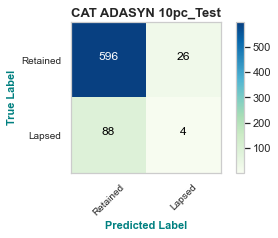

CAT ADASYN 10pc_Test - Classification Report
              precision    recall  f1-score   support

         0.0       0.87      0.96      0.91       622
         1.0       0.13      0.04      0.07        92

    accuracy                           0.84       714
   macro avg       0.50      0.50      0.49       714
weighted avg       0.78      0.84      0.80       714



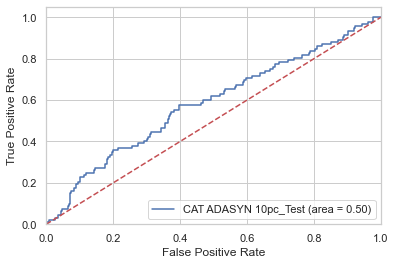

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


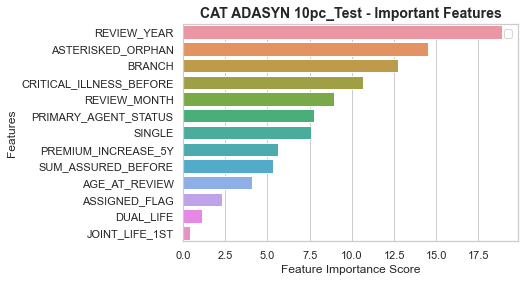

0:	learn: 0.4619012	total: 6.61ms	remaining: 655ms
1:	learn: 0.4005916	total: 12.9ms	remaining: 632ms
2:	learn: 0.3449300	total: 19.3ms	remaining: 623ms
3:	learn: 0.3126803	total: 25.6ms	remaining: 614ms
4:	learn: 0.2995971	total: 31.1ms	remaining: 590ms
5:	learn: 0.2936290	total: 37.1ms	remaining: 581ms
6:	learn: 0.2843877	total: 44.1ms	remaining: 586ms
7:	learn: 0.2767131	total: 50.2ms	remaining: 577ms
8:	learn: 0.2729021	total: 56.4ms	remaining: 570ms
9:	learn: 0.2668693	total: 62.2ms	remaining: 560ms
10:	learn: 0.2607701	total: 68.4ms	remaining: 554ms
11:	learn: 0.2554206	total: 74.9ms	remaining: 549ms
12:	learn: 0.2472201	total: 80.9ms	remaining: 542ms
13:	learn: 0.2441085	total: 86.6ms	remaining: 532ms
14:	learn: 0.2330608	total: 92.3ms	remaining: 523ms
15:	learn: 0.2289904	total: 98.2ms	remaining: 515ms
16:	learn: 0.2255342	total: 105ms	remaining: 513ms
17:	learn: 0.2231140	total: 111ms	remaining: 507ms
18:	learn: 0.2188246	total: 117ms	remaining: 499ms
19:	learn: 0.2165128	tota

82:	learn: 0.1319903	total: 390ms	remaining: 79.8ms
83:	learn: 0.1309227	total: 395ms	remaining: 75.2ms
84:	learn: 0.1296984	total: 400ms	remaining: 70.6ms
85:	learn: 0.1290393	total: 405ms	remaining: 65.9ms
86:	learn: 0.1283172	total: 410ms	remaining: 61.3ms
87:	learn: 0.1263506	total: 415ms	remaining: 56.6ms
88:	learn: 0.1260080	total: 421ms	remaining: 52.1ms
89:	learn: 0.1253487	total: 425ms	remaining: 47.2ms
90:	learn: 0.1247954	total: 429ms	remaining: 42.4ms
91:	learn: 0.1239458	total: 433ms	remaining: 37.7ms
92:	learn: 0.1231625	total: 437ms	remaining: 32.9ms
93:	learn: 0.1224200	total: 441ms	remaining: 28.1ms
94:	learn: 0.1222204	total: 444ms	remaining: 23.4ms
95:	learn: 0.1216937	total: 448ms	remaining: 18.7ms
96:	learn: 0.1210963	total: 453ms	remaining: 14ms
97:	learn: 0.1201388	total: 457ms	remaining: 9.32ms
98:	learn: 0.1180727	total: 461ms	remaining: 4.65ms
99:	learn: 0.1173554	total: 465ms	remaining: 0us
CAT SMOTE_70pc_Train F1 Score : 63.98%
CAT SMOTE_30pc_Test F1 Score :

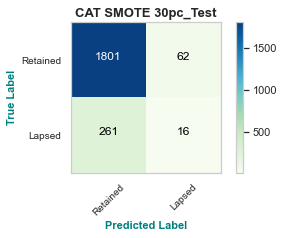

CAT SMOTE 30pc_Test - Classification Report
              precision    recall  f1-score   support

         0.0       0.87      0.97      0.92      1863
         1.0       0.21      0.06      0.09       277

    accuracy                           0.85      2140
   macro avg       0.54      0.51      0.50      2140
weighted avg       0.79      0.85      0.81      2140



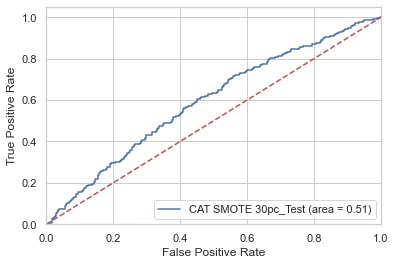

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


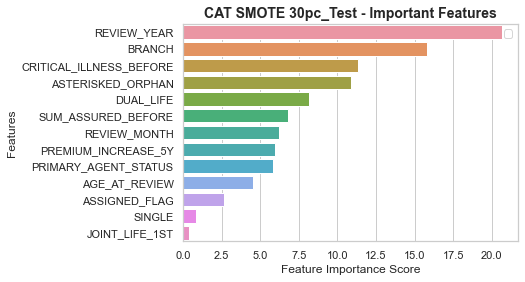

0:	learn: 0.4663835	total: 7ms	remaining: 693ms
1:	learn: 0.3951442	total: 13.8ms	remaining: 679ms
2:	learn: 0.3402536	total: 19.6ms	remaining: 634ms
3:	learn: 0.3035596	total: 26.8ms	remaining: 643ms
4:	learn: 0.2971983	total: 32.8ms	remaining: 623ms
5:	learn: 0.2855485	total: 39.2ms	remaining: 614ms
6:	learn: 0.2697065	total: 45.2ms	remaining: 601ms
7:	learn: 0.2660733	total: 50.9ms	remaining: 586ms
8:	learn: 0.2580479	total: 56ms	remaining: 566ms
9:	learn: 0.2528056	total: 60.8ms	remaining: 547ms
10:	learn: 0.2500603	total: 65.3ms	remaining: 528ms
11:	learn: 0.2456155	total: 70.6ms	remaining: 518ms
12:	learn: 0.2423964	total: 75.2ms	remaining: 504ms
13:	learn: 0.2383615	total: 80.4ms	remaining: 494ms
14:	learn: 0.2353538	total: 85.5ms	remaining: 484ms
15:	learn: 0.2305309	total: 90ms	remaining: 473ms
16:	learn: 0.2287819	total: 102ms	remaining: 499ms
17:	learn: 0.2228337	total: 107ms	remaining: 486ms
18:	learn: 0.2188665	total: 111ms	remaining: 473ms
19:	learn: 0.2153631	total: 116m

72:	learn: 0.1391571	total: 355ms	remaining: 131ms
73:	learn: 0.1379368	total: 361ms	remaining: 127ms
74:	learn: 0.1373951	total: 367ms	remaining: 122ms
75:	learn: 0.1370073	total: 372ms	remaining: 118ms
76:	learn: 0.1362502	total: 378ms	remaining: 113ms
77:	learn: 0.1358217	total: 383ms	remaining: 108ms
78:	learn: 0.1355375	total: 388ms	remaining: 103ms
79:	learn: 0.1348967	total: 394ms	remaining: 98.6ms
80:	learn: 0.1343600	total: 399ms	remaining: 93.6ms
81:	learn: 0.1335949	total: 404ms	remaining: 88.7ms
82:	learn: 0.1328736	total: 409ms	remaining: 83.8ms
83:	learn: 0.1319618	total: 414ms	remaining: 78.8ms
84:	learn: 0.1315836	total: 419ms	remaining: 73.9ms
85:	learn: 0.1309636	total: 424ms	remaining: 69ms
86:	learn: 0.1300062	total: 428ms	remaining: 64ms
87:	learn: 0.1289530	total: 432ms	remaining: 59ms
88:	learn: 0.1283157	total: 438ms	remaining: 54.1ms
89:	learn: 0.1273360	total: 443ms	remaining: 49.3ms
90:	learn: 0.1262609	total: 448ms	remaining: 44.4ms
91:	learn: 0.1253108	tota

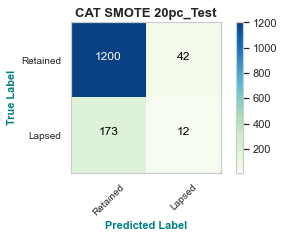

CAT SMOTE 20pc_Test - Classification Report
              precision    recall  f1-score   support

         0.0       0.87      0.97      0.92      1242
         1.0       0.22      0.06      0.10       185

    accuracy                           0.85      1427
   macro avg       0.55      0.52      0.51      1427
weighted avg       0.79      0.85      0.81      1427



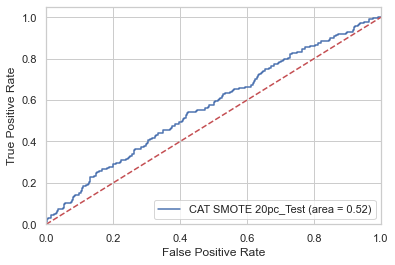

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


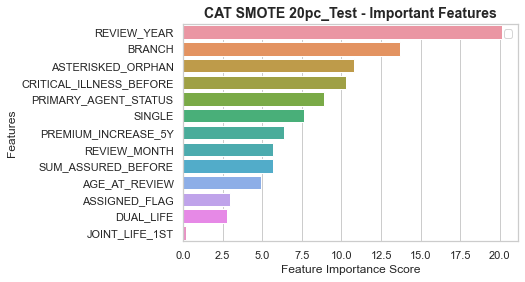

0:	learn: 0.4738892	total: 7.99ms	remaining: 791ms
1:	learn: 0.3965497	total: 14.7ms	remaining: 719ms
2:	learn: 0.3545114	total: 21.9ms	remaining: 709ms
3:	learn: 0.3091441	total: 28.3ms	remaining: 679ms
4:	learn: 0.2989038	total: 35.8ms	remaining: 680ms
5:	learn: 0.2872731	total: 42.1ms	remaining: 659ms
6:	learn: 0.2800769	total: 48.5ms	remaining: 644ms
7:	learn: 0.2739748	total: 56.2ms	remaining: 647ms
8:	learn: 0.2692290	total: 62.3ms	remaining: 630ms
9:	learn: 0.2620664	total: 69.3ms	remaining: 623ms
10:	learn: 0.2591413	total: 75.3ms	remaining: 609ms
11:	learn: 0.2525694	total: 83ms	remaining: 608ms
12:	learn: 0.2447287	total: 89.6ms	remaining: 600ms
13:	learn: 0.2400265	total: 97.1ms	remaining: 596ms
14:	learn: 0.2363727	total: 105ms	remaining: 594ms
15:	learn: 0.2323161	total: 112ms	remaining: 587ms
16:	learn: 0.2297378	total: 121ms	remaining: 592ms
17:	learn: 0.2263941	total: 130ms	remaining: 594ms
18:	learn: 0.2230753	total: 139ms	remaining: 591ms
19:	learn: 0.2199604	total: 1

83:	learn: 0.1419911	total: 609ms	remaining: 116ms
84:	learn: 0.1413215	total: 615ms	remaining: 109ms
85:	learn: 0.1411031	total: 621ms	remaining: 101ms
86:	learn: 0.1401775	total: 627ms	remaining: 93.7ms
87:	learn: 0.1395908	total: 633ms	remaining: 86.4ms
88:	learn: 0.1392244	total: 640ms	remaining: 79.1ms
89:	learn: 0.1385238	total: 645ms	remaining: 71.7ms
90:	learn: 0.1379226	total: 651ms	remaining: 64.4ms
91:	learn: 0.1370913	total: 657ms	remaining: 57.1ms
92:	learn: 0.1366056	total: 662ms	remaining: 49.8ms
93:	learn: 0.1360392	total: 667ms	remaining: 42.6ms
94:	learn: 0.1345394	total: 673ms	remaining: 35.4ms
95:	learn: 0.1337858	total: 678ms	remaining: 28.3ms
96:	learn: 0.1326423	total: 683ms	remaining: 21.1ms
97:	learn: 0.1317088	total: 689ms	remaining: 14.1ms
98:	learn: 0.1308428	total: 694ms	remaining: 7.01ms
99:	learn: 0.1301502	total: 699ms	remaining: 0us
CAT SMOTE_90pc_Train F1 Score : 57.19%
CAT SMOTE_10pc_Test F1 Score : 8.47%


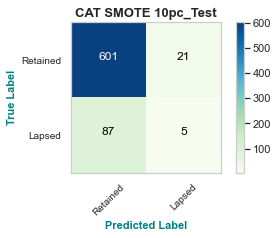

CAT SMOTE 10pc_Test - Classification Report
              precision    recall  f1-score   support

         0.0       0.87      0.97      0.92       622
         1.0       0.19      0.05      0.08        92

    accuracy                           0.85       714
   macro avg       0.53      0.51      0.50       714
weighted avg       0.79      0.85      0.81       714



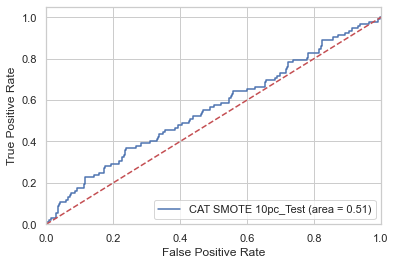

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


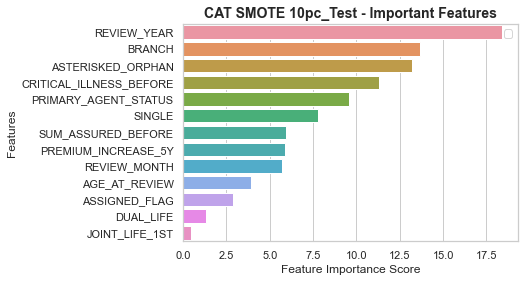

0:	learn: 0.4720355	total: 6.76ms	remaining: 669ms
1:	learn: 0.3981986	total: 12.8ms	remaining: 627ms
2:	learn: 0.3488826	total: 19.1ms	remaining: 618ms
3:	learn: 0.3192418	total: 26.7ms	remaining: 640ms
4:	learn: 0.3026507	total: 33.7ms	remaining: 641ms
5:	learn: 0.2879572	total: 39.9ms	remaining: 625ms
6:	learn: 0.2834738	total: 46ms	remaining: 611ms
7:	learn: 0.2752710	total: 52.2ms	remaining: 600ms
8:	learn: 0.2706012	total: 59.9ms	remaining: 605ms
9:	learn: 0.2667098	total: 65.9ms	remaining: 593ms
10:	learn: 0.2621133	total: 71.1ms	remaining: 575ms
11:	learn: 0.2581538	total: 77.3ms	remaining: 567ms
12:	learn: 0.2507751	total: 83.3ms	remaining: 558ms
13:	learn: 0.2466840	total: 89.3ms	remaining: 549ms
14:	learn: 0.2437618	total: 95.1ms	remaining: 539ms
15:	learn: 0.2402865	total: 100ms	remaining: 525ms
16:	learn: 0.2355692	total: 106ms	remaining: 516ms
17:	learn: 0.2314684	total: 111ms	remaining: 505ms
18:	learn: 0.2290430	total: 116ms	remaining: 494ms
19:	learn: 0.2246946	total: 

71:	learn: 0.1401402	total: 360ms	remaining: 140ms
72:	learn: 0.1392171	total: 364ms	remaining: 135ms
73:	learn: 0.1376458	total: 369ms	remaining: 130ms
74:	learn: 0.1367238	total: 373ms	remaining: 124ms
75:	learn: 0.1353099	total: 377ms	remaining: 119ms
76:	learn: 0.1352255	total: 381ms	remaining: 114ms
77:	learn: 0.1345892	total: 386ms	remaining: 109ms
78:	learn: 0.1345357	total: 390ms	remaining: 104ms
79:	learn: 0.1342869	total: 394ms	remaining: 98.6ms
80:	learn: 0.1339773	total: 398ms	remaining: 93.4ms
81:	learn: 0.1332972	total: 402ms	remaining: 88.3ms
82:	learn: 0.1323435	total: 406ms	remaining: 83.2ms
83:	learn: 0.1307792	total: 411ms	remaining: 78.2ms
84:	learn: 0.1298632	total: 415ms	remaining: 73.2ms
85:	learn: 0.1289226	total: 419ms	remaining: 68.2ms
86:	learn: 0.1273356	total: 423ms	remaining: 63.2ms
87:	learn: 0.1267495	total: 427ms	remaining: 58.2ms
88:	learn: 0.1261375	total: 431ms	remaining: 53.3ms
89:	learn: 0.1257547	total: 435ms	remaining: 48.3ms
90:	learn: 0.1251940

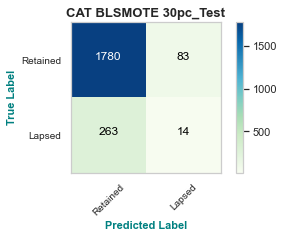

CAT BLSMOTE 30pc_Test - Classification Report
              precision    recall  f1-score   support

         0.0       0.87      0.96      0.91      1863
         1.0       0.14      0.05      0.07       277

    accuracy                           0.84      2140
   macro avg       0.51      0.50      0.49      2140
weighted avg       0.78      0.84      0.80      2140



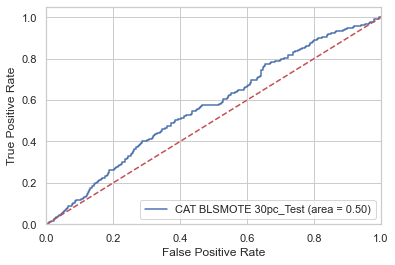

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


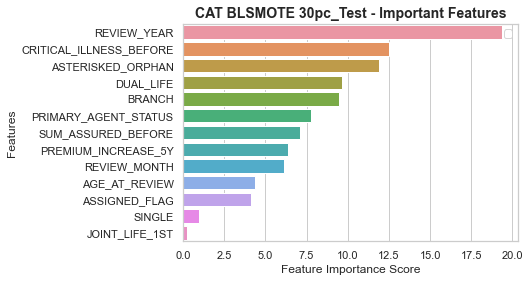

0:	learn: 0.4774076	total: 8.32ms	remaining: 824ms
1:	learn: 0.3971413	total: 15ms	remaining: 735ms
2:	learn: 0.3403041	total: 22.3ms	remaining: 722ms
3:	learn: 0.3118976	total: 30ms	remaining: 720ms
4:	learn: 0.2955584	total: 36.9ms	remaining: 701ms
5:	learn: 0.2862155	total: 44ms	remaining: 689ms
6:	learn: 0.2781192	total: 50.5ms	remaining: 671ms
7:	learn: 0.2715663	total: 57.3ms	remaining: 659ms
8:	learn: 0.2635608	total: 63.9ms	remaining: 646ms
9:	learn: 0.2593088	total: 71.2ms	remaining: 640ms
10:	learn: 0.2567414	total: 77.9ms	remaining: 630ms
11:	learn: 0.2516138	total: 85.8ms	remaining: 629ms
12:	learn: 0.2451387	total: 92.4ms	remaining: 618ms
13:	learn: 0.2411013	total: 100ms	remaining: 616ms
14:	learn: 0.2382423	total: 108ms	remaining: 611ms
15:	learn: 0.2350040	total: 117ms	remaining: 612ms
16:	learn: 0.2303330	total: 123ms	remaining: 600ms
17:	learn: 0.2280802	total: 129ms	remaining: 588ms
18:	learn: 0.2237588	total: 136ms	remaining: 580ms
19:	learn: 0.2213202	total: 143ms	

75:	learn: 0.1446371	total: 362ms	remaining: 114ms
76:	learn: 0.1438240	total: 366ms	remaining: 109ms
77:	learn: 0.1427690	total: 371ms	remaining: 105ms
78:	learn: 0.1417638	total: 375ms	remaining: 99.7ms
79:	learn: 0.1411138	total: 379ms	remaining: 94.8ms
80:	learn: 0.1407550	total: 384ms	remaining: 90ms
81:	learn: 0.1399275	total: 388ms	remaining: 85.2ms
82:	learn: 0.1391857	total: 393ms	remaining: 80.5ms
83:	learn: 0.1382960	total: 398ms	remaining: 75.7ms
84:	learn: 0.1378266	total: 402ms	remaining: 70.9ms
85:	learn: 0.1369640	total: 406ms	remaining: 66.1ms
86:	learn: 0.1364776	total: 410ms	remaining: 61.3ms
87:	learn: 0.1356891	total: 415ms	remaining: 56.6ms
88:	learn: 0.1350016	total: 419ms	remaining: 51.8ms
89:	learn: 0.1342933	total: 423ms	remaining: 47ms
90:	learn: 0.1333694	total: 427ms	remaining: 42.3ms
91:	learn: 0.1327746	total: 431ms	remaining: 37.5ms
92:	learn: 0.1322961	total: 435ms	remaining: 32.8ms
93:	learn: 0.1315337	total: 440ms	remaining: 28.1ms
94:	learn: 0.130698

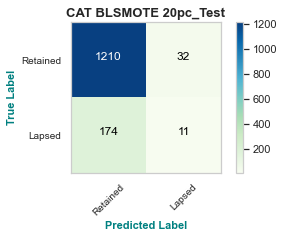

CAT BLSMOTE 20pc_Test - Classification Report
              precision    recall  f1-score   support

         0.0       0.87      0.97      0.92      1242
         1.0       0.26      0.06      0.10       185

    accuracy                           0.86      1427
   macro avg       0.57      0.52      0.51      1427
weighted avg       0.79      0.86      0.81      1427



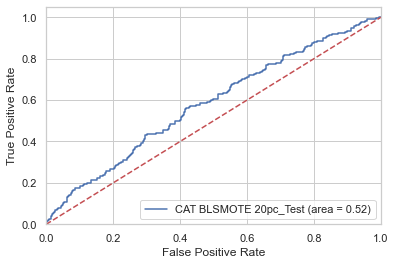

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


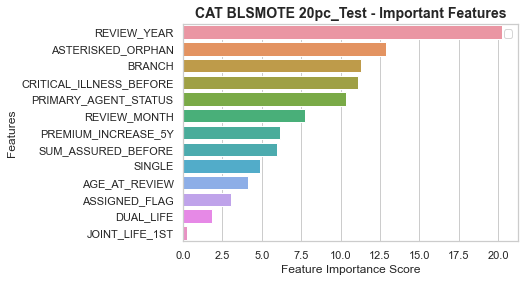

0:	learn: 0.4682011	total: 5.71ms	remaining: 566ms
1:	learn: 0.3887051	total: 11.5ms	remaining: 564ms
2:	learn: 0.3467864	total: 16.8ms	remaining: 542ms
3:	learn: 0.3131590	total: 22.8ms	remaining: 548ms
4:	learn: 0.3015286	total: 28.6ms	remaining: 543ms
5:	learn: 0.2912272	total: 34.4ms	remaining: 538ms
6:	learn: 0.2797883	total: 40.9ms	remaining: 544ms
7:	learn: 0.2708237	total: 46.8ms	remaining: 538ms
8:	learn: 0.2681732	total: 52.7ms	remaining: 533ms
9:	learn: 0.2632712	total: 59.4ms	remaining: 534ms
10:	learn: 0.2585912	total: 67ms	remaining: 542ms
11:	learn: 0.2495568	total: 72.1ms	remaining: 529ms
12:	learn: 0.2453238	total: 78.7ms	remaining: 526ms
13:	learn: 0.2398171	total: 84.4ms	remaining: 518ms
14:	learn: 0.2372145	total: 90.4ms	remaining: 512ms
15:	learn: 0.2342318	total: 96ms	remaining: 504ms
16:	learn: 0.2300437	total: 101ms	remaining: 495ms
17:	learn: 0.2241793	total: 108ms	remaining: 492ms
18:	learn: 0.2214996	total: 113ms	remaining: 482ms
19:	learn: 0.2198072	total: 1

81:	learn: 0.1398653	total: 362ms	remaining: 79.5ms
82:	learn: 0.1389438	total: 367ms	remaining: 75.1ms
83:	learn: 0.1379418	total: 371ms	remaining: 70.8ms
84:	learn: 0.1371241	total: 378ms	remaining: 66.6ms
85:	learn: 0.1366826	total: 382ms	remaining: 62.2ms
86:	learn: 0.1355093	total: 387ms	remaining: 57.8ms
87:	learn: 0.1348258	total: 392ms	remaining: 53.5ms
88:	learn: 0.1338136	total: 397ms	remaining: 49ms
89:	learn: 0.1331706	total: 401ms	remaining: 44.6ms
90:	learn: 0.1328075	total: 406ms	remaining: 40.1ms
91:	learn: 0.1325220	total: 410ms	remaining: 35.7ms
92:	learn: 0.1315117	total: 415ms	remaining: 31.2ms
93:	learn: 0.1313446	total: 419ms	remaining: 26.8ms
94:	learn: 0.1299796	total: 424ms	remaining: 22.3ms
95:	learn: 0.1291546	total: 428ms	remaining: 17.8ms
96:	learn: 0.1281054	total: 433ms	remaining: 13.4ms
97:	learn: 0.1275915	total: 437ms	remaining: 8.92ms
98:	learn: 0.1271858	total: 442ms	remaining: 4.46ms
99:	learn: 0.1269855	total: 447ms	remaining: 0us
CAT BLSMOTE_90pc_

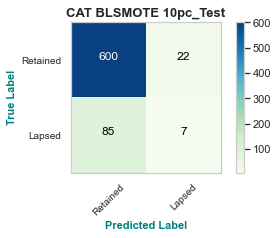

CAT BLSMOTE 10pc_Test - Classification Report
              precision    recall  f1-score   support

         0.0       0.88      0.96      0.92       622
         1.0       0.24      0.08      0.12        92

    accuracy                           0.85       714
   macro avg       0.56      0.52      0.52       714
weighted avg       0.79      0.85      0.81       714



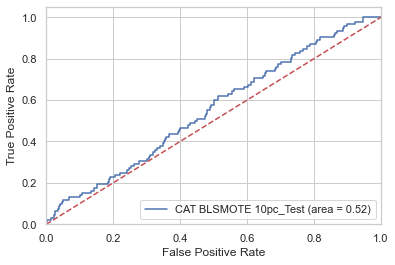

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


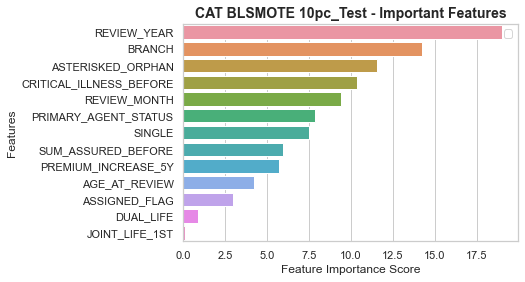

0:	learn: 0.4569776	total: 7.18ms	remaining: 711ms
1:	learn: 0.3657188	total: 14ms	remaining: 687ms
2:	learn: 0.3308880	total: 20.3ms	remaining: 656ms
3:	learn: 0.3049734	total: 27.8ms	remaining: 667ms
4:	learn: 0.2896975	total: 33.5ms	remaining: 637ms
5:	learn: 0.2785193	total: 40.2ms	remaining: 630ms
6:	learn: 0.2727690	total: 45.5ms	remaining: 605ms
7:	learn: 0.2689632	total: 57.2ms	remaining: 658ms
8:	learn: 0.2645722	total: 63ms	remaining: 638ms
9:	learn: 0.2602201	total: 68.5ms	remaining: 616ms
10:	learn: 0.2548619	total: 76.1ms	remaining: 615ms
11:	learn: 0.2438498	total: 89.7ms	remaining: 658ms
12:	learn: 0.2361083	total: 106ms	remaining: 710ms
13:	learn: 0.2323412	total: 114ms	remaining: 699ms
14:	learn: 0.2296781	total: 121ms	remaining: 687ms
15:	learn: 0.2267653	total: 136ms	remaining: 712ms
16:	learn: 0.2242944	total: 145ms	remaining: 706ms
17:	learn: 0.2199955	total: 155ms	remaining: 708ms
18:	learn: 0.2165651	total: 166ms	remaining: 707ms
19:	learn: 0.2115129	total: 180ms

63:	learn: 0.1364936	total: 374ms	remaining: 210ms
64:	learn: 0.1348027	total: 381ms	remaining: 205ms
65:	learn: 0.1336008	total: 389ms	remaining: 200ms
66:	learn: 0.1327662	total: 396ms	remaining: 195ms
67:	learn: 0.1304901	total: 403ms	remaining: 190ms
68:	learn: 0.1294434	total: 411ms	remaining: 185ms
69:	learn: 0.1280297	total: 417ms	remaining: 179ms
70:	learn: 0.1263653	total: 422ms	remaining: 172ms
71:	learn: 0.1253129	total: 429ms	remaining: 167ms
72:	learn: 0.1233758	total: 435ms	remaining: 161ms
73:	learn: 0.1231598	total: 440ms	remaining: 154ms
74:	learn: 0.1222400	total: 444ms	remaining: 148ms
75:	learn: 0.1205553	total: 450ms	remaining: 142ms
76:	learn: 0.1196192	total: 454ms	remaining: 136ms
77:	learn: 0.1186645	total: 460ms	remaining: 130ms
78:	learn: 0.1177262	total: 465ms	remaining: 124ms
79:	learn: 0.1166218	total: 470ms	remaining: 117ms
80:	learn: 0.1162047	total: 475ms	remaining: 111ms
81:	learn: 0.1154231	total: 480ms	remaining: 105ms
82:	learn: 0.1141690	total: 485

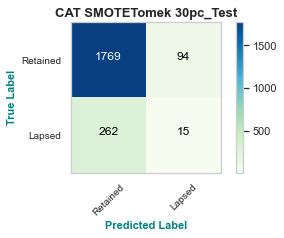

CAT SMOTETomek 30pc_Test - Classification Report
              precision    recall  f1-score   support

         0.0       0.87      0.95      0.91      1863
         1.0       0.14      0.05      0.08       277

    accuracy                           0.83      2140
   macro avg       0.50      0.50      0.49      2140
weighted avg       0.78      0.83      0.80      2140



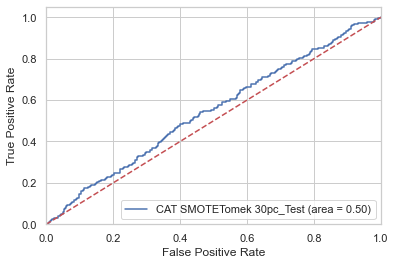

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


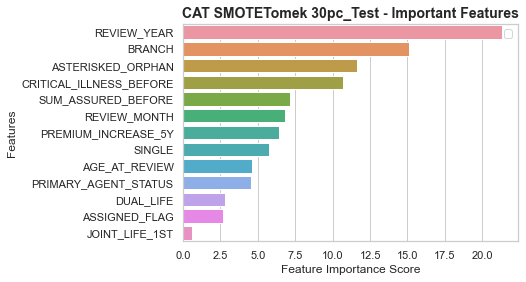

0:	learn: 0.4714164	total: 4.37ms	remaining: 433ms
1:	learn: 0.3953315	total: 8.47ms	remaining: 415ms
2:	learn: 0.3354178	total: 12.2ms	remaining: 394ms
3:	learn: 0.3105989	total: 15.8ms	remaining: 379ms
4:	learn: 0.2885276	total: 19.5ms	remaining: 370ms
5:	learn: 0.2794298	total: 23.1ms	remaining: 362ms
6:	learn: 0.2699086	total: 26.7ms	remaining: 354ms
7:	learn: 0.2670846	total: 30.4ms	remaining: 350ms
8:	learn: 0.2617073	total: 34.4ms	remaining: 348ms
9:	learn: 0.2536318	total: 38.2ms	remaining: 344ms
10:	learn: 0.2471519	total: 41.8ms	remaining: 338ms
11:	learn: 0.2433205	total: 45.3ms	remaining: 332ms
12:	learn: 0.2403051	total: 48.8ms	remaining: 326ms
13:	learn: 0.2344287	total: 52.4ms	remaining: 322ms
14:	learn: 0.2292258	total: 55.9ms	remaining: 317ms
15:	learn: 0.2246918	total: 60.4ms	remaining: 317ms
16:	learn: 0.2203123	total: 64ms	remaining: 312ms
17:	learn: 0.2146856	total: 68.4ms	remaining: 312ms
18:	learn: 0.2088984	total: 72ms	remaining: 307ms
19:	learn: 0.2052752	total

89:	learn: 0.1134325	total: 350ms	remaining: 38.9ms
90:	learn: 0.1132380	total: 356ms	remaining: 35.3ms
91:	learn: 0.1125469	total: 361ms	remaining: 31.4ms
92:	learn: 0.1119277	total: 366ms	remaining: 27.6ms
93:	learn: 0.1114755	total: 371ms	remaining: 23.7ms
94:	learn: 0.1111386	total: 376ms	remaining: 19.8ms
95:	learn: 0.1097614	total: 381ms	remaining: 15.9ms
96:	learn: 0.1090357	total: 387ms	remaining: 12ms
97:	learn: 0.1085348	total: 392ms	remaining: 8ms
98:	learn: 0.1080108	total: 396ms	remaining: 4ms
99:	learn: 0.1074657	total: 401ms	remaining: 0us
CAT SMOTETomek_80pc_Train F1 Score : 59.49%
CAT SMOTETomek_20pc_Test F1 Score : 10.08%


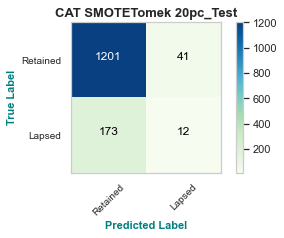

CAT SMOTETomek 20pc_Test - Classification Report
              precision    recall  f1-score   support

         0.0       0.87      0.97      0.92      1242
         1.0       0.23      0.06      0.10       185

    accuracy                           0.85      1427
   macro avg       0.55      0.52      0.51      1427
weighted avg       0.79      0.85      0.81      1427



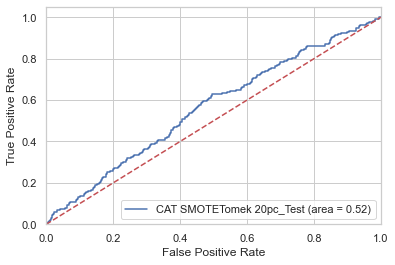

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


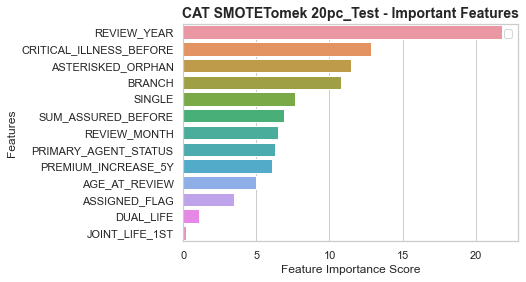

0:	learn: 0.4717279	total: 4.64ms	remaining: 459ms
1:	learn: 0.3916941	total: 9.49ms	remaining: 465ms
2:	learn: 0.3485484	total: 13.2ms	remaining: 428ms
3:	learn: 0.2999536	total: 16.8ms	remaining: 404ms
4:	learn: 0.2865194	total: 20.1ms	remaining: 383ms
5:	learn: 0.2727638	total: 23.5ms	remaining: 369ms
6:	learn: 0.2674123	total: 27.2ms	remaining: 361ms
7:	learn: 0.2637317	total: 30.8ms	remaining: 355ms
8:	learn: 0.2590785	total: 34.8ms	remaining: 352ms
9:	learn: 0.2547428	total: 38.4ms	remaining: 345ms
10:	learn: 0.2484688	total: 41.9ms	remaining: 339ms
11:	learn: 0.2374376	total: 45.5ms	remaining: 333ms
12:	learn: 0.2334302	total: 49.7ms	remaining: 333ms
13:	learn: 0.2301122	total: 53.4ms	remaining: 328ms
14:	learn: 0.2200399	total: 66.1ms	remaining: 374ms
15:	learn: 0.2156856	total: 69.8ms	remaining: 367ms
16:	learn: 0.2127230	total: 73.6ms	remaining: 359ms
17:	learn: 0.2096072	total: 77ms	remaining: 351ms
18:	learn: 0.2073423	total: 80.8ms	remaining: 345ms
19:	learn: 0.2056366	tot

89:	learn: 0.1192533	total: 363ms	remaining: 40.3ms
90:	learn: 0.1180641	total: 367ms	remaining: 36.3ms
91:	learn: 0.1173414	total: 371ms	remaining: 32.3ms
92:	learn: 0.1164518	total: 375ms	remaining: 28.3ms
93:	learn: 0.1160331	total: 380ms	remaining: 24.2ms
94:	learn: 0.1155481	total: 384ms	remaining: 20.2ms
95:	learn: 0.1149439	total: 388ms	remaining: 16.2ms
96:	learn: 0.1142919	total: 393ms	remaining: 12.1ms
97:	learn: 0.1132577	total: 396ms	remaining: 8.09ms
98:	learn: 0.1129232	total: 401ms	remaining: 4.05ms
99:	learn: 0.1126326	total: 405ms	remaining: 0us
CAT SMOTETomek_90pc_Train F1 Score : 56.57%
CAT SMOTETomek_10pc_Test F1 Score : 8.13%


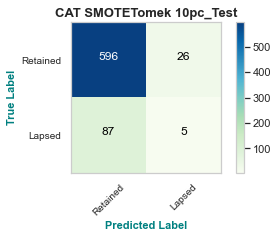

CAT SMOTETomek 10pc_Test - Classification Report
              precision    recall  f1-score   support

         0.0       0.87      0.96      0.91       622
         1.0       0.16      0.05      0.08        92

    accuracy                           0.84       714
   macro avg       0.52      0.51      0.50       714
weighted avg       0.78      0.84      0.81       714



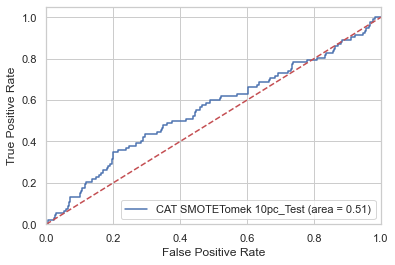

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


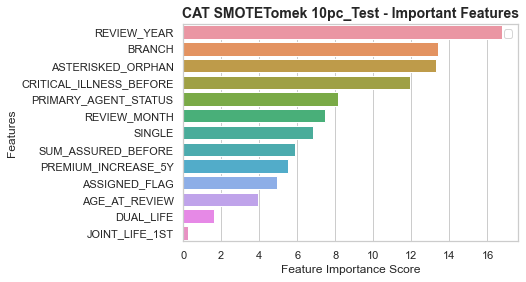

0:	learn: 0.6612866	total: 3.69ms	remaining: 33.2ms
1:	learn: 0.6354716	total: 7.3ms	remaining: 29.2ms
2:	learn: 0.6093825	total: 10.4ms	remaining: 24.4ms
3:	learn: 0.5828514	total: 14.5ms	remaining: 21.7ms
4:	learn: 0.5602770	total: 18.9ms	remaining: 18.9ms
5:	learn: 0.5430854	total: 22.1ms	remaining: 14.8ms
6:	learn: 0.5299332	total: 25.6ms	remaining: 11ms
7:	learn: 0.5140775	total: 29.3ms	remaining: 7.31ms
8:	learn: 0.4998848	total: 32.7ms	remaining: 3.63ms
9:	learn: 0.4848876	total: 36.5ms	remaining: 0us
Best parameters CAT SMOTEENN ('30pc_Test',): {'clf__learning_rate': 0.1, 'clf__n_estimators': 10}
0:	learn: 0.6612866	total: 4.29ms	remaining: 38.6ms
1:	learn: 0.6354716	total: 9.1ms	remaining: 36.4ms
2:	learn: 0.6093825	total: 13.9ms	remaining: 32.4ms
3:	learn: 0.5828514	total: 18.5ms	remaining: 27.7ms
4:	learn: 0.5602770	total: 22.5ms	remaining: 22.5ms
5:	learn: 0.5430854	total: 27.3ms	remaining: 18.2ms
6:	learn: 0.5299332	total: 33.7ms	remaining: 14.4ms
7:	learn: 0.5140775	total

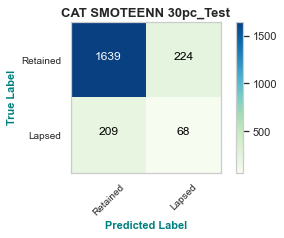

CAT SMOTEENN 30pc_Test - Classification Report
              precision    recall  f1-score   support

         0.0       0.89      0.88      0.88      1863
         1.0       0.23      0.25      0.24       277

    accuracy                           0.80      2140
   macro avg       0.56      0.56      0.56      2140
weighted avg       0.80      0.80      0.80      2140



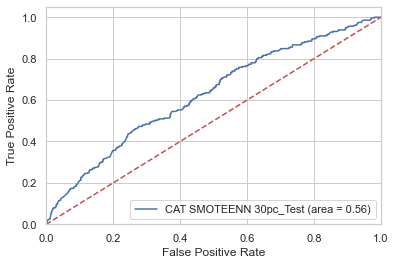

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


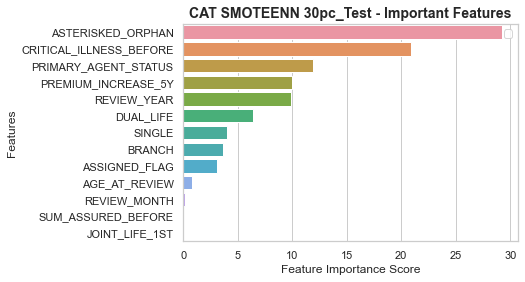

0:	learn: 0.6901397	total: 4.42ms	remaining: 39.8ms
1:	learn: 0.6867629	total: 8.36ms	remaining: 33.4ms
2:	learn: 0.6836352	total: 12.7ms	remaining: 29.6ms
3:	learn: 0.6801153	total: 17.1ms	remaining: 25.7ms
4:	learn: 0.6765268	total: 21.5ms	remaining: 21.5ms
5:	learn: 0.6733455	total: 25.9ms	remaining: 17.3ms
6:	learn: 0.6697411	total: 30.1ms	remaining: 12.9ms
7:	learn: 0.6664781	total: 34.2ms	remaining: 8.55ms
8:	learn: 0.6633176	total: 38.2ms	remaining: 4.25ms
9:	learn: 0.6603834	total: 43.1ms	remaining: 0us
Best parameters CAT SMOTEENN ('20pc_Test',): {'clf__learning_rate': 0.01, 'clf__n_estimators': 10}
0:	learn: 0.6901397	total: 7.21ms	remaining: 64.9ms
1:	learn: 0.6867629	total: 12.1ms	remaining: 48.5ms
2:	learn: 0.6836352	total: 16.7ms	remaining: 38.9ms
3:	learn: 0.6801153	total: 22.9ms	remaining: 34.3ms
4:	learn: 0.6765268	total: 27.4ms	remaining: 27.4ms
5:	learn: 0.6733455	total: 32.5ms	remaining: 21.7ms
6:	learn: 0.6697411	total: 37.4ms	remaining: 16ms
7:	learn: 0.6664781	to

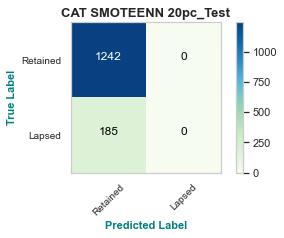

CAT SMOTEENN 20pc_Test - Classification Report
              precision    recall  f1-score   support

         0.0       0.87      1.00      0.93      1242
         1.0       0.00      0.00      0.00       185

    accuracy                           0.87      1427
   macro avg       0.44      0.50      0.47      1427
weighted avg       0.76      0.87      0.81      1427



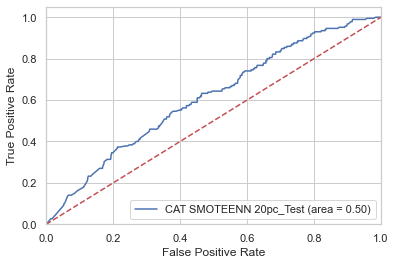

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


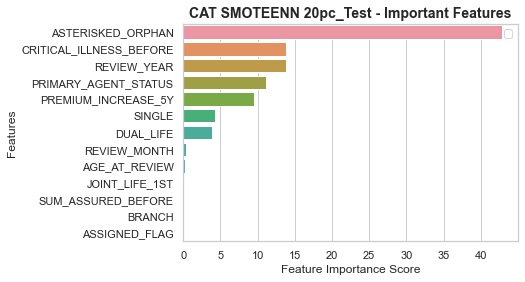

0:	learn: 0.6899005	total: 4.07ms	remaining: 36.6ms
1:	learn: 0.6864301	total: 8.01ms	remaining: 32.1ms
2:	learn: 0.6837161	total: 11.9ms	remaining: 27.8ms
3:	learn: 0.6800201	total: 16.8ms	remaining: 25.3ms
4:	learn: 0.6762595	total: 21.8ms	remaining: 21.8ms
5:	learn: 0.6727726	total: 26.2ms	remaining: 17.5ms
6:	learn: 0.6689387	total: 30.7ms	remaining: 13.2ms
7:	learn: 0.6652909	total: 34.8ms	remaining: 8.69ms
8:	learn: 0.6620145	total: 39.8ms	remaining: 4.42ms
9:	learn: 0.6591134	total: 44.5ms	remaining: 0us
Best parameters CAT SMOTEENN ('10pc_Test',): {'clf__learning_rate': 0.01, 'clf__n_estimators': 10}
0:	learn: 0.6899005	total: 4.92ms	remaining: 44.3ms
1:	learn: 0.6864301	total: 9.66ms	remaining: 38.6ms
2:	learn: 0.6837161	total: 13.6ms	remaining: 31.6ms
3:	learn: 0.6800201	total: 18.4ms	remaining: 27.6ms
4:	learn: 0.6762595	total: 22.7ms	remaining: 22.7ms
5:	learn: 0.6727726	total: 27.2ms	remaining: 18.2ms
6:	learn: 0.6689387	total: 31.7ms	remaining: 13.6ms
7:	learn: 0.6652909	

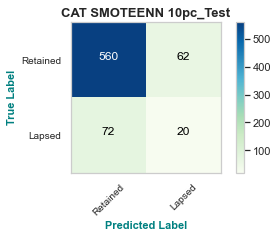

CAT SMOTEENN 10pc_Test - Classification Report
              precision    recall  f1-score   support

         0.0       0.89      0.90      0.89       622
         1.0       0.24      0.22      0.23        92

    accuracy                           0.81       714
   macro avg       0.56      0.56      0.56       714
weighted avg       0.80      0.81      0.81       714



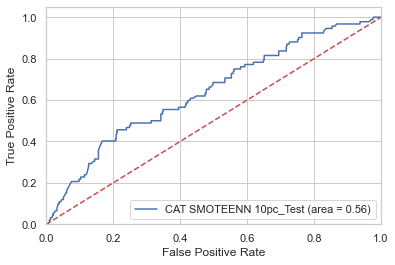

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


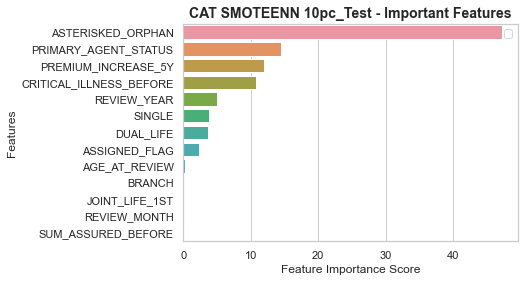

0:	learn: 0.6926810	total: 2.27ms	remaining: 225ms
1:	learn: 0.6922678	total: 4.27ms	remaining: 209ms
2:	learn: 0.6918810	total: 6.19ms	remaining: 200ms
3:	learn: 0.6914925	total: 8.02ms	remaining: 192ms
4:	learn: 0.6910821	total: 9.95ms	remaining: 189ms
5:	learn: 0.6906206	total: 11.8ms	remaining: 186ms
6:	learn: 0.6900810	total: 13.7ms	remaining: 182ms
7:	learn: 0.6896874	total: 15.6ms	remaining: 180ms
8:	learn: 0.6894458	total: 17.5ms	remaining: 177ms
9:	learn: 0.6891415	total: 20.1ms	remaining: 181ms
10:	learn: 0.6887802	total: 22.5ms	remaining: 182ms
11:	learn: 0.6883555	total: 24.4ms	remaining: 179ms
12:	learn: 0.6878539	total: 26.3ms	remaining: 176ms
13:	learn: 0.6875275	total: 28.1ms	remaining: 173ms
14:	learn: 0.6872098	total: 29.9ms	remaining: 170ms
15:	learn: 0.6869165	total: 31.8ms	remaining: 167ms
16:	learn: 0.6864152	total: 33.5ms	remaining: 164ms
17:	learn: 0.6860501	total: 35.3ms	remaining: 161ms
18:	learn: 0.6856507	total: 37.1ms	remaining: 158ms
19:	learn: 0.6851663	t

57:	learn: 0.6716612	total: 110ms	remaining: 79.7ms
58:	learn: 0.6714702	total: 112ms	remaining: 77.9ms
59:	learn: 0.6711917	total: 114ms	remaining: 76.2ms
60:	learn: 0.6708463	total: 116ms	remaining: 74.4ms
61:	learn: 0.6706275	total: 118ms	remaining: 72.6ms
62:	learn: 0.6703867	total: 120ms	remaining: 70.7ms
63:	learn: 0.6700290	total: 122ms	remaining: 68.8ms
64:	learn: 0.6698151	total: 124ms	remaining: 66.9ms
65:	learn: 0.6694212	total: 126ms	remaining: 65.1ms
66:	learn: 0.6691730	total: 128ms	remaining: 63.1ms
67:	learn: 0.6687773	total: 130ms	remaining: 61.3ms
68:	learn: 0.6685368	total: 132ms	remaining: 59.4ms
69:	learn: 0.6682737	total: 134ms	remaining: 57.6ms
70:	learn: 0.6679928	total: 136ms	remaining: 55.7ms
71:	learn: 0.6677958	total: 139ms	remaining: 54.1ms
72:	learn: 0.6674897	total: 142ms	remaining: 52.4ms
73:	learn: 0.6671508	total: 144ms	remaining: 50.5ms
74:	learn: 0.6668631	total: 146ms	remaining: 48.6ms
75:	learn: 0.6666043	total: 148ms	remaining: 46.6ms
76:	learn: 0

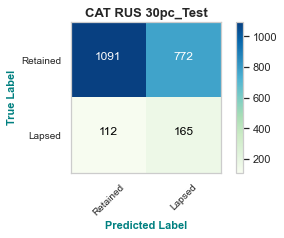

CAT RUS 30pc_Test - Classification Report
              precision    recall  f1-score   support

         0.0       0.91      0.59      0.71      1863
         1.0       0.18      0.60      0.27       277

    accuracy                           0.59      2140
   macro avg       0.54      0.59      0.49      2140
weighted avg       0.81      0.59      0.65      2140



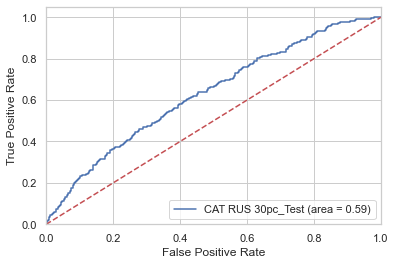

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


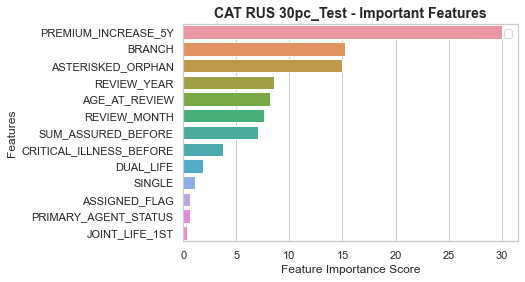

0:	learn: 0.6925539	total: 2.27ms	remaining: 20.4ms
1:	learn: 0.6921765	total: 4.41ms	remaining: 17.6ms
2:	learn: 0.6917001	total: 6.48ms	remaining: 15.1ms
3:	learn: 0.6913557	total: 8.61ms	remaining: 12.9ms
4:	learn: 0.6909504	total: 10.7ms	remaining: 10.7ms
5:	learn: 0.6904769	total: 12.7ms	remaining: 8.47ms
6:	learn: 0.6900450	total: 14.9ms	remaining: 6.4ms
7:	learn: 0.6896111	total: 17ms	remaining: 4.26ms
8:	learn: 0.6893693	total: 19.3ms	remaining: 2.15ms
9:	learn: 0.6890768	total: 21.4ms	remaining: 0us
Best parameters CAT RUS ('20pc_Test',): {'clf__learning_rate': 0.01, 'clf__n_estimators': 10}
0:	learn: 0.6925539	total: 2.06ms	remaining: 18.5ms
1:	learn: 0.6921765	total: 3.94ms	remaining: 15.8ms
2:	learn: 0.6917001	total: 5.83ms	remaining: 13.6ms
3:	learn: 0.6913557	total: 7.66ms	remaining: 11.5ms
4:	learn: 0.6909504	total: 9.51ms	remaining: 9.51ms
5:	learn: 0.6904769	total: 11.4ms	remaining: 7.6ms
6:	learn: 0.6900450	total: 13.3ms	remaining: 5.7ms
7:	learn: 0.6896111	total: 15.

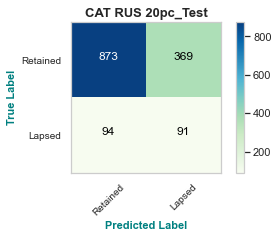

CAT RUS 20pc_Test - Classification Report
              precision    recall  f1-score   support

         0.0       0.90      0.70      0.79      1242
         1.0       0.20      0.49      0.28       185

    accuracy                           0.68      1427
   macro avg       0.55      0.60      0.54      1427
weighted avg       0.81      0.68      0.72      1427



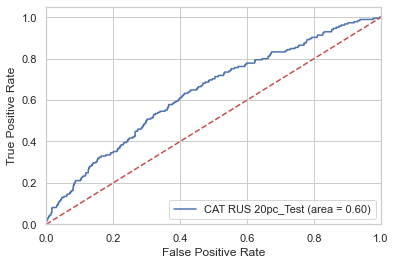

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


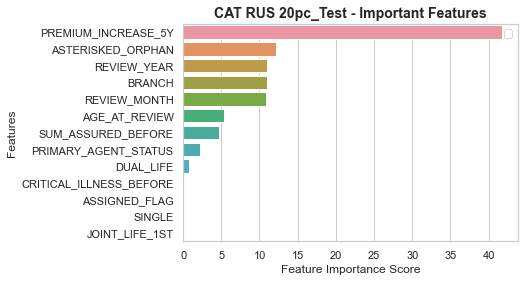

0:	learn: 0.6927103	total: 2.21ms	remaining: 108ms
1:	learn: 0.6922994	total: 4.36ms	remaining: 105ms
2:	learn: 0.6918989	total: 6.48ms	remaining: 102ms
3:	learn: 0.6915109	total: 8.67ms	remaining: 99.7ms
4:	learn: 0.6911108	total: 10.8ms	remaining: 97.3ms
5:	learn: 0.6906877	total: 13ms	remaining: 95.2ms
6:	learn: 0.6902028	total: 15.1ms	remaining: 93ms
7:	learn: 0.6897905	total: 17.2ms	remaining: 90.3ms
8:	learn: 0.6893889	total: 19.2ms	remaining: 87.6ms
9:	learn: 0.6890068	total: 21.2ms	remaining: 85ms
10:	learn: 0.6884934	total: 23.3ms	remaining: 82.7ms
11:	learn: 0.6881046	total: 25.3ms	remaining: 80.2ms
12:	learn: 0.6877119	total: 27.3ms	remaining: 77.8ms
13:	learn: 0.6874011	total: 29.3ms	remaining: 75.3ms
14:	learn: 0.6870238	total: 31.3ms	remaining: 73ms
15:	learn: 0.6866582	total: 33.2ms	remaining: 70.6ms
16:	learn: 0.6863276	total: 35.2ms	remaining: 68.3ms
17:	learn: 0.6858789	total: 37.3ms	remaining: 66.4ms
18:	learn: 0.6854953	total: 39.3ms	remaining: 64.1ms
19:	learn: 0.6

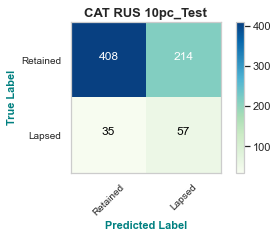

CAT RUS 10pc_Test - Classification Report
              precision    recall  f1-score   support

         0.0       0.92      0.66      0.77       622
         1.0       0.21      0.62      0.31        92

    accuracy                           0.65       714
   macro avg       0.57      0.64      0.54       714
weighted avg       0.83      0.65      0.71       714



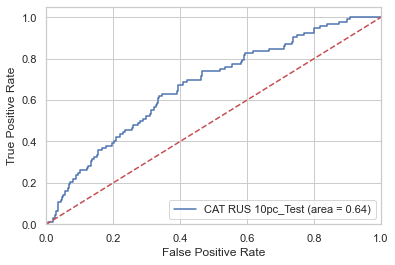

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


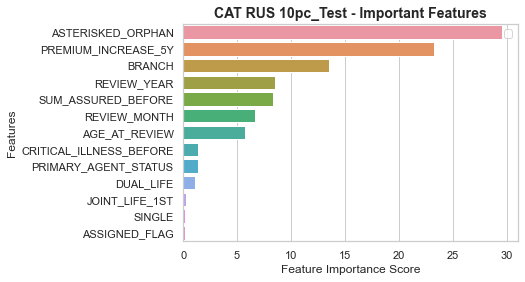

0:	learn: 0.6809491	total: 3.12ms	remaining: 153ms
1:	learn: 0.6701417	total: 6.51ms	remaining: 156ms
2:	learn: 0.6605032	total: 9.91ms	remaining: 155ms
3:	learn: 0.6509522	total: 12.9ms	remaining: 148ms
4:	learn: 0.6432596	total: 15.9ms	remaining: 143ms
5:	learn: 0.6368246	total: 20.7ms	remaining: 152ms
6:	learn: 0.6292943	total: 24.7ms	remaining: 152ms
7:	learn: 0.6231308	total: 28ms	remaining: 147ms
8:	learn: 0.6186746	total: 30.5ms	remaining: 139ms
9:	learn: 0.6143395	total: 33.5ms	remaining: 134ms
10:	learn: 0.6101645	total: 36.2ms	remaining: 128ms
11:	learn: 0.6040056	total: 40.1ms	remaining: 127ms
12:	learn: 0.6004053	total: 43.2ms	remaining: 123ms
13:	learn: 0.5969999	total: 46.1ms	remaining: 118ms
14:	learn: 0.5927868	total: 49ms	remaining: 114ms
15:	learn: 0.5902517	total: 51.9ms	remaining: 110ms
16:	learn: 0.5869167	total: 55.3ms	remaining: 107ms
17:	learn: 0.5840775	total: 57.8ms	remaining: 103ms
18:	learn: 0.5808539	total: 60.4ms	remaining: 98.5ms
19:	learn: 0.5778438	tota

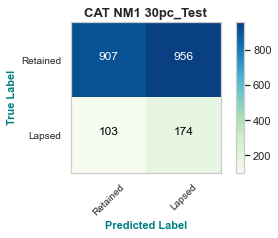

CAT NM1 30pc_Test - Classification Report
              precision    recall  f1-score   support

         0.0       0.90      0.49      0.63      1863
         1.0       0.15      0.63      0.25       277

    accuracy                           0.51      2140
   macro avg       0.53      0.56      0.44      2140
weighted avg       0.80      0.51      0.58      2140



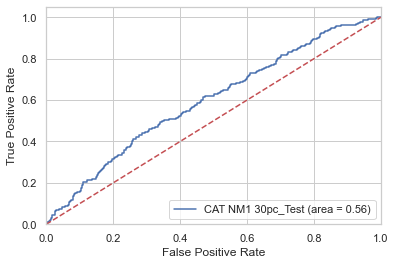

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


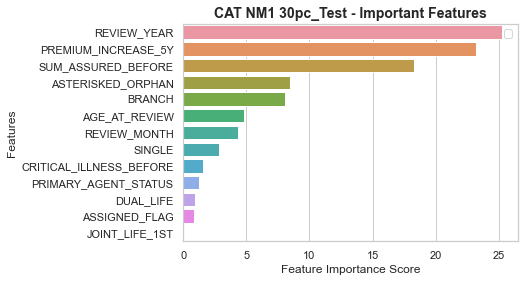

0:	learn: 0.6798726	total: 2.64ms	remaining: 129ms
1:	learn: 0.6684372	total: 5.01ms	remaining: 120ms
2:	learn: 0.6595685	total: 7.09ms	remaining: 111ms
3:	learn: 0.6495418	total: 9.49ms	remaining: 109ms
4:	learn: 0.6431048	total: 12.2ms	remaining: 110ms
5:	learn: 0.6349923	total: 14.5ms	remaining: 106ms
6:	learn: 0.6278809	total: 16.7ms	remaining: 102ms
7:	learn: 0.6214965	total: 19.1ms	remaining: 100ms
8:	learn: 0.6184490	total: 21.2ms	remaining: 96.6ms
9:	learn: 0.6137311	total: 23.8ms	remaining: 95.3ms
10:	learn: 0.6106379	total: 26.4ms	remaining: 93.7ms
11:	learn: 0.6057694	total: 28.5ms	remaining: 90.3ms
12:	learn: 0.6025769	total: 30.6ms	remaining: 87.1ms
13:	learn: 0.5990399	total: 32.9ms	remaining: 84.5ms
14:	learn: 0.5956783	total: 35.1ms	remaining: 81.9ms
15:	learn: 0.5917735	total: 37.2ms	remaining: 79.1ms
16:	learn: 0.5888461	total: 39.6ms	remaining: 77ms
17:	learn: 0.5870877	total: 41.8ms	remaining: 74.3ms
18:	learn: 0.5842943	total: 44ms	remaining: 71.8ms
19:	learn: 0.58

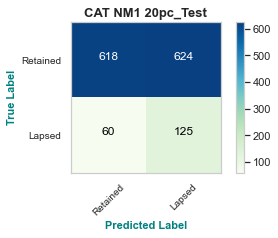

CAT NM1 20pc_Test - Classification Report
              precision    recall  f1-score   support

         0.0       0.91      0.50      0.64      1242
         1.0       0.17      0.68      0.27       185

    accuracy                           0.52      1427
   macro avg       0.54      0.59      0.46      1427
weighted avg       0.81      0.52      0.59      1427



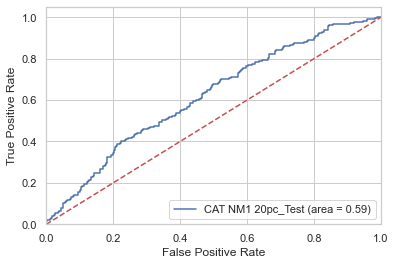

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


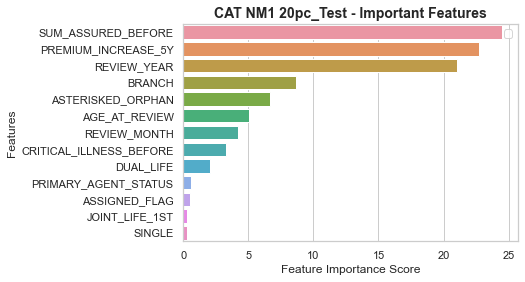

0:	learn: 0.6779995	total: 3.27ms	remaining: 160ms
1:	learn: 0.6650186	total: 5.82ms	remaining: 140ms
2:	learn: 0.6555739	total: 8.3ms	remaining: 130ms
3:	learn: 0.6442832	total: 11.9ms	remaining: 136ms
4:	learn: 0.6364484	total: 14.6ms	remaining: 131ms
5:	learn: 0.6266715	total: 17.3ms	remaining: 127ms
6:	learn: 0.6206150	total: 19.7ms	remaining: 121ms
7:	learn: 0.6148728	total: 22ms	remaining: 116ms
8:	learn: 0.6095641	total: 24.4ms	remaining: 111ms
9:	learn: 0.6047318	total: 26.5ms	remaining: 106ms
10:	learn: 0.6005421	total: 28.9ms	remaining: 102ms
11:	learn: 0.5953869	total: 32ms	remaining: 101ms
12:	learn: 0.5917615	total: 34.2ms	remaining: 97.3ms
13:	learn: 0.5884955	total: 36.5ms	remaining: 93.8ms
14:	learn: 0.5859568	total: 38.8ms	remaining: 90.5ms
15:	learn: 0.5838894	total: 40.9ms	remaining: 86.9ms
16:	learn: 0.5809164	total: 43ms	remaining: 83.6ms
17:	learn: 0.5783903	total: 46.3ms	remaining: 82.3ms
18:	learn: 0.5759938	total: 48.5ms	remaining: 79.2ms
19:	learn: 0.5733593	t

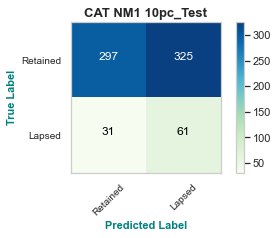

CAT NM1 10pc_Test - Classification Report
              precision    recall  f1-score   support

         0.0       0.91      0.48      0.63       622
         1.0       0.16      0.66      0.26        92

    accuracy                           0.50       714
   macro avg       0.53      0.57      0.44       714
weighted avg       0.81      0.50      0.58       714



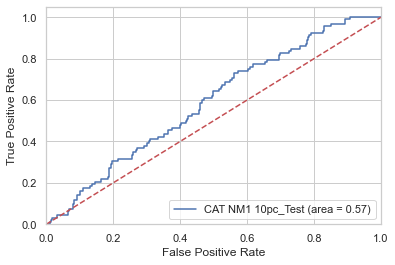

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


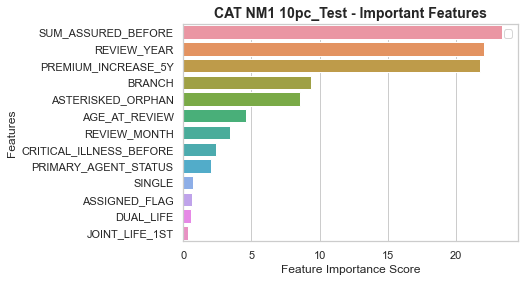

0:	learn: 0.3202401	total: 1.7ms	remaining: 168ms
1:	learn: 0.2574341	total: 3.44ms	remaining: 169ms
2:	learn: 0.2333234	total: 4.94ms	remaining: 160ms
3:	learn: 0.2135517	total: 6.41ms	remaining: 154ms
4:	learn: 0.2030229	total: 7.81ms	remaining: 148ms
5:	learn: 0.1939545	total: 9.24ms	remaining: 145ms
6:	learn: 0.1895934	total: 10.6ms	remaining: 141ms
7:	learn: 0.1843531	total: 12.1ms	remaining: 140ms
8:	learn: 0.1817429	total: 13.7ms	remaining: 138ms
9:	learn: 0.1799801	total: 15.3ms	remaining: 138ms
10:	learn: 0.1766345	total: 16.9ms	remaining: 137ms
11:	learn: 0.1664344	total: 18.6ms	remaining: 136ms
12:	learn: 0.1611907	total: 20.3ms	remaining: 136ms
13:	learn: 0.1600339	total: 22ms	remaining: 135ms
14:	learn: 0.1567957	total: 23.7ms	remaining: 134ms
15:	learn: 0.1519172	total: 25.4ms	remaining: 133ms
16:	learn: 0.1485201	total: 26.9ms	remaining: 131ms
17:	learn: 0.1472683	total: 28.3ms	remaining: 129ms
18:	learn: 0.1451507	total: 29.8ms	remaining: 127ms
19:	learn: 0.1382282	tota

CAT NM2_70pc_Train F1 Score : 25.86%
CAT NM2_30pc_Test F1 Score : 21.55%


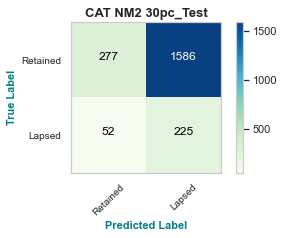

CAT NM2 30pc_Test - Classification Report
              precision    recall  f1-score   support

         0.0       0.84      0.15      0.25      1863
         1.0       0.12      0.81      0.22       277

    accuracy                           0.23      2140
   macro avg       0.48      0.48      0.23      2140
weighted avg       0.75      0.23      0.25      2140



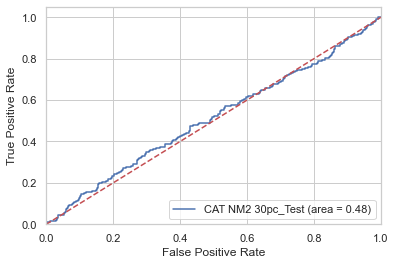

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


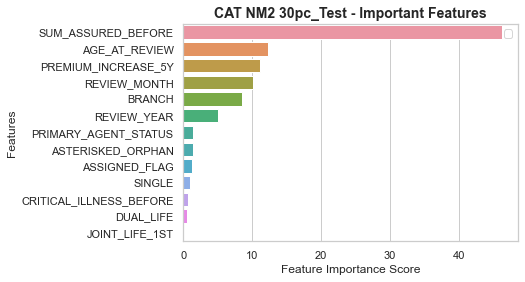

0:	learn: 0.3164836	total: 1.84ms	remaining: 90.2ms
1:	learn: 0.2604583	total: 3.58ms	remaining: 85.8ms
2:	learn: 0.2374667	total: 5.41ms	remaining: 84.7ms
3:	learn: 0.2265138	total: 7.2ms	remaining: 82.7ms
4:	learn: 0.2132982	total: 8.84ms	remaining: 79.5ms
5:	learn: 0.2101410	total: 10.5ms	remaining: 77.1ms
6:	learn: 0.2057178	total: 12.1ms	remaining: 74.1ms
7:	learn: 0.1988124	total: 13.6ms	remaining: 71.6ms
8:	learn: 0.1904980	total: 15.2ms	remaining: 69.2ms
9:	learn: 0.1814209	total: 16.8ms	remaining: 67.1ms
10:	learn: 0.1755267	total: 18.4ms	remaining: 65.3ms
11:	learn: 0.1704169	total: 20.2ms	remaining: 63.9ms
12:	learn: 0.1632965	total: 21.8ms	remaining: 62ms
13:	learn: 0.1587646	total: 23.4ms	remaining: 60.3ms
14:	learn: 0.1557762	total: 25.1ms	remaining: 58.6ms
15:	learn: 0.1519751	total: 26.7ms	remaining: 56.6ms
16:	learn: 0.1493553	total: 28.2ms	remaining: 54.7ms
17:	learn: 0.1483129	total: 29.9ms	remaining: 53.2ms
18:	learn: 0.1479782	total: 31.5ms	remaining: 51.4ms
19:	le

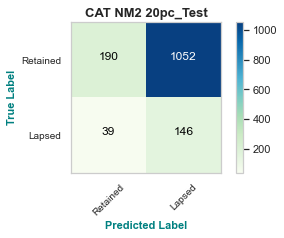

CAT NM2 20pc_Test - Classification Report
              precision    recall  f1-score   support

         0.0       0.83      0.15      0.26      1242
         1.0       0.12      0.79      0.21       185

    accuracy                           0.24      1427
   macro avg       0.48      0.47      0.23      1427
weighted avg       0.74      0.24      0.25      1427



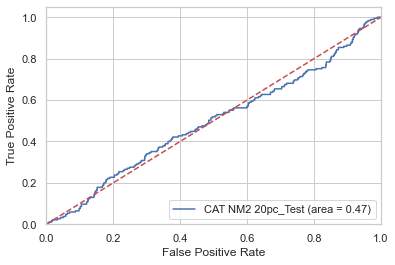

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


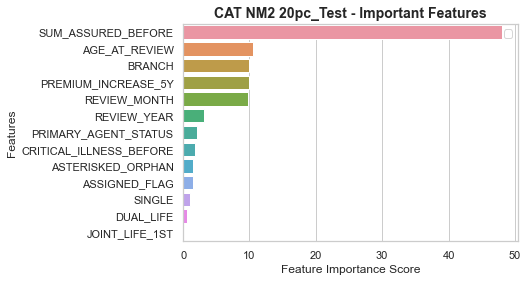

0:	learn: 0.3136358	total: 1.92ms	remaining: 190ms
1:	learn: 0.2626877	total: 3.89ms	remaining: 191ms
2:	learn: 0.2428024	total: 5.55ms	remaining: 180ms
3:	learn: 0.2304863	total: 7.15ms	remaining: 172ms
4:	learn: 0.2205155	total: 8.9ms	remaining: 169ms
5:	learn: 0.2128889	total: 10.6ms	remaining: 165ms
6:	learn: 0.2048471	total: 12.2ms	remaining: 162ms
7:	learn: 0.2001386	total: 13.8ms	remaining: 159ms
8:	learn: 0.1954906	total: 15.4ms	remaining: 156ms
9:	learn: 0.1879720	total: 17.1ms	remaining: 154ms
10:	learn: 0.1771838	total: 18.8ms	remaining: 152ms
11:	learn: 0.1701705	total: 20.4ms	remaining: 150ms
12:	learn: 0.1666467	total: 22ms	remaining: 148ms
13:	learn: 0.1614492	total: 23.8ms	remaining: 146ms
14:	learn: 0.1599474	total: 25.3ms	remaining: 144ms
15:	learn: 0.1548815	total: 27ms	remaining: 142ms
16:	learn: 0.1500868	total: 28.6ms	remaining: 140ms
17:	learn: 0.1476378	total: 30.2ms	remaining: 138ms
18:	learn: 0.1404265	total: 31.9ms	remaining: 136ms
19:	learn: 0.1386032	total:

CAT NM2_90pc_Train F1 Score : 25.87%
CAT NM2_10pc_Test F1 Score : 20.32%


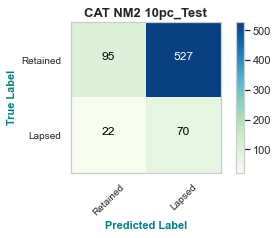

CAT NM2 10pc_Test - Classification Report
              precision    recall  f1-score   support

         0.0       0.81      0.15      0.26       622
         1.0       0.12      0.76      0.20        92

    accuracy                           0.23       714
   macro avg       0.46      0.46      0.23       714
weighted avg       0.72      0.23      0.25       714



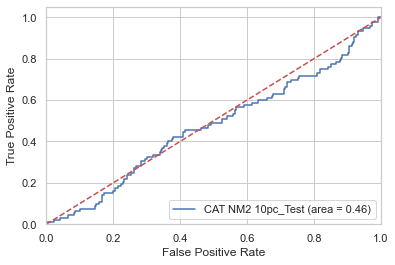

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


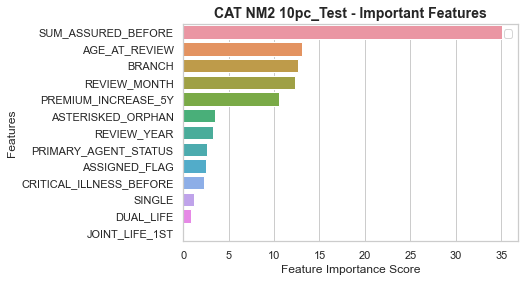

0:	learn: 0.6864326	total: 2.08ms	remaining: 205ms
1:	learn: 0.6809125	total: 4.2ms	remaining: 206ms
2:	learn: 0.6752149	total: 6.37ms	remaining: 206ms
3:	learn: 0.6694973	total: 8.64ms	remaining: 207ms
4:	learn: 0.6652409	total: 10.7ms	remaining: 203ms
5:	learn: 0.6608857	total: 12.7ms	remaining: 199ms
6:	learn: 0.6581128	total: 14.7ms	remaining: 195ms
7:	learn: 0.6551112	total: 16.7ms	remaining: 192ms
8:	learn: 0.6526425	total: 18.8ms	remaining: 190ms
9:	learn: 0.6497428	total: 20.7ms	remaining: 187ms
10:	learn: 0.6465611	total: 22.7ms	remaining: 184ms
11:	learn: 0.6421351	total: 24.6ms	remaining: 181ms
12:	learn: 0.6386383	total: 26.6ms	remaining: 178ms
13:	learn: 0.6366770	total: 28.4ms	remaining: 174ms
14:	learn: 0.6344155	total: 30.4ms	remaining: 172ms
15:	learn: 0.6314522	total: 32.3ms	remaining: 170ms
16:	learn: 0.6289725	total: 34.3ms	remaining: 168ms
17:	learn: 0.6264633	total: 36.4ms	remaining: 166ms
18:	learn: 0.6242877	total: 38.3ms	remaining: 163ms
19:	learn: 0.6215334	to

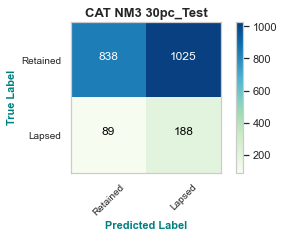

CAT NM3 30pc_Test - Classification Report
              precision    recall  f1-score   support

         0.0       0.90      0.45      0.60      1863
         1.0       0.15      0.68      0.25       277

    accuracy                           0.48      2140
   macro avg       0.53      0.56      0.43      2140
weighted avg       0.81      0.48      0.56      2140



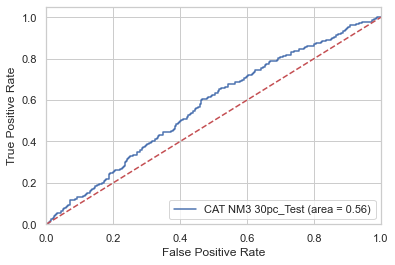

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


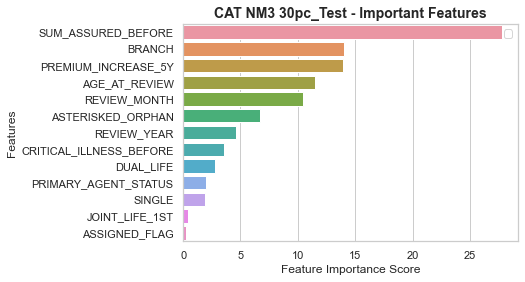

0:	learn: 0.6503401	total: 2.15ms	remaining: 19.3ms
1:	learn: 0.6270942	total: 4.31ms	remaining: 17.2ms
2:	learn: 0.6060735	total: 6.56ms	remaining: 15.3ms
3:	learn: 0.5971514	total: 8.62ms	remaining: 12.9ms
4:	learn: 0.5903390	total: 10.6ms	remaining: 10.6ms
5:	learn: 0.5746895	total: 12.6ms	remaining: 8.42ms
6:	learn: 0.5661863	total: 14.5ms	remaining: 6.23ms
7:	learn: 0.5560974	total: 16.5ms	remaining: 4.13ms
8:	learn: 0.5521424	total: 18.5ms	remaining: 2.06ms
9:	learn: 0.5442726	total: 20.5ms	remaining: 0us
Best parameters CAT NM3 ('20pc_Test',): {'clf__learning_rate': 1, 'clf__n_estimators': 10}
0:	learn: 0.6503401	total: 2ms	remaining: 18ms
1:	learn: 0.6270942	total: 3.8ms	remaining: 15.2ms
2:	learn: 0.6060735	total: 5.63ms	remaining: 13.1ms
3:	learn: 0.5971514	total: 7.49ms	remaining: 11.2ms
4:	learn: 0.5903390	total: 9.28ms	remaining: 9.28ms
5:	learn: 0.5746895	total: 11.1ms	remaining: 7.39ms
6:	learn: 0.5661863	total: 12.9ms	remaining: 5.53ms
7:	learn: 0.5560974	total: 15ms	re

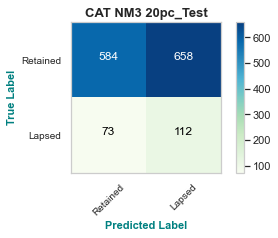

CAT NM3 20pc_Test - Classification Report
              precision    recall  f1-score   support

         0.0       0.89      0.47      0.62      1242
         1.0       0.15      0.61      0.23       185

    accuracy                           0.49      1427
   macro avg       0.52      0.54      0.42      1427
weighted avg       0.79      0.49      0.57      1427



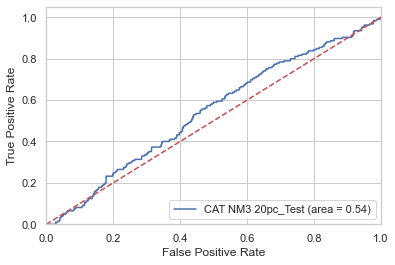

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


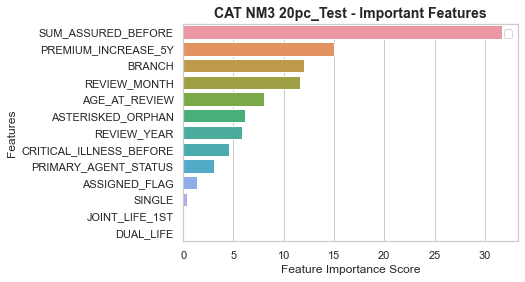

0:	learn: 0.6869858	total: 2.15ms	remaining: 213ms
1:	learn: 0.6813675	total: 4.21ms	remaining: 206ms
2:	learn: 0.6768063	total: 6.09ms	remaining: 197ms
3:	learn: 0.6728392	total: 8.09ms	remaining: 194ms
4:	learn: 0.6685202	total: 10.1ms	remaining: 192ms
5:	learn: 0.6649139	total: 11.9ms	remaining: 187ms
6:	learn: 0.6619158	total: 13.8ms	remaining: 184ms
7:	learn: 0.6571904	total: 15.6ms	remaining: 180ms
8:	learn: 0.6551700	total: 17.3ms	remaining: 175ms
9:	learn: 0.6524200	total: 19.2ms	remaining: 173ms
10:	learn: 0.6491333	total: 21.1ms	remaining: 171ms
11:	learn: 0.6468066	total: 22.9ms	remaining: 168ms
12:	learn: 0.6442258	total: 24.7ms	remaining: 166ms
13:	learn: 0.6422602	total: 26.5ms	remaining: 163ms
14:	learn: 0.6404632	total: 28.3ms	remaining: 161ms
15:	learn: 0.6384510	total: 30.2ms	remaining: 159ms
16:	learn: 0.6359617	total: 32.1ms	remaining: 157ms
17:	learn: 0.6333133	total: 34ms	remaining: 155ms
18:	learn: 0.6308869	total: 35.8ms	remaining: 153ms
19:	learn: 0.6288610	tot

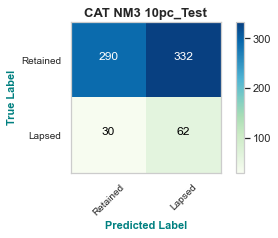

CAT NM3 10pc_Test - Classification Report
              precision    recall  f1-score   support

         0.0       0.91      0.47      0.62       622
         1.0       0.16      0.67      0.26        92

    accuracy                           0.49       714
   macro avg       0.53      0.57      0.44       714
weighted avg       0.81      0.49      0.57       714



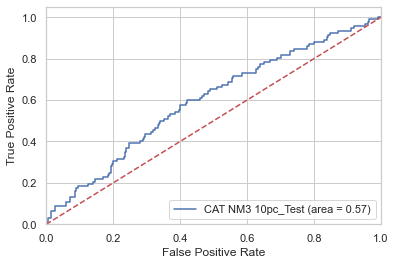

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


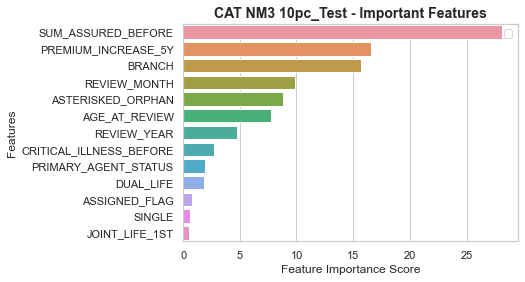

In [49]:
model_name = "CAT"
clf = CatBoostClassifier()

for train_name, test_name, X_train, y_train, X_test,y_test in zip(train_names,test_names, X_training_splits, y_training_splits, X_testing_splits, y_testing_splits):
    
    model = clf
    method = "IMB"
    param_grid = {'learning_rate': [0.01, 0.1, 1],
                      'n_estimators': [10, 50, 100]}
    stratified_kfold = StratifiedKFold(n_splits=5,shuffle=True,random_state=11)
    gs = GridSearchCV(estimator=model,
                      param_grid=param_grid,
                      scoring='f1',
                      cv=stratified_kfold,
                      n_jobs=-1)
    gs.fit(X_train,y_train)

    # Print the best parameters and best score obtained during the grid search
    print(f'Best parameters {model_name} {method} {test_name,}:', gs.best_params_)
    
    best_model = gs.best_estimator_
    # Call fit() method to train the model
    best_model.fit(X_train,y_train)
    # Predict the results
    y_train_predict = best_model.predict(X_train)
    y_predict = best_model.predict(X_test)
    
    exec(f'{model_name}_roc_auc_{method}_{train_name} =  roc_auc_score(y_train,y_train_predict)')
    exec(f'{model_name}_a_{method}_{train_name} = metrics.accuracy_score(y_train,y_train_predict)') 
    exec(f'{model_name}_p_{method}_{train_name} = metrics.precision_score(y_train,y_train_predict)') 
    exec(f'{model_name}_r_{method}_{train_name}  = metrics.recall_score(y_train,y_train_predict)') 
    exec(f'{model_name}_f1_{method}_{train_name} = metrics.f1_score(y_train,y_train_predict)')
    print(f'{model_name} {method}_{train_name} F1 Score : %.2f%%' % (metrics.f1_score(y_train, y_train_predict) * 100.0))

    # Call fit() method to train the model
    # Predict the results
    
    
    exec(f'{model_name}_roc_auc_{method}_{test_name} =  roc_auc_score(y_test,y_predict)')
    exec(f'{model_name}_a_{method}_{test_name} = metrics.accuracy_score(y_test, y_predict)') 
    exec(f'{model_name}_p_{method}_{test_name} = metrics.precision_score(y_test, y_predict)') 
    exec(f'{model_name}_r_{method}_{test_name}  = metrics.recall_score(y_test, y_predict)') 
    exec(f'{model_name}_f1_{method}_{test_name} = metrics.f1_score(y_test, y_predict)')
    print(f'{model_name} {method}_{test_name} F1 Score : %.2f%%' % (metrics.f1_score(y_test, y_predict) * 100.0))
 

 
     # Compute confusion matrix
    cnf_matrix = confusion_matrix(y_test, y_predict)
    # Plot non-normalized confusion matrix
    plt.figure(figsize = (5, 3.5))
    plot_confusion_matrix(cnf_matrix, classes = class_names)
    plt.title(f'{model_name} {method} {test_name}',fontsize = 13, fontweight = "bold")
    plt.show()

    # print the classification_report based on y_test and y_predict) 
    print(f'{model_name} {method} {test_name} - Classification Report')
    print(classification_report(y_test, y_predict))

    roc_auc_curve(y_test,best_model,method,test_name,X_test)
    feature_importance(best_model,model_name, method, test_name)
        

for method,resampler in zip(resampler_names,resamplers):
    for train_name, test_name, X_train, y_train, X_test,y_test in zip(train_names,test_names, X_training_splits, y_training_splits, X_testing_splits, y_testing_splits):
        
        model = Pipeline([('resampler', resampler),
                     ('mms', MinMaxScaler()),
                     ('clf',clf)])
        
        param_grid = {'clf__learning_rate': [0.01, 0.1, 1],
                      'clf__n_estimators': [10, 50, 100]}

        stratified_kfold = StratifiedKFold(n_splits=5,shuffle=True,random_state=11)
        gs = GridSearchCV(estimator=model,
                          param_grid=param_grid,
                          scoring='f1',
                          cv=stratified_kfold,
                          n_jobs=-1)
        gs.fit(X_train,y_train)

        # Print the best parameters and best score obtained during the grid search
        print(f'Best parameters {model_name} {method} {test_name,}:', gs.best_params_)

        best_model = gs.best_estimator_
        # Call fit() method to train the model
        best_model.fit(X_train,y_train)
        # Predict the results
        y_train_predict = best_model.predict(X_train)
        y_predict = best_model.predict(X_test)

        exec(f'{model_name}_roc_auc_{method}_{train_name} =  roc_auc_score(y_train,y_train_predict)')
        exec(f'{model_name}_a_{method}_{train_name} = metrics.accuracy_score(y_train,y_train_predict)') 
        exec(f'{model_name}_p_{method}_{train_name} = metrics.precision_score(y_train,y_train_predict)') 
        exec(f'{model_name}_r_{method}_{train_name}  = metrics.recall_score(y_train,y_train_predict)') 
        exec(f'{model_name}_f1_{method}_{train_name} = metrics.f1_score(y_train,y_train_predict)')
        print(f'{model_name} {method}_{train_name} F1 Score : %.2f%%' % (metrics.f1_score(y_train, y_train_predict) * 100.0))

        # Call fit() method to train the model
        # Predict the results


        exec(f'{model_name}_roc_auc_{method}_{test_name} =  roc_auc_score(y_test,y_predict)')
        exec(f'{model_name}_a_{method}_{test_name} = metrics.accuracy_score(y_test, y_predict)') 
        exec(f'{model_name}_p_{method}_{test_name} = metrics.precision_score(y_test, y_predict)') 
        exec(f'{model_name}_r_{method}_{test_name}  = metrics.recall_score(y_test, y_predict)') 
        exec(f'{model_name}_f1_{method}_{test_name} = metrics.f1_score(y_test, y_predict)')
        print(f'{model_name} {method}_{test_name} F1 Score : %.2f%%' % (metrics.f1_score(y_test, y_predict) * 100.0))



         # Compute confusion matrix
        cnf_matrix = confusion_matrix(y_test, y_predict)
        # Plot non-normalized confusion matrix
        plt.figure(figsize = (5, 3.5))
        plot_confusion_matrix(cnf_matrix, classes = class_names)
        plt.title(f'{model_name} {method} {test_name}',fontsize = 13, fontweight = "bold")
        plt.show()

        # print the classification_report based on y_test and y_predict) 
        print(f'{model_name} {method} {test_name} - Classification Report')
        print(classification_report(y_test, y_predict))

        roc_auc_curve(y_test,best_model,method,test_name,X_test)
        feature_importance_pipe(best_model,model_name, method, test_name)

## Multi-Layer Perceptron Model

In [ ]:
model_name = "MLP"
clf = MLPClassifier(random_state = 42)

for train_name, test_name, X_train, y_train, X_test,y_test in zip(train_names,test_names, X_training_splits, y_training_splits, X_testing_splits, y_testing_splits):
        
    model = clf
    method = "IMB"
    param_grid = {'solver':['adam'], 'alpha':[0.0001,0.5],
                    'hidden_layer_sizes': [100,], 'random_state':[1], 'learning_rate' : ["adaptive"], 'activation' : ["tanh"]}


    stratified_kfold = StratifiedKFold(n_splits=5,shuffle=True,random_state=11)
    gs = GridSearchCV(estimator=model,
                      param_grid=param_grid,
                      scoring='f1',
                      cv=stratified_kfold,
                      n_jobs=-1)
    gs.fit(X_train,y_train)

    # Print the best parameters and best score obtained during the grid search
    print(f'Best parameters {model_name} {method} {test_name,}:', gs.best_params_)

    best_model = gs.best_estimator_
    # Call fit() method to train the model
    best_model.fit(X_train,y_train)
    # Predict the results
    y_train_predict = best_model.predict(X_train)
    y_predict = best_model.predict(X_test)
    
    exec(f'{model_name}_roc_auc_{method}_{train_name} =  roc_auc_score(y_train,y_train_predict)')
    exec(f'{model_name}_a_{method}_{train_name} = metrics.accuracy_score(y_train,y_train_predict)') 
    exec(f'{model_name}_p_{method}_{train_name} = metrics.precision_score(y_train,y_train_predict)') 
    exec(f'{model_name}_r_{method}_{train_name}  = metrics.recall_score(y_train,y_train_predict)') 
    exec(f'{model_name}_f1_{method}_{train_name} = metrics.f1_score(y_train,y_train_predict)')
    print(f'{model_name} {method}_{train_name} F1 Score : %.2f%%' % (metrics.f1_score(y_train, y_train_predict) * 100.0))

    # Call fit() method to train the model
    # Predict the results
    
    
    exec(f'{model_name}_roc_auc_{method}_{test_name} =  roc_auc_score(y_test,y_predict)')
    exec(f'{model_name}_a_{method}_{test_name} = metrics.accuracy_score(y_test, y_predict)') 
    exec(f'{model_name}_p_{method}_{test_name} = metrics.precision_score(y_test, y_predict)') 
    exec(f'{model_name}_r_{method}_{test_name}  = metrics.recall_score(y_test, y_predict)') 
    exec(f'{model_name}_f1_{method}_{test_name} = metrics.f1_score(y_test, y_predict)')
    print(f'{model_name} {method}_{test_name} F1 Score : %.2f%%' % (metrics.f1_score(y_test, y_predict) * 100.0))
 

 
     # Compute confusion matrix
    cnf_matrix = confusion_matrix(y_test, y_predict)
    # Plot non-normalized confusion matrix
    plt.figure(figsize = (5, 3.5))
    plot_confusion_matrix(cnf_matrix, classes = class_names)
    plt.title(f'{model_name} {method} {test_name}',fontsize = 13, fontweight = "bold")
    plt.show()

    # print the classification_report based on y_test and y_predict) 
    print(f'{model_name} {method} {test_name} - Classification Report')
    print(classification_report(y_test, y_predict))

    roc_auc_curve(y_test,best_model,method,test_name,X_test)
    

for method,resampler in zip(resampler_names,resamplers):
    for train_name, test_name, X_train, y_train, X_test,y_test in zip(train_names,test_names, X_training_splits, y_training_splits, X_testing_splits, y_testing_splits):
        
        model = Pipeline([('resampler', resampler),
                     ('mms', MinMaxScaler()),
                     ('clf',clf)])
        
        param_grid = {'clf__solver':['adam'], 'clf__alpha':[0.0001,0.5],
                    'clf__hidden_layer_sizes': [100,], 'clf__random_state':[1], 'clf__learning_rate' : ["adaptive"], 'clf__activation' : ["tanh"]}


        stratified_kfold = StratifiedKFold(n_splits=5,shuffle=True,random_state=11)
        gs = GridSearchCV(estimator=model,
                          param_grid=param_grid,
                          scoring='f1',
                          cv=stratified_kfold,
                          n_jobs=-1)
        gs.fit(X_train,y_train)

        # Print the best parameters and best score obtained during the grid search
        print(f'Best parameters {model_name} {method} {test_name,}:', gs.best_params_)

        best_model = gs.best_estimator_
        # Call fit() method to train the model
        best_model.fit(X_train,y_train)
        # Predict the results
        y_train_predict = best_model.predict(X_train)
        y_predict = best_model.predict(X_test)

        exec(f'{model_name}_roc_auc_{method}_{train_name} =  roc_auc_score(y_train,y_train_predict)')
        exec(f'{model_name}_a_{method}_{train_name} = metrics.accuracy_score(y_train,y_train_predict)') 
        exec(f'{model_name}_p_{method}_{train_name} = metrics.precision_score(y_train,y_train_predict)') 
        exec(f'{model_name}_r_{method}_{train_name}  = metrics.recall_score(y_train,y_train_predict)') 
        exec(f'{model_name}_f1_{method}_{train_name} = metrics.f1_score(y_train,y_train_predict)')
        print(f'{model_name} {method}_{train_name} F1 Score : %.2f%%' % (metrics.f1_score(y_train, y_train_predict) * 100.0))

        # Call fit() method to train the model
        # Predict the results


        exec(f'{model_name}_roc_auc_{method}_{test_name} =  roc_auc_score(y_test,y_predict)')
        exec(f'{model_name}_a_{method}_{test_name} = metrics.accuracy_score(y_test, y_predict)') 
        exec(f'{model_name}_p_{method}_{test_name} = metrics.precision_score(y_test, y_predict)') 
        exec(f'{model_name}_r_{method}_{test_name}  = metrics.recall_score(y_test, y_predict)') 
        exec(f'{model_name}_f1_{method}_{test_name} = metrics.f1_score(y_test, y_predict)')
        print(f'{model_name} {method}_{test_name} F1 Score : %.2f%%' % (metrics.f1_score(y_test, y_predict) * 100.0))



         # Compute confusion matrix
        cnf_matrix = confusion_matrix(y_test, y_predict)
        # Plot non-normalized confusion matrix
        plt.figure(figsize = (5, 3.5))
        plot_confusion_matrix(cnf_matrix, classes = class_names)
        plt.title(f'{model_name} {method} {test_name}',fontsize = 13, fontweight = "bold")
        plt.show()

        # print the classification_report based on y_test and y_predict) 
        print(f'{model_name} {method} {test_name} - Classification Report')
        print(classification_report(y_test, y_predict))

        roc_auc_curve(y_test,best_model,method,test_name,X_test)



## Summarise Results

In [52]:
data = {'Accuracy 70/30 Baseline': [Baseline_a_IMB_70pc_Train],
        'Precision 70/30 Baseline':[Baseline_p_IMB_70pc_Train],
        'Recall 70/30 Baseline':[Baseline_r_IMB_70pc_Train],
        'F1 Score 70/30 Baseline':[Baseline_f1_IMB_70pc_Train,],
        'ROC-AUC 70/30 Baseline':[Baseline_roc_auc_IMB_70pc_Train,],
        'Accuracy 80/20 Baseline': [Baseline_a_IMB_80pc_Train,],
        'Precision 80/20 Baseline':[Baseline_p_IMB_80pc_Train,],
        'Recall 80/20 Baseline':[Baseline_r_IMB_80pc_Train,],
        'F1 Score 80/20 Baseline':[Baseline_f1_IMB_80pc_Train,],
        'ROC-AUC 80/20 Baseline':[Baseline_roc_auc_IMB_80pc_Train,Baseline_roc_auc_IMB_20pc_Test],
         'Accuracy 90/10 Baseline': [Baseline_a_IMB_90pc_Train,Baseline_a_IMB_10pc_Test],
        'Precision 90/10 Baseline':[Baseline_p_IMB_90pc_Train,Baseline_p_IMB_10pc_Test],
        'Recall 90/10 Baseline':[Baseline_r_IMB_90pc_Train,Baseline_r_IMB_10pc_Test],
        'F1 Score 90/10 Baseline':[Baseline_f1_IMB_90pc_Train,Baseline_f1_IMB_10pc_Test],
         'ROC-AUC 90/10 Baseline':[Baseline_roc_auc_IMB_90pc_Train,Baseline_roc_auc_IMB_10pc_Test]}
results_Baseline = pd.DataFrame(data,index=["Baseline - Training","Baseline - Testing"])
results_Baseline.to_csv("Baseline Results.csv", index=True)#write csv file


In [53]:
data = {'Training Accuracy 70/30 IMB': [Baseline_a_IMB_70pc_Train, ET_a_IMB_70pc_Train, LGBM_a_IMB_70pc_Train,CAT_a_IMB_70pc_Train, ADA_a_IMB_70pc_Train,XGB_a_IMB_70pc_Train,MLP_a_IMB_70pc_Train,SVM_a_IMB_70pc_Train,NB_a_IMB_70pc_Train,LR_a_IMB_70pc_Train,RF_a_IMB_70pc_Train,DT_a_IMB_70pc_Train,KNN_a_IMB_70pc_Train],
        'Training Precision 70/30 IMB':[Baseline_p_IMB_70pc_Train,ET_p_IMB_70pc_Train,LGBM_p_IMB_70pc_Train,CAT_p_IMB_70pc_Train, ADA_p_IMB_70pc_Train,XGB_p_IMB_70pc_Train,MLP_p_IMB_70pc_Train,SVM_p_IMB_70pc_Train,NB_p_IMB_70pc_Train,LR_p_IMB_70pc_Train,RF_p_IMB_70pc_Train,DT_p_IMB_70pc_Train,KNN_p_IMB_70pc_Train],
        'Training Recall 70/30 IMB':[Baseline_r_IMB_70pc_Train,ET_r_IMB_70pc_Train,LGBM_r_IMB_70pc_Train,CAT_r_IMB_70pc_Train,ADA_r_IMB_70pc_Train,XGB_r_IMB_70pc_Train,MLP_r_IMB_70pc_Train,SVM_r_IMB_70pc_Train,NB_r_IMB_70pc_Train,LR_r_IMB_70pc_Train,RF_r_IMB_70pc_Train,DT_r_IMB_70pc_Train,KNN_r_IMB_70pc_Train],
        'Training F1 Score 70/30 IMB':[Baseline_f1_IMB_70pc_Train,ET_f1_IMB_70pc_Train,LGBM_f1_IMB_70pc_Train,CAT_f1_IMB_70pc_Train,ADA_f1_IMB_70pc_Train,XGB_f1_IMB_70pc_Train,MLP_f1_IMB_70pc_Train,SVM_f1_IMB_70pc_Train,NB_f1_IMB_70pc_Train,LR_f1_IMB_70pc_Train,RF_f1_IMB_70pc_Train,DT_f1_IMB_70pc_Train,KNN_f1_IMB_70pc_Train],
        'Training ROC-AUC 70/30 IMB':[Baseline_roc_auc_IMB_70pc_Train,ET_roc_auc_IMB_70pc_Train,LGBM_roc_auc_IMB_70pc_Train,CAT_roc_auc_IMB_70pc_Train,ADA_roc_auc_IMB_70pc_Train,XGB_roc_auc_IMB_70pc_Train,MLP_roc_auc_IMB_70pc_Train,SVM_roc_auc_IMB_70pc_Train,NB_roc_auc_IMB_70pc_Train,LR_roc_auc_IMB_70pc_Train,RF_roc_auc_IMB_70pc_Train,DT_roc_auc_IMB_70pc_Train,KNN_roc_auc_IMB_70pc_Train],
        'Training Accuracy 80/20 IMB': [Baseline_a_IMB_80pc_Train,ET_a_IMB_80pc_Train, LGBM_a_IMB_80pc_Train,CAT_a_IMB_80pc_Train, ADA_a_IMB_80pc_Train,XGB_a_IMB_80pc_Train,MLP_a_IMB_80pc_Train,SVM_a_IMB_80pc_Train,NB_a_IMB_80pc_Train,LR_a_IMB_80pc_Train,RF_a_IMB_80pc_Train,DT_a_IMB_80pc_Train,KNN_a_IMB_80pc_Train],
        'Training Precision 80/20 IMB':[Baseline_p_IMB_80pc_Train,ET_p_IMB_80pc_Train,LGBM_p_IMB_80pc_Train,CAT_p_IMB_80pc_Train, ADA_p_IMB_80pc_Train,XGB_p_IMB_80pc_Train,MLP_p_IMB_80pc_Train,SVM_p_IMB_80pc_Train,NB_p_IMB_80pc_Train,LR_p_IMB_80pc_Train,RF_p_IMB_80pc_Train,DT_p_IMB_80pc_Train,KNN_p_IMB_80pc_Train],
        'Training Recall 80/20 IMB':[Baseline_r_IMB_80pc_Train,ET_r_IMB_80pc_Train,LGBM_r_IMB_80pc_Train,CAT_r_IMB_80pc_Train,ADA_r_IMB_80pc_Train,XGB_r_IMB_80pc_Train,MLP_r_IMB_80pc_Train,SVM_r_IMB_80pc_Train,NB_r_IMB_80pc_Train,LR_r_IMB_80pc_Train,RF_r_IMB_80pc_Train,DT_r_IMB_80pc_Train,KNN_r_IMB_80pc_Train],
        'Training F1 Score 80/20 IMB':[Baseline_f1_IMB_80pc_Train,ET_f1_IMB_80pc_Train,LGBM_f1_IMB_80pc_Train,CAT_f1_IMB_80pc_Train,ADA_f1_IMB_80pc_Train,XGB_f1_IMB_80pc_Train,MLP_f1_IMB_80pc_Train,SVM_f1_IMB_80pc_Train,NB_f1_IMB_80pc_Train,LR_f1_IMB_80pc_Train,RF_f1_IMB_80pc_Train,DT_f1_IMB_80pc_Train,KNN_f1_IMB_80pc_Train], 
        'Training ROC-AUC 80/20 IMB':[Baseline_roc_auc_IMB_80pc_Train,ET_roc_auc_IMB_80pc_Train,LGBM_roc_auc_IMB_80pc_Train,CAT_roc_auc_IMB_80pc_Train,ADA_roc_auc_IMB_80pc_Train,XGB_roc_auc_IMB_80pc_Train,MLP_roc_auc_IMB_80pc_Train,SVM_roc_auc_IMB_80pc_Train,NB_roc_auc_IMB_80pc_Train,LR_roc_auc_IMB_80pc_Train,RF_roc_auc_IMB_80pc_Train,DT_roc_auc_IMB_80pc_Train,KNN_roc_auc_IMB_80pc_Train],
        'Training Accuracy 90/10 IMB': [Baseline_a_IMB_90pc_Train,ET_a_IMB_90pc_Train, LGBM_a_IMB_90pc_Train,CAT_a_IMB_90pc_Train, ADA_a_IMB_90pc_Train,XGB_a_IMB_90pc_Train,MLP_a_IMB_90pc_Train,SVM_a_IMB_90pc_Train,NB_a_IMB_90pc_Train,LR_a_IMB_90pc_Train,RF_a_IMB_90pc_Train,DT_a_IMB_90pc_Train,KNN_a_IMB_90pc_Train],
        'Training Precision 90/10 IMB':[Baseline_p_IMB_90pc_Train,ET_p_IMB_90pc_Train,LGBM_p_IMB_90pc_Train,CAT_p_IMB_90pc_Train, ADA_p_IMB_90pc_Train,XGB_p_IMB_90pc_Train,MLP_p_IMB_90pc_Train,SVM_p_IMB_90pc_Train,NB_p_IMB_90pc_Train,LR_p_IMB_90pc_Train,RF_p_IMB_90pc_Train,DT_p_IMB_90pc_Train,KNN_p_IMB_90pc_Train],
        'Training Recall 90/10 IMB':[Baseline_r_IMB_90pc_Train,ET_r_IMB_90pc_Train,LGBM_r_IMB_90pc_Train,CAT_r_IMB_90pc_Train,ADA_r_IMB_90pc_Train,XGB_r_IMB_90pc_Train,MLP_r_IMB_90pc_Train,SVM_r_IMB_90pc_Train,NB_r_IMB_90pc_Train,LR_r_IMB_90pc_Train,RF_r_IMB_90pc_Train,DT_r_IMB_90pc_Train,KNN_r_IMB_90pc_Train],
        'Training F1 Score 90/10 IMB':[Baseline_f1_IMB_90pc_Train,ET_f1_IMB_90pc_Train,LGBM_f1_IMB_90pc_Train,CAT_f1_IMB_90pc_Train,ADA_f1_IMB_90pc_Train,XGB_f1_IMB_90pc_Train,MLP_f1_IMB_90pc_Train,SVM_f1_IMB_90pc_Train,NB_f1_IMB_90pc_Train,LR_f1_IMB_90pc_Train,RF_f1_IMB_90pc_Train,DT_f1_IMB_90pc_Train,KNN_f1_IMB_90pc_Train],
        'Training ROC-AUC 90/10 IMB':[Baseline_roc_auc_IMB_90pc_Train,ET_roc_auc_IMB_90pc_Train,LGBM_roc_auc_IMB_90pc_Train,CAT_roc_auc_IMB_90pc_Train,ADA_roc_auc_IMB_90pc_Train,XGB_roc_auc_IMB_90pc_Train,MLP_roc_auc_IMB_90pc_Train,SVM_roc_auc_IMB_90pc_Train,NB_roc_auc_IMB_90pc_Train,LR_roc_auc_IMB_90pc_Train,RF_roc_auc_IMB_90pc_Train,DT_roc_auc_IMB_90pc_Train,KNN_roc_auc_IMB_90pc_Train]} 
results_IMB_Train = pd.DataFrame(data,index=["Baseline","ET","LGBM","CAT","ADA","XGB","MLP","SVM","NB","LR","RF","DT","KNN"])
results_IMB_Train.to_csv("IMB Results - Training.csv", index=True)#write csv file
results_IMB_Train.sort_values(by='Training F1 Score 90/10 IMB', ascending=False)

,Training Accuracy 70/30 IMB,Training Precision 70/30 IMB,Training Recall 70/30 IMB,Training F1 Score 70/30 IMB,Training ROC-AUC 70/30 IMB,Training Accuracy 80/20 IMB,Training Precision 80/20 IMB,Training Recall 80/20 IMB,Training F1 Score 80/20 IMB,Training ROC-AUC 80/20 IMB,Training Accuracy 90/10 IMB,Training Precision 90/10 IMB,Training Recall 90/10 IMB,Training F1 Score 90/10 IMB,Training ROC-AUC 90/10 IMB
KNN,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
SVM,0.995392,1.000000,0.964341,0.981847,0.982171,0.993689,0.998578,0.952510,0.975000,0.976154,0.992520,0.998724,0.943373,0.970260,0.971597
XGB,0.966940,0.981928,0.758140,0.855643,0.878034,0.963008,0.983456,0.725916,0.835285,0.862052,0.912264,0.871866,0.377108,0.526493,0.684438
CAT,0.925065,0.972125,0.432558,0.598712,0.715359,0.924614,0.950147,0.439620,0.601113,0.718099,0.914290,0.954545,0.354217,0.516696,0.675856
LGBM,0.913645,0.879433,0.384496,0.535059,0.688336,0.893583,0.787611,0.241520,0.369678,0.615928,0.906498,0.875817,0.322892,0.471831,0.658045
DT,0.898618,0.911243,0.238760,0.378378,0.617654,0.899194,0.917526,0.241520,0.382385,0.619149,0.900577,0.921053,0.253012,0.396975,0.624895
NB,0.638349,0.163182,0.435659,0.237431,0.552045,0.633941,0.162419,0.440977,0.237400,0.551775,0.640798,0.163703,0.432530,0.237512,0.552134
RF,0.890002,0.989796,0.150388,0.261104,0.575079,0.878857,1.000000,0.062415,0.117497,0.531208,0.882188,0.986842,0.090361,0.165563,0.545091
ET,0.880785,1.000000,0.077519,0.143885,0.538760,0.879558,1.000000,0.067843,0.127065,0.533921,0.875019,1.000000,0.033735,0.065268,0.516867
ADA,0.872771,0.857143,0.018605,0.036419,0.509072,0.872370,0.764706,0.017639,0.034483,0.508417,0.871279,0.700000,0.008434,0.016667,0.503948


In [54]:
data = {'Testing Accuracy 70/30 IMB': [Baseline_a_IMB_30pc_Test, ET_a_IMB_30pc_Test, LGBM_a_IMB_30pc_Test,CAT_a_IMB_30pc_Test, ADA_a_IMB_30pc_Test,XGB_a_IMB_30pc_Test,MLP_a_IMB_30pc_Test,SVM_a_IMB_30pc_Test,NB_a_IMB_30pc_Test,LR_a_IMB_30pc_Test,RF_a_IMB_30pc_Test,DT_a_IMB_30pc_Test,KNN_a_IMB_30pc_Test],
        'Testing Precision 70/30 IMB':[Baseline_p_IMB_30pc_Test,ET_p_IMB_30pc_Test,LGBM_p_IMB_30pc_Test,CAT_p_IMB_30pc_Test, ADA_p_IMB_30pc_Test,XGB_p_IMB_30pc_Test,MLP_p_IMB_30pc_Test,SVM_p_IMB_30pc_Test,NB_p_IMB_30pc_Test,LR_p_IMB_30pc_Test,RF_p_IMB_30pc_Test,DT_p_IMB_30pc_Test,KNN_p_IMB_30pc_Test],
        'Testing Recall 70/30 IMB':[Baseline_r_IMB_30pc_Test,ET_r_IMB_30pc_Test,LGBM_r_IMB_30pc_Test,CAT_r_IMB_30pc_Test,ADA_r_IMB_30pc_Test,XGB_r_IMB_30pc_Test,MLP_r_IMB_30pc_Test,SVM_r_IMB_30pc_Test,NB_r_IMB_30pc_Test,LR_r_IMB_30pc_Test,RF_r_IMB_30pc_Test,DT_r_IMB_30pc_Test,KNN_r_IMB_30pc_Test],
        'Testing F1 Score 70/30 IMB':[Baseline_f1_IMB_30pc_Test,ET_f1_IMB_30pc_Test,LGBM_f1_IMB_30pc_Test,CAT_f1_IMB_30pc_Test,ADA_f1_IMB_30pc_Test,XGB_f1_IMB_30pc_Test,MLP_f1_IMB_30pc_Test,SVM_f1_IMB_30pc_Test,NB_f1_IMB_30pc_Test,LR_f1_IMB_30pc_Test,RF_f1_IMB_30pc_Test,DT_f1_IMB_30pc_Test,KNN_f1_IMB_30pc_Test],
        'Testing ROC-AUC 70/30 IMB':[Baseline_roc_auc_IMB_30pc_Test,ET_roc_auc_IMB_30pc_Test,LGBM_roc_auc_IMB_30pc_Test,CAT_roc_auc_IMB_30pc_Test,ADA_roc_auc_IMB_30pc_Test,XGB_roc_auc_IMB_30pc_Test,MLP_roc_auc_IMB_30pc_Test,SVM_roc_auc_IMB_30pc_Test,NB_roc_auc_IMB_30pc_Test,LR_roc_auc_IMB_30pc_Test,RF_roc_auc_IMB_30pc_Test,DT_roc_auc_IMB_30pc_Test,KNN_roc_auc_IMB_30pc_Test],
        'Testing Accuracy 80/20 IMB': [Baseline_a_IMB_20pc_Test,ET_a_IMB_20pc_Test, LGBM_a_IMB_20pc_Test,CAT_a_IMB_20pc_Test, ADA_a_IMB_20pc_Test,XGB_a_IMB_20pc_Test,MLP_a_IMB_20pc_Test,SVM_a_IMB_20pc_Test,NB_a_IMB_20pc_Test,LR_a_IMB_20pc_Test,RF_a_IMB_20pc_Test,DT_a_IMB_20pc_Test,KNN_a_IMB_20pc_Test],
        'Testing Precision 80/20 IMB':[Baseline_p_IMB_20pc_Test,ET_p_IMB_20pc_Test,LGBM_p_IMB_20pc_Test,CAT_p_IMB_20pc_Test, ADA_p_IMB_20pc_Test,XGB_p_IMB_20pc_Test,MLP_p_IMB_20pc_Test,SVM_p_IMB_20pc_Test,NB_p_IMB_20pc_Test,LR_p_IMB_20pc_Test,RF_p_IMB_20pc_Test,DT_p_IMB_20pc_Test,KNN_p_IMB_20pc_Test],
        'Testing Recall 80/20 IMB':[Baseline_r_IMB_20pc_Test,ET_r_IMB_20pc_Test,LGBM_r_IMB_20pc_Test,CAT_r_IMB_20pc_Test,ADA_r_IMB_20pc_Test,XGB_r_IMB_20pc_Test,MLP_r_IMB_20pc_Test,SVM_r_IMB_20pc_Test,NB_r_IMB_20pc_Test,LR_r_IMB_20pc_Test,RF_r_IMB_20pc_Test,DT_r_IMB_20pc_Test,KNN_r_IMB_20pc_Test],
        'Testing F1 Score 80/20 IMB':[Baseline_f1_IMB_20pc_Test,ET_f1_IMB_20pc_Test,LGBM_f1_IMB_20pc_Test,CAT_f1_IMB_20pc_Test,ADA_f1_IMB_20pc_Test,XGB_f1_IMB_20pc_Test,MLP_f1_IMB_20pc_Test,SVM_f1_IMB_20pc_Test,NB_f1_IMB_20pc_Test,LR_f1_IMB_20pc_Test,RF_f1_IMB_20pc_Test,DT_f1_IMB_20pc_Test,KNN_f1_IMB_20pc_Test], 
        'Testing ROC-AUC 80/20 IMB':[Baseline_roc_auc_IMB_20pc_Test,ET_roc_auc_IMB_20pc_Test,LGBM_roc_auc_IMB_20pc_Test,CAT_roc_auc_IMB_20pc_Test,ADA_roc_auc_IMB_20pc_Test,XGB_roc_auc_IMB_20pc_Test,MLP_roc_auc_IMB_20pc_Test,SVM_roc_auc_IMB_20pc_Test,NB_roc_auc_IMB_20pc_Test,LR_roc_auc_IMB_20pc_Test,RF_roc_auc_IMB_20pc_Test,DT_roc_auc_IMB_20pc_Test,KNN_roc_auc_IMB_20pc_Test],
        'Testing Accuracy 90/10 IMB': [Baseline_a_IMB_10pc_Test,ET_a_IMB_10pc_Test, LGBM_a_IMB_10pc_Test,CAT_a_IMB_10pc_Test, ADA_a_IMB_10pc_Test,XGB_a_IMB_10pc_Test,MLP_a_IMB_10pc_Test,SVM_a_IMB_10pc_Test,NB_a_IMB_10pc_Test,LR_a_IMB_10pc_Test,RF_a_IMB_10pc_Test,DT_a_IMB_10pc_Test,KNN_a_IMB_10pc_Test],
        'Testing Precision 90/10 IMB':[Baseline_p_IMB_10pc_Test,ET_p_IMB_10pc_Test,LGBM_p_IMB_10pc_Test,CAT_p_IMB_10pc_Test, ADA_p_IMB_10pc_Test,XGB_p_IMB_10pc_Test,MLP_p_IMB_10pc_Test,SVM_p_IMB_10pc_Test,NB_p_IMB_10pc_Test,LR_p_IMB_10pc_Test,RF_p_IMB_10pc_Test,DT_p_IMB_10pc_Test,KNN_p_IMB_10pc_Test],
        'Testing Recall 90/10 IMB':[Baseline_r_IMB_10pc_Test,ET_r_IMB_10pc_Test,LGBM_r_IMB_10pc_Test,CAT_r_IMB_10pc_Test,ADA_r_IMB_10pc_Test,XGB_r_IMB_10pc_Test,MLP_r_IMB_10pc_Test,SVM_r_IMB_10pc_Test,NB_r_IMB_10pc_Test,LR_r_IMB_10pc_Test,RF_r_IMB_10pc_Test,DT_r_IMB_10pc_Test,KNN_r_IMB_10pc_Test],
        'Testing F1 Score 90/10 IMB':[Baseline_f1_IMB_10pc_Test,ET_f1_IMB_10pc_Test,LGBM_f1_IMB_10pc_Test,CAT_f1_IMB_10pc_Test,ADA_f1_IMB_10pc_Test,XGB_f1_IMB_10pc_Test,MLP_f1_IMB_10pc_Test,SVM_f1_IMB_10pc_Test,NB_f1_IMB_10pc_Test,LR_f1_IMB_10pc_Test,RF_f1_IMB_10pc_Test,DT_f1_IMB_10pc_Test,KNN_f1_IMB_10pc_Test],
        'Testing ROC-AUC 90/10 IMB':[Baseline_roc_auc_IMB_10pc_Test,ET_roc_auc_IMB_10pc_Test,LGBM_roc_auc_IMB_10pc_Test,CAT_roc_auc_IMB_10pc_Test,ADA_roc_auc_IMB_10pc_Test,XGB_roc_auc_IMB_10pc_Test,MLP_roc_auc_IMB_10pc_Test,SVM_roc_auc_IMB_10pc_Test,NB_roc_auc_IMB_10pc_Test,LR_roc_auc_IMB_10pc_Test,RF_roc_auc_IMB_10pc_Test,DT_roc_auc_IMB_10pc_Test,KNN_roc_auc_IMB_10pc_Test]} 
results_IMB_Test = pd.DataFrame(data,index=["Baseline","ET","LGBM","CAT","ADA","XGB","MLP","SVM","NB","LR","RF","DT","KNN"])
results_IMB_Test.to_csv("IMB Results - Testing.csv", index=True)#write csv file
results_IMB_Test.sort_values(by='Testing F1 Score 90/10 IMB', ascending=False)

,Testing Accuracy 70/30 IMB,Testing Precision 70/30 IMB,Testing Recall 70/30 IMB,Testing F1 Score 70/30 IMB,Testing ROC-AUC 70/30 IMB,Testing Accuracy 80/20 IMB,Testing Precision 80/20 IMB,Testing Recall 80/20 IMB,Testing F1 Score 80/20 IMB,Testing ROC-AUC 80/20 IMB,Testing Accuracy 90/10 IMB,Testing Precision 90/10 IMB,Testing Recall 90/10 IMB,Testing F1 Score 90/10 IMB,Testing ROC-AUC 90/10 IMB
NB,0.645794,0.158865,0.404332,0.228106,0.543014,0.645410,0.154839,0.389189,0.221538,0.536382,0.637255,0.144681,0.369565,0.207951,0.523207
SVM,0.803271,0.143564,0.104693,0.121086,0.505916,0.803784,0.153285,0.113514,0.130435,0.510058,0.812325,0.171875,0.119565,0.141026,0.517178
KNN,0.784112,0.148289,0.140794,0.144444,0.510279,0.778556,0.145946,0.145946,0.145946,0.509366,0.780112,0.134831,0.130435,0.132597,0.503320
DT,0.845794,0.180723,0.054152,0.083333,0.508826,0.854940,0.210526,0.043243,0.071749,0.509544,0.838936,0.189189,0.076087,0.108527,0.513928
LGBM,0.836449,0.152381,0.057762,0.083770,0.504995,0.838122,0.140625,0.048649,0.072289,0.502183,0.834734,0.138889,0.054348,0.078125,0.502254
XGB,0.835981,0.210938,0.097473,0.133333,0.521630,0.830413,0.193548,0.097297,0.129496,0.518455,0.844538,0.148148,0.043478,0.067227,0.503250
CAT,0.850000,0.145161,0.032491,0.053097,0.502021,0.858444,0.319149,0.081081,0.129310,0.527658,0.851541,0.150000,0.032609,0.053571,0.502639
RF,0.869626,0.333333,0.007220,0.014134,0.502537,0.869657,0.000000,0.000000,0.000000,0.499597,0.871148,0.500000,0.010870,0.021277,0.504631
Baseline,0.870561,0.000000,0.000000,0.000000,0.500000,0.870357,0.000000,0.000000,0.000000,0.500000,0.871148,0.000000,0.000000,0.000000,0.500000
ET,0.870561,0.000000,0.000000,0.000000,0.500000,0.870357,0.000000,0.000000,0.000000,0.500000,0.871148,0.000000,0.000000,0.000000,0.500000


In [90]:
data = {'Training Accuracy 70/30 CWB': [XGB_a_CWB_70pc_Train,LGBM_a_CWB_70pc_Train,ET_a_CWB_70pc_Train,SVM_a_CWB_70pc_Train,LR_a_CWB_70pc_Train,RF_a_CWB_70pc_Train,DT_a_CWB_70pc_Train],
        'Training Precision 70/30 CWB':[XGB_p_CWB_70pc_Train,LGBM_p_CWB_70pc_Train,ET_p_CWB_70pc_Train,SVM_p_CWB_70pc_Train,LR_p_CWB_70pc_Train,RF_p_CWB_70pc_Train,DT_p_CWB_70pc_Train],
        'Training Recall 70/30 CWB':   [XGB_r_CWB_70pc_Train,LGBM_r_CWB_70pc_Train,ET_r_CWB_70pc_Train,SVM_r_CWB_70pc_Train,LR_r_CWB_70pc_Train,RF_r_CWB_70pc_Train,DT_r_CWB_70pc_Train],
        'Training F1 Score 70/30 CWB': [XGB_f1_CWB_70pc_Train,LGBM_f1_CWB_70pc_Train,ET_f1_CWB_70pc_Train,SVM_f1_CWB_70pc_Train,LR_f1_CWB_70pc_Train,RF_f1_CWB_70pc_Train,DT_f1_CWB_70pc_Train],
        'Training ROC-AUC 70/30 CWB': [XGB_roc_auc_CWB_70pc_Train,LGBM_roc_auc_CWB_70pc_Train,ET_roc_auc_CWB_70pc_Train,SVM_roc_auc_CWB_70pc_Train,LR_roc_auc_CWB_70pc_Train,RF_roc_auc_CWB_70pc_Train,DT_roc_auc_CWB_70pc_Train],
        'Training Accuracy 80/20 CWB': [XGB_a_CWB_80pc_Train, LGBM_a_CWB_80pc_Train,ET_a_CWB_80pc_Train,SVM_a_CWB_80pc_Train,LR_a_CWB_80pc_Train,RF_a_CWB_80pc_Train,DT_a_CWB_80pc_Train],
        'Training Precision 80/20 CWB':[XGB_p_CWB_80pc_Train,LGBM_p_CWB_80pc_Train,ET_p_CWB_80pc_Train,SVM_p_CWB_80pc_Train,LR_p_CWB_80pc_Train,RF_p_CWB_80pc_Train,DT_p_CWB_80pc_Train],
        'Training Recall 80/20 CWB':   [XGB_r_CWB_80pc_Train,LGBM_r_CWB_80pc_Train,ET_r_CWB_80pc_Train,SVM_r_CWB_80pc_Train,LR_r_CWB_80pc_Train,RF_r_CWB_80pc_Train,DT_r_CWB_80pc_Train],
        'Training F1 Score 80/20 CWB': [XGB_f1_CWB_80pc_Train,LGBM_f1_CWB_80pc_Train,ET_f1_CWB_80pc_Train,SVM_f1_CWB_80pc_Train,LR_f1_CWB_80pc_Train,RF_f1_CWB_80pc_Train,DT_f1_CWB_80pc_Train],
         'Training ROC-AUC 80/20 CWB': [XGB_roc_auc_CWB_80pc_Train,LGBM_roc_auc_CWB_80pc_Train,ET_roc_auc_CWB_80pc_Train,SVM_roc_auc_CWB_80pc_Train,LR_roc_auc_CWB_80pc_Train,RF_roc_auc_CWB_80pc_Train,DT_roc_auc_CWB_80pc_Train],
        'Training Accuracy 90/10 CWB': [XGB_a_CWB_90pc_Train,LGBM_a_CWB_90pc_Train,ET_a_CWB_90pc_Train,SVM_a_CWB_90pc_Train,LR_a_CWB_90pc_Train,RF_a_CWB_90pc_Train,DT_a_CWB_90pc_Train],
        'Training Precision 90/10 CWB':[XGB_p_CWB_90pc_Train,LGBM_p_CWB_90pc_Train,ET_p_CWB_90pc_Train,SVM_p_CWB_90pc_Train,LR_p_CWB_90pc_Train,RF_p_CWB_90pc_Train,DT_p_CWB_90pc_Train],
        'Training Recall 90/10 CWB':   [XGB_r_CWB_90pc_Train,LGBM_r_CWB_90pc_Train,ET_r_CWB_90pc_Train,SVM_r_CWB_90pc_Train,LR_r_CWB_90pc_Train,RF_r_CWB_90pc_Train,DT_r_CWB_90pc_Train],
        'Training F1 Score 90/10 CWB':[XGB_f1_CWB_90pc_Train,LGBM_f1_CWB_90pc_Train,ET_f1_CWB_90pc_Train,SVM_f1_CWB_90pc_Train,LR_f1_CWB_90pc_Train,RF_f1_CWB_90pc_Train,DT_f1_CWB_90pc_Train],
         'Training ROC-AUC 90/10 CWB': [XGB_roc_auc_CWB_90pc_Train,LGBM_roc_auc_CWB_90pc_Train,ET_roc_auc_CWB_90pc_Train,SVM_roc_auc_CWB_90pc_Train,LR_roc_auc_CWB_90pc_Train,RF_roc_auc_CWB_90pc_Train,DT_roc_auc_CWB_90pc_Train]} 
results_CWB_Train = pd.DataFrame(data,index=["XGB","LGBM","ET","SVM","LR","RF","DT"])
results_CWB_Train.to_csv("CWB Results - Training.csv", index=True)#write csv file
results_CWB_Train.sort_values(by='Training F1 Score 90/10 CWB', ascending=False)

,Training Accuracy 70/30 CWB,Training Precision 70/30 CWB,Training Recall 70/30 CWB,Training F1 Score 70/30 CWB,Training ROC-AUC 70/30 CWB,Training Accuracy 80/20 CWB,Training Precision 80/20 CWB,Training Recall 80/20 CWB,Training F1 Score 80/20 CWB,Training ROC-AUC 80/20 CWB,Training Accuracy 90/10 CWB,Training Precision 90/10 CWB,Training Recall 90/10 CWB,Training F1 Score 90/10 CWB,Training ROC-AUC 90/10 CWB
SVM,0.993989,0.955556,1.000000,0.977273,0.996549,0.989130,0.922403,1.000000,0.959635,0.993759,0.987845,0.915011,0.998795,0.955069,0.992507
XGB,0.966940,0.981928,0.758140,0.855643,0.878034,0.963008,0.983456,0.725916,0.835285,0.862052,0.912264,0.871866,0.377108,0.526493,0.684438
RF,0.713084,0.244646,0.584496,0.344922,0.658332,0.707223,0.238069,0.575305,0.336775,0.651051,0.688951,0.223958,0.569880,0.321550,0.638260
ET,0.710679,0.211135,0.452713,0.287968,0.600839,0.717567,0.254494,0.614654,0.359952,0.673745,0.697211,0.224913,0.548193,0.318962,0.633771
LGBM,0.683831,0.207156,0.511628,0.294906,0.610508,0.684783,0.204127,0.496608,0.289328,0.604656,0.694250,0.212106,0.502410,0.298283,0.612579
DT,0.678421,0.205160,0.517829,0.293885,0.610042,0.687763,0.203409,0.485753,0.286744,0.601745,0.687860,0.208354,0.504819,0.294967,0.609936
LR,0.528351,0.158063,0.612403,0.251272,0.564140,0.544355,0.160467,0.597015,0.252946,0.566778,0.511766,0.158410,0.643373,0.254225,0.567794


In [91]:
data = {'Testing Accuracy 70/30 CWB': [XGB_a_CWB_30pc_Test,LGBM_a_CWB_30pc_Test,ET_a_CWB_30pc_Test,SVM_a_CWB_30pc_Test,LR_a_CWB_30pc_Test,RF_a_CWB_30pc_Test,DT_a_CWB_30pc_Test],
        'Testing Precision 70/30 CWB':[XGB_p_CWB_30pc_Test,LGBM_p_CWB_30pc_Test,ET_p_CWB_30pc_Test,SVM_p_CWB_30pc_Test,LR_p_CWB_30pc_Test,RF_p_CWB_30pc_Test,DT_p_CWB_30pc_Test],
        'Testing Recall 70/30 CWB':   [XGB_r_CWB_30pc_Test,LGBM_r_CWB_30pc_Test,ET_r_CWB_30pc_Test,SVM_r_CWB_30pc_Test,LR_r_CWB_30pc_Test,RF_r_CWB_30pc_Test,DT_r_CWB_30pc_Test],
        'Testing F1 Score 70/30 CWB': [XGB_f1_CWB_30pc_Test,LGBM_f1_CWB_30pc_Test,ET_f1_CWB_30pc_Test,SVM_f1_CWB_30pc_Test,LR_f1_CWB_30pc_Test,RF_f1_CWB_30pc_Test,DT_f1_CWB_30pc_Test],
        'Testing ROC-AUC 70/30 CWB': [XGB_roc_auc_CWB_30pc_Test,LGBM_roc_auc_CWB_30pc_Test,ET_roc_auc_CWB_30pc_Test,SVM_roc_auc_CWB_30pc_Test,LR_roc_auc_CWB_30pc_Test,RF_roc_auc_CWB_30pc_Test,DT_roc_auc_CWB_30pc_Test],
        'Testing Accuracy 80/20 CWB': [XGB_a_CWB_20pc_Test, LGBM_a_CWB_20pc_Test,ET_a_CWB_20pc_Test,SVM_a_CWB_20pc_Test,LR_a_CWB_20pc_Test,RF_a_CWB_20pc_Test,DT_a_CWB_20pc_Test],
        'Testing Precision 80/20 CWB':[XGB_p_CWB_20pc_Test,LGBM_p_CWB_20pc_Test,ET_p_CWB_20pc_Test,SVM_p_CWB_20pc_Test,LR_p_CWB_20pc_Test,RF_p_CWB_20pc_Test,DT_p_CWB_20pc_Test],
        'Testing Recall 80/20 CWB':   [XGB_r_CWB_20pc_Test,LGBM_r_CWB_20pc_Test,ET_r_CWB_20pc_Test,SVM_r_CWB_20pc_Test,LR_r_CWB_20pc_Test,RF_r_CWB_20pc_Test,DT_r_CWB_20pc_Test],
        'Testing F1 Score 80/20 CWB': [XGB_f1_CWB_20pc_Test,LGBM_f1_CWB_20pc_Test,ET_f1_CWB_20pc_Test,SVM_f1_CWB_20pc_Test,LR_f1_CWB_20pc_Test,RF_f1_CWB_20pc_Test,DT_f1_CWB_20pc_Test],
         'Testing ROC-AUC 80/20 CWB': [XGB_roc_auc_CWB_20pc_Test,LGBM_roc_auc_CWB_20pc_Test,ET_roc_auc_CWB_20pc_Test,SVM_roc_auc_CWB_20pc_Test,LR_roc_auc_CWB_20pc_Test,RF_roc_auc_CWB_20pc_Test,DT_roc_auc_CWB_20pc_Test],
        'Testing Accuracy 90/10 CWB': [XGB_a_CWB_10pc_Test,LGBM_a_CWB_10pc_Test,ET_a_CWB_10pc_Test,SVM_a_CWB_10pc_Test,LR_a_CWB_10pc_Test,RF_a_CWB_10pc_Test,DT_a_CWB_10pc_Test],
        'Testing Precision 90/10 CWB':[XGB_p_CWB_10pc_Test,LGBM_p_CWB_10pc_Test,ET_p_CWB_10pc_Test,SVM_p_CWB_10pc_Test,LR_p_CWB_10pc_Test,RF_p_CWB_10pc_Test,DT_p_CWB_10pc_Test],
        'Testing Recall 90/10 CWB':   [XGB_r_CWB_10pc_Test,LGBM_r_CWB_10pc_Test,ET_r_CWB_10pc_Test,SVM_r_CWB_10pc_Test,LR_r_CWB_10pc_Test,RF_r_CWB_10pc_Test,DT_r_CWB_10pc_Test],
        'Testing F1 Score 90/10 CWB':[XGB_f1_CWB_10pc_Test,LGBM_f1_CWB_10pc_Test,ET_f1_CWB_10pc_Test,SVM_f1_CWB_10pc_Test,LR_f1_CWB_10pc_Test,RF_f1_CWB_10pc_Test,DT_f1_CWB_10pc_Test],
         'Testing ROC-AUC 90/10 CWB': [XGB_roc_auc_CWB_10pc_Test,LGBM_roc_auc_CWB_10pc_Test,ET_roc_auc_CWB_10pc_Test,SVM_roc_auc_CWB_10pc_Test,LR_roc_auc_CWB_10pc_Test,RF_roc_auc_CWB_10pc_Test,DT_roc_auc_CWB_10pc_Test]} 
results_CWB_Test = pd.DataFrame(data,index=["XGB","LGBM","ET","SVM","LR","RF","DT"])
results_CWB_Test.to_csv("CWB Results - Testing.csv", index=True)#write csv file
results_CWB_Test.sort_values(by='Testing F1 Score 90/10 CWB', ascending=False)
results_CWB_Test.sort_values(by='Testing F1 Score 90/10 CWB', ascending=False)

,Testing Accuracy 70/30 CWB,Testing Precision 70/30 CWB,Testing Recall 70/30 CWB,Testing F1 Score 70/30 CWB,Testing ROC-AUC 70/30 CWB,Testing Accuracy 80/20 CWB,Testing Precision 80/20 CWB,Testing Recall 80/20 CWB,Testing F1 Score 80/20 CWB,Testing ROC-AUC 80/20 CWB,Testing Accuracy 90/10 CWB,Testing Precision 90/10 CWB,Testing Recall 90/10 CWB,Testing F1 Score 90/10 CWB,Testing ROC-AUC 90/10 CWB
ET,0.707477,0.203735,0.433213,0.277136,0.590734,0.687456,0.208054,0.502703,0.294304,0.608839,0.691877,0.219298,0.543478,0.312500,0.628652
LGBM,0.675234,0.197977,0.494585,0.282766,0.598339,0.685354,0.210526,0.518919,0.299532,0.614532,0.689076,0.214912,0.532609,0.306250,0.622414
RF,0.675701,0.200000,0.501805,0.286008,0.601681,0.675543,0.206751,0.529730,0.297420,0.613496,0.670868,0.208163,0.554348,0.302671,0.621225
DT,0.668224,0.197203,0.509025,0.284274,0.600460,0.683952,0.212121,0.529730,0.302937,0.618327,0.673669,0.200000,0.510870,0.287462,0.604309
LR,0.535047,0.150778,0.559567,0.237548,0.545484,0.555011,0.146226,0.502703,0.226553,0.532752,0.497199,0.138211,0.554348,0.221258,0.521547
SVM,0.794860,0.135135,0.108303,0.120240,0.502622,0.791871,0.136364,0.113514,0.123894,0.503214,0.801120,0.152778,0.119565,0.134146,0.510747
XGB,0.835981,0.210938,0.097473,0.133333,0.521630,0.830413,0.193548,0.097297,0.129496,0.518455,0.844538,0.148148,0.043478,0.067227,0.503250


In [61]:
data = {'Training Accuracy 70/30 SMOTE': [ET_a_SMOTE_70pc_Train, LGBM_a_SMOTE_70pc_Train,CAT_a_SMOTE_70pc_Train, ADA_a_SMOTE_70pc_Train,XGB_a_SMOTE_70pc_Train,MLP_a_SMOTE_70pc_Train,SVM_a_SMOTE_70pc_Train,NB_a_SMOTE_70pc_Train,LR_a_SMOTE_70pc_Train,RF_a_SMOTE_70pc_Train,DT_a_SMOTE_70pc_Train,KNN_a_SMOTE_70pc_Train],
        'Training Precision 70/30 SMOTE':[ET_p_SMOTE_70pc_Train,LGBM_p_SMOTE_70pc_Train,CAT_p_SMOTE_70pc_Train, ADA_p_SMOTE_70pc_Train,XGB_p_SMOTE_70pc_Train,MLP_p_SMOTE_70pc_Train,SVM_p_SMOTE_70pc_Train,NB_p_SMOTE_70pc_Train,LR_p_SMOTE_70pc_Train,RF_p_SMOTE_70pc_Train,DT_p_SMOTE_70pc_Train,KNN_p_SMOTE_70pc_Train],
        'Training Recall 70/30 SMOTE':[ET_r_SMOTE_70pc_Train,LGBM_r_SMOTE_70pc_Train,CAT_r_SMOTE_70pc_Train,ADA_r_SMOTE_70pc_Train,XGB_r_SMOTE_70pc_Train,MLP_r_SMOTE_70pc_Train,SVM_r_SMOTE_70pc_Train,NB_r_SMOTE_70pc_Train,LR_r_SMOTE_70pc_Train,RF_r_SMOTE_70pc_Train,DT_r_SMOTE_70pc_Train,KNN_r_SMOTE_70pc_Train],
        'Training F1 Score 70/30 SMOTE':[ET_f1_SMOTE_70pc_Train,LGBM_f1_SMOTE_70pc_Train,CAT_f1_SMOTE_70pc_Train,ADA_f1_SMOTE_70pc_Train,XGB_f1_SMOTE_70pc_Train,MLP_f1_SMOTE_70pc_Train,SVM_f1_SMOTE_70pc_Train,NB_f1_SMOTE_70pc_Train,LR_f1_SMOTE_70pc_Train,RF_f1_SMOTE_70pc_Train,DT_f1_SMOTE_70pc_Train,KNN_f1_SMOTE_70pc_Train],
        'Training ROC-AUC 70/30 SMOTE':[ET_roc_auc_SMOTE_70pc_Train,LGBM_roc_auc_SMOTE_70pc_Train,CAT_roc_auc_SMOTE_70pc_Train,ADA_roc_auc_SMOTE_70pc_Train,XGB_roc_auc_SMOTE_70pc_Train,MLP_roc_auc_SMOTE_70pc_Train,SVM_roc_auc_SMOTE_70pc_Train,NB_roc_auc_SMOTE_70pc_Train,LR_roc_auc_SMOTE_70pc_Train,RF_roc_auc_SMOTE_70pc_Train,DT_roc_auc_SMOTE_70pc_Train,KNN_roc_auc_SMOTE_70pc_Train],
        'Training Accuracy 80/20 SMOTE': [ET_a_SMOTE_80pc_Train, LGBM_a_SMOTE_80pc_Train,CAT_a_SMOTE_80pc_Train, ADA_a_SMOTE_80pc_Train,XGB_a_SMOTE_80pc_Train,MLP_a_SMOTE_80pc_Train,SVM_a_SMOTE_80pc_Train,NB_a_SMOTE_80pc_Train,LR_a_SMOTE_80pc_Train,RF_a_SMOTE_80pc_Train,DT_a_SMOTE_80pc_Train,KNN_a_SMOTE_80pc_Train],
        'Training Precision 80/20 SMOTE':[ET_p_SMOTE_80pc_Train,LGBM_p_SMOTE_80pc_Train,CAT_p_SMOTE_80pc_Train, ADA_p_SMOTE_80pc_Train,XGB_p_SMOTE_80pc_Train,MLP_p_SMOTE_80pc_Train,SVM_p_SMOTE_80pc_Train,NB_p_SMOTE_80pc_Train,LR_p_SMOTE_80pc_Train,RF_p_SMOTE_80pc_Train,DT_p_SMOTE_80pc_Train,KNN_p_SMOTE_80pc_Train],
        'Training Recall 80/20 SMOTE':[ET_r_SMOTE_80pc_Train,LGBM_r_SMOTE_80pc_Train,CAT_r_SMOTE_80pc_Train,ADA_r_SMOTE_80pc_Train,XGB_r_SMOTE_80pc_Train,MLP_r_SMOTE_80pc_Train,SVM_r_SMOTE_80pc_Train,NB_r_SMOTE_80pc_Train,LR_r_SMOTE_80pc_Train,RF_r_SMOTE_80pc_Train,DT_r_SMOTE_80pc_Train,KNN_r_SMOTE_80pc_Train],
        'Training F1 Score 80/20 SMOTE':[ET_f1_SMOTE_80pc_Train,LGBM_f1_SMOTE_80pc_Train,CAT_f1_SMOTE_80pc_Train,ADA_f1_SMOTE_80pc_Train,XGB_f1_SMOTE_80pc_Train,MLP_f1_SMOTE_80pc_Train,SVM_f1_SMOTE_80pc_Train,NB_f1_SMOTE_80pc_Train,LR_f1_SMOTE_80pc_Train,RF_f1_SMOTE_80pc_Train,DT_f1_SMOTE_80pc_Train,KNN_f1_SMOTE_80pc_Train], 
        'Training ROC-AUC 80/20 SMOTE':[ET_roc_auc_SMOTE_80pc_Train,LGBM_roc_auc_SMOTE_80pc_Train,CAT_roc_auc_SMOTE_80pc_Train,ADA_roc_auc_SMOTE_80pc_Train,XGB_roc_auc_SMOTE_80pc_Train,MLP_roc_auc_SMOTE_80pc_Train,SVM_roc_auc_SMOTE_80pc_Train,NB_roc_auc_SMOTE_80pc_Train,LR_roc_auc_SMOTE_80pc_Train,RF_roc_auc_SMOTE_80pc_Train,DT_roc_auc_SMOTE_80pc_Train,KNN_roc_auc_SMOTE_80pc_Train],
        'Training Accuracy 90/10 SMOTE': [ET_a_SMOTE_90pc_Train, LGBM_a_SMOTE_90pc_Train,CAT_a_SMOTE_90pc_Train, ADA_a_SMOTE_90pc_Train,XGB_a_SMOTE_90pc_Train,MLP_a_SMOTE_90pc_Train,SVM_a_SMOTE_90pc_Train,NB_a_SMOTE_90pc_Train,LR_a_SMOTE_90pc_Train,RF_a_SMOTE_90pc_Train,DT_a_SMOTE_90pc_Train,KNN_a_SMOTE_90pc_Train],
        'Training Precision 90/10 SMOTE':[ET_p_SMOTE_90pc_Train,LGBM_p_SMOTE_90pc_Train,CAT_p_SMOTE_90pc_Train, ADA_p_SMOTE_90pc_Train,XGB_p_SMOTE_90pc_Train,MLP_p_SMOTE_90pc_Train,SVM_p_SMOTE_90pc_Train,NB_p_SMOTE_90pc_Train,LR_p_SMOTE_90pc_Train,RF_p_SMOTE_90pc_Train,DT_p_SMOTE_90pc_Train,KNN_p_SMOTE_90pc_Train],
        'Training Recall 90/10 SMOTE':[ET_r_SMOTE_90pc_Train,LGBM_r_SMOTE_90pc_Train,CAT_r_SMOTE_90pc_Train,ADA_r_SMOTE_90pc_Train,XGB_r_SMOTE_90pc_Train,MLP_r_SMOTE_90pc_Train,SVM_r_SMOTE_90pc_Train,NB_r_SMOTE_90pc_Train,LR_r_SMOTE_90pc_Train,RF_r_SMOTE_90pc_Train,DT_r_SMOTE_90pc_Train,KNN_r_SMOTE_90pc_Train],
        'Training F1 Score 90/10 SMOTE':[ET_f1_SMOTE_90pc_Train,LGBM_f1_SMOTE_90pc_Train,CAT_f1_SMOTE_90pc_Train,ADA_f1_SMOTE_90pc_Train,XGB_f1_SMOTE_90pc_Train,MLP_f1_SMOTE_90pc_Train,SVM_f1_SMOTE_90pc_Train,NB_f1_SMOTE_90pc_Train,LR_f1_SMOTE_90pc_Train,RF_f1_SMOTE_90pc_Train,DT_f1_SMOTE_90pc_Train,KNN_f1_SMOTE_90pc_Train],
        'Training ROC-AUC 90/10 SMOTE':[ET_roc_auc_SMOTE_90pc_Train,LGBM_roc_auc_SMOTE_90pc_Train,CAT_roc_auc_SMOTE_90pc_Train,ADA_roc_auc_SMOTE_90pc_Train,XGB_roc_auc_SMOTE_90pc_Train,MLP_roc_auc_SMOTE_90pc_Train,SVM_roc_auc_SMOTE_90pc_Train,NB_roc_auc_SMOTE_90pc_Train,LR_roc_auc_SMOTE_90pc_Train,RF_roc_auc_SMOTE_90pc_Train,DT_roc_auc_SMOTE_90pc_Train,KNN_roc_auc_SMOTE_90pc_Train]} 
results_SMOTE_Train = pd.DataFrame(data,index=["ET","LGBM","CAT","ADA","XGB","MLP","SVM","NB","LR","RF","DT","KNN"])
results_SMOTE_Train.to_csv("SMOTE Results - Training.csv", index=True)#write csv file
results_SMOTE_Train.sort_values(by='Training F1 Score 90/10 SMOTE', ascending=False)

,Training Accuracy 70/30 SMOTE,Training Precision 70/30 SMOTE,Training Recall 70/30 SMOTE,Training F1 Score 70/30 SMOTE,Training ROC-AUC 70/30 SMOTE,Training Accuracy 80/20 SMOTE,Training Precision 80/20 SMOTE,Training Recall 80/20 SMOTE,Training F1 Score 80/20 SMOTE,Training ROC-AUC 80/20 SMOTE,Training Accuracy 90/10 SMOTE,Training Precision 90/10 SMOTE,Training Recall 90/10 SMOTE,Training F1 Score 90/10 SMOTE,Training ROC-AUC 90/10 SMOTE
KNN,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
CAT,0.930274,0.962617,0.479070,0.639752,0.738154,0.929874,0.966759,0.473541,0.635701,0.735563,0.920212,0.934426,0.412048,0.571906,0.703876
LR,0.613905,0.176915,0.544186,0.267022,0.584219,0.605014,0.171292,0.535957,0.259612,0.575609,0.624279,0.177215,0.522892,0.264715,0.581116
RF,0.661591,0.167516,0.407752,0.237472,0.553508,0.663219,0.168904,0.409769,0.239208,0.555297,0.659810,0.173346,0.432530,0.247501,0.563052
MLP,0.733320,0.208829,0.381395,0.269885,0.583473,0.658836,0.177256,0.450475,0.254406,0.570114,0.776999,0.219421,0.283133,0.247238,0.566750
SVM,0.737127,0.195434,0.331783,0.245977,0.564534,0.743864,0.188468,0.297151,0.230648,0.553649,0.752065,0.197295,0.298795,0.237662,0.559099
LGBM,0.753556,0.191781,0.282171,0.228356,0.552843,0.751403,0.187328,0.276798,0.223439,0.549311,0.753467,0.195793,0.291566,0.234269,0.556827
ADA,0.753556,0.191781,0.282171,0.228356,0.552843,0.768759,0.195607,0.253731,0.220910,0.549455,0.753467,0.195793,0.291566,0.234269,0.556827
XGB,0.774795,0.200250,0.248062,0.221607,0.550515,0.769109,0.197286,0.256445,0.223009,0.550812,0.753467,0.195793,0.291566,0.234269,0.556827
DT,0.753556,0.191781,0.282171,0.228356,0.552843,0.751403,0.187328,0.276798,0.223439,0.549311,0.753467,0.195793,0.291566,0.234269,0.556827


In [62]:
data = {'Testing Accuracy 70/30 SMOTE': [ET_a_SMOTE_30pc_Test, LGBM_a_SMOTE_30pc_Test,CAT_a_SMOTE_30pc_Test, ADA_a_SMOTE_30pc_Test,XGB_a_SMOTE_30pc_Test,MLP_a_SMOTE_30pc_Test,SVM_a_SMOTE_30pc_Test,NB_a_SMOTE_30pc_Test,LR_a_SMOTE_30pc_Test,RF_a_SMOTE_30pc_Test,DT_a_SMOTE_30pc_Test,KNN_a_SMOTE_30pc_Test],
        'Testing Precision 70/30 SMOTE':[ET_p_SMOTE_30pc_Test,LGBM_p_SMOTE_30pc_Test,CAT_p_SMOTE_30pc_Test, ADA_p_SMOTE_30pc_Test,XGB_p_SMOTE_30pc_Test,MLP_p_SMOTE_30pc_Test,SVM_p_SMOTE_30pc_Test,NB_p_SMOTE_30pc_Test,LR_p_SMOTE_30pc_Test,RF_p_SMOTE_30pc_Test,DT_p_SMOTE_30pc_Test,KNN_p_SMOTE_30pc_Test],
        'Testing Recall 70/30 SMOTE':[ET_r_SMOTE_30pc_Test,LGBM_r_SMOTE_30pc_Test,CAT_r_SMOTE_30pc_Test,ADA_r_SMOTE_30pc_Test,XGB_r_SMOTE_30pc_Test,MLP_r_SMOTE_30pc_Test,SVM_r_SMOTE_30pc_Test,NB_r_SMOTE_30pc_Test,LR_r_SMOTE_30pc_Test,RF_r_SMOTE_30pc_Test,DT_r_SMOTE_30pc_Test,KNN_r_SMOTE_30pc_Test],
        'Testing F1 Score 70/30 SMOTE':[ET_f1_SMOTE_30pc_Test,LGBM_f1_SMOTE_30pc_Test,CAT_f1_SMOTE_30pc_Test,ADA_f1_SMOTE_30pc_Test,XGB_f1_SMOTE_30pc_Test,MLP_f1_SMOTE_30pc_Test,SVM_f1_SMOTE_30pc_Test,NB_f1_SMOTE_30pc_Test,LR_f1_SMOTE_30pc_Test,RF_f1_SMOTE_30pc_Test,DT_f1_SMOTE_30pc_Test,KNN_f1_SMOTE_30pc_Test],
        'Testing ROC-AUC 70/30 SMOTE':[ET_roc_auc_SMOTE_30pc_Test,LGBM_roc_auc_SMOTE_30pc_Test,CAT_roc_auc_SMOTE_30pc_Test,ADA_roc_auc_SMOTE_30pc_Test,XGB_roc_auc_SMOTE_30pc_Test,MLP_roc_auc_SMOTE_30pc_Test,SVM_roc_auc_SMOTE_30pc_Test,NB_roc_auc_SMOTE_30pc_Test,LR_roc_auc_SMOTE_30pc_Test,RF_roc_auc_SMOTE_30pc_Test,DT_roc_auc_SMOTE_30pc_Test,KNN_roc_auc_SMOTE_30pc_Test],
        'Testing Accuracy 80/20 SMOTE': [ET_a_SMOTE_20pc_Test, LGBM_a_SMOTE_20pc_Test,CAT_a_SMOTE_20pc_Test, ADA_a_SMOTE_20pc_Test,XGB_a_SMOTE_20pc_Test,MLP_a_SMOTE_20pc_Test,SVM_a_SMOTE_20pc_Test,NB_a_SMOTE_20pc_Test,LR_a_SMOTE_20pc_Test,RF_a_SMOTE_20pc_Test,DT_a_SMOTE_20pc_Test,KNN_a_SMOTE_20pc_Test],
        'Testing Precision 80/20 SMOTE':[ET_p_SMOTE_20pc_Test,LGBM_p_SMOTE_20pc_Test,CAT_p_SMOTE_20pc_Test, ADA_p_SMOTE_20pc_Test,XGB_p_SMOTE_20pc_Test,MLP_p_SMOTE_20pc_Test,SVM_p_SMOTE_20pc_Test,NB_p_SMOTE_20pc_Test,LR_p_SMOTE_20pc_Test,RF_p_SMOTE_20pc_Test,DT_p_SMOTE_20pc_Test,KNN_p_SMOTE_20pc_Test],
        'Testing Recall 80/20 SMOTE':[ET_r_SMOTE_20pc_Test,LGBM_r_SMOTE_20pc_Test,CAT_r_SMOTE_20pc_Test,ADA_r_SMOTE_20pc_Test,XGB_r_SMOTE_20pc_Test,MLP_r_SMOTE_20pc_Test,SVM_r_SMOTE_20pc_Test,NB_r_SMOTE_20pc_Test,LR_r_SMOTE_20pc_Test,RF_r_SMOTE_20pc_Test,DT_r_SMOTE_20pc_Test,KNN_r_SMOTE_20pc_Test],
        'Testing F1 Score 80/20 SMOTE':[ET_f1_SMOTE_20pc_Test,LGBM_f1_SMOTE_20pc_Test,CAT_f1_SMOTE_20pc_Test,ADA_f1_SMOTE_20pc_Test,XGB_f1_SMOTE_20pc_Test,MLP_f1_SMOTE_20pc_Test,SVM_f1_SMOTE_20pc_Test,NB_f1_SMOTE_20pc_Test,LR_f1_SMOTE_20pc_Test,RF_f1_SMOTE_20pc_Test,DT_f1_SMOTE_20pc_Test,KNN_f1_SMOTE_20pc_Test], 
        'Testing ROC-AUC 80/20 SMOTE':[ET_roc_auc_SMOTE_20pc_Test,LGBM_roc_auc_SMOTE_20pc_Test,CAT_roc_auc_SMOTE_20pc_Test,ADA_roc_auc_SMOTE_20pc_Test,XGB_roc_auc_SMOTE_20pc_Test,MLP_roc_auc_SMOTE_20pc_Test,SVM_roc_auc_SMOTE_20pc_Test,NB_roc_auc_SMOTE_20pc_Test,LR_roc_auc_SMOTE_20pc_Test,RF_roc_auc_SMOTE_20pc_Test,DT_roc_auc_SMOTE_20pc_Test,KNN_roc_auc_SMOTE_20pc_Test],
        'Testing Accuracy 90/10 SMOTE': [ET_a_SMOTE_10pc_Test, LGBM_a_SMOTE_10pc_Test,CAT_a_SMOTE_10pc_Test, ADA_a_SMOTE_10pc_Test,XGB_a_SMOTE_10pc_Test,MLP_a_SMOTE_10pc_Test,SVM_a_SMOTE_10pc_Test,NB_a_SMOTE_10pc_Test,LR_a_SMOTE_10pc_Test,RF_a_SMOTE_10pc_Test,DT_a_SMOTE_10pc_Test,KNN_a_SMOTE_10pc_Test],
        'Testing Precision 90/10 SMOTE':[ET_p_SMOTE_10pc_Test,LGBM_p_SMOTE_10pc_Test,CAT_p_SMOTE_10pc_Test, ADA_p_SMOTE_10pc_Test,XGB_p_SMOTE_10pc_Test,MLP_p_SMOTE_10pc_Test,SVM_p_SMOTE_10pc_Test,NB_p_SMOTE_10pc_Test,LR_p_SMOTE_10pc_Test,RF_p_SMOTE_10pc_Test,DT_p_SMOTE_10pc_Test,KNN_p_SMOTE_10pc_Test],
        'Testing Recall 90/10 SMOTE':[ET_r_SMOTE_10pc_Test,LGBM_r_SMOTE_10pc_Test,CAT_r_SMOTE_10pc_Test,ADA_r_SMOTE_10pc_Test,XGB_r_SMOTE_10pc_Test,MLP_r_SMOTE_10pc_Test,SVM_r_SMOTE_10pc_Test,NB_r_SMOTE_10pc_Test,LR_r_SMOTE_10pc_Test,RF_r_SMOTE_10pc_Test,DT_r_SMOTE_10pc_Test,KNN_r_SMOTE_10pc_Test],
        'Testing F1 Score 90/10 SMOTE':[ET_f1_SMOTE_10pc_Test,LGBM_f1_SMOTE_10pc_Test,CAT_f1_SMOTE_10pc_Test,ADA_f1_SMOTE_10pc_Test,XGB_f1_SMOTE_10pc_Test,MLP_f1_SMOTE_10pc_Test,SVM_f1_SMOTE_10pc_Test,NB_f1_SMOTE_10pc_Test,LR_f1_SMOTE_10pc_Test,RF_f1_SMOTE_10pc_Test,DT_f1_SMOTE_10pc_Test,KNN_f1_SMOTE_10pc_Test],
        'Testing ROC-AUC 90/10 SMOTE':[ET_roc_auc_SMOTE_10pc_Test,LGBM_roc_auc_SMOTE_10pc_Test,CAT_roc_auc_SMOTE_10pc_Test,ADA_roc_auc_SMOTE_10pc_Test,XGB_roc_auc_SMOTE_10pc_Test,MLP_roc_auc_SMOTE_10pc_Test,SVM_roc_auc_SMOTE_10pc_Test,NB_roc_auc_SMOTE_10pc_Test,LR_roc_auc_SMOTE_10pc_Test,RF_roc_auc_SMOTE_10pc_Test,DT_roc_auc_SMOTE_10pc_Test,KNN_roc_auc_SMOTE_10pc_Test]} 
results_SMOTE_Test = pd.DataFrame(data,index=["ET","LGBM","CAT","ADA","XGB","MLP","SVM","NB","LR","RF","DT","KNN"])
results_SMOTE_Test.to_csv("SMOTE Results - Testing.csv", index=True)#write csv file
results_SMOTE_Test.sort_values(by='Testing F1 Score 90/10 SMOTE', ascending=False)

,Testing Accuracy 70/30 SMOTE,Testing Precision 70/30 SMOTE,Testing Recall 70/30 SMOTE,Testing F1 Score 70/30 SMOTE,Testing ROC-AUC 70/30 SMOTE,Testing Accuracy 80/20 SMOTE,Testing Precision 80/20 SMOTE,Testing Recall 80/20 SMOTE,Testing F1 Score 80/20 SMOTE,Testing ROC-AUC 80/20 SMOTE,Testing Accuracy 90/10 SMOTE,Testing Precision 90/10 SMOTE,Testing Recall 90/10 SMOTE,Testing F1 Score 90/10 SMOTE,Testing ROC-AUC 90/10 SMOTE
NB,0.742991,0.213836,0.368231,0.270557,0.583471,0.741416,0.234104,0.437838,0.305085,0.612236,0.770308,0.260000,0.423913,0.322314,0.622728
LR,0.614019,0.179697,0.555957,0.271605,0.589304,0.645410,0.208711,0.621622,0.312500,0.635287,0.669468,0.214286,0.586957,0.313953,0.634314
LGBM,0.761682,0.225882,0.346570,0.273504,0.584987,0.774352,0.259649,0.400000,0.314894,0.615056,0.778711,0.260870,0.391304,0.313043,0.613659
ADA,0.761682,0.225882,0.346570,0.273504,0.584987,0.788367,0.265060,0.356757,0.304147,0.604707,0.778711,0.260870,0.391304,0.313043,0.613659
XGB,0.783178,0.233618,0.296029,0.261146,0.575819,0.786265,0.263780,0.362162,0.305239,0.605799,0.778711,0.260870,0.391304,0.313043,0.613659
DT,0.761682,0.225882,0.346570,0.273504,0.584987,0.774352,0.259649,0.400000,0.314894,0.615056,0.778711,0.260870,0.391304,0.313043,0.613659
SVM,0.737383,0.217822,0.397112,0.281330,0.592544,0.768045,0.256667,0.416216,0.317526,0.618334,0.777311,0.258993,0.391304,0.311688,0.612855
ET,0.683178,0.163025,0.350181,0.222477,0.541435,0.767344,0.247423,0.389189,0.302521,0.606430,0.780112,0.259259,0.380435,0.308370,0.609832
RF,0.681776,0.187307,0.436823,0.262189,0.577510,0.690259,0.212528,0.513514,0.300633,0.615050,0.689076,0.209821,0.510870,0.297468,0.613152
MLP,0.728972,0.205825,0.382671,0.267677,0.581567,0.683952,0.208333,0.513514,0.296412,0.611427,0.796919,0.265487,0.326087,0.292683,0.596323


In [63]:
NB_a_SMOTE_70pc_Train

0.7345221398517331

In [64]:
data = {'Training Accuracy 70/30 BLSMOTE': [ET_a_BLSMOTE_70pc_Train, LGBM_a_BLSMOTE_70pc_Train,CAT_a_BLSMOTE_70pc_Train, ADA_a_BLSMOTE_70pc_Train,XGB_a_BLSMOTE_70pc_Train,MLP_a_BLSMOTE_70pc_Train,SVM_a_BLSMOTE_70pc_Train,NB_a_BLSMOTE_70pc_Train,LR_a_BLSMOTE_70pc_Train,RF_a_BLSMOTE_70pc_Train,DT_a_BLSMOTE_70pc_Train,KNN_a_BLSMOTE_70pc_Train],
        'Training Precision 70/30 BLSMOTE':[ET_p_BLSMOTE_70pc_Train,LGBM_p_BLSMOTE_70pc_Train,CAT_p_BLSMOTE_70pc_Train, ADA_p_BLSMOTE_70pc_Train,XGB_p_BLSMOTE_70pc_Train,MLP_p_BLSMOTE_70pc_Train,SVM_p_BLSMOTE_70pc_Train,NB_p_BLSMOTE_70pc_Train,LR_p_BLSMOTE_70pc_Train,RF_p_BLSMOTE_70pc_Train,DT_p_BLSMOTE_70pc_Train,KNN_p_BLSMOTE_70pc_Train],
        'Training Recall 70/30 BLSMOTE':[ET_r_BLSMOTE_70pc_Train,LGBM_r_BLSMOTE_70pc_Train,CAT_r_BLSMOTE_70pc_Train,ADA_r_BLSMOTE_70pc_Train,XGB_r_BLSMOTE_70pc_Train,MLP_r_BLSMOTE_70pc_Train,SVM_r_BLSMOTE_70pc_Train,NB_r_BLSMOTE_70pc_Train,LR_r_BLSMOTE_70pc_Train,RF_r_BLSMOTE_70pc_Train,DT_r_BLSMOTE_70pc_Train,KNN_r_BLSMOTE_70pc_Train],
        'Training F1 Score 70/30 BLSMOTE':[ET_f1_BLSMOTE_70pc_Train,LGBM_f1_BLSMOTE_70pc_Train,CAT_f1_BLSMOTE_70pc_Train,ADA_f1_BLSMOTE_70pc_Train,XGB_f1_BLSMOTE_70pc_Train,MLP_f1_BLSMOTE_70pc_Train,SVM_f1_BLSMOTE_70pc_Train,NB_f1_BLSMOTE_70pc_Train,LR_f1_BLSMOTE_70pc_Train,RF_f1_BLSMOTE_70pc_Train,DT_f1_BLSMOTE_70pc_Train,KNN_f1_BLSMOTE_70pc_Train],
        'Training ROC-AUC 70/30 BLSMOTE':[ET_roc_auc_BLSMOTE_70pc_Train,LGBM_roc_auc_BLSMOTE_70pc_Train,CAT_roc_auc_BLSMOTE_70pc_Train,ADA_roc_auc_BLSMOTE_70pc_Train,XGB_roc_auc_BLSMOTE_70pc_Train,MLP_roc_auc_BLSMOTE_70pc_Train,SVM_roc_auc_BLSMOTE_70pc_Train,NB_roc_auc_BLSMOTE_70pc_Train,LR_roc_auc_BLSMOTE_70pc_Train,RF_roc_auc_BLSMOTE_70pc_Train,DT_roc_auc_BLSMOTE_70pc_Train,KNN_roc_auc_BLSMOTE_70pc_Train],
        'Training Accuracy 80/20 BLSMOTE': [ET_a_BLSMOTE_80pc_Train, LGBM_a_BLSMOTE_80pc_Train,CAT_a_BLSMOTE_80pc_Train, ADA_a_BLSMOTE_80pc_Train,XGB_a_BLSMOTE_80pc_Train,MLP_a_BLSMOTE_80pc_Train,SVM_a_BLSMOTE_80pc_Train,NB_a_BLSMOTE_80pc_Train,LR_a_BLSMOTE_80pc_Train,RF_a_BLSMOTE_80pc_Train,DT_a_BLSMOTE_80pc_Train,KNN_a_BLSMOTE_80pc_Train],
        'Training Precision 80/20 BLSMOTE':[ET_p_BLSMOTE_80pc_Train,LGBM_p_BLSMOTE_80pc_Train,CAT_p_BLSMOTE_80pc_Train, ADA_p_BLSMOTE_80pc_Train,XGB_p_BLSMOTE_80pc_Train,MLP_p_BLSMOTE_80pc_Train,SVM_p_BLSMOTE_80pc_Train,NB_p_BLSMOTE_80pc_Train,LR_p_BLSMOTE_80pc_Train,RF_p_BLSMOTE_80pc_Train,DT_p_BLSMOTE_80pc_Train,KNN_p_BLSMOTE_80pc_Train],
        'Training Recall 80/20 BLSMOTE':[ET_r_BLSMOTE_80pc_Train,LGBM_r_BLSMOTE_80pc_Train,CAT_r_BLSMOTE_80pc_Train,ADA_r_BLSMOTE_80pc_Train,XGB_r_BLSMOTE_80pc_Train,MLP_r_BLSMOTE_80pc_Train,SVM_r_BLSMOTE_80pc_Train,NB_r_BLSMOTE_80pc_Train,LR_r_BLSMOTE_80pc_Train,RF_r_BLSMOTE_80pc_Train,DT_r_BLSMOTE_80pc_Train,KNN_r_BLSMOTE_80pc_Train],
        'Training F1 Score 80/20 BLSMOTE':[ET_f1_BLSMOTE_80pc_Train,LGBM_f1_BLSMOTE_80pc_Train,CAT_f1_BLSMOTE_80pc_Train,ADA_f1_BLSMOTE_80pc_Train,XGB_f1_BLSMOTE_80pc_Train,MLP_f1_BLSMOTE_80pc_Train,SVM_f1_BLSMOTE_80pc_Train,NB_f1_BLSMOTE_80pc_Train,LR_f1_BLSMOTE_80pc_Train,RF_f1_BLSMOTE_80pc_Train,DT_f1_BLSMOTE_80pc_Train,KNN_f1_BLSMOTE_80pc_Train], 
        'Training ROC-AUC 80/20 BLSMOTE':[ET_roc_auc_BLSMOTE_80pc_Train,LGBM_roc_auc_BLSMOTE_80pc_Train,CAT_roc_auc_BLSMOTE_80pc_Train,ADA_roc_auc_BLSMOTE_80pc_Train,XGB_roc_auc_BLSMOTE_80pc_Train,MLP_roc_auc_BLSMOTE_80pc_Train,SVM_roc_auc_BLSMOTE_80pc_Train,NB_roc_auc_BLSMOTE_80pc_Train,LR_roc_auc_BLSMOTE_80pc_Train,RF_roc_auc_BLSMOTE_80pc_Train,DT_roc_auc_BLSMOTE_80pc_Train,KNN_roc_auc_BLSMOTE_80pc_Train],
        'Training Accuracy 90/10 BLSMOTE': [ET_a_BLSMOTE_90pc_Train, LGBM_a_BLSMOTE_90pc_Train,CAT_a_BLSMOTE_90pc_Train, ADA_a_BLSMOTE_90pc_Train,XGB_a_BLSMOTE_90pc_Train,MLP_a_BLSMOTE_90pc_Train,SVM_a_BLSMOTE_90pc_Train,NB_a_BLSMOTE_90pc_Train,LR_a_BLSMOTE_90pc_Train,RF_a_BLSMOTE_90pc_Train,DT_a_BLSMOTE_90pc_Train,KNN_a_BLSMOTE_90pc_Train],
        'Training Precision 90/10 BLSMOTE':[ET_p_BLSMOTE_90pc_Train,LGBM_p_BLSMOTE_90pc_Train,CAT_p_BLSMOTE_90pc_Train, ADA_p_BLSMOTE_90pc_Train,XGB_p_BLSMOTE_90pc_Train,MLP_p_BLSMOTE_90pc_Train,SVM_p_BLSMOTE_90pc_Train,NB_p_BLSMOTE_90pc_Train,LR_p_BLSMOTE_90pc_Train,RF_p_BLSMOTE_90pc_Train,DT_p_BLSMOTE_90pc_Train,KNN_p_BLSMOTE_90pc_Train],
        'Training Recall 90/10 BLSMOTE':[ET_r_BLSMOTE_90pc_Train,LGBM_r_BLSMOTE_90pc_Train,CAT_r_BLSMOTE_90pc_Train,ADA_r_BLSMOTE_90pc_Train,XGB_r_BLSMOTE_90pc_Train,MLP_r_BLSMOTE_90pc_Train,SVM_r_BLSMOTE_90pc_Train,NB_r_BLSMOTE_90pc_Train,LR_r_BLSMOTE_90pc_Train,RF_r_BLSMOTE_90pc_Train,DT_r_BLSMOTE_90pc_Train,KNN_r_BLSMOTE_90pc_Train],
        'Training F1 Score 90/10 BLSMOTE':[ET_f1_BLSMOTE_90pc_Train,LGBM_f1_BLSMOTE_90pc_Train,CAT_f1_BLSMOTE_90pc_Train,ADA_f1_BLSMOTE_90pc_Train,XGB_f1_BLSMOTE_90pc_Train,MLP_f1_BLSMOTE_90pc_Train,SVM_f1_BLSMOTE_90pc_Train,NB_f1_BLSMOTE_90pc_Train,LR_f1_BLSMOTE_90pc_Train,RF_f1_BLSMOTE_90pc_Train,DT_f1_BLSMOTE_90pc_Train,KNN_f1_BLSMOTE_90pc_Train],
        'Training ROC-AUC 90/10 BLSMOTE':[ET_roc_auc_BLSMOTE_90pc_Train,LGBM_roc_auc_BLSMOTE_90pc_Train,CAT_roc_auc_BLSMOTE_90pc_Train,ADA_roc_auc_BLSMOTE_90pc_Train,XGB_roc_auc_BLSMOTE_90pc_Train,MLP_roc_auc_BLSMOTE_90pc_Train,SVM_roc_auc_BLSMOTE_90pc_Train,NB_roc_auc_BLSMOTE_90pc_Train,LR_roc_auc_BLSMOTE_90pc_Train,RF_roc_auc_BLSMOTE_90pc_Train,DT_roc_auc_BLSMOTE_90pc_Train,KNN_roc_auc_BLSMOTE_90pc_Train]} 
results_BLSMOTE_Train = pd.DataFrame(data,index=["ET","LGBM","CAT","ADA","XGB","MLP","SVM","NB","LR","RF","DT","KNN"])
results_BLSMOTE_Train.to_csv("BLSMOTE Results - Training.csv", index=True)#write csv file
results_BLSMOTE_Train.sort_values(by='Training F1 Score 90/10 BLSMOTE', ascending=False)

,Training Accuracy 70/30 BLSMOTE,Training Precision 70/30 BLSMOTE,Training Recall 70/30 BLSMOTE,Training F1 Score 70/30 BLSMOTE,Training ROC-AUC 70/30 BLSMOTE,Training Accuracy 80/20 BLSMOTE,Training Precision 80/20 BLSMOTE,Training Recall 80/20 BLSMOTE,Training F1 Score 80/20 BLSMOTE,Training ROC-AUC 80/20 BLSMOTE,Training Accuracy 90/10 BLSMOTE,Training Precision 90/10 BLSMOTE,Training Recall 90/10 BLSMOTE,Training F1 Score 90/10 BLSMOTE,Training ROC-AUC 90/10 BLSMOTE
KNN,0.848127,0.431681,0.553488,0.485054,0.722671,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
CAT,0.923863,0.915361,0.452713,0.605809,0.723250,0.920933,0.920588,0.424695,0.581244,0.709629,0.922861,0.946667,0.427711,0.589212,0.712066
LR,0.603687,0.174719,0.555039,0.265776,0.582973,0.599930,0.169731,0.538670,0.258127,0.573845,0.623656,0.177189,0.524096,0.264840,0.581271
MLP,0.571629,0.168664,0.589147,0.262250,0.579088,0.623072,0.168776,0.488467,0.250871,0.565755,0.790556,0.230608,0.265060,0.246637,0.566842
RF,0.658585,0.168025,0.415504,0.239286,0.555083,0.657433,0.167668,0.416554,0.239097,0.554864,0.668693,0.174372,0.418072,0.246099,0.561998
NB,0.710078,0.184252,0.362791,0.244386,0.562205,0.715989,0.173688,0.318860,0.224880,0.546887,0.726664,0.183995,0.324096,0.234729,0.555282
LGBM,0.649169,0.169258,0.438760,0.244281,0.559578,0.763324,0.192578,0.260516,0.221453,0.549223,0.753467,0.195793,0.291566,0.234269,0.556827
ADA,0.605089,0.162767,0.496124,0.245117,0.558692,0.763324,0.192578,0.260516,0.221453,0.549223,0.753467,0.195793,0.291566,0.234269,0.556827
XGB,0.605089,0.162767,0.496124,0.245117,0.558692,0.763324,0.192578,0.260516,0.221453,0.549223,0.753467,0.195793,0.291566,0.234269,0.556827
DT,0.753556,0.191781,0.282171,0.228356,0.552843,0.751403,0.187328,0.276798,0.223439,0.549311,0.753467,0.195793,0.291566,0.234269,0.556827


In [65]:
data = {'Testing Accuracy 70/30 BLSMOTE': [ET_a_BLSMOTE_30pc_Test, LGBM_a_BLSMOTE_30pc_Test,CAT_a_BLSMOTE_30pc_Test, ADA_a_BLSMOTE_30pc_Test,XGB_a_BLSMOTE_30pc_Test,MLP_a_BLSMOTE_30pc_Test,SVM_a_BLSMOTE_30pc_Test,NB_a_BLSMOTE_30pc_Test,LR_a_BLSMOTE_30pc_Test,RF_a_BLSMOTE_30pc_Test,DT_a_BLSMOTE_30pc_Test,KNN_a_BLSMOTE_30pc_Test],
        'Testing Precision 70/30 BLSMOTE':[ET_p_BLSMOTE_30pc_Test,LGBM_p_BLSMOTE_30pc_Test,CAT_p_BLSMOTE_30pc_Test, ADA_p_BLSMOTE_30pc_Test,XGB_p_BLSMOTE_30pc_Test,MLP_p_BLSMOTE_30pc_Test,SVM_p_BLSMOTE_30pc_Test,NB_p_BLSMOTE_30pc_Test,LR_p_BLSMOTE_30pc_Test,RF_p_BLSMOTE_30pc_Test,DT_p_BLSMOTE_30pc_Test,KNN_p_BLSMOTE_30pc_Test],
        'Testing Recall 70/30 BLSMOTE':[ET_r_BLSMOTE_30pc_Test,LGBM_r_BLSMOTE_30pc_Test,CAT_r_BLSMOTE_30pc_Test,ADA_r_BLSMOTE_30pc_Test,XGB_r_BLSMOTE_30pc_Test,MLP_r_BLSMOTE_30pc_Test,SVM_r_BLSMOTE_30pc_Test,NB_r_BLSMOTE_30pc_Test,LR_r_BLSMOTE_30pc_Test,RF_r_BLSMOTE_30pc_Test,DT_r_BLSMOTE_30pc_Test,KNN_r_BLSMOTE_30pc_Test],
        'Testing F1 Score 70/30 BLSMOTE':[ET_f1_BLSMOTE_30pc_Test,LGBM_f1_BLSMOTE_30pc_Test,CAT_f1_BLSMOTE_30pc_Test,ADA_f1_BLSMOTE_30pc_Test,XGB_f1_BLSMOTE_30pc_Test,MLP_f1_BLSMOTE_30pc_Test,SVM_f1_BLSMOTE_30pc_Test,NB_f1_BLSMOTE_30pc_Test,LR_f1_BLSMOTE_30pc_Test,RF_f1_BLSMOTE_30pc_Test,DT_f1_BLSMOTE_30pc_Test,KNN_f1_BLSMOTE_30pc_Test],
        'Testing ROC-AUC 70/30 BLSMOTE':[ET_roc_auc_BLSMOTE_30pc_Test,LGBM_roc_auc_BLSMOTE_30pc_Test,CAT_roc_auc_BLSMOTE_30pc_Test,ADA_roc_auc_BLSMOTE_30pc_Test,XGB_roc_auc_BLSMOTE_30pc_Test,MLP_roc_auc_BLSMOTE_30pc_Test,SVM_roc_auc_BLSMOTE_30pc_Test,NB_roc_auc_BLSMOTE_30pc_Test,LR_roc_auc_BLSMOTE_30pc_Test,RF_roc_auc_BLSMOTE_30pc_Test,DT_roc_auc_BLSMOTE_30pc_Test,KNN_roc_auc_BLSMOTE_30pc_Test],
        'Testing Accuracy 80/20 BLSMOTE': [ET_a_BLSMOTE_20pc_Test, LGBM_a_BLSMOTE_20pc_Test,CAT_a_BLSMOTE_20pc_Test, ADA_a_BLSMOTE_20pc_Test,XGB_a_BLSMOTE_20pc_Test,MLP_a_BLSMOTE_20pc_Test,SVM_a_BLSMOTE_20pc_Test,NB_a_BLSMOTE_20pc_Test,LR_a_BLSMOTE_20pc_Test,RF_a_BLSMOTE_20pc_Test,DT_a_BLSMOTE_20pc_Test,KNN_a_BLSMOTE_20pc_Test],
        'Testing Precision 80/20 BLSMOTE':[ET_p_BLSMOTE_20pc_Test,LGBM_p_BLSMOTE_20pc_Test,CAT_p_BLSMOTE_20pc_Test, ADA_p_BLSMOTE_20pc_Test,XGB_p_BLSMOTE_20pc_Test,MLP_p_BLSMOTE_20pc_Test,SVM_p_BLSMOTE_20pc_Test,NB_p_BLSMOTE_20pc_Test,LR_p_BLSMOTE_20pc_Test,RF_p_BLSMOTE_20pc_Test,DT_p_BLSMOTE_20pc_Test,KNN_p_BLSMOTE_20pc_Test],
        'Testing Recall 80/20 BLSMOTE':[ET_r_BLSMOTE_20pc_Test,LGBM_r_BLSMOTE_20pc_Test,CAT_r_BLSMOTE_20pc_Test,ADA_r_BLSMOTE_20pc_Test,XGB_r_BLSMOTE_20pc_Test,MLP_r_BLSMOTE_20pc_Test,SVM_r_BLSMOTE_20pc_Test,NB_r_BLSMOTE_20pc_Test,LR_r_BLSMOTE_20pc_Test,RF_r_BLSMOTE_20pc_Test,DT_r_BLSMOTE_20pc_Test,KNN_r_BLSMOTE_20pc_Test],
        'Testing F1 Score 80/20 BLSMOTE':[ET_f1_BLSMOTE_20pc_Test,LGBM_f1_BLSMOTE_20pc_Test,CAT_f1_BLSMOTE_20pc_Test,ADA_f1_BLSMOTE_20pc_Test,XGB_f1_BLSMOTE_20pc_Test,MLP_f1_BLSMOTE_20pc_Test,SVM_f1_BLSMOTE_20pc_Test,NB_f1_BLSMOTE_20pc_Test,LR_f1_BLSMOTE_20pc_Test,RF_f1_BLSMOTE_20pc_Test,DT_f1_BLSMOTE_20pc_Test,KNN_f1_BLSMOTE_20pc_Test], 
        'Testing ROC-AUC 80/20 BLSMOTE':[ET_roc_auc_BLSMOTE_20pc_Test,LGBM_roc_auc_BLSMOTE_20pc_Test,CAT_roc_auc_BLSMOTE_20pc_Test,ADA_roc_auc_BLSMOTE_20pc_Test,XGB_roc_auc_BLSMOTE_20pc_Test,MLP_roc_auc_BLSMOTE_20pc_Test,SVM_roc_auc_BLSMOTE_20pc_Test,NB_roc_auc_BLSMOTE_20pc_Test,LR_roc_auc_BLSMOTE_20pc_Test,RF_roc_auc_BLSMOTE_20pc_Test,DT_roc_auc_BLSMOTE_20pc_Test,KNN_roc_auc_BLSMOTE_20pc_Test],
        'Testing Accuracy 90/10 BLSMOTE': [ET_a_BLSMOTE_10pc_Test, LGBM_a_BLSMOTE_10pc_Test,CAT_a_BLSMOTE_10pc_Test, ADA_a_BLSMOTE_10pc_Test,XGB_a_BLSMOTE_10pc_Test,MLP_a_BLSMOTE_10pc_Test,SVM_a_BLSMOTE_10pc_Test,NB_a_BLSMOTE_10pc_Test,LR_a_BLSMOTE_10pc_Test,RF_a_BLSMOTE_10pc_Test,DT_a_BLSMOTE_10pc_Test,KNN_a_BLSMOTE_10pc_Test],
        'Testing Precision 90/10 BLSMOTE':[ET_p_BLSMOTE_10pc_Test,LGBM_p_BLSMOTE_10pc_Test,CAT_p_BLSMOTE_10pc_Test, ADA_p_BLSMOTE_10pc_Test,XGB_p_BLSMOTE_10pc_Test,MLP_p_BLSMOTE_10pc_Test,SVM_p_BLSMOTE_10pc_Test,NB_p_BLSMOTE_10pc_Test,LR_p_BLSMOTE_10pc_Test,RF_p_BLSMOTE_10pc_Test,DT_p_BLSMOTE_10pc_Test,KNN_p_BLSMOTE_10pc_Test],
        'Testing Recall 90/10 BLSMOTE':[ET_r_BLSMOTE_10pc_Test,LGBM_r_BLSMOTE_10pc_Test,CAT_r_BLSMOTE_10pc_Test,ADA_r_BLSMOTE_10pc_Test,XGB_r_BLSMOTE_10pc_Test,MLP_r_BLSMOTE_10pc_Test,SVM_r_BLSMOTE_10pc_Test,NB_r_BLSMOTE_10pc_Test,LR_r_BLSMOTE_10pc_Test,RF_r_BLSMOTE_10pc_Test,DT_r_BLSMOTE_10pc_Test,KNN_r_BLSMOTE_10pc_Test],
        'Testing F1 Score 90/10 BLSMOTE':[ET_f1_BLSMOTE_10pc_Test,LGBM_f1_BLSMOTE_10pc_Test,CAT_f1_BLSMOTE_10pc_Test,ADA_f1_BLSMOTE_10pc_Test,XGB_f1_BLSMOTE_10pc_Test,MLP_f1_BLSMOTE_10pc_Test,SVM_f1_BLSMOTE_10pc_Test,NB_f1_BLSMOTE_10pc_Test,LR_f1_BLSMOTE_10pc_Test,RF_f1_BLSMOTE_10pc_Test,DT_f1_BLSMOTE_10pc_Test,KNN_f1_BLSMOTE_10pc_Test],
        'Testing ROC-AUC 90/10 BLSMOTE':[ET_roc_auc_BLSMOTE_10pc_Test,LGBM_roc_auc_BLSMOTE_10pc_Test,CAT_roc_auc_BLSMOTE_10pc_Test,ADA_roc_auc_BLSMOTE_10pc_Test,XGB_roc_auc_BLSMOTE_10pc_Test,MLP_roc_auc_BLSMOTE_10pc_Test,SVM_roc_auc_BLSMOTE_10pc_Test,NB_roc_auc_BLSMOTE_10pc_Test,LR_roc_auc_BLSMOTE_10pc_Test,RF_roc_auc_BLSMOTE_10pc_Test,DT_roc_auc_BLSMOTE_10pc_Test,KNN_roc_auc_BLSMOTE_10pc_Test]} 
results_BLSMOTE_Test = pd.DataFrame(data,index=["ET","LGBM","CAT","ADA","XGB","MLP","SVM","NB","LR","RF","DT","KNN"])
results_BLSMOTE_Test.to_csv("BLSMOTE Results - Testing.csv", index=True)#write csv file
results_BLSMOTE_Test.sort_values(by='Testing F1 Score 90/10 BLSMOTE', ascending=False)

,Testing Accuracy 70/30 BLSMOTE,Testing Precision 70/30 BLSMOTE,Testing Recall 70/30 BLSMOTE,Testing F1 Score 70/30 BLSMOTE,Testing ROC-AUC 70/30 BLSMOTE,Testing Accuracy 80/20 BLSMOTE,Testing Precision 80/20 BLSMOTE,Testing Recall 80/20 BLSMOTE,Testing F1 Score 80/20 BLSMOTE,Testing ROC-AUC 80/20 BLSMOTE,Testing Accuracy 90/10 BLSMOTE,Testing Precision 90/10 BLSMOTE,Testing Recall 90/10 BLSMOTE,Testing F1 Score 90/10 BLSMOTE,Testing ROC-AUC 90/10 BLSMOTE
LR,0.600935,0.172531,0.548736,0.262522,0.578716,0.640505,0.207143,0.627027,0.311409,0.634770,0.669468,0.216535,0.597826,0.317919,0.638945
LGBM,0.671495,0.189504,0.469314,0.269990,0.585435,0.784163,0.262548,0.367568,0.306306,0.606892,0.778711,0.260870,0.391304,0.313043,0.613659
ADA,0.627103,0.174782,0.505415,0.259740,0.575306,0.784163,0.262548,0.367568,0.306306,0.606892,0.778711,0.260870,0.391304,0.313043,0.613659
XGB,0.627103,0.174782,0.505415,0.259740,0.575306,0.784163,0.262548,0.367568,0.306306,0.606892,0.778711,0.260870,0.391304,0.313043,0.613659
SVM,0.630374,0.173858,0.494585,0.257277,0.572574,0.698669,0.218391,0.513514,0.306452,0.619881,0.778711,0.260870,0.391304,0.313043,0.613659
DT,0.761682,0.225882,0.346570,0.273504,0.584987,0.774352,0.259649,0.400000,0.314894,0.615056,0.778711,0.260870,0.391304,0.313043,0.613659
NB,0.711215,0.201401,0.415162,0.271226,0.585198,0.745620,0.238235,0.437838,0.308571,0.614652,0.752101,0.242424,0.434783,0.311284,0.616909
ET,0.720561,0.189555,0.353791,0.246851,0.564442,0.686055,0.178484,0.394595,0.245791,0.562032,0.780112,0.259259,0.380435,0.308370,0.609832
RF,0.678037,0.188822,0.451264,0.266241,0.581509,0.686055,0.209713,0.513514,0.297806,0.612634,0.696078,0.214612,0.510870,0.302251,0.617171
MLP,0.567757,0.165979,0.581227,0.258220,0.573491,0.667835,0.218324,0.605405,0.320917,0.641270,0.809524,0.260870,0.260870,0.260870,0.575772


In [66]:
data = {'Training Accuracy 70/30 ADASYN': [ET_a_ADASYN_70pc_Train, LGBM_a_ADASYN_70pc_Train,CAT_a_ADASYN_70pc_Train, ADA_a_ADASYN_70pc_Train,XGB_a_ADASYN_70pc_Train,MLP_a_ADASYN_70pc_Train,SVM_a_ADASYN_70pc_Train,NB_a_ADASYN_70pc_Train,LR_a_ADASYN_70pc_Train,RF_a_ADASYN_70pc_Train,DT_a_ADASYN_70pc_Train,KNN_a_ADASYN_70pc_Train],
        'Training Precision 70/30 ADASYN':[ET_p_ADASYN_70pc_Train,LGBM_p_ADASYN_70pc_Train,CAT_p_ADASYN_70pc_Train, ADA_p_ADASYN_70pc_Train,XGB_p_ADASYN_70pc_Train,MLP_p_ADASYN_70pc_Train,SVM_p_ADASYN_70pc_Train,NB_p_ADASYN_70pc_Train,LR_p_ADASYN_70pc_Train,RF_p_ADASYN_70pc_Train,DT_p_ADASYN_70pc_Train,KNN_p_ADASYN_70pc_Train],
        'Training Recall 70/30 ADASYN':[ET_r_ADASYN_70pc_Train,LGBM_r_ADASYN_70pc_Train,CAT_r_ADASYN_70pc_Train,ADA_r_ADASYN_70pc_Train,XGB_r_ADASYN_70pc_Train,MLP_r_ADASYN_70pc_Train,SVM_r_ADASYN_70pc_Train,NB_r_ADASYN_70pc_Train,LR_r_ADASYN_70pc_Train,RF_r_ADASYN_70pc_Train,DT_r_ADASYN_70pc_Train,KNN_r_ADASYN_70pc_Train],
        'Training F1 Score 70/30 ADASYN':[ET_f1_ADASYN_70pc_Train,LGBM_f1_ADASYN_70pc_Train,CAT_f1_ADASYN_70pc_Train,ADA_f1_ADASYN_70pc_Train,XGB_f1_ADASYN_70pc_Train,MLP_f1_ADASYN_70pc_Train,SVM_f1_ADASYN_70pc_Train,NB_f1_ADASYN_70pc_Train,LR_f1_ADASYN_70pc_Train,RF_f1_ADASYN_70pc_Train,DT_f1_ADASYN_70pc_Train,KNN_f1_ADASYN_70pc_Train],
        'Training ROC-AUC 70/30 ADASYN':[ET_roc_auc_ADASYN_70pc_Train,LGBM_roc_auc_ADASYN_70pc_Train,CAT_roc_auc_ADASYN_70pc_Train,ADA_roc_auc_ADASYN_70pc_Train,XGB_roc_auc_ADASYN_70pc_Train,MLP_roc_auc_ADASYN_70pc_Train,SVM_roc_auc_ADASYN_70pc_Train,NB_roc_auc_ADASYN_70pc_Train,LR_roc_auc_ADASYN_70pc_Train,RF_roc_auc_ADASYN_70pc_Train,DT_roc_auc_ADASYN_70pc_Train,KNN_roc_auc_ADASYN_70pc_Train],
        'Training Accuracy 80/20 ADASYN': [ET_a_ADASYN_80pc_Train, LGBM_a_ADASYN_80pc_Train,CAT_a_ADASYN_80pc_Train, ADA_a_ADASYN_80pc_Train,XGB_a_ADASYN_80pc_Train,MLP_a_ADASYN_80pc_Train,SVM_a_ADASYN_80pc_Train,NB_a_ADASYN_80pc_Train,LR_a_ADASYN_80pc_Train,RF_a_ADASYN_80pc_Train,DT_a_ADASYN_80pc_Train,KNN_a_ADASYN_80pc_Train],
        'Training Precision 80/20 ADASYN':[ET_p_ADASYN_80pc_Train,LGBM_p_ADASYN_80pc_Train,CAT_p_ADASYN_80pc_Train, ADA_p_ADASYN_80pc_Train,XGB_p_ADASYN_80pc_Train,MLP_p_ADASYN_80pc_Train,SVM_p_ADASYN_80pc_Train,NB_p_ADASYN_80pc_Train,LR_p_ADASYN_80pc_Train,RF_p_ADASYN_80pc_Train,DT_p_ADASYN_80pc_Train,KNN_p_ADASYN_80pc_Train],
        'Training Recall 80/20 ADASYN':[ET_r_ADASYN_80pc_Train,LGBM_r_ADASYN_80pc_Train,CAT_r_ADASYN_80pc_Train,ADA_r_ADASYN_80pc_Train,XGB_r_ADASYN_80pc_Train,MLP_r_ADASYN_80pc_Train,SVM_r_ADASYN_80pc_Train,NB_r_ADASYN_80pc_Train,LR_r_ADASYN_80pc_Train,RF_r_ADASYN_80pc_Train,DT_r_ADASYN_80pc_Train,KNN_r_ADASYN_80pc_Train],
        'Training F1 Score 80/20 ADASYN':[ET_f1_ADASYN_80pc_Train,LGBM_f1_ADASYN_80pc_Train,CAT_f1_ADASYN_80pc_Train,ADA_f1_ADASYN_80pc_Train,XGB_f1_ADASYN_80pc_Train,MLP_f1_ADASYN_80pc_Train,SVM_f1_ADASYN_80pc_Train,NB_f1_ADASYN_80pc_Train,LR_f1_ADASYN_80pc_Train,RF_f1_ADASYN_80pc_Train,DT_f1_ADASYN_80pc_Train,KNN_f1_ADASYN_80pc_Train], 
        'Training ROC-AUC 80/20 ADASYN':[ET_roc_auc_ADASYN_80pc_Train,LGBM_roc_auc_ADASYN_80pc_Train,CAT_roc_auc_ADASYN_80pc_Train,ADA_roc_auc_ADASYN_80pc_Train,XGB_roc_auc_ADASYN_80pc_Train,MLP_roc_auc_ADASYN_80pc_Train,SVM_roc_auc_ADASYN_80pc_Train,NB_roc_auc_ADASYN_80pc_Train,LR_roc_auc_ADASYN_80pc_Train,RF_roc_auc_ADASYN_80pc_Train,DT_roc_auc_ADASYN_80pc_Train,KNN_roc_auc_ADASYN_80pc_Train],
        'Training Accuracy 90/10 ADASYN': [ET_a_ADASYN_90pc_Train, LGBM_a_ADASYN_90pc_Train,CAT_a_ADASYN_90pc_Train, ADA_a_ADASYN_90pc_Train,XGB_a_ADASYN_90pc_Train,MLP_a_ADASYN_90pc_Train,SVM_a_ADASYN_90pc_Train,NB_a_ADASYN_90pc_Train,LR_a_ADASYN_90pc_Train,RF_a_ADASYN_90pc_Train,DT_a_ADASYN_90pc_Train,KNN_a_ADASYN_90pc_Train],
        'Training Precision 90/10 ADASYN':[ET_p_ADASYN_90pc_Train,LGBM_p_ADASYN_90pc_Train,CAT_p_ADASYN_90pc_Train, ADA_p_ADASYN_90pc_Train,XGB_p_ADASYN_90pc_Train,MLP_p_ADASYN_90pc_Train,SVM_p_ADASYN_90pc_Train,NB_p_ADASYN_90pc_Train,LR_p_ADASYN_90pc_Train,RF_p_ADASYN_90pc_Train,DT_p_ADASYN_90pc_Train,KNN_p_ADASYN_90pc_Train],
        'Training Recall 90/10 ADASYN':[ET_r_ADASYN_90pc_Train,LGBM_r_ADASYN_90pc_Train,CAT_r_ADASYN_90pc_Train,ADA_r_ADASYN_90pc_Train,XGB_r_ADASYN_90pc_Train,MLP_r_ADASYN_90pc_Train,SVM_r_ADASYN_90pc_Train,NB_r_ADASYN_90pc_Train,LR_r_ADASYN_90pc_Train,RF_r_ADASYN_90pc_Train,DT_r_ADASYN_90pc_Train,KNN_r_ADASYN_90pc_Train],
        'Training F1 Score 90/10 ADASYN':[ET_f1_ADASYN_90pc_Train,LGBM_f1_ADASYN_90pc_Train,CAT_f1_ADASYN_90pc_Train,ADA_f1_ADASYN_90pc_Train,XGB_f1_ADASYN_90pc_Train,MLP_f1_ADASYN_90pc_Train,SVM_f1_ADASYN_90pc_Train,NB_f1_ADASYN_90pc_Train,LR_f1_ADASYN_90pc_Train,RF_f1_ADASYN_90pc_Train,DT_f1_ADASYN_90pc_Train,KNN_f1_ADASYN_90pc_Train],
        'Training ROC-AUC 90/10 ADASYN':[ET_roc_auc_ADASYN_90pc_Train,LGBM_roc_auc_ADASYN_90pc_Train,CAT_roc_auc_ADASYN_90pc_Train,ADA_roc_auc_ADASYN_90pc_Train,XGB_roc_auc_ADASYN_90pc_Train,MLP_roc_auc_ADASYN_90pc_Train,SVM_roc_auc_ADASYN_90pc_Train,NB_roc_auc_ADASYN_90pc_Train,LR_roc_auc_ADASYN_90pc_Train,RF_roc_auc_ADASYN_90pc_Train,DT_roc_auc_ADASYN_90pc_Train,KNN_roc_auc_ADASYN_90pc_Train]} 
results_ADASYN_Train = pd.DataFrame(data,index=["ET","LGBM","CAT","ADA","XGB","MLP","SVM","NB","LR","RF","DT","KNN"])
results_ADASYN_Train.to_csv("ADASYN Results - Training.csv", index=True)#write csv file
results_ADASYN_Train.sort_values(by='Training F1 Score 90/10 ADASYN', ascending=False)

,Training Accuracy 70/30 ADASYN,Training Precision 70/30 ADASYN,Training Recall 70/30 ADASYN,Training F1 Score 70/30 ADASYN,Training ROC-AUC 70/30 ADASYN,Training Accuracy 80/20 ADASYN,Training Precision 80/20 ADASYN,Training Recall 80/20 ADASYN,Training F1 Score 80/20 ADASYN,Training ROC-AUC 80/20 ADASYN,Training Accuracy 90/10 ADASYN,Training Precision 90/10 ADASYN,Training Recall 90/10 ADASYN,Training F1 Score 90/10 ADASYN,Training ROC-AUC 90/10 ADASYN
KNN,0.864155,0.481143,0.652713,0.553947,0.774125,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
CAT,0.933080,0.945559,0.511628,0.663984,0.753628,0.921634,0.907303,0.438263,0.591034,0.715810,0.918809,0.925620,0.404819,0.563286,0.699993
LR,0.600281,0.174228,0.559690,0.265734,0.582997,0.591164,0.168675,0.550882,0.258270,0.574012,0.615397,0.175258,0.532530,0.263723,0.580119
MLP,0.546584,0.163478,0.609302,0.257789,0.573289,0.717041,0.193142,0.374491,0.254848,0.571180,0.698925,0.191489,0.412048,0.261468,0.576796
RF,0.692046,0.172540,0.364341,0.234180,0.552511,0.655856,0.167570,0.419267,0.239442,0.555114,0.653421,0.171536,0.438554,0.246612,0.561948
ET,0.723102,0.186916,0.341085,0.241493,0.560441,0.651473,0.162803,0.409769,0.233025,0.548553,0.778713,0.216891,0.272289,0.241453,0.563118
SVM,0.679022,0.180361,0.418605,0.252101,0.568138,0.682504,0.179594,0.408412,0.249482,0.565793,0.753156,0.195968,0.292771,0.234783,0.557161
LGBM,0.602284,0.162638,0.500775,0.245534,0.559062,0.751403,0.187328,0.276798,0.223439,0.549311,0.753467,0.195793,0.291566,0.234269,0.556827
ADA,0.603286,0.162025,0.496124,0.244275,0.557657,0.751403,0.187328,0.276798,0.223439,0.549311,0.753467,0.195793,0.291566,0.234269,0.556827
XGB,0.603286,0.162025,0.496124,0.244275,0.557657,0.751403,0.187328,0.276798,0.223439,0.549311,0.753467,0.195793,0.291566,0.234269,0.556827


In [67]:
data = {'Testing Accuracy 70/30 ADASYN': [ET_a_ADASYN_30pc_Test, LGBM_a_ADASYN_30pc_Test,CAT_a_ADASYN_30pc_Test, ADA_a_ADASYN_30pc_Test,XGB_a_ADASYN_30pc_Test,MLP_a_ADASYN_30pc_Test,SVM_a_ADASYN_30pc_Test,NB_a_ADASYN_30pc_Test,LR_a_ADASYN_30pc_Test,RF_a_ADASYN_30pc_Test,DT_a_ADASYN_30pc_Test,KNN_a_ADASYN_30pc_Test],
        'Testing Precision 70/30 ADASYN':[ET_p_ADASYN_30pc_Test,LGBM_p_ADASYN_30pc_Test,CAT_p_ADASYN_30pc_Test, ADA_p_ADASYN_30pc_Test,XGB_p_ADASYN_30pc_Test,MLP_p_ADASYN_30pc_Test,SVM_p_ADASYN_30pc_Test,NB_p_ADASYN_30pc_Test,LR_p_ADASYN_30pc_Test,RF_p_ADASYN_30pc_Test,DT_p_ADASYN_30pc_Test,KNN_p_ADASYN_30pc_Test],
        'Testing Recall 70/30 ADASYN':[ET_r_ADASYN_30pc_Test,LGBM_r_ADASYN_30pc_Test,CAT_r_ADASYN_30pc_Test,ADA_r_ADASYN_30pc_Test,XGB_r_ADASYN_30pc_Test,MLP_r_ADASYN_30pc_Test,SVM_r_ADASYN_30pc_Test,NB_r_ADASYN_30pc_Test,LR_r_ADASYN_30pc_Test,RF_r_ADASYN_30pc_Test,DT_r_ADASYN_30pc_Test,KNN_r_ADASYN_30pc_Test],
        'Testing F1 Score 70/30 ADASYN':[ET_f1_ADASYN_30pc_Test,LGBM_f1_ADASYN_30pc_Test,CAT_f1_ADASYN_30pc_Test,ADA_f1_ADASYN_30pc_Test,XGB_f1_ADASYN_30pc_Test,MLP_f1_ADASYN_30pc_Test,SVM_f1_ADASYN_30pc_Test,NB_f1_ADASYN_30pc_Test,LR_f1_ADASYN_30pc_Test,RF_f1_ADASYN_30pc_Test,DT_f1_ADASYN_30pc_Test,KNN_f1_ADASYN_30pc_Test],
        'Testing ROC-AUC 70/30 ADASYN':[ET_roc_auc_ADASYN_30pc_Test,LGBM_roc_auc_ADASYN_30pc_Test,CAT_roc_auc_ADASYN_30pc_Test,ADA_roc_auc_ADASYN_30pc_Test,XGB_roc_auc_ADASYN_30pc_Test,MLP_roc_auc_ADASYN_30pc_Test,SVM_roc_auc_ADASYN_30pc_Test,NB_roc_auc_ADASYN_30pc_Test,LR_roc_auc_ADASYN_30pc_Test,RF_roc_auc_ADASYN_30pc_Test,DT_roc_auc_ADASYN_30pc_Test,KNN_roc_auc_ADASYN_30pc_Test],
        'Testing Accuracy 80/20 ADASYN': [ET_a_ADASYN_20pc_Test, LGBM_a_ADASYN_20pc_Test,CAT_a_ADASYN_20pc_Test, ADA_a_ADASYN_20pc_Test,XGB_a_ADASYN_20pc_Test,MLP_a_ADASYN_20pc_Test,SVM_a_ADASYN_20pc_Test,NB_a_ADASYN_20pc_Test,LR_a_ADASYN_20pc_Test,RF_a_ADASYN_20pc_Test,DT_a_ADASYN_20pc_Test,KNN_a_ADASYN_20pc_Test],
        'Testing Precision 80/20 ADASYN':[ET_p_ADASYN_20pc_Test,LGBM_p_ADASYN_20pc_Test,CAT_p_ADASYN_20pc_Test, ADA_p_ADASYN_20pc_Test,XGB_p_ADASYN_20pc_Test,MLP_p_ADASYN_20pc_Test,SVM_p_ADASYN_20pc_Test,NB_p_ADASYN_20pc_Test,LR_p_ADASYN_20pc_Test,RF_p_ADASYN_20pc_Test,DT_p_ADASYN_20pc_Test,KNN_p_ADASYN_20pc_Test],
        'Testing Recall 80/20 ADASYN':[ET_r_ADASYN_20pc_Test,LGBM_r_ADASYN_20pc_Test,CAT_r_ADASYN_20pc_Test,ADA_r_ADASYN_20pc_Test,XGB_r_ADASYN_20pc_Test,MLP_r_ADASYN_20pc_Test,SVM_r_ADASYN_20pc_Test,NB_r_ADASYN_20pc_Test,LR_r_ADASYN_20pc_Test,RF_r_ADASYN_20pc_Test,DT_r_ADASYN_20pc_Test,KNN_r_ADASYN_20pc_Test],
        'Testing F1 Score 80/20 ADASYN':[ET_f1_ADASYN_20pc_Test,LGBM_f1_ADASYN_20pc_Test,CAT_f1_ADASYN_20pc_Test,ADA_f1_ADASYN_20pc_Test,XGB_f1_ADASYN_20pc_Test,MLP_f1_ADASYN_20pc_Test,SVM_f1_ADASYN_20pc_Test,NB_f1_ADASYN_20pc_Test,LR_f1_ADASYN_20pc_Test,RF_f1_ADASYN_20pc_Test,DT_f1_ADASYN_20pc_Test,KNN_f1_ADASYN_20pc_Test], 
        'Testing ROC-AUC 80/20 ADASYN':[ET_roc_auc_ADASYN_20pc_Test,LGBM_roc_auc_ADASYN_20pc_Test,CAT_roc_auc_ADASYN_20pc_Test,ADA_roc_auc_ADASYN_20pc_Test,XGB_roc_auc_ADASYN_20pc_Test,MLP_roc_auc_ADASYN_20pc_Test,SVM_roc_auc_ADASYN_20pc_Test,NB_roc_auc_ADASYN_20pc_Test,LR_roc_auc_ADASYN_20pc_Test,RF_roc_auc_ADASYN_20pc_Test,DT_roc_auc_ADASYN_20pc_Test,KNN_roc_auc_ADASYN_20pc_Test],
        'Testing Accuracy 90/10 ADASYN': [ET_a_ADASYN_10pc_Test, LGBM_a_ADASYN_10pc_Test,CAT_a_ADASYN_10pc_Test, ADA_a_ADASYN_10pc_Test,XGB_a_ADASYN_10pc_Test,MLP_a_ADASYN_10pc_Test,SVM_a_ADASYN_10pc_Test,NB_a_ADASYN_10pc_Test,LR_a_ADASYN_10pc_Test,RF_a_ADASYN_10pc_Test,DT_a_ADASYN_10pc_Test,KNN_a_ADASYN_10pc_Test],
        'Testing Precision 90/10 ADASYN':[ET_p_ADASYN_10pc_Test,LGBM_p_ADASYN_10pc_Test,CAT_p_ADASYN_10pc_Test, ADA_p_ADASYN_10pc_Test,XGB_p_ADASYN_10pc_Test,MLP_p_ADASYN_10pc_Test,SVM_p_ADASYN_10pc_Test,NB_p_ADASYN_10pc_Test,LR_p_ADASYN_10pc_Test,RF_p_ADASYN_10pc_Test,DT_p_ADASYN_10pc_Test,KNN_p_ADASYN_10pc_Test],
        'Testing Recall 90/10 ADASYN':[ET_r_ADASYN_10pc_Test,LGBM_r_ADASYN_10pc_Test,CAT_r_ADASYN_10pc_Test,ADA_r_ADASYN_10pc_Test,XGB_r_ADASYN_10pc_Test,MLP_r_ADASYN_10pc_Test,SVM_r_ADASYN_10pc_Test,NB_r_ADASYN_10pc_Test,LR_r_ADASYN_10pc_Test,RF_r_ADASYN_10pc_Test,DT_r_ADASYN_10pc_Test,KNN_r_ADASYN_10pc_Test],
        'Testing F1 Score 90/10 ADASYN':[ET_f1_ADASYN_10pc_Test,LGBM_f1_ADASYN_10pc_Test,CAT_f1_ADASYN_10pc_Test,ADA_f1_ADASYN_10pc_Test,XGB_f1_ADASYN_10pc_Test,MLP_f1_ADASYN_10pc_Test,SVM_f1_ADASYN_10pc_Test,NB_f1_ADASYN_10pc_Test,LR_f1_ADASYN_10pc_Test,RF_f1_ADASYN_10pc_Test,DT_f1_ADASYN_10pc_Test,KNN_f1_ADASYN_10pc_Test],
        'Testing ROC-AUC 90/10 ADASYN':[ET_roc_auc_ADASYN_10pc_Test,LGBM_roc_auc_ADASYN_10pc_Test,CAT_roc_auc_ADASYN_10pc_Test,ADA_roc_auc_ADASYN_10pc_Test,XGB_roc_auc_ADASYN_10pc_Test,MLP_roc_auc_ADASYN_10pc_Test,SVM_roc_auc_ADASYN_10pc_Test,NB_roc_auc_ADASYN_10pc_Test,LR_roc_auc_ADASYN_10pc_Test,RF_roc_auc_ADASYN_10pc_Test,DT_roc_auc_ADASYN_10pc_Test,KNN_roc_auc_ADASYN_10pc_Test]} 
results_ADASYN_Test = pd.DataFrame(data,index=["ET","LGBM","CAT","ADA","XGB","MLP","SVM","NB","LR","RF","DT","KNN"])
results_ADASYN_Test.to_csv("ADASYN Results - Testing.csv", index=True)#write csv file
results_ADASYN_Test.sort_values(by='Testing F1 Score 90/10 ADASYN', ascending=False)

,Testing Accuracy 70/30 ADASYN,Testing Precision 70/30 ADASYN,Testing Recall 70/30 ADASYN,Testing F1 Score 70/30 ADASYN,Testing ROC-AUC 70/30 ADASYN,Testing Accuracy 80/20 ADASYN,Testing Precision 80/20 ADASYN,Testing Recall 80/20 ADASYN,Testing F1 Score 80/20 ADASYN,Testing ROC-AUC 80/20 ADASYN,Testing Accuracy 90/10 ADASYN,Testing Precision 90/10 ADASYN,Testing Recall 90/10 ADASYN,Testing F1 Score 90/10 ADASYN,Testing ROC-AUC 90/10 ADASYN
LR,0.592056,0.168889,0.548736,0.258284,0.573617,0.627891,0.200692,0.627027,0.304063,0.627523,0.662465,0.214559,0.608696,0.317280,0.639557
LGBM,0.625701,0.174129,0.505415,0.259019,0.574500,0.774352,0.259649,0.400000,0.314894,0.615056,0.778711,0.260870,0.391304,0.313043,0.613659
ADA,0.625701,0.174129,0.505415,0.259019,0.574500,0.774352,0.259649,0.400000,0.314894,0.615056,0.778711,0.260870,0.391304,0.313043,0.613659
XGB,0.625701,0.174129,0.505415,0.259019,0.574500,0.774352,0.259649,0.400000,0.314894,0.615056,0.778711,0.260870,0.391304,0.313043,0.613659
SVM,0.677103,0.188253,0.451264,0.265675,0.580973,0.706377,0.218750,0.491892,0.302829,0.615109,0.778711,0.260870,0.391304,0.313043,0.613659
DT,0.761682,0.225882,0.346570,0.273504,0.584987,0.774352,0.259649,0.400000,0.314894,0.615056,0.778711,0.260870,0.391304,0.313043,0.613659
NB,0.700467,0.197674,0.429603,0.270762,0.585172,0.727400,0.224324,0.448649,0.299099,0.608785,0.746499,0.239766,0.445652,0.311787,0.618324
MLP,0.542991,0.167142,0.635379,0.264662,0.582316,0.731605,0.226519,0.443243,0.299817,0.608900,0.722689,0.221053,0.456522,0.297872,0.609290
RF,0.708879,0.192171,0.389892,0.257449,0.573099,0.683952,0.209607,0.518919,0.298600,0.613727,0.672269,0.201681,0.521739,0.290909,0.608136
ET,0.715888,0.183556,0.346570,0.240000,0.558685,0.674842,0.198704,0.497297,0.283951,0.599293,0.782913,0.226087,0.282609,0.251208,0.569761


In [68]:
data = {'Training Accuracy 70/30 ROS': [ET_a_ROS_70pc_Train, LGBM_a_ROS_70pc_Train,CAT_a_ROS_70pc_Train, ADA_a_ROS_70pc_Train,XGB_a_ROS_70pc_Train,MLP_a_ROS_70pc_Train,SVM_a_ROS_70pc_Train,NB_a_ROS_70pc_Train,LR_a_ROS_70pc_Train,RF_a_ROS_70pc_Train,DT_a_ROS_70pc_Train,KNN_a_ROS_70pc_Train],
        'Training Precision 70/30 ROS':[ET_p_ROS_70pc_Train,LGBM_p_ROS_70pc_Train,CAT_p_ROS_70pc_Train, ADA_p_ROS_70pc_Train,XGB_p_ROS_70pc_Train,MLP_p_ROS_70pc_Train,SVM_p_ROS_70pc_Train,NB_p_ROS_70pc_Train,LR_p_ROS_70pc_Train,RF_p_ROS_70pc_Train,DT_p_ROS_70pc_Train,KNN_p_ROS_70pc_Train],
        'Training Recall 70/30 ROS':[ET_r_ROS_70pc_Train,LGBM_r_ROS_70pc_Train,CAT_r_ROS_70pc_Train,ADA_r_ROS_70pc_Train,XGB_r_ROS_70pc_Train,MLP_r_ROS_70pc_Train,SVM_r_ROS_70pc_Train,NB_r_ROS_70pc_Train,LR_r_ROS_70pc_Train,RF_r_ROS_70pc_Train,DT_r_ROS_70pc_Train,KNN_r_ROS_70pc_Train],
        'Training F1 Score 70/30 ROS':[ET_f1_ROS_70pc_Train,LGBM_f1_ROS_70pc_Train,CAT_f1_ROS_70pc_Train,ADA_f1_ROS_70pc_Train,XGB_f1_ROS_70pc_Train,MLP_f1_ROS_70pc_Train,SVM_f1_ROS_70pc_Train,NB_f1_ROS_70pc_Train,LR_f1_ROS_70pc_Train,RF_f1_ROS_70pc_Train,DT_f1_ROS_70pc_Train,KNN_f1_ROS_70pc_Train],
        'Training ROC-AUC 70/30 ROS':[ET_roc_auc_ROS_70pc_Train,LGBM_roc_auc_ROS_70pc_Train,CAT_roc_auc_ROS_70pc_Train,ADA_roc_auc_ROS_70pc_Train,XGB_roc_auc_ROS_70pc_Train,MLP_roc_auc_ROS_70pc_Train,SVM_roc_auc_ROS_70pc_Train,NB_roc_auc_ROS_70pc_Train,LR_roc_auc_ROS_70pc_Train,RF_roc_auc_ROS_70pc_Train,DT_roc_auc_ROS_70pc_Train,KNN_roc_auc_ROS_70pc_Train],
        'Training Accuracy 80/20 ROS': [ET_a_ROS_80pc_Train, LGBM_a_ROS_80pc_Train,CAT_a_ROS_80pc_Train, ADA_a_ROS_80pc_Train,XGB_a_ROS_80pc_Train,MLP_a_ROS_80pc_Train,SVM_a_ROS_80pc_Train,NB_a_ROS_80pc_Train,LR_a_ROS_80pc_Train,RF_a_ROS_80pc_Train,DT_a_ROS_80pc_Train,KNN_a_ROS_80pc_Train],
        'Training Precision 80/20 ROS':[ET_p_ROS_80pc_Train,LGBM_p_ROS_80pc_Train,CAT_p_ROS_80pc_Train, ADA_p_ROS_80pc_Train,XGB_p_ROS_80pc_Train,MLP_p_ROS_80pc_Train,SVM_p_ROS_80pc_Train,NB_p_ROS_80pc_Train,LR_p_ROS_80pc_Train,RF_p_ROS_80pc_Train,DT_p_ROS_80pc_Train,KNN_p_ROS_80pc_Train],
        'Training Recall 80/20 ROS':[ET_r_ROS_80pc_Train,LGBM_r_ROS_80pc_Train,CAT_r_ROS_80pc_Train,ADA_r_ROS_80pc_Train,XGB_r_ROS_80pc_Train,MLP_r_ROS_80pc_Train,SVM_r_ROS_80pc_Train,NB_r_ROS_80pc_Train,LR_r_ROS_80pc_Train,RF_r_ROS_80pc_Train,DT_r_ROS_80pc_Train,KNN_r_ROS_80pc_Train],
        'Training F1 Score 80/20 ROS':[ET_f1_ROS_80pc_Train,LGBM_f1_ROS_80pc_Train,CAT_f1_ROS_80pc_Train,ADA_f1_ROS_80pc_Train,XGB_f1_ROS_80pc_Train,MLP_f1_ROS_80pc_Train,SVM_f1_ROS_80pc_Train,NB_f1_ROS_80pc_Train,LR_f1_ROS_80pc_Train,RF_f1_ROS_80pc_Train,DT_f1_ROS_80pc_Train,KNN_f1_ROS_80pc_Train], 
        'Training ROC-AUC 80/20 ROS':[ET_roc_auc_ROS_80pc_Train,LGBM_roc_auc_ROS_80pc_Train,CAT_roc_auc_ROS_80pc_Train,ADA_roc_auc_ROS_80pc_Train,XGB_roc_auc_ROS_80pc_Train,MLP_roc_auc_ROS_80pc_Train,SVM_roc_auc_ROS_80pc_Train,NB_roc_auc_ROS_80pc_Train,LR_roc_auc_ROS_80pc_Train,RF_roc_auc_ROS_80pc_Train,DT_roc_auc_ROS_80pc_Train,KNN_roc_auc_ROS_80pc_Train],
        'Training Accuracy 90/10 ROS': [ET_a_ROS_90pc_Train, LGBM_a_ROS_90pc_Train,CAT_a_ROS_90pc_Train, ADA_a_ROS_90pc_Train,XGB_a_ROS_90pc_Train,MLP_a_ROS_90pc_Train,SVM_a_ROS_90pc_Train,NB_a_ROS_90pc_Train,LR_a_ROS_90pc_Train,RF_a_ROS_90pc_Train,DT_a_ROS_90pc_Train,KNN_a_ROS_90pc_Train],
        'Training Precision 90/10 ROS':[ET_p_ROS_90pc_Train,LGBM_p_ROS_90pc_Train,CAT_p_ROS_90pc_Train, ADA_p_ROS_90pc_Train,XGB_p_ROS_90pc_Train,MLP_p_ROS_90pc_Train,SVM_p_ROS_90pc_Train,NB_p_ROS_90pc_Train,LR_p_ROS_90pc_Train,RF_p_ROS_90pc_Train,DT_p_ROS_90pc_Train,KNN_p_ROS_90pc_Train],
        'Training Recall 90/10 ROS':[ET_r_ROS_90pc_Train,LGBM_r_ROS_90pc_Train,CAT_r_ROS_90pc_Train,ADA_r_ROS_90pc_Train,XGB_r_ROS_90pc_Train,MLP_r_ROS_90pc_Train,SVM_r_ROS_90pc_Train,NB_r_ROS_90pc_Train,LR_r_ROS_90pc_Train,RF_r_ROS_90pc_Train,DT_r_ROS_90pc_Train,KNN_r_ROS_90pc_Train],
        'Training F1 Score 90/10 ROS':[ET_f1_ROS_90pc_Train,LGBM_f1_ROS_90pc_Train,CAT_f1_ROS_90pc_Train,ADA_f1_ROS_90pc_Train,XGB_f1_ROS_90pc_Train,MLP_f1_ROS_90pc_Train,SVM_f1_ROS_90pc_Train,NB_f1_ROS_90pc_Train,LR_f1_ROS_90pc_Train,RF_f1_ROS_90pc_Train,DT_f1_ROS_90pc_Train,KNN_f1_ROS_90pc_Train],
        'Training ROC-AUC 90/10 ROS':[ET_roc_auc_ROS_90pc_Train,LGBM_roc_auc_ROS_90pc_Train,CAT_roc_auc_ROS_90pc_Train,ADA_roc_auc_ROS_90pc_Train,XGB_roc_auc_ROS_90pc_Train,MLP_roc_auc_ROS_90pc_Train,SVM_roc_auc_ROS_90pc_Train,NB_roc_auc_ROS_90pc_Train,LR_roc_auc_ROS_90pc_Train,RF_roc_auc_ROS_90pc_Train,DT_roc_auc_ROS_90pc_Train,KNN_roc_auc_ROS_90pc_Train]} 
results_ROS_Train = pd.DataFrame(data,index=["ET","LGBM","CAT","ADA","XGB","MLP","SVM","NB","LR","RF","DT","KNN"])
results_ROS_Train.to_csv("ROS Results - Training.csv", index=True)#write csv file
results_ROS_Train.sort_values(by='Training F1 Score 90/10 ROS', ascending=False)

,Training Accuracy 70/30 ROS,Training Precision 70/30 ROS,Training Recall 70/30 ROS,Training F1 Score 70/30 ROS,Training ROC-AUC 70/30 ROS,Training Accuracy 80/20 ROS,Training Precision 80/20 ROS,Training Recall 80/20 ROS,Training F1 Score 80/20 ROS,Training ROC-AUC 80/20 ROS,Training Accuracy 90/10 ROS,Training Precision 90/10 ROS,Training Recall 90/10 ROS,Training F1 Score 90/10 ROS,Training ROC-AUC 90/10 ROS
KNN,0.670407,0.269797,0.908527,0.416045,0.771797,0.673562,0.272359,0.913161,0.419576,0.775586,1.000000,1.000000,1.000000,1.000000,1.000000
RF,0.666800,0.204756,0.547287,0.298016,0.615912,0.672861,0.238778,0.700136,0.356108,0.684475,0.715911,0.259331,0.644578,0.369858,0.685543
ET,0.698658,0.233726,0.584496,0.333924,0.650048,0.679173,0.195204,0.474898,0.276680,0.592190,0.718248,0.245842,0.569880,0.343500,0.655085
CAT,0.659788,0.204047,0.562791,0.299505,0.618487,0.654804,0.207780,0.594301,0.307909,0.629041,0.673991,0.213442,0.566265,0.310026,0.628130
DT,0.672210,0.202044,0.520930,0.291161,0.607796,0.676367,0.196164,0.485753,0.279469,0.595202,0.699704,0.213278,0.491566,0.297485,0.611095
LGBM,0.676618,0.204032,0.517829,0.292726,0.609007,0.690568,0.211883,0.512890,0.299881,0.614911,0.688484,0.209349,0.507229,0.296375,0.611320
XGB,0.682428,0.206983,0.514729,0.295242,0.611023,0.667076,0.202051,0.534600,0.293264,0.610666,0.679289,0.203095,0.506024,0.289855,0.605527
ADA,0.679223,0.194764,0.472868,0.275893,0.591358,0.691795,0.197392,0.451832,0.274752,0.589616,0.656693,0.192566,0.518072,0.280770,0.597679
LR,0.612703,0.176382,0.544186,0.266414,0.583529,0.603612,0.170700,0.535957,0.258931,0.574803,0.609475,0.174689,0.542169,0.264240,0.580821
MLP,0.567822,0.170445,0.606202,0.266077,0.584164,0.638499,0.178866,0.500678,0.263571,0.579814,0.603241,0.172018,0.542169,0.261172,0.577241


In [69]:
data = {'Testing Accuracy 70/30 ROS': [ET_a_ROS_30pc_Test, LGBM_a_ROS_30pc_Test,CAT_a_ROS_30pc_Test, ADA_a_ROS_30pc_Test,XGB_a_ROS_30pc_Test,MLP_a_ROS_30pc_Test,SVM_a_ROS_30pc_Test,NB_a_ROS_30pc_Test,LR_a_ROS_30pc_Test,RF_a_ROS_30pc_Test,DT_a_ROS_30pc_Test,KNN_a_ROS_30pc_Test],
        'Testing Precision 70/30 ROS':[ET_p_ROS_30pc_Test,LGBM_p_ROS_30pc_Test,CAT_p_ROS_30pc_Test, ADA_p_ROS_30pc_Test,XGB_p_ROS_30pc_Test,MLP_p_ROS_30pc_Test,SVM_p_ROS_30pc_Test,NB_p_ROS_30pc_Test,LR_p_ROS_30pc_Test,RF_p_ROS_30pc_Test,DT_p_ROS_30pc_Test,KNN_p_ROS_30pc_Test],
        'Testing Recall 70/30 ROS':[ET_r_ROS_30pc_Test,LGBM_r_ROS_30pc_Test,CAT_r_ROS_30pc_Test,ADA_r_ROS_30pc_Test,XGB_r_ROS_30pc_Test,MLP_r_ROS_30pc_Test,SVM_r_ROS_30pc_Test,NB_r_ROS_30pc_Test,LR_r_ROS_30pc_Test,RF_r_ROS_30pc_Test,DT_r_ROS_30pc_Test,KNN_r_ROS_30pc_Test],
        'Testing F1 Score 70/30 ROS':[ET_f1_ROS_30pc_Test,LGBM_f1_ROS_30pc_Test,CAT_f1_ROS_30pc_Test,ADA_f1_ROS_30pc_Test,XGB_f1_ROS_30pc_Test,MLP_f1_ROS_30pc_Test,SVM_f1_ROS_30pc_Test,NB_f1_ROS_30pc_Test,LR_f1_ROS_30pc_Test,RF_f1_ROS_30pc_Test,DT_f1_ROS_30pc_Test,KNN_f1_ROS_30pc_Test],
        'Testing ROC-AUC 70/30 ROS':[ET_roc_auc_ROS_30pc_Test,LGBM_roc_auc_ROS_30pc_Test,CAT_roc_auc_ROS_30pc_Test,ADA_roc_auc_ROS_30pc_Test,XGB_roc_auc_ROS_30pc_Test,MLP_roc_auc_ROS_30pc_Test,SVM_roc_auc_ROS_30pc_Test,NB_roc_auc_ROS_30pc_Test,LR_roc_auc_ROS_30pc_Test,RF_roc_auc_ROS_30pc_Test,DT_roc_auc_ROS_30pc_Test,KNN_roc_auc_ROS_30pc_Test],
        'Testing Accuracy 80/20 ROS': [ET_a_ROS_20pc_Test, LGBM_a_ROS_20pc_Test,CAT_a_ROS_20pc_Test, ADA_a_ROS_20pc_Test,XGB_a_ROS_20pc_Test,MLP_a_ROS_20pc_Test,SVM_a_ROS_20pc_Test,NB_a_ROS_20pc_Test,LR_a_ROS_20pc_Test,RF_a_ROS_20pc_Test,DT_a_ROS_20pc_Test,KNN_a_ROS_20pc_Test],
        'Testing Precision 80/20 ROS':[ET_p_ROS_20pc_Test,LGBM_p_ROS_20pc_Test,CAT_p_ROS_20pc_Test, ADA_p_ROS_20pc_Test,XGB_p_ROS_20pc_Test,MLP_p_ROS_20pc_Test,SVM_p_ROS_20pc_Test,NB_p_ROS_20pc_Test,LR_p_ROS_20pc_Test,RF_p_ROS_20pc_Test,DT_p_ROS_20pc_Test,KNN_p_ROS_20pc_Test],
        'Testing Recall 80/20 ROS':[ET_r_ROS_20pc_Test,LGBM_r_ROS_20pc_Test,CAT_r_ROS_20pc_Test,ADA_r_ROS_20pc_Test,XGB_r_ROS_20pc_Test,MLP_r_ROS_20pc_Test,SVM_r_ROS_20pc_Test,NB_r_ROS_20pc_Test,LR_r_ROS_20pc_Test,RF_r_ROS_20pc_Test,DT_r_ROS_20pc_Test,KNN_r_ROS_20pc_Test],
        'Testing F1 Score 80/20 ROS':[ET_f1_ROS_20pc_Test,LGBM_f1_ROS_20pc_Test,CAT_f1_ROS_20pc_Test,ADA_f1_ROS_20pc_Test,XGB_f1_ROS_20pc_Test,MLP_f1_ROS_20pc_Test,SVM_f1_ROS_20pc_Test,NB_f1_ROS_20pc_Test,LR_f1_ROS_20pc_Test,RF_f1_ROS_20pc_Test,DT_f1_ROS_20pc_Test,KNN_f1_ROS_20pc_Test], 
        'Testing ROC-AUC 80/20 ROS':[ET_roc_auc_ROS_20pc_Test,LGBM_roc_auc_ROS_20pc_Test,CAT_roc_auc_ROS_20pc_Test,ADA_roc_auc_ROS_20pc_Test,XGB_roc_auc_ROS_20pc_Test,MLP_roc_auc_ROS_20pc_Test,SVM_roc_auc_ROS_20pc_Test,NB_roc_auc_ROS_20pc_Test,LR_roc_auc_ROS_20pc_Test,RF_roc_auc_ROS_20pc_Test,DT_roc_auc_ROS_20pc_Test,KNN_roc_auc_ROS_20pc_Test],
        'Testing Accuracy 90/10 ROS': [ET_a_ROS_10pc_Test, LGBM_a_ROS_10pc_Test,CAT_a_ROS_10pc_Test, ADA_a_ROS_10pc_Test,XGB_a_ROS_10pc_Test,MLP_a_ROS_10pc_Test,SVM_a_ROS_10pc_Test,NB_a_ROS_10pc_Test,LR_a_ROS_10pc_Test,RF_a_ROS_10pc_Test,DT_a_ROS_10pc_Test,KNN_a_ROS_10pc_Test],
        'Testing Precision 90/10 ROS':[ET_p_ROS_10pc_Test,LGBM_p_ROS_10pc_Test,CAT_p_ROS_10pc_Test, ADA_p_ROS_10pc_Test,XGB_p_ROS_10pc_Test,MLP_p_ROS_10pc_Test,SVM_p_ROS_10pc_Test,NB_p_ROS_10pc_Test,LR_p_ROS_10pc_Test,RF_p_ROS_10pc_Test,DT_p_ROS_10pc_Test,KNN_p_ROS_10pc_Test],
        'Testing Recall 90/10 ROS':[ET_r_ROS_10pc_Test,LGBM_r_ROS_10pc_Test,CAT_r_ROS_10pc_Test,ADA_r_ROS_10pc_Test,XGB_r_ROS_10pc_Test,MLP_r_ROS_10pc_Test,SVM_r_ROS_10pc_Test,NB_r_ROS_10pc_Test,LR_r_ROS_10pc_Test,RF_r_ROS_10pc_Test,DT_r_ROS_10pc_Test,KNN_r_ROS_10pc_Test],
        'Testing F1 Score 90/10 ROS':[ET_f1_ROS_10pc_Test,LGBM_f1_ROS_10pc_Test,CAT_f1_ROS_10pc_Test,ADA_f1_ROS_10pc_Test,XGB_f1_ROS_10pc_Test,MLP_f1_ROS_10pc_Test,SVM_f1_ROS_10pc_Test,NB_f1_ROS_10pc_Test,LR_f1_ROS_10pc_Test,RF_f1_ROS_10pc_Test,DT_f1_ROS_10pc_Test,KNN_f1_ROS_10pc_Test],
        'Testing ROC-AUC 90/10 ROS':[ET_roc_auc_ROS_10pc_Test,LGBM_roc_auc_ROS_10pc_Test,CAT_roc_auc_ROS_10pc_Test,ADA_roc_auc_ROS_10pc_Test,XGB_roc_auc_ROS_10pc_Test,MLP_roc_auc_ROS_10pc_Test,SVM_roc_auc_ROS_10pc_Test,NB_roc_auc_ROS_10pc_Test,LR_roc_auc_ROS_10pc_Test,RF_roc_auc_ROS_10pc_Test,DT_roc_auc_ROS_10pc_Test,KNN_roc_auc_ROS_10pc_Test]} 
results_ROS_Test = pd.DataFrame(data,index=["ET","LGBM","CAT","ADA","XGB","MLP","SVM","NB","LR","RF","DT","KNN"])
results_ROS_Test.to_csv("ROS Results - Testing.csv", index=True)#write csv file
results_ROS_Test.sort_values(by='Testing F1 Score 90/10 ROS', ascending=False)

,Testing Accuracy 70/30 ROS,Testing Precision 70/30 ROS,Testing Recall 70/30 ROS,Testing F1 Score 70/30 ROS,Testing ROC-AUC 70/30 ROS,Testing Accuracy 80/20 ROS,Testing Precision 80/20 ROS,Testing Recall 80/20 ROS,Testing F1 Score 80/20 ROS,Testing ROC-AUC 80/20 ROS,Testing Accuracy 90/10 ROS,Testing Precision 90/10 ROS,Testing Recall 90/10 ROS,Testing F1 Score 90/10 ROS,Testing ROC-AUC 90/10 ROS
ADA,0.683178,0.204713,0.501805,0.290795,0.605975,0.702172,0.218310,0.502703,0.304419,0.617293,0.668067,0.213439,0.586957,0.313043,0.633510
SVM,0.760280,0.225581,0.350181,0.274399,0.585718,0.774352,0.259649,0.400000,0.314894,0.615056,0.778711,0.260870,0.391304,0.313043,0.613659
CAT,0.647196,0.193590,0.545126,0.285714,0.603749,0.648914,0.206320,0.600000,0.307054,0.628100,0.659664,0.206226,0.576087,0.303725,0.624056
NB,0.714019,0.204586,0.418773,0.274882,0.588345,0.743518,0.236152,0.437838,0.306818,0.613444,0.731092,0.225275,0.445652,0.299270,0.609482
DT,0.669159,0.201936,0.527076,0.292000,0.608680,0.687456,0.221748,0.562162,0.318043,0.634141,0.693277,0.210046,0.500000,0.295820,0.610932
LR,0.614486,0.181395,0.563177,0.274406,0.592646,0.644709,0.205128,0.605405,0.306430,0.627985,0.652661,0.200000,0.565217,0.295455,0.615406
XGB,0.680374,0.207194,0.519856,0.296296,0.612048,0.669937,0.205761,0.540541,0.298063,0.614876,0.672269,0.204167,0.532609,0.295181,0.612767
LGBM,0.674299,0.204225,0.523466,0.293820,0.610096,0.689559,0.214602,0.524324,0.304553,0.619248,0.675070,0.203390,0.521739,0.292683,0.609744
MLP,0.560280,0.168000,0.606498,0.263117,0.579953,0.669236,0.206544,0.545946,0.299703,0.616773,0.630252,0.190647,0.576087,0.286486,0.607175
RF,0.650467,0.193758,0.537906,0.284895,0.602555,0.648914,0.199620,0.567568,0.295359,0.614299,0.655462,0.189516,0.510870,0.276471,0.593859


In [70]:
data = {'Training Accuracy 70/30 SMOTETomek': [ET_a_SMOTETomek_70pc_Train, LGBM_a_SMOTETomek_70pc_Train,CAT_a_SMOTETomek_70pc_Train, ADA_a_SMOTETomek_70pc_Train,XGB_a_SMOTETomek_70pc_Train,MLP_a_SMOTETomek_70pc_Train,SVM_a_SMOTETomek_70pc_Train,NB_a_SMOTETomek_70pc_Train,LR_a_SMOTETomek_70pc_Train,RF_a_SMOTETomek_70pc_Train,DT_a_SMOTETomek_70pc_Train,KNN_a_SMOTETomek_70pc_Train],
        'Training Precision 70/30 SMOTETomek':[ET_p_SMOTETomek_70pc_Train,LGBM_p_SMOTETomek_70pc_Train,CAT_p_SMOTETomek_70pc_Train, ADA_p_SMOTETomek_70pc_Train,XGB_p_SMOTETomek_70pc_Train,MLP_p_SMOTETomek_70pc_Train,SVM_p_SMOTETomek_70pc_Train,NB_p_SMOTETomek_70pc_Train,LR_p_SMOTETomek_70pc_Train,RF_p_SMOTETomek_70pc_Train,DT_p_SMOTETomek_70pc_Train,KNN_p_SMOTETomek_70pc_Train],
        'Training Recall 70/30 SMOTETomek':[ET_r_SMOTETomek_70pc_Train,LGBM_r_SMOTETomek_70pc_Train,CAT_r_SMOTETomek_70pc_Train,ADA_r_SMOTETomek_70pc_Train,XGB_r_SMOTETomek_70pc_Train,MLP_r_SMOTETomek_70pc_Train,SVM_r_SMOTETomek_70pc_Train,NB_r_SMOTETomek_70pc_Train,LR_r_SMOTETomek_70pc_Train,RF_r_SMOTETomek_70pc_Train,DT_r_SMOTETomek_70pc_Train,KNN_r_SMOTETomek_70pc_Train],
        'Training F1 Score 70/30 SMOTETomek':[ET_f1_SMOTETomek_70pc_Train,LGBM_f1_SMOTETomek_70pc_Train,CAT_f1_SMOTETomek_70pc_Train,ADA_f1_SMOTETomek_70pc_Train,XGB_f1_SMOTETomek_70pc_Train,MLP_f1_SMOTETomek_70pc_Train,SVM_f1_SMOTETomek_70pc_Train,NB_f1_SMOTETomek_70pc_Train,LR_f1_SMOTETomek_70pc_Train,RF_f1_SMOTETomek_70pc_Train,DT_f1_SMOTETomek_70pc_Train,KNN_f1_SMOTETomek_70pc_Train],
        'Training ROC-AUC 70/30 SMOTETomek':[ET_roc_auc_SMOTETomek_70pc_Train,LGBM_roc_auc_SMOTETomek_70pc_Train,CAT_roc_auc_SMOTETomek_70pc_Train,ADA_roc_auc_SMOTETomek_70pc_Train,XGB_roc_auc_SMOTETomek_70pc_Train,MLP_roc_auc_SMOTETomek_70pc_Train,SVM_roc_auc_SMOTETomek_70pc_Train,NB_roc_auc_SMOTETomek_70pc_Train,LR_roc_auc_SMOTETomek_70pc_Train,RF_roc_auc_SMOTETomek_70pc_Train,DT_roc_auc_SMOTETomek_70pc_Train,KNN_roc_auc_SMOTETomek_70pc_Train],
        'Training Accuracy 80/20 SMOTETomek': [ET_a_SMOTETomek_80pc_Train, LGBM_a_SMOTETomek_80pc_Train,CAT_a_SMOTETomek_80pc_Train, ADA_a_SMOTETomek_80pc_Train,XGB_a_SMOTETomek_80pc_Train,MLP_a_SMOTETomek_80pc_Train,SVM_a_SMOTETomek_80pc_Train,NB_a_SMOTETomek_80pc_Train,LR_a_SMOTETomek_80pc_Train,RF_a_SMOTETomek_80pc_Train,DT_a_SMOTETomek_80pc_Train,KNN_a_SMOTETomek_80pc_Train],
        'Training Precision 80/20 SMOTETomek':[ET_p_SMOTETomek_80pc_Train,LGBM_p_SMOTETomek_80pc_Train,CAT_p_SMOTETomek_80pc_Train, ADA_p_SMOTETomek_80pc_Train,XGB_p_SMOTETomek_80pc_Train,MLP_p_SMOTETomek_80pc_Train,SVM_p_SMOTETomek_80pc_Train,NB_p_SMOTETomek_80pc_Train,LR_p_SMOTETomek_80pc_Train,RF_p_SMOTETomek_80pc_Train,DT_p_SMOTETomek_80pc_Train,KNN_p_SMOTETomek_80pc_Train],
        'Training Recall 80/20 SMOTETomek':[ET_r_SMOTETomek_80pc_Train,LGBM_r_SMOTETomek_80pc_Train,CAT_r_SMOTETomek_80pc_Train,ADA_r_SMOTETomek_80pc_Train,XGB_r_SMOTETomek_80pc_Train,MLP_r_SMOTETomek_80pc_Train,SVM_r_SMOTETomek_80pc_Train,NB_r_SMOTETomek_80pc_Train,LR_r_SMOTETomek_80pc_Train,RF_r_SMOTETomek_80pc_Train,DT_r_SMOTETomek_80pc_Train,KNN_r_SMOTETomek_80pc_Train],
        'Training F1 Score 80/20 SMOTETomek':[ET_f1_SMOTETomek_80pc_Train,LGBM_f1_SMOTETomek_80pc_Train,CAT_f1_SMOTETomek_80pc_Train,ADA_f1_SMOTETomek_80pc_Train,XGB_f1_SMOTETomek_80pc_Train,MLP_f1_SMOTETomek_80pc_Train,SVM_f1_SMOTETomek_80pc_Train,NB_f1_SMOTETomek_80pc_Train,LR_f1_SMOTETomek_80pc_Train,RF_f1_SMOTETomek_80pc_Train,DT_f1_SMOTETomek_80pc_Train,KNN_f1_SMOTETomek_80pc_Train], 
        'Training ROC-AUC 80/20 SMOTETomek':[ET_roc_auc_SMOTETomek_80pc_Train,LGBM_roc_auc_SMOTETomek_80pc_Train,CAT_roc_auc_SMOTETomek_80pc_Train,ADA_roc_auc_SMOTETomek_80pc_Train,XGB_roc_auc_SMOTETomek_80pc_Train,MLP_roc_auc_SMOTETomek_80pc_Train,SVM_roc_auc_SMOTETomek_80pc_Train,NB_roc_auc_SMOTETomek_80pc_Train,LR_roc_auc_SMOTETomek_80pc_Train,RF_roc_auc_SMOTETomek_80pc_Train,DT_roc_auc_SMOTETomek_80pc_Train,KNN_roc_auc_SMOTETomek_80pc_Train],
        'Training Accuracy 90/10 SMOTETomek': [ET_a_SMOTETomek_90pc_Train, LGBM_a_SMOTETomek_90pc_Train,CAT_a_SMOTETomek_90pc_Train, ADA_a_SMOTETomek_90pc_Train,XGB_a_SMOTETomek_90pc_Train,MLP_a_SMOTETomek_90pc_Train,SVM_a_SMOTETomek_90pc_Train,NB_a_SMOTETomek_90pc_Train,LR_a_SMOTETomek_90pc_Train,RF_a_SMOTETomek_90pc_Train,DT_a_SMOTETomek_90pc_Train,KNN_a_SMOTETomek_90pc_Train],
        'Training Precision 90/10 SMOTETomek':[ET_p_SMOTETomek_90pc_Train,LGBM_p_SMOTETomek_90pc_Train,CAT_p_SMOTETomek_90pc_Train, ADA_p_SMOTETomek_90pc_Train,XGB_p_SMOTETomek_90pc_Train,MLP_p_SMOTETomek_90pc_Train,SVM_p_SMOTETomek_90pc_Train,NB_p_SMOTETomek_90pc_Train,LR_p_SMOTETomek_90pc_Train,RF_p_SMOTETomek_90pc_Train,DT_p_SMOTETomek_90pc_Train,KNN_p_SMOTETomek_90pc_Train],
        'Training Recall 90/10 SMOTETomek':[ET_r_SMOTETomek_90pc_Train,LGBM_r_SMOTETomek_90pc_Train,CAT_r_SMOTETomek_90pc_Train,ADA_r_SMOTETomek_90pc_Train,XGB_r_SMOTETomek_90pc_Train,MLP_r_SMOTETomek_90pc_Train,SVM_r_SMOTETomek_90pc_Train,NB_r_SMOTETomek_90pc_Train,LR_r_SMOTETomek_90pc_Train,RF_r_SMOTETomek_90pc_Train,DT_r_SMOTETomek_90pc_Train,KNN_r_SMOTETomek_90pc_Train],
        'Training F1 Score 90/10 SMOTETomek':[ET_f1_SMOTETomek_90pc_Train,LGBM_f1_SMOTETomek_90pc_Train,CAT_f1_SMOTETomek_90pc_Train,ADA_f1_SMOTETomek_90pc_Train,XGB_f1_SMOTETomek_90pc_Train,MLP_f1_SMOTETomek_90pc_Train,SVM_f1_SMOTETomek_90pc_Train,NB_f1_SMOTETomek_90pc_Train,LR_f1_SMOTETomek_90pc_Train,RF_f1_SMOTETomek_90pc_Train,DT_f1_SMOTETomek_90pc_Train,KNN_f1_SMOTETomek_90pc_Train],
        'Training ROC-AUC 90/10 SMOTETomek':[ET_roc_auc_SMOTETomek_90pc_Train,LGBM_roc_auc_SMOTETomek_90pc_Train,CAT_roc_auc_SMOTETomek_90pc_Train,ADA_roc_auc_SMOTETomek_90pc_Train,XGB_roc_auc_SMOTETomek_90pc_Train,MLP_roc_auc_SMOTETomek_90pc_Train,SVM_roc_auc_SMOTETomek_90pc_Train,NB_roc_auc_SMOTETomek_90pc_Train,LR_roc_auc_SMOTETomek_90pc_Train,RF_roc_auc_SMOTETomek_90pc_Train,DT_roc_auc_SMOTETomek_90pc_Train,KNN_roc_auc_SMOTETomek_90pc_Train]} 
results_SMOTETomek_Train = pd.DataFrame(data,index=["ET","LGBM","CAT","ADA","XGB","MLP","SVM","NB","LR","RF","DT","KNN"])
results_SMOTETomek_Train.to_csv("SMOTETomek Results - Training.csv", index=True)#write csv file
results_SMOTETomek_Train.sort_values(by='Training F1 Score 90/10 SMOTETomek', ascending=False)

,Training Accuracy 70/30 SMOTETomek,Training Precision 70/30 SMOTETomek,Training Recall 70/30 SMOTETomek,Training F1 Score 70/30 SMOTETomek,Training ROC-AUC 70/30 SMOTETomek,Training Accuracy 80/20 SMOTETomek,Training Precision 80/20 SMOTETomek,Training Recall 80/20 SMOTETomek,Training F1 Score 80/20 SMOTETomek,Training ROC-AUC 80/20 SMOTETomek,Training Accuracy 90/10 SMOTETomek,Training Precision 90/10 SMOTETomek,Training Recall 90/10 SMOTETomek,Training F1 Score 90/10 SMOTETomek,Training ROC-AUC 90/10 SMOTETomek
KNN,0.848127,0.438787,0.627907,0.516582,0.754358,0.969320,0.863049,0.906377,0.884183,0.942518,0.878136,0.521277,0.708434,0.600613,0.805890
CAT,0.923062,0.911672,0.448062,0.600832,0.720810,0.922160,0.908078,0.442334,0.594891,0.717845,0.918654,0.913978,0.409639,0.565724,0.701955
LR,0.608295,0.176703,0.555039,0.268064,0.585619,0.600456,0.170231,0.540027,0.258862,0.574725,0.619137,0.176423,0.530120,0.264741,0.581241
MLP,0.647966,0.182286,0.494574,0.266388,0.582653,0.640603,0.171586,0.465400,0.250731,0.566000,0.675082,0.185464,0.445783,0.261947,0.577465
RF,0.665197,0.168176,0.403101,0.237335,0.553598,0.672335,0.166274,0.382632,0.231813,0.548977,0.666511,0.173154,0.418072,0.244884,0.560745
SVM,0.703066,0.189310,0.395349,0.256024,0.572042,0.681627,0.178295,0.405699,0.247722,0.564134,0.749727,0.195447,0.300000,0.236692,0.558269
LGBM,0.774795,0.200250,0.248062,0.221607,0.550515,0.766480,0.194872,0.257802,0.221963,0.549879,0.753467,0.195793,0.291566,0.234269,0.556827
ADA,0.774795,0.200250,0.248062,0.221607,0.550515,0.766480,0.194872,0.257802,0.221963,0.549879,0.753467,0.195793,0.291566,0.234269,0.556827
XGB,0.774795,0.200250,0.248062,0.221607,0.550515,0.766480,0.194872,0.257802,0.221963,0.549879,0.753467,0.195793,0.291566,0.234269,0.556827
DT,0.753556,0.191781,0.282171,0.228356,0.552843,0.751403,0.187328,0.276798,0.223439,0.549311,0.753467,0.195793,0.291566,0.234269,0.556827


In [71]:
data = {'Testing Accuracy 70/30 SMOTETomek': [ET_a_SMOTETomek_30pc_Test, LGBM_a_SMOTETomek_30pc_Test,CAT_a_SMOTETomek_30pc_Test, ADA_a_SMOTETomek_30pc_Test,XGB_a_SMOTETomek_30pc_Test,MLP_a_SMOTETomek_30pc_Test,SVM_a_SMOTETomek_30pc_Test,NB_a_SMOTETomek_30pc_Test,LR_a_SMOTETomek_30pc_Test,RF_a_SMOTETomek_30pc_Test,DT_a_SMOTETomek_30pc_Test,KNN_a_SMOTETomek_30pc_Test],
        'Testing Precision 70/30 SMOTETomek':[ET_p_SMOTETomek_30pc_Test,LGBM_p_SMOTETomek_30pc_Test,CAT_p_SMOTETomek_30pc_Test, ADA_p_SMOTETomek_30pc_Test,XGB_p_SMOTETomek_30pc_Test,MLP_p_SMOTETomek_30pc_Test,SVM_p_SMOTETomek_30pc_Test,NB_p_SMOTETomek_30pc_Test,LR_p_SMOTETomek_30pc_Test,RF_p_SMOTETomek_30pc_Test,DT_p_SMOTETomek_30pc_Test,KNN_p_SMOTETomek_30pc_Test],
        'Testing Recall 70/30 SMOTETomek':[ET_r_SMOTETomek_30pc_Test,LGBM_r_SMOTETomek_30pc_Test,CAT_r_SMOTETomek_30pc_Test,ADA_r_SMOTETomek_30pc_Test,XGB_r_SMOTETomek_30pc_Test,MLP_r_SMOTETomek_30pc_Test,SVM_r_SMOTETomek_30pc_Test,NB_r_SMOTETomek_30pc_Test,LR_r_SMOTETomek_30pc_Test,RF_r_SMOTETomek_30pc_Test,DT_r_SMOTETomek_30pc_Test,KNN_r_SMOTETomek_30pc_Test],
        'Testing F1 Score 70/30 SMOTETomek':[ET_f1_SMOTETomek_30pc_Test,LGBM_f1_SMOTETomek_30pc_Test,CAT_f1_SMOTETomek_30pc_Test,ADA_f1_SMOTETomek_30pc_Test,XGB_f1_SMOTETomek_30pc_Test,MLP_f1_SMOTETomek_30pc_Test,SVM_f1_SMOTETomek_30pc_Test,NB_f1_SMOTETomek_30pc_Test,LR_f1_SMOTETomek_30pc_Test,RF_f1_SMOTETomek_30pc_Test,DT_f1_SMOTETomek_30pc_Test,KNN_f1_SMOTETomek_30pc_Test],
        'Testing ROC-AUC 70/30 SMOTETomek':[ET_roc_auc_SMOTETomek_30pc_Test,LGBM_roc_auc_SMOTETomek_30pc_Test,CAT_roc_auc_SMOTETomek_30pc_Test,ADA_roc_auc_SMOTETomek_30pc_Test,XGB_roc_auc_SMOTETomek_30pc_Test,MLP_roc_auc_SMOTETomek_30pc_Test,SVM_roc_auc_SMOTETomek_30pc_Test,NB_roc_auc_SMOTETomek_30pc_Test,LR_roc_auc_SMOTETomek_30pc_Test,RF_roc_auc_SMOTETomek_30pc_Test,DT_roc_auc_SMOTETomek_30pc_Test,KNN_roc_auc_SMOTETomek_30pc_Test],
        'Testing Accuracy 80/20 SMOTETomek': [ET_a_SMOTETomek_20pc_Test, LGBM_a_SMOTETomek_20pc_Test,CAT_a_SMOTETomek_20pc_Test, ADA_a_SMOTETomek_20pc_Test,XGB_a_SMOTETomek_20pc_Test,MLP_a_SMOTETomek_20pc_Test,SVM_a_SMOTETomek_20pc_Test,NB_a_SMOTETomek_20pc_Test,LR_a_SMOTETomek_20pc_Test,RF_a_SMOTETomek_20pc_Test,DT_a_SMOTETomek_20pc_Test,KNN_a_SMOTETomek_20pc_Test],
        'Testing Precision 80/20 SMOTETomek':[ET_p_SMOTETomek_20pc_Test,LGBM_p_SMOTETomek_20pc_Test,CAT_p_SMOTETomek_20pc_Test, ADA_p_SMOTETomek_20pc_Test,XGB_p_SMOTETomek_20pc_Test,MLP_p_SMOTETomek_20pc_Test,SVM_p_SMOTETomek_20pc_Test,NB_p_SMOTETomek_20pc_Test,LR_p_SMOTETomek_20pc_Test,RF_p_SMOTETomek_20pc_Test,DT_p_SMOTETomek_20pc_Test,KNN_p_SMOTETomek_20pc_Test],
        'Testing Recall 80/20 SMOTETomek':[ET_r_SMOTETomek_20pc_Test,LGBM_r_SMOTETomek_20pc_Test,CAT_r_SMOTETomek_20pc_Test,ADA_r_SMOTETomek_20pc_Test,XGB_r_SMOTETomek_20pc_Test,MLP_r_SMOTETomek_20pc_Test,SVM_r_SMOTETomek_20pc_Test,NB_r_SMOTETomek_20pc_Test,LR_r_SMOTETomek_20pc_Test,RF_r_SMOTETomek_20pc_Test,DT_r_SMOTETomek_20pc_Test,KNN_r_SMOTETomek_20pc_Test],
        'Testing F1 Score 80/20 SMOTETomek':[ET_f1_SMOTETomek_20pc_Test,LGBM_f1_SMOTETomek_20pc_Test,CAT_f1_SMOTETomek_20pc_Test,ADA_f1_SMOTETomek_20pc_Test,XGB_f1_SMOTETomek_20pc_Test,MLP_f1_SMOTETomek_20pc_Test,SVM_f1_SMOTETomek_20pc_Test,NB_f1_SMOTETomek_20pc_Test,LR_f1_SMOTETomek_20pc_Test,RF_f1_SMOTETomek_20pc_Test,DT_f1_SMOTETomek_20pc_Test,KNN_f1_SMOTETomek_20pc_Test], 
        'Testing ROC-AUC 80/20 SMOTETomek':[ET_roc_auc_SMOTETomek_20pc_Test,LGBM_roc_auc_SMOTETomek_20pc_Test,CAT_roc_auc_SMOTETomek_20pc_Test,ADA_roc_auc_SMOTETomek_20pc_Test,XGB_roc_auc_SMOTETomek_20pc_Test,MLP_roc_auc_SMOTETomek_20pc_Test,SVM_roc_auc_SMOTETomek_20pc_Test,NB_roc_auc_SMOTETomek_20pc_Test,LR_roc_auc_SMOTETomek_20pc_Test,RF_roc_auc_SMOTETomek_20pc_Test,DT_roc_auc_SMOTETomek_20pc_Test,KNN_roc_auc_SMOTETomek_20pc_Test],
        'Testing Accuracy 90/10 SMOTETomek': [ET_a_SMOTETomek_10pc_Test, LGBM_a_SMOTETomek_10pc_Test,CAT_a_SMOTETomek_10pc_Test, ADA_a_SMOTETomek_10pc_Test,XGB_a_SMOTETomek_10pc_Test,MLP_a_SMOTETomek_10pc_Test,SVM_a_SMOTETomek_10pc_Test,NB_a_SMOTETomek_10pc_Test,LR_a_SMOTETomek_10pc_Test,RF_a_SMOTETomek_10pc_Test,DT_a_SMOTETomek_10pc_Test,KNN_a_SMOTETomek_10pc_Test],
        'Testing Precision 90/10 SMOTETomek':[ET_p_SMOTETomek_10pc_Test,LGBM_p_SMOTETomek_10pc_Test,CAT_p_SMOTETomek_10pc_Test, ADA_p_SMOTETomek_10pc_Test,XGB_p_SMOTETomek_10pc_Test,MLP_p_SMOTETomek_10pc_Test,SVM_p_SMOTETomek_10pc_Test,NB_p_SMOTETomek_10pc_Test,LR_p_SMOTETomek_10pc_Test,RF_p_SMOTETomek_10pc_Test,DT_p_SMOTETomek_10pc_Test,KNN_p_SMOTETomek_10pc_Test],
        'Testing Recall 90/10 SMOTETomek':[ET_r_SMOTETomek_10pc_Test,LGBM_r_SMOTETomek_10pc_Test,CAT_r_SMOTETomek_10pc_Test,ADA_r_SMOTETomek_10pc_Test,XGB_r_SMOTETomek_10pc_Test,MLP_r_SMOTETomek_10pc_Test,SVM_r_SMOTETomek_10pc_Test,NB_r_SMOTETomek_10pc_Test,LR_r_SMOTETomek_10pc_Test,RF_r_SMOTETomek_10pc_Test,DT_r_SMOTETomek_10pc_Test,KNN_r_SMOTETomek_10pc_Test],
        'Testing F1 Score 90/10 SMOTETomek':[ET_f1_SMOTETomek_10pc_Test,LGBM_f1_SMOTETomek_10pc_Test,CAT_f1_SMOTETomek_10pc_Test,ADA_f1_SMOTETomek_10pc_Test,XGB_f1_SMOTETomek_10pc_Test,MLP_f1_SMOTETomek_10pc_Test,SVM_f1_SMOTETomek_10pc_Test,NB_f1_SMOTETomek_10pc_Test,LR_f1_SMOTETomek_10pc_Test,RF_f1_SMOTETomek_10pc_Test,DT_f1_SMOTETomek_10pc_Test,KNN_f1_SMOTETomek_10pc_Test],
        'Testing ROC-AUC 90/10 SMOTETomek':[ET_roc_auc_SMOTETomek_10pc_Test,LGBM_roc_auc_SMOTETomek_10pc_Test,CAT_roc_auc_SMOTETomek_10pc_Test,ADA_roc_auc_SMOTETomek_10pc_Test,XGB_roc_auc_SMOTETomek_10pc_Test,MLP_roc_auc_SMOTETomek_10pc_Test,SVM_roc_auc_SMOTETomek_10pc_Test,NB_roc_auc_SMOTETomek_10pc_Test,LR_roc_auc_SMOTETomek_10pc_Test,RF_roc_auc_SMOTETomek_10pc_Test,DT_roc_auc_SMOTETomek_10pc_Test,KNN_roc_auc_SMOTETomek_10pc_Test]} 
results_SMOTETomek_Test = pd.DataFrame(data,index=["ET","LGBM","CAT","ADA","XGB","MLP","SVM","NB","LR","RF","DT","KNN"])
results_SMOTETomek_Test.to_csv("SMOTETomek Results - Testing.csv", index=True)#write csv file
results_SMOTETomek_Test.sort_values(by='Testing F1 Score 90/10 SMOTETomek', ascending=False)

,Testing Accuracy 70/30 SMOTETomek,Testing Precision 70/30 SMOTETomek,Testing Recall 70/30 SMOTETomek,Testing F1 Score 70/30 SMOTETomek,Testing ROC-AUC 70/30 SMOTETomek,Testing Accuracy 80/20 SMOTETomek,Testing Precision 80/20 SMOTETomek,Testing Recall 80/20 SMOTETomek,Testing F1 Score 80/20 SMOTETomek,Testing ROC-AUC 80/20 SMOTETomek,Testing Accuracy 90/10 SMOTETomek,Testing Precision 90/10 SMOTETomek,Testing Recall 90/10 SMOTETomek,Testing F1 Score 90/10 SMOTETomek,Testing ROC-AUC 90/10 SMOTETomek
NB,0.730841,0.213052,0.400722,0.278195,0.590323,0.734408,0.229050,0.443243,0.302026,0.610511,0.750700,0.244048,0.445652,0.315385,0.620736
ET,0.713084,0.191956,0.379061,0.254854,0.570905,0.712684,0.186630,0.362162,0.246324,0.563529,0.778711,0.260870,0.391304,0.313043,0.613659
LGBM,0.783178,0.233618,0.296029,0.261146,0.575819,0.784863,0.263566,0.367568,0.306998,0.607294,0.778711,0.260870,0.391304,0.313043,0.613659
ADA,0.783178,0.233618,0.296029,0.261146,0.575819,0.784863,0.263566,0.367568,0.306998,0.607294,0.778711,0.260870,0.391304,0.313043,0.613659
XGB,0.783178,0.233618,0.296029,0.261146,0.575819,0.784863,0.263566,0.367568,0.306998,0.607294,0.778711,0.260870,0.391304,0.313043,0.613659
DT,0.761682,0.225882,0.346570,0.273504,0.584987,0.774352,0.259649,0.400000,0.314894,0.615056,0.778711,0.260870,0.391304,0.313043,0.613659
SVM,0.704673,0.203673,0.440433,0.278539,0.592197,0.711282,0.223844,0.497297,0.308725,0.620227,0.773109,0.253521,0.391304,0.307692,0.610443
RF,0.685981,0.188976,0.433213,0.263158,0.578389,0.697267,0.213457,0.497297,0.298701,0.612175,0.696078,0.214612,0.510870,0.302251,0.617171
LR,0.610280,0.177289,0.552347,0.268421,0.585620,0.638402,0.203936,0.616216,0.306452,0.628962,0.658263,0.203125,0.565217,0.298851,0.618622
MLP,0.645794,0.186441,0.516245,0.273946,0.590651,0.680448,0.217119,0.562162,0.313253,0.630115,0.708683,0.212871,0.467391,0.292517,0.605882


In [72]:
data = {'Training Accuracy 70/30 SMOTEENN': [ET_a_SMOTEENN_70pc_Train, LGBM_a_SMOTEENN_70pc_Train,CAT_a_SMOTEENN_70pc_Train, ADA_a_SMOTEENN_70pc_Train,XGB_a_SMOTEENN_70pc_Train,MLP_a_SMOTEENN_70pc_Train,SVM_a_SMOTEENN_70pc_Train,NB_a_SMOTEENN_70pc_Train,LR_a_SMOTEENN_70pc_Train,RF_a_SMOTEENN_70pc_Train,DT_a_SMOTEENN_70pc_Train,KNN_a_SMOTEENN_70pc_Train],
        'Training Precision 70/30 SMOTEENN':[ET_p_SMOTEENN_70pc_Train,LGBM_p_SMOTEENN_70pc_Train,CAT_p_SMOTEENN_70pc_Train, ADA_p_SMOTEENN_70pc_Train,XGB_p_SMOTEENN_70pc_Train,MLP_p_SMOTEENN_70pc_Train,SVM_p_SMOTEENN_70pc_Train,NB_p_SMOTEENN_70pc_Train,LR_p_SMOTEENN_70pc_Train,RF_p_SMOTEENN_70pc_Train,DT_p_SMOTEENN_70pc_Train,KNN_p_SMOTEENN_70pc_Train],
        'Training Recall 70/30 SMOTEENN':[ET_r_SMOTEENN_70pc_Train,LGBM_r_SMOTEENN_70pc_Train,CAT_r_SMOTEENN_70pc_Train,ADA_r_SMOTEENN_70pc_Train,XGB_r_SMOTEENN_70pc_Train,MLP_r_SMOTEENN_70pc_Train,SVM_r_SMOTEENN_70pc_Train,NB_r_SMOTEENN_70pc_Train,LR_r_SMOTEENN_70pc_Train,RF_r_SMOTEENN_70pc_Train,DT_r_SMOTEENN_70pc_Train,KNN_r_SMOTEENN_70pc_Train],
        'Training F1 Score 70/30 SMOTEENN':[ET_f1_SMOTEENN_70pc_Train,LGBM_f1_SMOTEENN_70pc_Train,CAT_f1_SMOTEENN_70pc_Train,ADA_f1_SMOTEENN_70pc_Train,XGB_f1_SMOTEENN_70pc_Train,MLP_f1_SMOTEENN_70pc_Train,SVM_f1_SMOTEENN_70pc_Train,NB_f1_SMOTEENN_70pc_Train,LR_f1_SMOTEENN_70pc_Train,RF_f1_SMOTEENN_70pc_Train,DT_f1_SMOTEENN_70pc_Train,KNN_f1_SMOTEENN_70pc_Train],
        'Training ROC-AUC 70/30 SMOTEENN':[ET_roc_auc_SMOTEENN_70pc_Train,LGBM_roc_auc_SMOTEENN_70pc_Train,CAT_roc_auc_SMOTEENN_70pc_Train,ADA_roc_auc_SMOTEENN_70pc_Train,XGB_roc_auc_SMOTEENN_70pc_Train,MLP_roc_auc_SMOTEENN_70pc_Train,SVM_roc_auc_SMOTEENN_70pc_Train,NB_roc_auc_SMOTEENN_70pc_Train,LR_roc_auc_SMOTEENN_70pc_Train,RF_roc_auc_SMOTEENN_70pc_Train,DT_roc_auc_SMOTEENN_70pc_Train,KNN_roc_auc_SMOTEENN_70pc_Train],
        'Training Accuracy 80/20 SMOTEENN': [ET_a_SMOTEENN_80pc_Train, LGBM_a_SMOTEENN_80pc_Train,CAT_a_SMOTEENN_80pc_Train, ADA_a_SMOTEENN_80pc_Train,XGB_a_SMOTEENN_80pc_Train,MLP_a_SMOTEENN_80pc_Train,SVM_a_SMOTEENN_80pc_Train,NB_a_SMOTEENN_80pc_Train,LR_a_SMOTEENN_80pc_Train,RF_a_SMOTEENN_80pc_Train,DT_a_SMOTEENN_80pc_Train,KNN_a_SMOTEENN_80pc_Train],
        'Training Precision 80/20 SMOTEENN':[ET_p_SMOTEENN_80pc_Train,LGBM_p_SMOTEENN_80pc_Train,CAT_p_SMOTEENN_80pc_Train, ADA_p_SMOTEENN_80pc_Train,XGB_p_SMOTEENN_80pc_Train,MLP_p_SMOTEENN_80pc_Train,SVM_p_SMOTEENN_80pc_Train,NB_p_SMOTEENN_80pc_Train,LR_p_SMOTEENN_80pc_Train,RF_p_SMOTEENN_80pc_Train,DT_p_SMOTEENN_80pc_Train,KNN_p_SMOTEENN_80pc_Train],
        'Training Recall 80/20 SMOTEENN':[ET_r_SMOTEENN_80pc_Train,LGBM_r_SMOTEENN_80pc_Train,CAT_r_SMOTEENN_80pc_Train,ADA_r_SMOTEENN_80pc_Train,XGB_r_SMOTEENN_80pc_Train,MLP_r_SMOTEENN_80pc_Train,SVM_r_SMOTEENN_80pc_Train,NB_r_SMOTEENN_80pc_Train,LR_r_SMOTEENN_80pc_Train,RF_r_SMOTEENN_80pc_Train,DT_r_SMOTEENN_80pc_Train,KNN_r_SMOTEENN_80pc_Train],
        'Training F1 Score 80/20 SMOTEENN':[ET_f1_SMOTEENN_80pc_Train,LGBM_f1_SMOTEENN_80pc_Train,CAT_f1_SMOTEENN_80pc_Train,ADA_f1_SMOTEENN_80pc_Train,XGB_f1_SMOTEENN_80pc_Train,MLP_f1_SMOTEENN_80pc_Train,SVM_f1_SMOTEENN_80pc_Train,NB_f1_SMOTEENN_80pc_Train,LR_f1_SMOTEENN_80pc_Train,RF_f1_SMOTEENN_80pc_Train,DT_f1_SMOTEENN_80pc_Train,KNN_f1_SMOTEENN_80pc_Train], 
        'Training ROC-AUC 80/20 SMOTEENN':[ET_roc_auc_SMOTEENN_80pc_Train,LGBM_roc_auc_SMOTEENN_80pc_Train,CAT_roc_auc_SMOTEENN_80pc_Train,ADA_roc_auc_SMOTEENN_80pc_Train,XGB_roc_auc_SMOTEENN_80pc_Train,MLP_roc_auc_SMOTEENN_80pc_Train,SVM_roc_auc_SMOTEENN_80pc_Train,NB_roc_auc_SMOTEENN_80pc_Train,LR_roc_auc_SMOTEENN_80pc_Train,RF_roc_auc_SMOTEENN_80pc_Train,DT_roc_auc_SMOTEENN_80pc_Train,KNN_roc_auc_SMOTEENN_80pc_Train],
        'Training Accuracy 90/10 SMOTEENN': [ET_a_SMOTEENN_90pc_Train, LGBM_a_SMOTEENN_90pc_Train,CAT_a_SMOTEENN_90pc_Train, ADA_a_SMOTEENN_90pc_Train,XGB_a_SMOTEENN_90pc_Train,MLP_a_SMOTEENN_90pc_Train,SVM_a_SMOTEENN_90pc_Train,NB_a_SMOTEENN_90pc_Train,LR_a_SMOTEENN_90pc_Train,RF_a_SMOTEENN_90pc_Train,DT_a_SMOTEENN_90pc_Train,KNN_a_SMOTEENN_90pc_Train],
        'Training Precision 90/10 SMOTEENN':[ET_p_SMOTEENN_90pc_Train,LGBM_p_SMOTEENN_90pc_Train,CAT_p_SMOTEENN_90pc_Train, ADA_p_SMOTEENN_90pc_Train,XGB_p_SMOTEENN_90pc_Train,MLP_p_SMOTEENN_90pc_Train,SVM_p_SMOTEENN_90pc_Train,NB_p_SMOTEENN_90pc_Train,LR_p_SMOTEENN_90pc_Train,RF_p_SMOTEENN_90pc_Train,DT_p_SMOTEENN_90pc_Train,KNN_p_SMOTEENN_90pc_Train],
        'Training Recall 90/10 SMOTEENN':[ET_r_SMOTEENN_90pc_Train,LGBM_r_SMOTEENN_90pc_Train,CAT_r_SMOTEENN_90pc_Train,ADA_r_SMOTEENN_90pc_Train,XGB_r_SMOTEENN_90pc_Train,MLP_r_SMOTEENN_90pc_Train,SVM_r_SMOTEENN_90pc_Train,NB_r_SMOTEENN_90pc_Train,LR_r_SMOTEENN_90pc_Train,RF_r_SMOTEENN_90pc_Train,DT_r_SMOTEENN_90pc_Train,KNN_r_SMOTEENN_90pc_Train],
        'Training F1 Score 90/10 SMOTEENN':[ET_f1_SMOTEENN_90pc_Train,LGBM_f1_SMOTEENN_90pc_Train,CAT_f1_SMOTEENN_90pc_Train,ADA_f1_SMOTEENN_90pc_Train,XGB_f1_SMOTEENN_90pc_Train,MLP_f1_SMOTEENN_90pc_Train,SVM_f1_SMOTEENN_90pc_Train,NB_f1_SMOTEENN_90pc_Train,LR_f1_SMOTEENN_90pc_Train,RF_f1_SMOTEENN_90pc_Train,DT_f1_SMOTEENN_90pc_Train,KNN_f1_SMOTEENN_90pc_Train],
        'Training ROC-AUC 90/10 SMOTEENN':[ET_roc_auc_SMOTEENN_90pc_Train,LGBM_roc_auc_SMOTEENN_90pc_Train,CAT_roc_auc_SMOTEENN_90pc_Train,ADA_roc_auc_SMOTEENN_90pc_Train,XGB_roc_auc_SMOTEENN_90pc_Train,MLP_roc_auc_SMOTEENN_90pc_Train,SVM_roc_auc_SMOTEENN_90pc_Train,NB_roc_auc_SMOTEENN_90pc_Train,LR_roc_auc_SMOTEENN_90pc_Train,RF_roc_auc_SMOTEENN_90pc_Train,DT_roc_auc_SMOTEENN_90pc_Train,KNN_roc_auc_SMOTEENN_90pc_Train]} 
results_SMOTEENN_Train = pd.DataFrame(data,index=["ET","LGBM","CAT","ADA","XGB","MLP","SVM","NB","LR","RF","DT","KNN"])
results_SMOTEENN_Train.to_csv("SMOTEENN Results - Training.csv", index=True)#write csv file
results_SMOTEENN_Train.sort_values(by='Training F1 Score 90/10 SMOTEENN', ascending=False)

,Training Accuracy 70/30 SMOTEENN,Training Precision 70/30 SMOTEENN,Training Recall 70/30 SMOTEENN,Training F1 Score 70/30 SMOTEENN,Training ROC-AUC 70/30 SMOTEENN,Training Accuracy 80/20 SMOTEENN,Training Precision 80/20 SMOTEENN,Training Recall 80/20 SMOTEENN,Training F1 Score 80/20 SMOTEENN,Training ROC-AUC 80/20 SMOTEENN,Training Accuracy 90/10 SMOTEENN,Training Precision 90/10 SMOTEENN,Training Recall 90/10 SMOTEENN,Training F1 Score 90/10 SMOTEENN,Training ROC-AUC 90/10 SMOTEENN
KNN,0.742336,0.242983,0.469767,0.320296,0.626278,0.849229,0.441926,0.635007,0.521158,0.758011,0.774817,0.282992,0.483133,0.356920,0.650641
LR,0.552394,0.171830,0.644961,0.271363,0.591809,0.547686,0.165031,0.616011,0.260321,0.576779,0.549322,0.166559,0.620482,0.262621,0.579616
MLP,0.563214,0.171024,0.618605,0.267965,0.586799,0.564341,0.162548,0.571235,0.253081,0.567276,0.562101,0.166891,0.597590,0.260915,0.577209
SVM,0.550992,0.172145,0.649612,0.272166,0.592984,0.541550,0.162473,0.613297,0.256891,0.572101,0.562412,0.166104,0.592771,0.259494,0.575337
XGB,0.610299,0.171385,0.525581,0.258483,0.574227,0.480189,0.158910,0.704206,0.259306,0.575578,0.480287,0.158998,0.703614,0.259383,0.575362
RF,0.613705,0.167789,0.502326,0.251553,0.566280,0.586431,0.168438,0.559023,0.258875,0.574760,0.574723,0.166959,0.573494,0.258625,0.574200
ET,0.281907,0.139917,0.885271,0.241642,0.538816,0.374474,0.142821,0.767978,0.240851,0.542032,0.629578,0.174041,0.497590,0.257883,0.573388
NB,0.520537,0.156986,0.620155,0.250548,0.562954,0.597826,0.163715,0.514247,0.248362,0.562237,0.595450,0.168544,0.540964,0.257012,0.572254
LGBM,0.595672,0.170743,0.551938,0.260806,0.577050,0.480014,0.159070,0.705563,0.259611,0.576055,0.527505,0.161022,0.630120,0.256498,0.571191
ADA,0.461230,0.157736,0.730233,0.259433,0.575770,0.480189,0.158910,0.704206,0.259306,0.575578,0.501480,0.158547,0.662651,0.255873,0.570094


In [73]:
data = {'Testing Accuracy 70/30 SMOTEENN': [ET_a_SMOTEENN_30pc_Test, LGBM_a_SMOTEENN_30pc_Test,CAT_a_SMOTEENN_30pc_Test, ADA_a_SMOTEENN_30pc_Test,XGB_a_SMOTEENN_30pc_Test,MLP_a_SMOTEENN_30pc_Test,SVM_a_SMOTEENN_30pc_Test,NB_a_SMOTEENN_30pc_Test,LR_a_SMOTEENN_30pc_Test,RF_a_SMOTEENN_30pc_Test,DT_a_SMOTEENN_30pc_Test,KNN_a_SMOTEENN_30pc_Test],
        'Testing Precision 70/30 SMOTEENN':[ET_p_SMOTEENN_30pc_Test,LGBM_p_SMOTEENN_30pc_Test,CAT_p_SMOTEENN_30pc_Test, ADA_p_SMOTEENN_30pc_Test,XGB_p_SMOTEENN_30pc_Test,MLP_p_SMOTEENN_30pc_Test,SVM_p_SMOTEENN_30pc_Test,NB_p_SMOTEENN_30pc_Test,LR_p_SMOTEENN_30pc_Test,RF_p_SMOTEENN_30pc_Test,DT_p_SMOTEENN_30pc_Test,KNN_p_SMOTEENN_30pc_Test],
        'Testing Recall 70/30 SMOTEENN':[ET_r_SMOTEENN_30pc_Test,LGBM_r_SMOTEENN_30pc_Test,CAT_r_SMOTEENN_30pc_Test,ADA_r_SMOTEENN_30pc_Test,XGB_r_SMOTEENN_30pc_Test,MLP_r_SMOTEENN_30pc_Test,SVM_r_SMOTEENN_30pc_Test,NB_r_SMOTEENN_30pc_Test,LR_r_SMOTEENN_30pc_Test,RF_r_SMOTEENN_30pc_Test,DT_r_SMOTEENN_30pc_Test,KNN_r_SMOTEENN_30pc_Test],
        'Testing F1 Score 70/30 SMOTEENN':[ET_f1_SMOTEENN_30pc_Test,LGBM_f1_SMOTEENN_30pc_Test,CAT_f1_SMOTEENN_30pc_Test,ADA_f1_SMOTEENN_30pc_Test,XGB_f1_SMOTEENN_30pc_Test,MLP_f1_SMOTEENN_30pc_Test,SVM_f1_SMOTEENN_30pc_Test,NB_f1_SMOTEENN_30pc_Test,LR_f1_SMOTEENN_30pc_Test,RF_f1_SMOTEENN_30pc_Test,DT_f1_SMOTEENN_30pc_Test,KNN_f1_SMOTEENN_30pc_Test],
        'Testing ROC-AUC 70/30 SMOTEENN':[ET_roc_auc_SMOTEENN_30pc_Test,LGBM_roc_auc_SMOTEENN_30pc_Test,CAT_roc_auc_SMOTEENN_30pc_Test,ADA_roc_auc_SMOTEENN_30pc_Test,XGB_roc_auc_SMOTEENN_30pc_Test,MLP_roc_auc_SMOTEENN_30pc_Test,SVM_roc_auc_SMOTEENN_30pc_Test,NB_roc_auc_SMOTEENN_30pc_Test,LR_roc_auc_SMOTEENN_30pc_Test,RF_roc_auc_SMOTEENN_30pc_Test,DT_roc_auc_SMOTEENN_30pc_Test,KNN_roc_auc_SMOTEENN_30pc_Test],
        'Testing Accuracy 80/20 SMOTEENN': [ET_a_SMOTEENN_20pc_Test, LGBM_a_SMOTEENN_20pc_Test,CAT_a_SMOTEENN_20pc_Test, ADA_a_SMOTEENN_20pc_Test,XGB_a_SMOTEENN_20pc_Test,MLP_a_SMOTEENN_20pc_Test,SVM_a_SMOTEENN_20pc_Test,NB_a_SMOTEENN_20pc_Test,LR_a_SMOTEENN_20pc_Test,RF_a_SMOTEENN_20pc_Test,DT_a_SMOTEENN_20pc_Test,KNN_a_SMOTEENN_20pc_Test],
        'Testing Precision 80/20 SMOTEENN':[ET_p_SMOTEENN_20pc_Test,LGBM_p_SMOTEENN_20pc_Test,CAT_p_SMOTEENN_20pc_Test, ADA_p_SMOTEENN_20pc_Test,XGB_p_SMOTEENN_20pc_Test,MLP_p_SMOTEENN_20pc_Test,SVM_p_SMOTEENN_20pc_Test,NB_p_SMOTEENN_20pc_Test,LR_p_SMOTEENN_20pc_Test,RF_p_SMOTEENN_20pc_Test,DT_p_SMOTEENN_20pc_Test,KNN_p_SMOTEENN_20pc_Test],
        'Testing Recall 80/20 SMOTEENN':[ET_r_SMOTEENN_20pc_Test,LGBM_r_SMOTEENN_20pc_Test,CAT_r_SMOTEENN_20pc_Test,ADA_r_SMOTEENN_20pc_Test,XGB_r_SMOTEENN_20pc_Test,MLP_r_SMOTEENN_20pc_Test,SVM_r_SMOTEENN_20pc_Test,NB_r_SMOTEENN_20pc_Test,LR_r_SMOTEENN_20pc_Test,RF_r_SMOTEENN_20pc_Test,DT_r_SMOTEENN_20pc_Test,KNN_r_SMOTEENN_20pc_Test],
        'Testing F1 Score 80/20 SMOTEENN':[ET_f1_SMOTEENN_20pc_Test,LGBM_f1_SMOTEENN_20pc_Test,CAT_f1_SMOTEENN_20pc_Test,ADA_f1_SMOTEENN_20pc_Test,XGB_f1_SMOTEENN_20pc_Test,MLP_f1_SMOTEENN_20pc_Test,SVM_f1_SMOTEENN_20pc_Test,NB_f1_SMOTEENN_20pc_Test,LR_f1_SMOTEENN_20pc_Test,RF_f1_SMOTEENN_20pc_Test,DT_f1_SMOTEENN_20pc_Test,KNN_f1_SMOTEENN_20pc_Test], 
        'Testing ROC-AUC 80/20 SMOTEENN':[ET_roc_auc_SMOTEENN_20pc_Test,LGBM_roc_auc_SMOTEENN_20pc_Test,CAT_roc_auc_SMOTEENN_20pc_Test,ADA_roc_auc_SMOTEENN_20pc_Test,XGB_roc_auc_SMOTEENN_20pc_Test,MLP_roc_auc_SMOTEENN_20pc_Test,SVM_roc_auc_SMOTEENN_20pc_Test,NB_roc_auc_SMOTEENN_20pc_Test,LR_roc_auc_SMOTEENN_20pc_Test,RF_roc_auc_SMOTEENN_20pc_Test,DT_roc_auc_SMOTEENN_20pc_Test,KNN_roc_auc_SMOTEENN_20pc_Test],
        'Testing Accuracy 90/10 SMOTEENN': [ET_a_SMOTEENN_10pc_Test, LGBM_a_SMOTEENN_10pc_Test,CAT_a_SMOTEENN_10pc_Test, ADA_a_SMOTEENN_10pc_Test,XGB_a_SMOTEENN_10pc_Test,MLP_a_SMOTEENN_10pc_Test,SVM_a_SMOTEENN_10pc_Test,NB_a_SMOTEENN_10pc_Test,LR_a_SMOTEENN_10pc_Test,RF_a_SMOTEENN_10pc_Test,DT_a_SMOTEENN_10pc_Test,KNN_a_SMOTEENN_10pc_Test],
        'Testing Precision 90/10 SMOTEENN':[ET_p_SMOTEENN_10pc_Test,LGBM_p_SMOTEENN_10pc_Test,CAT_p_SMOTEENN_10pc_Test, ADA_p_SMOTEENN_10pc_Test,XGB_p_SMOTEENN_10pc_Test,MLP_p_SMOTEENN_10pc_Test,SVM_p_SMOTEENN_10pc_Test,NB_p_SMOTEENN_10pc_Test,LR_p_SMOTEENN_10pc_Test,RF_p_SMOTEENN_10pc_Test,DT_p_SMOTEENN_10pc_Test,KNN_p_SMOTEENN_10pc_Test],
        'Testing Recall 90/10 SMOTEENN':[ET_r_SMOTEENN_10pc_Test,LGBM_r_SMOTEENN_10pc_Test,CAT_r_SMOTEENN_10pc_Test,ADA_r_SMOTEENN_10pc_Test,XGB_r_SMOTEENN_10pc_Test,MLP_r_SMOTEENN_10pc_Test,SVM_r_SMOTEENN_10pc_Test,NB_r_SMOTEENN_10pc_Test,LR_r_SMOTEENN_10pc_Test,RF_r_SMOTEENN_10pc_Test,DT_r_SMOTEENN_10pc_Test,KNN_r_SMOTEENN_10pc_Test],
        'Testing F1 Score 90/10 SMOTEENN':[ET_f1_SMOTEENN_10pc_Test,LGBM_f1_SMOTEENN_10pc_Test,CAT_f1_SMOTEENN_10pc_Test,ADA_f1_SMOTEENN_10pc_Test,XGB_f1_SMOTEENN_10pc_Test,MLP_f1_SMOTEENN_10pc_Test,SVM_f1_SMOTEENN_10pc_Test,NB_f1_SMOTEENN_10pc_Test,LR_f1_SMOTEENN_10pc_Test,RF_f1_SMOTEENN_10pc_Test,DT_f1_SMOTEENN_10pc_Test,KNN_f1_SMOTEENN_10pc_Test],
        'Testing ROC-AUC 90/10 SMOTEENN':[ET_roc_auc_SMOTEENN_10pc_Test,LGBM_roc_auc_SMOTEENN_10pc_Test,CAT_roc_auc_SMOTEENN_10pc_Test,ADA_roc_auc_SMOTEENN_10pc_Test,XGB_roc_auc_SMOTEENN_10pc_Test,MLP_roc_auc_SMOTEENN_10pc_Test,SVM_roc_auc_SMOTEENN_10pc_Test,NB_roc_auc_SMOTEENN_10pc_Test,LR_roc_auc_SMOTEENN_10pc_Test,RF_roc_auc_SMOTEENN_10pc_Test,DT_roc_auc_SMOTEENN_10pc_Test,KNN_roc_auc_SMOTEENN_10pc_Test]} 
results_SMOTEENN_Test = pd.DataFrame(data,index=["ET","LGBM","CAT","ADA","XGB","MLP","SVM","NB","LR","RF","DT","KNN"])
results_SMOTEENN_Test.to_csv("SMOTEENN Results - Testing.csv", index=True)#write csv file
results_SMOTEENN_Test.sort_values(by='Testing F1 Score 90/10 SMOTEENN', ascending=False)

,Testing Accuracy 70/30 SMOTEENN,Testing Precision 70/30 SMOTEENN,Testing Recall 70/30 SMOTEENN,Testing F1 Score 70/30 SMOTEENN,Testing ROC-AUC 70/30 SMOTEENN,Testing Accuracy 80/20 SMOTEENN,Testing Precision 80/20 SMOTEENN,Testing Recall 80/20 SMOTEENN,Testing F1 Score 80/20 SMOTEENN,Testing ROC-AUC 80/20 SMOTEENN,Testing Accuracy 90/10 SMOTEENN,Testing Precision 90/10 SMOTEENN,Testing Recall 90/10 SMOTEENN,Testing F1 Score 90/10 SMOTEENN,Testing ROC-AUC 90/10 SMOTEENN
SVM,0.539252,0.164617,0.628159,0.260870,0.577096,0.562719,0.182344,0.681081,0.287671,0.613085,0.600840,0.189711,0.641304,0.292804,0.618080
RF,0.631308,0.178392,0.512635,0.264678,0.580794,0.602663,0.177365,0.567568,0.270270,0.587729,0.591036,0.187500,0.652174,0.291262,0.617084
MLP,0.548598,0.167150,0.624549,0.263720,0.580927,0.588648,0.181962,0.621622,0.281518,0.602679,0.598039,0.186495,0.630435,0.287841,0.611841
LR,0.535047,0.165736,0.642599,0.263509,0.580827,0.568325,0.182622,0.670270,0.287037,0.611705,0.586835,0.183801,0.641304,0.285714,0.610041
ET,0.266355,0.134539,0.859206,0.232649,0.518706,0.380519,0.150849,0.816216,0.254637,0.565918,0.651261,0.192157,0.532609,0.282421,0.600709
ADA,0.473832,0.160128,0.722022,0.262123,0.579476,0.506657,0.167734,0.708108,0.271222,0.592379,0.530812,0.172507,0.695652,0.276458,0.601042
LGBM,0.593925,0.161327,0.509025,0.245004,0.557787,0.506657,0.167734,0.708108,0.271222,0.592379,0.544818,0.173669,0.673913,0.276169,0.599818
NB,0.525701,0.163321,0.646209,0.260743,0.576996,0.610371,0.188235,0.605405,0.287179,0.608258,0.609244,0.180887,0.576087,0.275325,0.595117
XGB,0.608411,0.160822,0.480144,0.240942,0.553813,0.506657,0.167734,0.708108,0.271222,0.592379,0.504202,0.169192,0.728261,0.274590,0.599661
DT,0.377103,0.148936,0.808664,0.251544,0.560800,0.419061,0.150759,0.751351,0.251129,0.560458,0.389356,0.151822,0.815217,0.255973,0.570792


In [74]:
data = {'Training Accuracy 70/30 RUS': [ET_a_RUS_70pc_Train, LGBM_a_RUS_70pc_Train,CAT_a_RUS_70pc_Train, ADA_a_RUS_70pc_Train,XGB_a_RUS_70pc_Train,MLP_a_RUS_70pc_Train,SVM_a_RUS_70pc_Train,NB_a_RUS_70pc_Train,LR_a_RUS_70pc_Train,RF_a_RUS_70pc_Train,DT_a_RUS_70pc_Train,KNN_a_RUS_70pc_Train],
        'Training Precision 70/30 RUS':[ET_p_RUS_70pc_Train,LGBM_p_RUS_70pc_Train,CAT_p_RUS_70pc_Train, ADA_p_RUS_70pc_Train,XGB_p_RUS_70pc_Train,MLP_p_RUS_70pc_Train,SVM_p_RUS_70pc_Train,NB_p_RUS_70pc_Train,LR_p_RUS_70pc_Train,RF_p_RUS_70pc_Train,DT_p_RUS_70pc_Train,KNN_p_RUS_70pc_Train],
        'Training Recall 70/30 RUS':[ET_r_RUS_70pc_Train,LGBM_r_RUS_70pc_Train,CAT_r_RUS_70pc_Train,ADA_r_RUS_70pc_Train,XGB_r_RUS_70pc_Train,MLP_r_RUS_70pc_Train,SVM_r_RUS_70pc_Train,NB_r_RUS_70pc_Train,LR_r_RUS_70pc_Train,RF_r_RUS_70pc_Train,DT_r_RUS_70pc_Train,KNN_r_RUS_70pc_Train],
        'Training F1 Score 70/30 RUS':[ET_f1_RUS_70pc_Train,LGBM_f1_RUS_70pc_Train,CAT_f1_RUS_70pc_Train,ADA_f1_RUS_70pc_Train,XGB_f1_RUS_70pc_Train,MLP_f1_RUS_70pc_Train,SVM_f1_RUS_70pc_Train,NB_f1_RUS_70pc_Train,LR_f1_RUS_70pc_Train,RF_f1_RUS_70pc_Train,DT_f1_RUS_70pc_Train,KNN_f1_RUS_70pc_Train],
        'Training ROC-AUC 70/30 RUS':[ET_roc_auc_RUS_70pc_Train,LGBM_roc_auc_RUS_70pc_Train,CAT_roc_auc_RUS_70pc_Train,ADA_roc_auc_RUS_70pc_Train,XGB_roc_auc_RUS_70pc_Train,MLP_roc_auc_RUS_70pc_Train,SVM_roc_auc_RUS_70pc_Train,NB_roc_auc_RUS_70pc_Train,LR_roc_auc_RUS_70pc_Train,RF_roc_auc_RUS_70pc_Train,DT_roc_auc_RUS_70pc_Train,KNN_roc_auc_RUS_70pc_Train],
        'Training Accuracy 80/20 RUS': [ET_a_RUS_80pc_Train, LGBM_a_RUS_80pc_Train,CAT_a_RUS_80pc_Train, ADA_a_RUS_80pc_Train,XGB_a_RUS_80pc_Train,MLP_a_RUS_80pc_Train,SVM_a_RUS_80pc_Train,NB_a_RUS_80pc_Train,LR_a_RUS_80pc_Train,RF_a_RUS_80pc_Train,DT_a_RUS_80pc_Train,KNN_a_RUS_80pc_Train],
        'Training Precision 80/20 RUS':[ET_p_RUS_80pc_Train,LGBM_p_RUS_80pc_Train,CAT_p_RUS_80pc_Train, ADA_p_RUS_80pc_Train,XGB_p_RUS_80pc_Train,MLP_p_RUS_80pc_Train,SVM_p_RUS_80pc_Train,NB_p_RUS_80pc_Train,LR_p_RUS_80pc_Train,RF_p_RUS_80pc_Train,DT_p_RUS_80pc_Train,KNN_p_RUS_80pc_Train],
        'Training Recall 80/20 RUS':[ET_r_RUS_80pc_Train,LGBM_r_RUS_80pc_Train,CAT_r_RUS_80pc_Train,ADA_r_RUS_80pc_Train,XGB_r_RUS_80pc_Train,MLP_r_RUS_80pc_Train,SVM_r_RUS_80pc_Train,NB_r_RUS_80pc_Train,LR_r_RUS_80pc_Train,RF_r_RUS_80pc_Train,DT_r_RUS_80pc_Train,KNN_r_RUS_80pc_Train],
        'Training F1 Score 80/20 RUS':[ET_f1_RUS_80pc_Train,LGBM_f1_RUS_80pc_Train,CAT_f1_RUS_80pc_Train,ADA_f1_RUS_80pc_Train,XGB_f1_RUS_80pc_Train,MLP_f1_RUS_80pc_Train,SVM_f1_RUS_80pc_Train,NB_f1_RUS_80pc_Train,LR_f1_RUS_80pc_Train,RF_f1_RUS_80pc_Train,DT_f1_RUS_80pc_Train,KNN_f1_RUS_80pc_Train], 
        'Training ROC-AUC 80/20 RUS':[ET_roc_auc_RUS_80pc_Train,LGBM_roc_auc_RUS_80pc_Train,CAT_roc_auc_RUS_80pc_Train,ADA_roc_auc_RUS_80pc_Train,XGB_roc_auc_RUS_80pc_Train,MLP_roc_auc_RUS_80pc_Train,SVM_roc_auc_RUS_80pc_Train,NB_roc_auc_RUS_80pc_Train,LR_roc_auc_RUS_80pc_Train,RF_roc_auc_RUS_80pc_Train,DT_roc_auc_RUS_80pc_Train,KNN_roc_auc_RUS_80pc_Train],
        'Training Accuracy 90/10 RUS': [ET_a_RUS_90pc_Train, LGBM_a_RUS_90pc_Train,CAT_a_RUS_90pc_Train, ADA_a_RUS_90pc_Train,XGB_a_RUS_90pc_Train,MLP_a_RUS_90pc_Train,SVM_a_RUS_90pc_Train,NB_a_RUS_90pc_Train,LR_a_RUS_90pc_Train,RF_a_RUS_90pc_Train,DT_a_RUS_90pc_Train,KNN_a_RUS_90pc_Train],
        'Training Precision 90/10 RUS':[ET_p_RUS_90pc_Train,LGBM_p_RUS_90pc_Train,CAT_p_RUS_90pc_Train, ADA_p_RUS_90pc_Train,XGB_p_RUS_90pc_Train,MLP_p_RUS_90pc_Train,SVM_p_RUS_90pc_Train,NB_p_RUS_90pc_Train,LR_p_RUS_90pc_Train,RF_p_RUS_90pc_Train,DT_p_RUS_90pc_Train,KNN_p_RUS_90pc_Train],
        'Training Recall 90/10 RUS':[ET_r_RUS_90pc_Train,LGBM_r_RUS_90pc_Train,CAT_r_RUS_90pc_Train,ADA_r_RUS_90pc_Train,XGB_r_RUS_90pc_Train,MLP_r_RUS_90pc_Train,SVM_r_RUS_90pc_Train,NB_r_RUS_90pc_Train,LR_r_RUS_90pc_Train,RF_r_RUS_90pc_Train,DT_r_RUS_90pc_Train,KNN_r_RUS_90pc_Train],
        'Training F1 Score 90/10 RUS':[ET_f1_RUS_90pc_Train,LGBM_f1_RUS_90pc_Train,CAT_f1_RUS_90pc_Train,ADA_f1_RUS_90pc_Train,XGB_f1_RUS_90pc_Train,MLP_f1_RUS_90pc_Train,SVM_f1_RUS_90pc_Train,NB_f1_RUS_90pc_Train,LR_f1_RUS_90pc_Train,RF_f1_RUS_90pc_Train,DT_f1_RUS_90pc_Train,KNN_f1_RUS_90pc_Train],
        'Training ROC-AUC 90/10 RUS':[ET_roc_auc_RUS_90pc_Train,LGBM_roc_auc_RUS_90pc_Train,CAT_roc_auc_RUS_90pc_Train,ADA_roc_auc_RUS_90pc_Train,XGB_roc_auc_RUS_90pc_Train,MLP_roc_auc_RUS_90pc_Train,SVM_roc_auc_RUS_90pc_Train,NB_roc_auc_RUS_90pc_Train,LR_roc_auc_RUS_90pc_Train,RF_roc_auc_RUS_90pc_Train,DT_roc_auc_RUS_90pc_Train,KNN_roc_auc_RUS_90pc_Train]} 
results_RUS_Train = pd.DataFrame(data,index=["ET","LGBM","CAT","ADA","XGB","MLP","SVM","NB","LR","RF","DT","KNN"])
results_RUS_Train.to_csv("RUS Results - Training.csv", index=True)#write csv file
results_RUS_Train.sort_values(by='Training F1 Score 90/10 RUS', ascending=False)

,Training Accuracy 70/30 RUS,Training Precision 70/30 RUS,Training Recall 70/30 RUS,Training F1 Score 70/30 RUS,Training ROC-AUC 70/30 RUS,Training Accuracy 80/20 RUS,Training Precision 80/20 RUS,Training Recall 80/20 RUS,Training F1 Score 80/20 RUS,Training ROC-AUC 80/20 RUS,Training Accuracy 90/10 RUS,Training Precision 90/10 RUS,Training Recall 90/10 RUS,Training F1 Score 90/10 RUS,Training ROC-AUC 90/10 RUS
KNN,0.562012,0.183052,0.689922,0.289337,0.616475,0.640603,0.264442,1.000000,0.418275,0.793638,0.640019,0.264331,1.000000,0.418136,0.793270
ET,0.621519,0.211770,0.708527,0.326079,0.658566,0.636921,0.210755,0.659430,0.319422,0.646506,0.664329,0.225311,0.654217,0.335185,0.660024
CAT,0.622521,0.202307,0.652713,0.308877,0.635376,0.668654,0.189553,0.477612,0.271396,0.587306,0.658252,0.201751,0.555422,0.295987,0.614475
LGBM,0.422761,0.155364,0.781395,0.259193,0.575465,0.633065,0.190128,0.564450,0.284444,0.603848,0.696276,0.206607,0.474699,0.287906,0.601946
XGB,0.582448,0.184568,0.652713,0.287765,0.612367,0.619741,0.184025,0.565807,0.277722,0.596775,0.677419,0.199903,0.497590,0.285221,0.600862
ADA,0.530555,0.162022,0.631008,0.257840,0.573327,0.677419,0.179547,0.419267,0.251424,0.567496,0.663706,0.193161,0.503614,0.279225,0.595552
RF,0.629734,0.216941,0.714729,0.332852,0.665924,0.615182,0.179420,0.553596,0.271006,0.588958,0.705314,0.203797,0.439759,0.278520,0.592262
DT,0.536967,0.166533,0.644961,0.264715,0.582950,0.623773,0.187306,0.572592,0.282274,0.601979,0.537634,0.170927,0.668675,0.272259,0.593421
LR,0.611901,0.177000,0.548837,0.267675,0.585049,0.606241,0.173235,0.542741,0.262640,0.579202,0.614617,0.175681,0.536145,0.264645,0.581210
MLP,0.566820,0.171218,0.612403,0.267615,0.586229,0.605715,0.169002,0.523745,0.255545,0.570811,0.647811,0.179659,0.483133,0.261920,0.577704


In [75]:
data = {'Testing Accuracy 70/30 RUS': [ET_a_RUS_30pc_Test, LGBM_a_RUS_30pc_Test,CAT_a_RUS_30pc_Test, ADA_a_RUS_30pc_Test,XGB_a_RUS_30pc_Test,MLP_a_RUS_30pc_Test,SVM_a_RUS_30pc_Test,NB_a_RUS_30pc_Test,LR_a_RUS_30pc_Test,RF_a_RUS_30pc_Test,DT_a_RUS_30pc_Test,KNN_a_RUS_30pc_Test],
        'Testing Precision 70/30 RUS':[ET_p_RUS_30pc_Test,LGBM_p_RUS_30pc_Test,CAT_p_RUS_30pc_Test, ADA_p_RUS_30pc_Test,XGB_p_RUS_30pc_Test,MLP_p_RUS_30pc_Test,SVM_p_RUS_30pc_Test,NB_p_RUS_30pc_Test,LR_p_RUS_30pc_Test,RF_p_RUS_30pc_Test,DT_p_RUS_30pc_Test,KNN_p_RUS_30pc_Test],
        'Testing Recall 70/30 RUS':[ET_r_RUS_30pc_Test,LGBM_r_RUS_30pc_Test,CAT_r_RUS_30pc_Test,ADA_r_RUS_30pc_Test,XGB_r_RUS_30pc_Test,MLP_r_RUS_30pc_Test,SVM_r_RUS_30pc_Test,NB_r_RUS_30pc_Test,LR_r_RUS_30pc_Test,RF_r_RUS_30pc_Test,DT_r_RUS_30pc_Test,KNN_r_RUS_30pc_Test],
        'Testing F1 Score 70/30 RUS':[ET_f1_RUS_30pc_Test,LGBM_f1_RUS_30pc_Test,CAT_f1_RUS_30pc_Test,ADA_f1_RUS_30pc_Test,XGB_f1_RUS_30pc_Test,MLP_f1_RUS_30pc_Test,SVM_f1_RUS_30pc_Test,NB_f1_RUS_30pc_Test,LR_f1_RUS_30pc_Test,RF_f1_RUS_30pc_Test,DT_f1_RUS_30pc_Test,KNN_f1_RUS_30pc_Test],
        'Testing ROC-AUC 70/30 RUS':[ET_roc_auc_RUS_30pc_Test,LGBM_roc_auc_RUS_30pc_Test,CAT_roc_auc_RUS_30pc_Test,ADA_roc_auc_RUS_30pc_Test,XGB_roc_auc_RUS_30pc_Test,MLP_roc_auc_RUS_30pc_Test,SVM_roc_auc_RUS_30pc_Test,NB_roc_auc_RUS_30pc_Test,LR_roc_auc_RUS_30pc_Test,RF_roc_auc_RUS_30pc_Test,DT_roc_auc_RUS_30pc_Test,KNN_roc_auc_RUS_30pc_Test],
        'Testing Accuracy 80/20 RUS': [ET_a_RUS_20pc_Test, LGBM_a_RUS_20pc_Test,CAT_a_RUS_20pc_Test, ADA_a_RUS_20pc_Test,XGB_a_RUS_20pc_Test,MLP_a_RUS_20pc_Test,SVM_a_RUS_20pc_Test,NB_a_RUS_20pc_Test,LR_a_RUS_20pc_Test,RF_a_RUS_20pc_Test,DT_a_RUS_20pc_Test,KNN_a_RUS_20pc_Test],
        'Testing Precision 80/20 RUS':[ET_p_RUS_20pc_Test,LGBM_p_RUS_20pc_Test,CAT_p_RUS_20pc_Test, ADA_p_RUS_20pc_Test,XGB_p_RUS_20pc_Test,MLP_p_RUS_20pc_Test,SVM_p_RUS_20pc_Test,NB_p_RUS_20pc_Test,LR_p_RUS_20pc_Test,RF_p_RUS_20pc_Test,DT_p_RUS_20pc_Test,KNN_p_RUS_20pc_Test],
        'Testing Recall 80/20 RUS':[ET_r_RUS_20pc_Test,LGBM_r_RUS_20pc_Test,CAT_r_RUS_20pc_Test,ADA_r_RUS_20pc_Test,XGB_r_RUS_20pc_Test,MLP_r_RUS_20pc_Test,SVM_r_RUS_20pc_Test,NB_r_RUS_20pc_Test,LR_r_RUS_20pc_Test,RF_r_RUS_20pc_Test,DT_r_RUS_20pc_Test,KNN_r_RUS_20pc_Test],
        'Testing F1 Score 80/20 RUS':[ET_f1_RUS_20pc_Test,LGBM_f1_RUS_20pc_Test,CAT_f1_RUS_20pc_Test,ADA_f1_RUS_20pc_Test,XGB_f1_RUS_20pc_Test,MLP_f1_RUS_20pc_Test,SVM_f1_RUS_20pc_Test,NB_f1_RUS_20pc_Test,LR_f1_RUS_20pc_Test,RF_f1_RUS_20pc_Test,DT_f1_RUS_20pc_Test,KNN_f1_RUS_20pc_Test], 
        'Testing ROC-AUC 80/20 RUS':[ET_roc_auc_RUS_20pc_Test,LGBM_roc_auc_RUS_20pc_Test,CAT_roc_auc_RUS_20pc_Test,ADA_roc_auc_RUS_20pc_Test,XGB_roc_auc_RUS_20pc_Test,MLP_roc_auc_RUS_20pc_Test,SVM_roc_auc_RUS_20pc_Test,NB_roc_auc_RUS_20pc_Test,LR_roc_auc_RUS_20pc_Test,RF_roc_auc_RUS_20pc_Test,DT_roc_auc_RUS_20pc_Test,KNN_roc_auc_RUS_20pc_Test],
        'Testing Accuracy 90/10 RUS': [ET_a_RUS_10pc_Test, LGBM_a_RUS_10pc_Test,CAT_a_RUS_10pc_Test, ADA_a_RUS_10pc_Test,XGB_a_RUS_10pc_Test,MLP_a_RUS_10pc_Test,SVM_a_RUS_10pc_Test,NB_a_RUS_10pc_Test,LR_a_RUS_10pc_Test,RF_a_RUS_10pc_Test,DT_a_RUS_10pc_Test,KNN_a_RUS_10pc_Test],
        'Testing Precision 90/10 RUS':[ET_p_RUS_10pc_Test,LGBM_p_RUS_10pc_Test,CAT_p_RUS_10pc_Test, ADA_p_RUS_10pc_Test,XGB_p_RUS_10pc_Test,MLP_p_RUS_10pc_Test,SVM_p_RUS_10pc_Test,NB_p_RUS_10pc_Test,LR_p_RUS_10pc_Test,RF_p_RUS_10pc_Test,DT_p_RUS_10pc_Test,KNN_p_RUS_10pc_Test],
        'Testing Recall 90/10 RUS':[ET_r_RUS_10pc_Test,LGBM_r_RUS_10pc_Test,CAT_r_RUS_10pc_Test,ADA_r_RUS_10pc_Test,XGB_r_RUS_10pc_Test,MLP_r_RUS_10pc_Test,SVM_r_RUS_10pc_Test,NB_r_RUS_10pc_Test,LR_r_RUS_10pc_Test,RF_r_RUS_10pc_Test,DT_r_RUS_10pc_Test,KNN_r_RUS_10pc_Test],
        'Testing F1 Score 90/10 RUS':[ET_f1_RUS_10pc_Test,LGBM_f1_RUS_10pc_Test,CAT_f1_RUS_10pc_Test,ADA_f1_RUS_10pc_Test,XGB_f1_RUS_10pc_Test,MLP_f1_RUS_10pc_Test,SVM_f1_RUS_10pc_Test,NB_f1_RUS_10pc_Test,LR_f1_RUS_10pc_Test,RF_f1_RUS_10pc_Test,DT_f1_RUS_10pc_Test,KNN_f1_RUS_10pc_Test],
        'Testing ROC-AUC 90/10 RUS':[ET_roc_auc_RUS_10pc_Test,LGBM_roc_auc_RUS_10pc_Test,CAT_roc_auc_RUS_10pc_Test,ADA_roc_auc_RUS_10pc_Test,XGB_roc_auc_RUS_10pc_Test,MLP_roc_auc_RUS_10pc_Test,SVM_roc_auc_RUS_10pc_Test,NB_roc_auc_RUS_10pc_Test,LR_roc_auc_RUS_10pc_Test,RF_roc_auc_RUS_10pc_Test,DT_roc_auc_RUS_10pc_Test,KNN_roc_auc_RUS_10pc_Test]} 
results_RUS_Test = pd.DataFrame(data,index=["ET","LGBM","CAT","ADA","XGB","MLP","SVM","NB","LR","RF","DT","KNN"])
results_RUS_Test.to_csv("RUS Results - Testing.csv", index=True)#write csv file
results_RUS_Test.sort_values(by='Testing F1 Score 90/10 RUS', ascending=False)

,Testing Accuracy 70/30 RUS,Testing Precision 70/30 RUS,Testing Recall 70/30 RUS,Testing F1 Score 70/30 RUS,Testing ROC-AUC 70/30 RUS,Testing Accuracy 80/20 RUS,Testing Precision 80/20 RUS,Testing Recall 80/20 RUS,Testing F1 Score 80/20 RUS,Testing ROC-AUC 80/20 RUS,Testing Accuracy 90/10 RUS,Testing Precision 90/10 RUS,Testing Recall 90/10 RUS,Testing F1 Score 90/10 RUS,Testing ROC-AUC 90/10 RUS
CAT,0.586916,0.176094,0.595668,0.271829,0.590641,0.675543,0.197826,0.491892,0.282171,0.597395,0.651261,0.210332,0.619565,0.314050,0.637757
SVM,0.759346,0.224537,0.350181,0.273625,0.585182,0.772950,0.259516,0.405405,0.316456,0.616551,0.778711,0.260870,0.391304,0.313043,0.613659
RF,0.593925,0.171111,0.555957,0.261682,0.577764,0.624387,0.187166,0.567568,0.281501,0.600209,0.710084,0.219512,0.489130,0.303030,0.615948
NB,0.704673,0.194492,0.407942,0.263403,0.578367,0.710582,0.219212,0.481081,0.301184,0.612924,0.735294,0.229050,0.445652,0.302583,0.611894
ADA,0.525234,0.154995,0.599278,0.246291,0.556751,0.683252,0.193103,0.454054,0.270968,0.585723,0.673669,0.207469,0.543478,0.300300,0.618202
XGB,0.562617,0.166160,0.592058,0.259494,0.575149,0.630694,0.200000,0.616216,0.301987,0.624533,0.673669,0.197425,0.500000,0.283077,0.599678
LGBM,0.411215,0.150178,0.761733,0.250892,0.560416,0.634898,0.197842,0.594595,0.296896,0.617748,0.697479,0.201923,0.456522,0.280000,0.594820
ET,0.587850,0.171553,0.570397,0.263773,0.580421,0.610371,0.191348,0.621622,0.292621,0.615159,0.644258,0.188462,0.532609,0.278409,0.596690
LR,0.591121,0.167038,0.541516,0.255319,0.570007,0.620883,0.187719,0.578378,0.283444,0.602796,0.637255,0.182510,0.521739,0.270423,0.588040
MLP,0.543925,0.160350,0.595668,0.252680,0.565950,0.625788,0.190053,0.578378,0.286096,0.605614,0.666667,0.185345,0.467391,0.265432,0.581766


In [76]:
data = {'Training Accuracy 70/30 NM1': [ET_a_NM1_70pc_Train, LGBM_a_NM1_70pc_Train,CAT_a_NM1_70pc_Train, ADA_a_NM1_70pc_Train,XGB_a_NM1_70pc_Train,MLP_a_NM1_70pc_Train,SVM_a_NM1_70pc_Train,NB_a_NM1_70pc_Train,LR_a_NM1_70pc_Train,RF_a_NM1_70pc_Train,DT_a_NM1_70pc_Train,KNN_a_NM1_70pc_Train],
        'Training Precision 70/30 NM1':[ET_p_NM1_70pc_Train,LGBM_p_NM1_70pc_Train,CAT_p_NM1_70pc_Train, ADA_p_NM1_70pc_Train,XGB_p_NM1_70pc_Train,MLP_p_NM1_70pc_Train,SVM_p_NM1_70pc_Train,NB_p_NM1_70pc_Train,LR_p_NM1_70pc_Train,RF_p_NM1_70pc_Train,DT_p_NM1_70pc_Train,KNN_p_NM1_70pc_Train],
        'Training Recall 70/30 NM1':[ET_r_NM1_70pc_Train,LGBM_r_NM1_70pc_Train,CAT_r_NM1_70pc_Train,ADA_r_NM1_70pc_Train,XGB_r_NM1_70pc_Train,MLP_r_NM1_70pc_Train,SVM_r_NM1_70pc_Train,NB_r_NM1_70pc_Train,LR_r_NM1_70pc_Train,RF_r_NM1_70pc_Train,DT_r_NM1_70pc_Train,KNN_r_NM1_70pc_Train],
        'Training F1 Score 70/30 NM1':[ET_f1_NM1_70pc_Train,LGBM_f1_NM1_70pc_Train,CAT_f1_NM1_70pc_Train,ADA_f1_NM1_70pc_Train,XGB_f1_NM1_70pc_Train,MLP_f1_NM1_70pc_Train,SVM_f1_NM1_70pc_Train,NB_f1_NM1_70pc_Train,LR_f1_NM1_70pc_Train,RF_f1_NM1_70pc_Train,DT_f1_NM1_70pc_Train,KNN_f1_NM1_70pc_Train],
        'Training ROC-AUC 70/30 NM1':[ET_roc_auc_NM1_70pc_Train,LGBM_roc_auc_NM1_70pc_Train,CAT_roc_auc_NM1_70pc_Train,ADA_roc_auc_NM1_70pc_Train,XGB_roc_auc_NM1_70pc_Train,MLP_roc_auc_NM1_70pc_Train,SVM_roc_auc_NM1_70pc_Train,NB_roc_auc_NM1_70pc_Train,LR_roc_auc_NM1_70pc_Train,RF_roc_auc_NM1_70pc_Train,DT_roc_auc_NM1_70pc_Train,KNN_roc_auc_NM1_70pc_Train],
        'Training Accuracy 80/20 NM1': [ET_a_NM1_80pc_Train, LGBM_a_NM1_80pc_Train,CAT_a_NM1_80pc_Train, ADA_a_NM1_80pc_Train,XGB_a_NM1_80pc_Train,MLP_a_NM1_80pc_Train,SVM_a_NM1_80pc_Train,NB_a_NM1_80pc_Train,LR_a_NM1_80pc_Train,RF_a_NM1_80pc_Train,DT_a_NM1_80pc_Train,KNN_a_NM1_80pc_Train],
        'Training Precision 80/20 NM1':[ET_p_NM1_80pc_Train,LGBM_p_NM1_80pc_Train,CAT_p_NM1_80pc_Train, ADA_p_NM1_80pc_Train,XGB_p_NM1_80pc_Train,MLP_p_NM1_80pc_Train,SVM_p_NM1_80pc_Train,NB_p_NM1_80pc_Train,LR_p_NM1_80pc_Train,RF_p_NM1_80pc_Train,DT_p_NM1_80pc_Train,KNN_p_NM1_80pc_Train],
        'Training Recall 80/20 NM1':[ET_r_NM1_80pc_Train,LGBM_r_NM1_80pc_Train,CAT_r_NM1_80pc_Train,ADA_r_NM1_80pc_Train,XGB_r_NM1_80pc_Train,MLP_r_NM1_80pc_Train,SVM_r_NM1_80pc_Train,NB_r_NM1_80pc_Train,LR_r_NM1_80pc_Train,RF_r_NM1_80pc_Train,DT_r_NM1_80pc_Train,KNN_r_NM1_80pc_Train],
        'Training F1 Score 80/20 NM1':[ET_f1_NM1_80pc_Train,LGBM_f1_NM1_80pc_Train,CAT_f1_NM1_80pc_Train,ADA_f1_NM1_80pc_Train,XGB_f1_NM1_80pc_Train,MLP_f1_NM1_80pc_Train,SVM_f1_NM1_80pc_Train,NB_f1_NM1_80pc_Train,LR_f1_NM1_80pc_Train,RF_f1_NM1_80pc_Train,DT_f1_NM1_80pc_Train,KNN_f1_NM1_80pc_Train], 
        'Training ROC-AUC 80/20 NM1':[ET_roc_auc_NM1_80pc_Train,LGBM_roc_auc_NM1_80pc_Train,CAT_roc_auc_NM1_80pc_Train,ADA_roc_auc_NM1_80pc_Train,XGB_roc_auc_NM1_80pc_Train,MLP_roc_auc_NM1_80pc_Train,SVM_roc_auc_NM1_80pc_Train,NB_roc_auc_NM1_80pc_Train,LR_roc_auc_NM1_80pc_Train,RF_roc_auc_NM1_80pc_Train,DT_roc_auc_NM1_80pc_Train,KNN_roc_auc_NM1_80pc_Train],
        'Training Accuracy 90/10 NM1': [ET_a_NM1_90pc_Train, LGBM_a_NM1_90pc_Train,CAT_a_NM1_90pc_Train, ADA_a_NM1_90pc_Train,XGB_a_NM1_90pc_Train,MLP_a_NM1_90pc_Train,SVM_a_NM1_90pc_Train,NB_a_NM1_90pc_Train,LR_a_NM1_90pc_Train,RF_a_NM1_90pc_Train,DT_a_NM1_90pc_Train,KNN_a_NM1_90pc_Train],
        'Training Precision 90/10 NM1':[ET_p_NM1_90pc_Train,LGBM_p_NM1_90pc_Train,CAT_p_NM1_90pc_Train, ADA_p_NM1_90pc_Train,XGB_p_NM1_90pc_Train,MLP_p_NM1_90pc_Train,SVM_p_NM1_90pc_Train,NB_p_NM1_90pc_Train,LR_p_NM1_90pc_Train,RF_p_NM1_90pc_Train,DT_p_NM1_90pc_Train,KNN_p_NM1_90pc_Train],
        'Training Recall 90/10 NM1':[ET_r_NM1_90pc_Train,LGBM_r_NM1_90pc_Train,CAT_r_NM1_90pc_Train,ADA_r_NM1_90pc_Train,XGB_r_NM1_90pc_Train,MLP_r_NM1_90pc_Train,SVM_r_NM1_90pc_Train,NB_r_NM1_90pc_Train,LR_r_NM1_90pc_Train,RF_r_NM1_90pc_Train,DT_r_NM1_90pc_Train,KNN_r_NM1_90pc_Train],
        'Training F1 Score 90/10 NM1':[ET_f1_NM1_90pc_Train,LGBM_f1_NM1_90pc_Train,CAT_f1_NM1_90pc_Train,ADA_f1_NM1_90pc_Train,XGB_f1_NM1_90pc_Train,MLP_f1_NM1_90pc_Train,SVM_f1_NM1_90pc_Train,NB_f1_NM1_90pc_Train,LR_f1_NM1_90pc_Train,RF_f1_NM1_90pc_Train,DT_f1_NM1_90pc_Train,KNN_f1_NM1_90pc_Train],
        'Training ROC-AUC 90/10 NM1':[ET_roc_auc_NM1_90pc_Train,LGBM_roc_auc_NM1_90pc_Train,CAT_roc_auc_NM1_90pc_Train,ADA_roc_auc_NM1_90pc_Train,XGB_roc_auc_NM1_90pc_Train,MLP_roc_auc_NM1_90pc_Train,SVM_roc_auc_NM1_90pc_Train,NB_roc_auc_NM1_90pc_Train,LR_roc_auc_NM1_90pc_Train,RF_roc_auc_NM1_90pc_Train,DT_roc_auc_NM1_90pc_Train,KNN_roc_auc_NM1_90pc_Train]} 
results_NM1_Train = pd.DataFrame(data,index=["ET","LGBM","CAT","ADA","XGB","MLP","SVM","NB","LR","RF","DT","KNN"])
results_NM1_Train.to_csv("NM1 Results - Training.csv", index=True)#write csv file
results_NM1_Train.sort_values(by='Training F1 Score 90/10 NM1', ascending=False)

,Training Accuracy 70/30 NM1,Training Precision 70/30 NM1,Training Recall 70/30 NM1,Training F1 Score 70/30 NM1,Training ROC-AUC 70/30 NM1,Training Accuracy 80/20 NM1,Training Precision 80/20 NM1,Training Recall 80/20 NM1,Training F1 Score 80/20 NM1,Training ROC-AUC 80/20 NM1,Training Accuracy 90/10 NM1,Training Precision 90/10 NM1,Training Recall 90/10 NM1,Training F1 Score 90/10 NM1,Training ROC-AUC 90/10 NM1
KNN,0.537167,0.168194,0.654264,0.267597,0.587026,0.615007,0.251279,1.000000,0.401635,0.778941,0.597320,0.243117,1.000000,0.391140,0.768749
CAT,0.520136,0.166540,0.677519,0.267360,0.587149,0.515603,0.165235,0.678426,0.265745,0.584935,0.505376,0.164760,0.693976,0.266297,0.585667
MLP,0.546383,0.164525,0.615504,0.259647,0.575815,0.516304,0.162099,0.658073,0.260123,0.576671,0.542777,0.166667,0.633735,0.263924,0.581500
LR,0.528752,0.163048,0.640310,0.259912,0.576253,0.516480,0.160564,0.648575,0.257404,0.572727,0.516129,0.162563,0.660241,0.260890,0.577480
NB,0.605891,0.170489,0.530233,0.258016,0.573676,0.589236,0.162605,0.525102,0.248316,0.561927,0.597631,0.170429,0.545783,0.259748,0.575558
SVM,0.548187,0.164583,0.612403,0.259442,0.575530,0.542426,0.162279,0.610583,0.256410,0.571448,0.532024,0.162682,0.631325,0.258702,0.574299
XGB,0.517532,0.162131,0.655814,0.259988,0.576411,0.522966,0.156985,0.616011,0.250207,0.562586,0.518155,0.160564,0.644578,0.257088,0.571976
LGBM,0.536566,0.163166,0.626357,0.258891,0.574798,0.523142,0.158457,0.624152,0.252747,0.566153,0.517064,0.160431,0.645783,0.257013,0.571862
ADA,0.513124,0.160259,0.652713,0.257335,0.572560,0.544881,0.161631,0.602442,0.254879,0.569391,0.507402,0.159509,0.657831,0.256760,0.571443
ET,0.592266,0.165222,0.531783,0.252113,0.566513,0.533836,0.190399,0.801900,0.307732,0.647980,0.575503,0.163229,0.553012,0.252059,0.565928


In [77]:
data = {'Testing Accuracy 70/30 NM1': [ET_a_NM1_30pc_Test, LGBM_a_NM1_30pc_Test,CAT_a_NM1_30pc_Test, ADA_a_NM1_30pc_Test,XGB_a_NM1_30pc_Test,MLP_a_NM1_30pc_Test,SVM_a_NM1_30pc_Test,NB_a_NM1_30pc_Test,LR_a_NM1_30pc_Test,RF_a_NM1_30pc_Test,DT_a_NM1_30pc_Test,KNN_a_NM1_30pc_Test],
        'Testing Precision 70/30 NM1':[ET_p_NM1_30pc_Test,LGBM_p_NM1_30pc_Test,CAT_p_NM1_30pc_Test, ADA_p_NM1_30pc_Test,XGB_p_NM1_30pc_Test,MLP_p_NM1_30pc_Test,SVM_p_NM1_30pc_Test,NB_p_NM1_30pc_Test,LR_p_NM1_30pc_Test,RF_p_NM1_30pc_Test,DT_p_NM1_30pc_Test,KNN_p_NM1_30pc_Test],
        'Testing Recall 70/30 NM1':[ET_r_NM1_30pc_Test,LGBM_r_NM1_30pc_Test,CAT_r_NM1_30pc_Test,ADA_r_NM1_30pc_Test,XGB_r_NM1_30pc_Test,MLP_r_NM1_30pc_Test,SVM_r_NM1_30pc_Test,NB_r_NM1_30pc_Test,LR_r_NM1_30pc_Test,RF_r_NM1_30pc_Test,DT_r_NM1_30pc_Test,KNN_r_NM1_30pc_Test],
        'Testing F1 Score 70/30 NM1':[ET_f1_NM1_30pc_Test,LGBM_f1_NM1_30pc_Test,CAT_f1_NM1_30pc_Test,ADA_f1_NM1_30pc_Test,XGB_f1_NM1_30pc_Test,MLP_f1_NM1_30pc_Test,SVM_f1_NM1_30pc_Test,NB_f1_NM1_30pc_Test,LR_f1_NM1_30pc_Test,RF_f1_NM1_30pc_Test,DT_f1_NM1_30pc_Test,KNN_f1_NM1_30pc_Test],
        'Testing ROC-AUC 70/30 NM1':[ET_roc_auc_NM1_30pc_Test,LGBM_roc_auc_NM1_30pc_Test,CAT_roc_auc_NM1_30pc_Test,ADA_roc_auc_NM1_30pc_Test,XGB_roc_auc_NM1_30pc_Test,MLP_roc_auc_NM1_30pc_Test,SVM_roc_auc_NM1_30pc_Test,NB_roc_auc_NM1_30pc_Test,LR_roc_auc_NM1_30pc_Test,RF_roc_auc_NM1_30pc_Test,DT_roc_auc_NM1_30pc_Test,KNN_roc_auc_NM1_30pc_Test],
        'Testing Accuracy 80/20 NM1': [ET_a_NM1_20pc_Test, LGBM_a_NM1_20pc_Test,CAT_a_NM1_20pc_Test, ADA_a_NM1_20pc_Test,XGB_a_NM1_20pc_Test,MLP_a_NM1_20pc_Test,SVM_a_NM1_20pc_Test,NB_a_NM1_20pc_Test,LR_a_NM1_20pc_Test,RF_a_NM1_20pc_Test,DT_a_NM1_20pc_Test,KNN_a_NM1_20pc_Test],
        'Testing Precision 80/20 NM1':[ET_p_NM1_20pc_Test,LGBM_p_NM1_20pc_Test,CAT_p_NM1_20pc_Test, ADA_p_NM1_20pc_Test,XGB_p_NM1_20pc_Test,MLP_p_NM1_20pc_Test,SVM_p_NM1_20pc_Test,NB_p_NM1_20pc_Test,LR_p_NM1_20pc_Test,RF_p_NM1_20pc_Test,DT_p_NM1_20pc_Test,KNN_p_NM1_20pc_Test],
        'Testing Recall 80/20 NM1':[ET_r_NM1_20pc_Test,LGBM_r_NM1_20pc_Test,CAT_r_NM1_20pc_Test,ADA_r_NM1_20pc_Test,XGB_r_NM1_20pc_Test,MLP_r_NM1_20pc_Test,SVM_r_NM1_20pc_Test,NB_r_NM1_20pc_Test,LR_r_NM1_20pc_Test,RF_r_NM1_20pc_Test,DT_r_NM1_20pc_Test,KNN_r_NM1_20pc_Test],
        'Testing F1 Score 80/20 NM1':[ET_f1_NM1_20pc_Test,LGBM_f1_NM1_20pc_Test,CAT_f1_NM1_20pc_Test,ADA_f1_NM1_20pc_Test,XGB_f1_NM1_20pc_Test,MLP_f1_NM1_20pc_Test,SVM_f1_NM1_20pc_Test,NB_f1_NM1_20pc_Test,LR_f1_NM1_20pc_Test,RF_f1_NM1_20pc_Test,DT_f1_NM1_20pc_Test,KNN_f1_NM1_20pc_Test], 
        'Testing ROC-AUC 80/20 NM1':[ET_roc_auc_NM1_20pc_Test,LGBM_roc_auc_NM1_20pc_Test,CAT_roc_auc_NM1_20pc_Test,ADA_roc_auc_NM1_20pc_Test,XGB_roc_auc_NM1_20pc_Test,MLP_roc_auc_NM1_20pc_Test,SVM_roc_auc_NM1_20pc_Test,NB_roc_auc_NM1_20pc_Test,LR_roc_auc_NM1_20pc_Test,RF_roc_auc_NM1_20pc_Test,DT_roc_auc_NM1_20pc_Test,KNN_roc_auc_NM1_20pc_Test],
        'Testing Accuracy 90/10 NM1': [ET_a_NM1_10pc_Test, LGBM_a_NM1_10pc_Test,CAT_a_NM1_10pc_Test, ADA_a_NM1_10pc_Test,XGB_a_NM1_10pc_Test,MLP_a_NM1_10pc_Test,SVM_a_NM1_10pc_Test,NB_a_NM1_10pc_Test,LR_a_NM1_10pc_Test,RF_a_NM1_10pc_Test,DT_a_NM1_10pc_Test,KNN_a_NM1_10pc_Test],
        'Testing Precision 90/10 NM1':[ET_p_NM1_10pc_Test,LGBM_p_NM1_10pc_Test,CAT_p_NM1_10pc_Test, ADA_p_NM1_10pc_Test,XGB_p_NM1_10pc_Test,MLP_p_NM1_10pc_Test,SVM_p_NM1_10pc_Test,NB_p_NM1_10pc_Test,LR_p_NM1_10pc_Test,RF_p_NM1_10pc_Test,DT_p_NM1_10pc_Test,KNN_p_NM1_10pc_Test],
        'Testing Recall 90/10 NM1':[ET_r_NM1_10pc_Test,LGBM_r_NM1_10pc_Test,CAT_r_NM1_10pc_Test,ADA_r_NM1_10pc_Test,XGB_r_NM1_10pc_Test,MLP_r_NM1_10pc_Test,SVM_r_NM1_10pc_Test,NB_r_NM1_10pc_Test,LR_r_NM1_10pc_Test,RF_r_NM1_10pc_Test,DT_r_NM1_10pc_Test,KNN_r_NM1_10pc_Test],
        'Testing F1 Score 90/10 NM1':[ET_f1_NM1_10pc_Test,LGBM_f1_NM1_10pc_Test,CAT_f1_NM1_10pc_Test,ADA_f1_NM1_10pc_Test,XGB_f1_NM1_10pc_Test,MLP_f1_NM1_10pc_Test,SVM_f1_NM1_10pc_Test,NB_f1_NM1_10pc_Test,LR_f1_NM1_10pc_Test,RF_f1_NM1_10pc_Test,DT_f1_NM1_10pc_Test,KNN_f1_NM1_10pc_Test],
        'Testing ROC-AUC 90/10 NM1':[ET_roc_auc_NM1_10pc_Test,LGBM_roc_auc_NM1_10pc_Test,CAT_roc_auc_NM1_10pc_Test,ADA_roc_auc_NM1_10pc_Test,XGB_roc_auc_NM1_10pc_Test,MLP_roc_auc_NM1_10pc_Test,SVM_roc_auc_NM1_10pc_Test,NB_roc_auc_NM1_10pc_Test,LR_roc_auc_NM1_10pc_Test,RF_roc_auc_NM1_10pc_Test,DT_roc_auc_NM1_10pc_Test,KNN_roc_auc_NM1_10pc_Test]} 
results_NM1_Test = pd.DataFrame(data,index=["ET","LGBM","CAT","ADA","XGB","MLP","SVM","NB","LR","RF","DT","KNN"])
results_NM1_Test.to_csv("NM1 Results - Testing.csv", index=True)#write csv file
results_NM1_Test.sort_values(by='Testing F1 Score 90/10 NM1', ascending=False)

,Testing Accuracy 70/30 NM1,Testing Precision 70/30 NM1,Testing Recall 70/30 NM1,Testing F1 Score 70/30 NM1,Testing ROC-AUC 70/30 NM1,Testing Accuracy 80/20 NM1,Testing Precision 80/20 NM1,Testing Recall 80/20 NM1,Testing F1 Score 80/20 NM1,Testing ROC-AUC 80/20 NM1,Testing Accuracy 90/10 NM1,Testing Precision 90/10 NM1,Testing Recall 90/10 NM1,Testing F1 Score 90/10 NM1,Testing ROC-AUC 90/10 NM1
ET,0.592991,0.178571,0.595668,0.274771,0.594130,0.500350,0.168342,0.724324,0.273191,0.595657,0.602241,0.194268,0.663043,0.300493,0.628146
LR,0.521963,0.159672,0.631769,0.254916,0.568703,0.530484,0.173620,0.697297,0.278017,0.601467,0.528011,0.171582,0.695652,0.275269,0.599434
SVM,0.534112,0.159735,0.610108,0.253184,0.566460,0.552207,0.175714,0.664865,0.277966,0.600146,0.542017,0.172702,0.673913,0.274945,0.598211
XGB,0.515421,0.159498,0.642599,0.255564,0.569555,0.524177,0.157895,0.616216,0.251378,0.563342,0.519608,0.167109,0.684783,0.268657,0.589980
LGBM,0.536916,0.164474,0.631769,0.260999,0.577291,0.531184,0.165746,0.648649,0.264026,0.581168,0.518207,0.166667,0.684783,0.268085,0.589176
ADA,0.514019,0.159679,0.646209,0.256080,0.570287,0.552908,0.167401,0.616216,0.263279,0.579847,0.511204,0.164491,0.684783,0.265263,0.585157
MLP,0.538318,0.163033,0.620939,0.258258,0.573486,0.524877,0.168237,0.675676,0.269397,0.589046,0.542017,0.167139,0.641304,0.265169,0.584318
NB,0.602336,0.173864,0.552347,0.264477,0.581058,0.608269,0.193443,0.637838,0.296855,0.620851,0.592437,0.171617,0.565217,0.263291,0.580840
CAT,0.505140,0.153982,0.628159,0.247335,0.557504,0.520673,0.166889,0.675676,0.267666,0.586630,0.501401,0.158031,0.663043,0.255230,0.570268
KNN,0.504206,0.151865,0.617329,0.243763,0.552357,0.515767,0.149584,0.583784,0.238148,0.544710,0.515406,0.154891,0.619565,0.247826,0.559783


In [78]:
data = {'Training Accuracy 70/30 NM2': [ET_a_NM2_70pc_Train, LGBM_a_NM2_70pc_Train,CAT_a_NM2_70pc_Train, ADA_a_NM2_70pc_Train,XGB_a_NM2_70pc_Train,MLP_a_NM2_70pc_Train,SVM_a_NM2_70pc_Train,NB_a_NM2_70pc_Train,LR_a_NM2_70pc_Train,RF_a_NM2_70pc_Train,DT_a_NM2_70pc_Train,KNN_a_NM2_70pc_Train],
        'Training Precision 70/30 NM2':[ET_p_NM2_70pc_Train,LGBM_p_NM2_70pc_Train,CAT_p_NM2_70pc_Train, ADA_p_NM2_70pc_Train,XGB_p_NM2_70pc_Train,MLP_p_NM2_70pc_Train,SVM_p_NM2_70pc_Train,NB_p_NM2_70pc_Train,LR_p_NM2_70pc_Train,RF_p_NM2_70pc_Train,DT_p_NM2_70pc_Train,KNN_p_NM2_70pc_Train],
        'Training Recall 70/30 NM2':[ET_r_NM2_70pc_Train,LGBM_r_NM2_70pc_Train,CAT_r_NM2_70pc_Train,ADA_r_NM2_70pc_Train,XGB_r_NM2_70pc_Train,MLP_r_NM2_70pc_Train,SVM_r_NM2_70pc_Train,NB_r_NM2_70pc_Train,LR_r_NM2_70pc_Train,RF_r_NM2_70pc_Train,DT_r_NM2_70pc_Train,KNN_r_NM2_70pc_Train],
        'Training F1 Score 70/30 NM2':[ET_f1_NM2_70pc_Train,LGBM_f1_NM2_70pc_Train,CAT_f1_NM2_70pc_Train,ADA_f1_NM2_70pc_Train,XGB_f1_NM2_70pc_Train,MLP_f1_NM2_70pc_Train,SVM_f1_NM2_70pc_Train,NB_f1_NM2_70pc_Train,LR_f1_NM2_70pc_Train,RF_f1_NM2_70pc_Train,DT_f1_NM2_70pc_Train,KNN_f1_NM2_70pc_Train],
        'Training ROC-AUC 70/30 NM2':[ET_roc_auc_NM2_70pc_Train,LGBM_roc_auc_NM2_70pc_Train,CAT_roc_auc_NM2_70pc_Train,ADA_roc_auc_NM2_70pc_Train,XGB_roc_auc_NM2_70pc_Train,MLP_roc_auc_NM2_70pc_Train,SVM_roc_auc_NM2_70pc_Train,NB_roc_auc_NM2_70pc_Train,LR_roc_auc_NM2_70pc_Train,RF_roc_auc_NM2_70pc_Train,DT_roc_auc_NM2_70pc_Train,KNN_roc_auc_NM2_70pc_Train],
        'Training Accuracy 80/20 NM2': [ET_a_NM2_80pc_Train, LGBM_a_NM2_80pc_Train,CAT_a_NM2_80pc_Train, ADA_a_NM2_80pc_Train,XGB_a_NM2_80pc_Train,MLP_a_NM2_80pc_Train,SVM_a_NM2_80pc_Train,NB_a_NM2_80pc_Train,LR_a_NM2_80pc_Train,RF_a_NM2_80pc_Train,DT_a_NM2_80pc_Train,KNN_a_NM2_80pc_Train],
        'Training Precision 80/20 NM2':[ET_p_NM2_80pc_Train,LGBM_p_NM2_80pc_Train,CAT_p_NM2_80pc_Train, ADA_p_NM2_80pc_Train,XGB_p_NM2_80pc_Train,MLP_p_NM2_80pc_Train,SVM_p_NM2_80pc_Train,NB_p_NM2_80pc_Train,LR_p_NM2_80pc_Train,RF_p_NM2_80pc_Train,DT_p_NM2_80pc_Train,KNN_p_NM2_80pc_Train],
        'Training Recall 80/20 NM2':[ET_r_NM2_80pc_Train,LGBM_r_NM2_80pc_Train,CAT_r_NM2_80pc_Train,ADA_r_NM2_80pc_Train,XGB_r_NM2_80pc_Train,MLP_r_NM2_80pc_Train,SVM_r_NM2_80pc_Train,NB_r_NM2_80pc_Train,LR_r_NM2_80pc_Train,RF_r_NM2_80pc_Train,DT_r_NM2_80pc_Train,KNN_r_NM2_80pc_Train],
        'Training F1 Score 80/20 NM2':[ET_f1_NM2_80pc_Train,LGBM_f1_NM2_80pc_Train,CAT_f1_NM2_80pc_Train,ADA_f1_NM2_80pc_Train,XGB_f1_NM2_80pc_Train,MLP_f1_NM2_80pc_Train,SVM_f1_NM2_80pc_Train,NB_f1_NM2_80pc_Train,LR_f1_NM2_80pc_Train,RF_f1_NM2_80pc_Train,DT_f1_NM2_80pc_Train,KNN_f1_NM2_80pc_Train], 
        'Training ROC-AUC 80/20 NM2':[ET_roc_auc_NM2_80pc_Train,LGBM_roc_auc_NM2_80pc_Train,CAT_roc_auc_NM2_80pc_Train,ADA_roc_auc_NM2_80pc_Train,XGB_roc_auc_NM2_80pc_Train,MLP_roc_auc_NM2_80pc_Train,SVM_roc_auc_NM2_80pc_Train,NB_roc_auc_NM2_80pc_Train,LR_roc_auc_NM2_80pc_Train,RF_roc_auc_NM2_80pc_Train,DT_roc_auc_NM2_80pc_Train,KNN_roc_auc_NM2_80pc_Train],
        'Training Accuracy 90/10 NM2': [ET_a_NM2_90pc_Train, LGBM_a_NM2_90pc_Train,CAT_a_NM2_90pc_Train, ADA_a_NM2_90pc_Train,XGB_a_NM2_90pc_Train,MLP_a_NM2_90pc_Train,SVM_a_NM2_90pc_Train,NB_a_NM2_90pc_Train,LR_a_NM2_90pc_Train,RF_a_NM2_90pc_Train,DT_a_NM2_90pc_Train,KNN_a_NM2_90pc_Train],
        'Training Precision 90/10 NM2':[ET_p_NM2_90pc_Train,LGBM_p_NM2_90pc_Train,CAT_p_NM2_90pc_Train, ADA_p_NM2_90pc_Train,XGB_p_NM2_90pc_Train,MLP_p_NM2_90pc_Train,SVM_p_NM2_90pc_Train,NB_p_NM2_90pc_Train,LR_p_NM2_90pc_Train,RF_p_NM2_90pc_Train,DT_p_NM2_90pc_Train,KNN_p_NM2_90pc_Train],
        'Training Recall 90/10 NM2':[ET_r_NM2_90pc_Train,LGBM_r_NM2_90pc_Train,CAT_r_NM2_90pc_Train,ADA_r_NM2_90pc_Train,XGB_r_NM2_90pc_Train,MLP_r_NM2_90pc_Train,SVM_r_NM2_90pc_Train,NB_r_NM2_90pc_Train,LR_r_NM2_90pc_Train,RF_r_NM2_90pc_Train,DT_r_NM2_90pc_Train,KNN_r_NM2_90pc_Train],
        'Training F1 Score 90/10 NM2':[ET_f1_NM2_90pc_Train,LGBM_f1_NM2_90pc_Train,CAT_f1_NM2_90pc_Train,ADA_f1_NM2_90pc_Train,XGB_f1_NM2_90pc_Train,MLP_f1_NM2_90pc_Train,SVM_f1_NM2_90pc_Train,NB_f1_NM2_90pc_Train,LR_f1_NM2_90pc_Train,RF_f1_NM2_90pc_Train,DT_f1_NM2_90pc_Train,KNN_f1_NM2_90pc_Train],
        'Training ROC-AUC 90/10 NM2':[ET_roc_auc_NM2_90pc_Train,LGBM_roc_auc_NM2_90pc_Train,CAT_roc_auc_NM2_90pc_Train,ADA_roc_auc_NM2_90pc_Train,XGB_roc_auc_NM2_90pc_Train,MLP_roc_auc_NM2_90pc_Train,SVM_roc_auc_NM2_90pc_Train,NB_roc_auc_NM2_90pc_Train,LR_roc_auc_NM2_90pc_Train,RF_roc_auc_NM2_90pc_Train,DT_roc_auc_NM2_90pc_Train,KNN_roc_auc_NM2_90pc_Train]} 
results_NM2_Train = pd.DataFrame(data,index=["ET","LGBM","CAT","ADA","XGB","MLP","SVM","NB","LR","RF","DT","KNN"])
results_NM2_Train.to_csv("NM2 Results - Training.csv", index=True)#write csv file
results_NM2_Train.sort_values(by='Training F1 Score 90/10 NM2', ascending=False)

,Training Accuracy 70/30 NM2,Training Precision 70/30 NM2,Training Recall 70/30 NM2,Training F1 Score 70/30 NM2,Training ROC-AUC 70/30 NM2,Training Accuracy 80/20 NM2,Training Precision 80/20 NM2,Training Recall 80/20 NM2,Training F1 Score 80/20 NM2,Training ROC-AUC 80/20 NM2,Training Accuracy 90/10 NM2,Training Precision 90/10 NM2,Training Recall 90/10 NM2,Training F1 Score 90/10 NM2,Training ROC-AUC 90/10 NM2
KNN,0.395512,0.146814,0.764341,0.246315,0.552557,0.412518,0.180284,1.000000,0.305492,0.662674,0.439146,0.187401,1.000000,0.315649,0.677913
SVM,0.332799,0.134495,0.765891,0.228810,0.517207,0.313464,0.152416,0.945726,0.262524,0.582688,0.311360,0.151079,0.936145,0.260171,0.577344
XGB,0.263074,0.149202,1.000000,0.259662,0.576852,0.257188,0.144020,0.960651,0.250486,0.556730,0.262272,0.149047,0.998795,0.259387,0.575825
CAT,0.262272,0.148577,0.995349,0.258558,0.574412,0.256311,0.143003,0.952510,0.248672,0.552760,0.262428,0.148695,0.995181,0.258731,0.574376
DT,0.249048,0.137415,0.911628,0.238830,0.531171,0.248247,0.136986,0.909091,0.238095,0.529641,0.250740,0.140195,0.933735,0.243787,0.541505
LGBM,0.264476,0.149444,1.000000,0.260028,0.577658,0.263324,0.149220,1.000000,0.259690,0.577008,0.250740,0.139413,0.926506,0.242357,0.538428
LR,0.289922,0.133872,0.821705,0.230235,0.516352,0.285414,0.132996,0.820896,0.228907,0.513427,0.288608,0.132743,0.813253,0.228233,0.511960
MLP,0.272490,0.132447,0.834109,0.228596,0.511624,0.278226,0.132449,0.826323,0.228304,0.511611,0.263051,0.131405,0.837349,0.227161,0.507542
ADA,0.242436,0.129839,0.852713,0.225364,0.502288,0.241585,0.129618,0.852103,0.225009,0.501550,0.242325,0.130363,0.856627,0.226289,0.503846
ET,0.406732,0.140819,0.703876,0.234686,0.533254,0.367987,0.141141,0.765265,0.238327,0.537152,0.384759,0.134381,0.690361,0.224971,0.514860


In [79]:
data = {'Testing Accuracy 70/30 NM2': [ET_a_NM2_30pc_Test, LGBM_a_NM2_30pc_Test,CAT_a_NM2_30pc_Test, ADA_a_NM2_30pc_Test,XGB_a_NM2_30pc_Test,MLP_a_NM2_30pc_Test,SVM_a_NM2_30pc_Test,NB_a_NM2_30pc_Test,LR_a_NM2_30pc_Test,RF_a_NM2_30pc_Test,DT_a_NM2_30pc_Test,KNN_a_NM2_30pc_Test],
        'Testing Precision 70/30 NM2':[ET_p_NM2_30pc_Test,LGBM_p_NM2_30pc_Test,CAT_p_NM2_30pc_Test, ADA_p_NM2_30pc_Test,XGB_p_NM2_30pc_Test,MLP_p_NM2_30pc_Test,SVM_p_NM2_30pc_Test,NB_p_NM2_30pc_Test,LR_p_NM2_30pc_Test,RF_p_NM2_30pc_Test,DT_p_NM2_30pc_Test,KNN_p_NM2_30pc_Test],
        'Testing Recall 70/30 NM2':[ET_r_NM2_30pc_Test,LGBM_r_NM2_30pc_Test,CAT_r_NM2_30pc_Test,ADA_r_NM2_30pc_Test,XGB_r_NM2_30pc_Test,MLP_r_NM2_30pc_Test,SVM_r_NM2_30pc_Test,NB_r_NM2_30pc_Test,LR_r_NM2_30pc_Test,RF_r_NM2_30pc_Test,DT_r_NM2_30pc_Test,KNN_r_NM2_30pc_Test],
        'Testing F1 Score 70/30 NM2':[ET_f1_NM2_30pc_Test,LGBM_f1_NM2_30pc_Test,CAT_f1_NM2_30pc_Test,ADA_f1_NM2_30pc_Test,XGB_f1_NM2_30pc_Test,MLP_f1_NM2_30pc_Test,SVM_f1_NM2_30pc_Test,NB_f1_NM2_30pc_Test,LR_f1_NM2_30pc_Test,RF_f1_NM2_30pc_Test,DT_f1_NM2_30pc_Test,KNN_f1_NM2_30pc_Test],
        'Testing ROC-AUC 70/30 NM2':[ET_roc_auc_NM2_30pc_Test,LGBM_roc_auc_NM2_30pc_Test,CAT_roc_auc_NM2_30pc_Test,ADA_roc_auc_NM2_30pc_Test,XGB_roc_auc_NM2_30pc_Test,MLP_roc_auc_NM2_30pc_Test,SVM_roc_auc_NM2_30pc_Test,NB_roc_auc_NM2_30pc_Test,LR_roc_auc_NM2_30pc_Test,RF_roc_auc_NM2_30pc_Test,DT_roc_auc_NM2_30pc_Test,KNN_roc_auc_NM2_30pc_Test],
        'Testing Accuracy 80/20 NM2': [ET_a_NM2_20pc_Test, LGBM_a_NM2_20pc_Test,CAT_a_NM2_20pc_Test, ADA_a_NM2_20pc_Test,XGB_a_NM2_20pc_Test,MLP_a_NM2_20pc_Test,SVM_a_NM2_20pc_Test,NB_a_NM2_20pc_Test,LR_a_NM2_20pc_Test,RF_a_NM2_20pc_Test,DT_a_NM2_20pc_Test,KNN_a_NM2_20pc_Test],
        'Testing Precision 80/20 NM2':[ET_p_NM2_20pc_Test,LGBM_p_NM2_20pc_Test,CAT_p_NM2_20pc_Test, ADA_p_NM2_20pc_Test,XGB_p_NM2_20pc_Test,MLP_p_NM2_20pc_Test,SVM_p_NM2_20pc_Test,NB_p_NM2_20pc_Test,LR_p_NM2_20pc_Test,RF_p_NM2_20pc_Test,DT_p_NM2_20pc_Test,KNN_p_NM2_20pc_Test],
        'Testing Recall 80/20 NM2':[ET_r_NM2_20pc_Test,LGBM_r_NM2_20pc_Test,CAT_r_NM2_20pc_Test,ADA_r_NM2_20pc_Test,XGB_r_NM2_20pc_Test,MLP_r_NM2_20pc_Test,SVM_r_NM2_20pc_Test,NB_r_NM2_20pc_Test,LR_r_NM2_20pc_Test,RF_r_NM2_20pc_Test,DT_r_NM2_20pc_Test,KNN_r_NM2_20pc_Test],
        'Testing F1 Score 80/20 NM2':[ET_f1_NM2_20pc_Test,LGBM_f1_NM2_20pc_Test,CAT_f1_NM2_20pc_Test,ADA_f1_NM2_20pc_Test,XGB_f1_NM2_20pc_Test,MLP_f1_NM2_20pc_Test,SVM_f1_NM2_20pc_Test,NB_f1_NM2_20pc_Test,LR_f1_NM2_20pc_Test,RF_f1_NM2_20pc_Test,DT_f1_NM2_20pc_Test,KNN_f1_NM2_20pc_Test], 
        'Testing ROC-AUC 80/20 NM2':[ET_roc_auc_NM2_20pc_Test,LGBM_roc_auc_NM2_20pc_Test,CAT_roc_auc_NM2_20pc_Test,ADA_roc_auc_NM2_20pc_Test,XGB_roc_auc_NM2_20pc_Test,MLP_roc_auc_NM2_20pc_Test,SVM_roc_auc_NM2_20pc_Test,NB_roc_auc_NM2_20pc_Test,LR_roc_auc_NM2_20pc_Test,RF_roc_auc_NM2_20pc_Test,DT_roc_auc_NM2_20pc_Test,KNN_roc_auc_NM2_20pc_Test],
        'Testing Accuracy 90/10 NM2': [ET_a_NM2_10pc_Test, LGBM_a_NM2_10pc_Test,CAT_a_NM2_10pc_Test, ADA_a_NM2_10pc_Test,XGB_a_NM2_10pc_Test,MLP_a_NM2_10pc_Test,SVM_a_NM2_10pc_Test,NB_a_NM2_10pc_Test,LR_a_NM2_10pc_Test,RF_a_NM2_10pc_Test,DT_a_NM2_10pc_Test,KNN_a_NM2_10pc_Test],
        'Testing Precision 90/10 NM2':[ET_p_NM2_10pc_Test,LGBM_p_NM2_10pc_Test,CAT_p_NM2_10pc_Test, ADA_p_NM2_10pc_Test,XGB_p_NM2_10pc_Test,MLP_p_NM2_10pc_Test,SVM_p_NM2_10pc_Test,NB_p_NM2_10pc_Test,LR_p_NM2_10pc_Test,RF_p_NM2_10pc_Test,DT_p_NM2_10pc_Test,KNN_p_NM2_10pc_Test],
        'Testing Recall 90/10 NM2':[ET_r_NM2_10pc_Test,LGBM_r_NM2_10pc_Test,CAT_r_NM2_10pc_Test,ADA_r_NM2_10pc_Test,XGB_r_NM2_10pc_Test,MLP_r_NM2_10pc_Test,SVM_r_NM2_10pc_Test,NB_r_NM2_10pc_Test,LR_r_NM2_10pc_Test,RF_r_NM2_10pc_Test,DT_r_NM2_10pc_Test,KNN_r_NM2_10pc_Test],
        'Testing F1 Score 90/10 NM2':[ET_f1_NM2_10pc_Test,LGBM_f1_NM2_10pc_Test,CAT_f1_NM2_10pc_Test,ADA_f1_NM2_10pc_Test,XGB_f1_NM2_10pc_Test,MLP_f1_NM2_10pc_Test,SVM_f1_NM2_10pc_Test,NB_f1_NM2_10pc_Test,LR_f1_NM2_10pc_Test,RF_f1_NM2_10pc_Test,DT_f1_NM2_10pc_Test,KNN_f1_NM2_10pc_Test],
        'Testing ROC-AUC 90/10 NM2':[ET_roc_auc_NM2_10pc_Test,LGBM_roc_auc_NM2_10pc_Test,CAT_roc_auc_NM2_10pc_Test,ADA_roc_auc_NM2_10pc_Test,XGB_roc_auc_NM2_10pc_Test,MLP_roc_auc_NM2_10pc_Test,SVM_roc_auc_NM2_10pc_Test,NB_roc_auc_NM2_10pc_Test,LR_roc_auc_NM2_10pc_Test,RF_roc_auc_NM2_10pc_Test,DT_roc_auc_NM2_10pc_Test,KNN_roc_auc_NM2_10pc_Test]} 
results_NM2_Test = pd.DataFrame(data,index=["ET","LGBM","CAT","ADA","XGB","MLP","SVM","NB","LR","RF","DT","KNN"])
results_NM2_Test.to_csv("NM2 Results - Testing.csv", index=True)#write csv file
results_NM2_Test.sort_values(by='Testing F1 Score 90/10 NM2', ascending=False)

,Testing Accuracy 70/30 NM2,Testing Precision 70/30 NM2,Testing Recall 70/30 NM2,Testing F1 Score 70/30 NM2,Testing ROC-AUC 70/30 NM2,Testing Accuracy 80/20 NM2,Testing Precision 80/20 NM2,Testing Recall 80/20 NM2,Testing F1 Score 80/20 NM2,Testing ROC-AUC 80/20 NM2,Testing Accuracy 90/10 NM2,Testing Precision 90/10 NM2,Testing Recall 90/10 NM2,Testing F1 Score 90/10 NM2,Testing ROC-AUC 90/10 NM2
ET,0.392991,0.133954,0.675090,0.223551,0.513068,0.367204,0.132924,0.702703,0.223560,0.509966,0.390756,0.134328,0.684783,0.224599,0.516025
KNN,0.384579,0.129630,0.657040,0.216538,0.500554,0.362299,0.126674,0.664865,0.212803,0.491048,0.373950,0.130977,0.684783,0.219895,0.506378
MLP,0.271963,0.127833,0.794224,0.220220,0.494267,0.271899,0.124780,0.767568,0.214664,0.482818,0.263305,0.124567,0.782609,0.214925,0.484552
DT,0.236916,0.126240,0.826715,0.219034,0.487968,0.233357,0.124690,0.816216,0.216332,0.481377,0.229692,0.122112,0.804348,0.212034,0.474521
NB,0.503738,0.138914,0.545126,0.221408,0.521355,0.517169,0.142045,0.540541,0.224972,0.527114,0.504202,0.132022,0.510870,0.209821,0.507042
LR,0.284112,0.127154,0.772563,0.218367,0.492025,0.279608,0.123996,0.751351,0.212864,0.480346,0.281513,0.122083,0.739130,0.209553,0.476478
SVM,0.328972,0.130185,0.736462,0.221258,0.502423,0.284513,0.127451,0.772973,0.218822,0.492364,0.270308,0.121693,0.750000,0.209408,0.474678
ADA,0.239720,0.125831,0.819495,0.218164,0.486505,0.240364,0.124478,0.805405,0.215630,0.480803,0.238095,0.120805,0.782609,0.209302,0.470082
XGB,0.229907,0.125205,0.826715,0.217474,0.483942,0.234057,0.122924,0.800000,0.213103,0.474879,0.233894,0.118928,0.771739,0.206096,0.463040
CAT,0.234579,0.124241,0.812274,0.215517,0.480480,0.235459,0.121870,0.789189,0.211135,0.471084,0.231092,0.117253,0.760870,0.203193,0.456801


In [80]:
data = {'Training Accuracy 70/30 NM3': [ET_a_NM3_70pc_Train, LGBM_a_NM3_70pc_Train,CAT_a_NM3_70pc_Train, ADA_a_NM3_70pc_Train,XGB_a_NM3_70pc_Train,MLP_a_NM3_70pc_Train,SVM_a_NM3_70pc_Train,NB_a_NM3_70pc_Train,LR_a_NM3_70pc_Train,RF_a_NM3_70pc_Train,DT_a_NM3_70pc_Train,KNN_a_NM3_70pc_Train],
        'Training Precision 70/30 NM3':[ET_p_NM3_70pc_Train,LGBM_p_NM3_70pc_Train,CAT_p_NM3_70pc_Train, ADA_p_NM3_70pc_Train,XGB_p_NM3_70pc_Train,MLP_p_NM3_70pc_Train,SVM_p_NM3_70pc_Train,NB_p_NM3_70pc_Train,LR_p_NM3_70pc_Train,RF_p_NM3_70pc_Train,DT_p_NM3_70pc_Train,KNN_p_NM3_70pc_Train],
        'Training Recall 70/30 NM3':[ET_r_NM3_70pc_Train,LGBM_r_NM3_70pc_Train,CAT_r_NM3_70pc_Train,ADA_r_NM3_70pc_Train,XGB_r_NM3_70pc_Train,MLP_r_NM3_70pc_Train,SVM_r_NM3_70pc_Train,NB_r_NM3_70pc_Train,LR_r_NM3_70pc_Train,RF_r_NM3_70pc_Train,DT_r_NM3_70pc_Train,KNN_r_NM3_70pc_Train],
        'Training F1 Score 70/30 NM3':[ET_f1_NM3_70pc_Train,LGBM_f1_NM3_70pc_Train,CAT_f1_NM3_70pc_Train,ADA_f1_NM3_70pc_Train,XGB_f1_NM3_70pc_Train,MLP_f1_NM3_70pc_Train,SVM_f1_NM3_70pc_Train,NB_f1_NM3_70pc_Train,LR_f1_NM3_70pc_Train,RF_f1_NM3_70pc_Train,DT_f1_NM3_70pc_Train,KNN_f1_NM3_70pc_Train],
        'Training ROC-AUC 70/30 NM3':[ET_roc_auc_NM3_70pc_Train,LGBM_roc_auc_NM3_70pc_Train,CAT_roc_auc_NM3_70pc_Train,ADA_roc_auc_NM3_70pc_Train,XGB_roc_auc_NM3_70pc_Train,MLP_roc_auc_NM3_70pc_Train,SVM_roc_auc_NM3_70pc_Train,NB_roc_auc_NM3_70pc_Train,LR_roc_auc_NM3_70pc_Train,RF_roc_auc_NM3_70pc_Train,DT_roc_auc_NM3_70pc_Train,KNN_roc_auc_NM3_70pc_Train],
        'Training Accuracy 80/20 NM3': [ET_a_NM3_80pc_Train, LGBM_a_NM3_80pc_Train,CAT_a_NM3_80pc_Train, ADA_a_NM3_80pc_Train,XGB_a_NM3_80pc_Train,MLP_a_NM3_80pc_Train,SVM_a_NM3_80pc_Train,NB_a_NM3_80pc_Train,LR_a_NM3_80pc_Train,RF_a_NM3_80pc_Train,DT_a_NM3_80pc_Train,KNN_a_NM3_80pc_Train],
        'Training Precision 80/20 NM3':[ET_p_NM3_80pc_Train,LGBM_p_NM3_80pc_Train,CAT_p_NM3_80pc_Train, ADA_p_NM3_80pc_Train,XGB_p_NM3_80pc_Train,MLP_p_NM3_80pc_Train,SVM_p_NM3_80pc_Train,NB_p_NM3_80pc_Train,LR_p_NM3_80pc_Train,RF_p_NM3_80pc_Train,DT_p_NM3_80pc_Train,KNN_p_NM3_80pc_Train],
        'Training Recall 80/20 NM3':[ET_r_NM3_80pc_Train,LGBM_r_NM3_80pc_Train,CAT_r_NM3_80pc_Train,ADA_r_NM3_80pc_Train,XGB_r_NM3_80pc_Train,MLP_r_NM3_80pc_Train,SVM_r_NM3_80pc_Train,NB_r_NM3_80pc_Train,LR_r_NM3_80pc_Train,RF_r_NM3_80pc_Train,DT_r_NM3_80pc_Train,KNN_r_NM3_80pc_Train],
        'Training F1 Score 80/20 NM3':[ET_f1_NM3_80pc_Train,LGBM_f1_NM3_80pc_Train,CAT_f1_NM3_80pc_Train,ADA_f1_NM3_80pc_Train,XGB_f1_NM3_80pc_Train,MLP_f1_NM3_80pc_Train,SVM_f1_NM3_80pc_Train,NB_f1_NM3_80pc_Train,LR_f1_NM3_80pc_Train,RF_f1_NM3_80pc_Train,DT_f1_NM3_80pc_Train,KNN_f1_NM3_80pc_Train], 
        'Training ROC-AUC 80/20 NM3':[ET_roc_auc_NM3_80pc_Train,LGBM_roc_auc_NM3_80pc_Train,CAT_roc_auc_NM3_80pc_Train,ADA_roc_auc_NM3_80pc_Train,XGB_roc_auc_NM3_80pc_Train,MLP_roc_auc_NM3_80pc_Train,SVM_roc_auc_NM3_80pc_Train,NB_roc_auc_NM3_80pc_Train,LR_roc_auc_NM3_80pc_Train,RF_roc_auc_NM3_80pc_Train,DT_roc_auc_NM3_80pc_Train,KNN_roc_auc_NM3_80pc_Train],
        'Training Accuracy 90/10 NM3': [ET_a_NM3_90pc_Train, LGBM_a_NM3_90pc_Train,CAT_a_NM3_90pc_Train, ADA_a_NM3_90pc_Train,XGB_a_NM3_90pc_Train,MLP_a_NM3_90pc_Train,SVM_a_NM3_90pc_Train,NB_a_NM3_90pc_Train,LR_a_NM3_90pc_Train,RF_a_NM3_90pc_Train,DT_a_NM3_90pc_Train,KNN_a_NM3_90pc_Train],
        'Training Precision 90/10 NM3':[ET_p_NM3_90pc_Train,LGBM_p_NM3_90pc_Train,CAT_p_NM3_90pc_Train, ADA_p_NM3_90pc_Train,XGB_p_NM3_90pc_Train,MLP_p_NM3_90pc_Train,SVM_p_NM3_90pc_Train,NB_p_NM3_90pc_Train,LR_p_NM3_90pc_Train,RF_p_NM3_90pc_Train,DT_p_NM3_90pc_Train,KNN_p_NM3_90pc_Train],
        'Training Recall 90/10 NM3':[ET_r_NM3_90pc_Train,LGBM_r_NM3_90pc_Train,CAT_r_NM3_90pc_Train,ADA_r_NM3_90pc_Train,XGB_r_NM3_90pc_Train,MLP_r_NM3_90pc_Train,SVM_r_NM3_90pc_Train,NB_r_NM3_90pc_Train,LR_r_NM3_90pc_Train,RF_r_NM3_90pc_Train,DT_r_NM3_90pc_Train,KNN_r_NM3_90pc_Train],
        'Training F1 Score 90/10 NM3':[ET_f1_NM3_90pc_Train,LGBM_f1_NM3_90pc_Train,CAT_f1_NM3_90pc_Train,ADA_f1_NM3_90pc_Train,XGB_f1_NM3_90pc_Train,MLP_f1_NM3_90pc_Train,SVM_f1_NM3_90pc_Train,NB_f1_NM3_90pc_Train,LR_f1_NM3_90pc_Train,RF_f1_NM3_90pc_Train,DT_f1_NM3_90pc_Train,KNN_f1_NM3_90pc_Train],
        'Training ROC-AUC 90/10 NM3':[ET_roc_auc_NM3_90pc_Train,LGBM_roc_auc_NM3_90pc_Train,CAT_roc_auc_NM3_90pc_Train,ADA_roc_auc_NM3_90pc_Train,XGB_roc_auc_NM3_90pc_Train,MLP_roc_auc_NM3_90pc_Train,SVM_roc_auc_NM3_90pc_Train,NB_roc_auc_NM3_90pc_Train,LR_roc_auc_NM3_90pc_Train,RF_roc_auc_NM3_90pc_Train,DT_roc_auc_NM3_90pc_Train,KNN_roc_auc_NM3_90pc_Train]} 
results_NM3_Train = pd.DataFrame(data,index=["ET","LGBM","CAT","ADA","XGB","MLP","SVM","NB","LR","RF","DT","KNN"])
results_NM3_Train.to_csv("NM3 Results - Training.csv", index=True)#write csv file
results_NM3_Train.sort_values(by='Training F1 Score 90/10 NM3', ascending=False)

,Training Accuracy 70/30 NM3,Training Precision 70/30 NM3,Training Recall 70/30 NM3,Training F1 Score 70/30 NM3,Training ROC-AUC 70/30 NM3,Training Accuracy 80/20 NM3,Training Precision 80/20 NM3,Training Recall 80/20 NM3,Training F1 Score 80/20 NM3,Training ROC-AUC 80/20 NM3,Training Accuracy 90/10 NM3,Training Precision 90/10 NM3,Training Recall 90/10 NM3,Training F1 Score 90/10 NM3,Training ROC-AUC 90/10 NM3
KNN,0.607093,0.247506,1.000000,0.396801,0.774390,0.618689,0.253091,1.000000,0.403946,0.781055,0.619760,0.253823,1.000000,0.404878,0.781636
ET,0.580044,0.172164,0.590698,0.266620,0.584580,0.616585,0.160581,0.465400,0.238775,0.552209,0.586099,0.193624,0.695181,0.302887,0.632538
CAT,0.519936,0.181521,0.773643,0.294048,0.627963,0.520687,0.177799,0.747626,0.287278,0.617320,0.532024,0.182217,0.750602,0.293245,0.625077
XGB,0.525346,0.178838,0.744186,0.288375,0.618527,0.530505,0.164535,0.645862,0.262259,0.579625,0.527193,0.177022,0.727711,0.284771,0.612558
LGBM,0.539972,0.179915,0.719380,0.287841,0.616363,0.528927,0.162630,0.637720,0.259167,0.575252,0.542777,0.177498,0.697590,0.282991,0.608684
ADA,0.515328,0.164777,0.675969,0.264965,0.583728,0.519635,0.163135,0.658073,0.261456,0.578584,0.518155,0.158308,0.631325,0.253140,0.566334
RF,0.528151,0.200420,0.886822,0.326951,0.680871,0.529804,0.184969,0.774763,0.298640,0.634110,0.472183,0.148474,0.650602,0.241773,0.548140
MLP,0.524344,0.155440,0.604651,0.247305,0.558538,0.524369,0.153090,0.591588,0.243236,0.552991,0.523297,0.151610,0.584337,0.240755,0.549283
LR,0.517131,0.152969,0.603101,0.244040,0.553736,0.514902,0.152873,0.606513,0.244196,0.553911,0.527193,0.151266,0.575904,0.239599,0.547930
SVM,0.574033,0.157335,0.527132,0.242338,0.554063,0.575561,0.158279,0.529172,0.243674,0.555808,0.731962,0.188375,0.324096,0.238264,0.558325


In [81]:
data = {'Testing Accuracy 70/30 NM3': [ET_a_NM3_30pc_Test, LGBM_a_NM3_30pc_Test,CAT_a_NM3_30pc_Test, ADA_a_NM3_30pc_Test,XGB_a_NM3_30pc_Test,MLP_a_NM3_30pc_Test,SVM_a_NM3_30pc_Test,NB_a_NM3_30pc_Test,LR_a_NM3_30pc_Test,RF_a_NM3_30pc_Test,DT_a_NM3_30pc_Test,KNN_a_NM3_30pc_Test],
        'Testing Precision 70/30 NM3':[ET_p_NM3_30pc_Test,LGBM_p_NM3_30pc_Test,CAT_p_NM3_30pc_Test, ADA_p_NM3_30pc_Test,XGB_p_NM3_30pc_Test,MLP_p_NM3_30pc_Test,SVM_p_NM3_30pc_Test,NB_p_NM3_30pc_Test,LR_p_NM3_30pc_Test,RF_p_NM3_30pc_Test,DT_p_NM3_30pc_Test,KNN_p_NM3_30pc_Test],
        'Testing Recall 70/30 NM3':[ET_r_NM3_30pc_Test,LGBM_r_NM3_30pc_Test,CAT_r_NM3_30pc_Test,ADA_r_NM3_30pc_Test,XGB_r_NM3_30pc_Test,MLP_r_NM3_30pc_Test,SVM_r_NM3_30pc_Test,NB_r_NM3_30pc_Test,LR_r_NM3_30pc_Test,RF_r_NM3_30pc_Test,DT_r_NM3_30pc_Test,KNN_r_NM3_30pc_Test],
        'Testing F1 Score 70/30 NM3':[ET_f1_NM3_30pc_Test,LGBM_f1_NM3_30pc_Test,CAT_f1_NM3_30pc_Test,ADA_f1_NM3_30pc_Test,XGB_f1_NM3_30pc_Test,MLP_f1_NM3_30pc_Test,SVM_f1_NM3_30pc_Test,NB_f1_NM3_30pc_Test,LR_f1_NM3_30pc_Test,RF_f1_NM3_30pc_Test,DT_f1_NM3_30pc_Test,KNN_f1_NM3_30pc_Test],
        'Testing ROC-AUC 70/30 NM3':[ET_roc_auc_NM3_30pc_Test,LGBM_roc_auc_NM3_30pc_Test,CAT_roc_auc_NM3_30pc_Test,ADA_roc_auc_NM3_30pc_Test,XGB_roc_auc_NM3_30pc_Test,MLP_roc_auc_NM3_30pc_Test,SVM_roc_auc_NM3_30pc_Test,NB_roc_auc_NM3_30pc_Test,LR_roc_auc_NM3_30pc_Test,RF_roc_auc_NM3_30pc_Test,DT_roc_auc_NM3_30pc_Test,KNN_roc_auc_NM3_30pc_Test],
        'Testing Accuracy 80/20 NM3': [ET_a_NM3_20pc_Test, LGBM_a_NM3_20pc_Test,CAT_a_NM3_20pc_Test, ADA_a_NM3_20pc_Test,XGB_a_NM3_20pc_Test,MLP_a_NM3_20pc_Test,SVM_a_NM3_20pc_Test,NB_a_NM3_20pc_Test,LR_a_NM3_20pc_Test,RF_a_NM3_20pc_Test,DT_a_NM3_20pc_Test,KNN_a_NM3_20pc_Test],
        'Testing Precision 80/20 NM3':[ET_p_NM3_20pc_Test,LGBM_p_NM3_20pc_Test,CAT_p_NM3_20pc_Test, ADA_p_NM3_20pc_Test,XGB_p_NM3_20pc_Test,MLP_p_NM3_20pc_Test,SVM_p_NM3_20pc_Test,NB_p_NM3_20pc_Test,LR_p_NM3_20pc_Test,RF_p_NM3_20pc_Test,DT_p_NM3_20pc_Test,KNN_p_NM3_20pc_Test],
        'Testing Recall 80/20 NM3':[ET_r_NM3_20pc_Test,LGBM_r_NM3_20pc_Test,CAT_r_NM3_20pc_Test,ADA_r_NM3_20pc_Test,XGB_r_NM3_20pc_Test,MLP_r_NM3_20pc_Test,SVM_r_NM3_20pc_Test,NB_r_NM3_20pc_Test,LR_r_NM3_20pc_Test,RF_r_NM3_20pc_Test,DT_r_NM3_20pc_Test,KNN_r_NM3_20pc_Test],
        'Testing F1 Score 80/20 NM3':[ET_f1_NM3_20pc_Test,LGBM_f1_NM3_20pc_Test,CAT_f1_NM3_20pc_Test,ADA_f1_NM3_20pc_Test,XGB_f1_NM3_20pc_Test,MLP_f1_NM3_20pc_Test,SVM_f1_NM3_20pc_Test,NB_f1_NM3_20pc_Test,LR_f1_NM3_20pc_Test,RF_f1_NM3_20pc_Test,DT_f1_NM3_20pc_Test,KNN_f1_NM3_20pc_Test], 
        'Testing ROC-AUC 80/20 NM3':[ET_roc_auc_NM3_20pc_Test,LGBM_roc_auc_NM3_20pc_Test,CAT_roc_auc_NM3_20pc_Test,ADA_roc_auc_NM3_20pc_Test,XGB_roc_auc_NM3_20pc_Test,MLP_roc_auc_NM3_20pc_Test,SVM_roc_auc_NM3_20pc_Test,NB_roc_auc_NM3_20pc_Test,LR_roc_auc_NM3_20pc_Test,RF_roc_auc_NM3_20pc_Test,DT_roc_auc_NM3_20pc_Test,KNN_roc_auc_NM3_20pc_Test],
        'Testing Accuracy 90/10 NM3': [ET_a_NM3_10pc_Test, LGBM_a_NM3_10pc_Test,CAT_a_NM3_10pc_Test, ADA_a_NM3_10pc_Test,XGB_a_NM3_10pc_Test,MLP_a_NM3_10pc_Test,SVM_a_NM3_10pc_Test,NB_a_NM3_10pc_Test,LR_a_NM3_10pc_Test,RF_a_NM3_10pc_Test,DT_a_NM3_10pc_Test,KNN_a_NM3_10pc_Test],
        'Testing Precision 90/10 NM3':[ET_p_NM3_10pc_Test,LGBM_p_NM3_10pc_Test,CAT_p_NM3_10pc_Test, ADA_p_NM3_10pc_Test,XGB_p_NM3_10pc_Test,MLP_p_NM3_10pc_Test,SVM_p_NM3_10pc_Test,NB_p_NM3_10pc_Test,LR_p_NM3_10pc_Test,RF_p_NM3_10pc_Test,DT_p_NM3_10pc_Test,KNN_p_NM3_10pc_Test],
        'Testing Recall 90/10 NM3':[ET_r_NM3_10pc_Test,LGBM_r_NM3_10pc_Test,CAT_r_NM3_10pc_Test,ADA_r_NM3_10pc_Test,XGB_r_NM3_10pc_Test,MLP_r_NM3_10pc_Test,SVM_r_NM3_10pc_Test,NB_r_NM3_10pc_Test,LR_r_NM3_10pc_Test,RF_r_NM3_10pc_Test,DT_r_NM3_10pc_Test,KNN_r_NM3_10pc_Test],
        'Testing F1 Score 90/10 NM3':[ET_f1_NM3_10pc_Test,LGBM_f1_NM3_10pc_Test,CAT_f1_NM3_10pc_Test,ADA_f1_NM3_10pc_Test,XGB_f1_NM3_10pc_Test,MLP_f1_NM3_10pc_Test,SVM_f1_NM3_10pc_Test,NB_f1_NM3_10pc_Test,LR_f1_NM3_10pc_Test,RF_f1_NM3_10pc_Test,DT_f1_NM3_10pc_Test,KNN_f1_NM3_10pc_Test],
        'Testing ROC-AUC 90/10 NM3':[ET_roc_auc_NM3_10pc_Test,LGBM_roc_auc_NM3_10pc_Test,CAT_roc_auc_NM3_10pc_Test,ADA_roc_auc_NM3_10pc_Test,XGB_roc_auc_NM3_10pc_Test,MLP_roc_auc_NM3_10pc_Test,SVM_roc_auc_NM3_10pc_Test,NB_roc_auc_NM3_10pc_Test,LR_roc_auc_NM3_10pc_Test,RF_roc_auc_NM3_10pc_Test,DT_roc_auc_NM3_10pc_Test,KNN_roc_auc_NM3_10pc_Test]} 
results_NM3_Test = pd.DataFrame(data,index=["ET","LGBM","CAT","ADA","XGB","MLP","SVM","NB","LR","RF","DT","KNN"])
results_NM3_Test.to_csv("NM3 Results - Testing.csv", index=True)#write csv file
results_NM3_Test.sort_values(by='Testing F1 Score 90/10 NM3', ascending=False)

,Testing Accuracy 70/30 NM3,Testing Precision 70/30 NM3,Testing Recall 70/30 NM3,Testing F1 Score 70/30 NM3,Testing ROC-AUC 70/30 NM3,Testing Accuracy 80/20 NM3,Testing Precision 80/20 NM3,Testing Recall 80/20 NM3,Testing F1 Score 80/20 NM3,Testing ROC-AUC 80/20 NM3,Testing Accuracy 90/10 NM3,Testing Precision 90/10 NM3,Testing Recall 90/10 NM3,Testing F1 Score 90/10 NM3,Testing ROC-AUC 90/10 NM3
SVM,0.568224,0.156946,0.534296,0.242623,0.553782,0.589348,0.167496,0.545946,0.256345,0.570880,0.753501,0.234177,0.402174,0.296000,0.603820
LGBM,0.516822,0.153071,0.602888,0.244152,0.553457,0.519271,0.150628,0.583784,0.239468,0.546723,0.532213,0.167582,0.663043,0.267544,0.587953
XGB,0.490187,0.148532,0.620939,0.239721,0.545842,0.516468,0.143865,0.551351,0.228188,0.531312,0.511204,0.159151,0.652174,0.255864,0.571264
CAT,0.479439,0.154988,0.678700,0.252349,0.564256,0.487737,0.145455,0.605405,0.234555,0.537807,0.492997,0.157360,0.673913,0.255144,0.570075
ADA,0.499533,0.148673,0.606498,0.238806,0.545063,0.503854,0.142271,0.562162,0.227074,0.528666,0.533613,0.160563,0.619565,0.255034,0.570233
LR,0.499533,0.145536,0.588448,0.233357,0.537380,0.521374,0.153203,0.594595,0.243632,0.552531,0.546218,0.160819,0.597826,0.253456,0.568206
MLP,0.499533,0.144265,0.581227,0.231156,0.534307,0.531885,0.157447,0.600000,0.249438,0.560870,0.536415,0.157593,0.597826,0.249433,0.562579
ET,0.534579,0.142289,0.516245,0.223089,0.526775,0.623686,0.171642,0.497297,0.255201,0.569905,0.544818,0.158358,0.586957,0.249423,0.562771
KNN,0.490187,0.141093,0.577617,0.226790,0.527402,0.483532,0.134921,0.551351,0.216791,0.512391,0.508403,0.145205,0.576087,0.231947,0.537240
NB,0.551402,0.147575,0.516245,0.229535,0.536437,0.556412,0.148903,0.513514,0.230863,0.538158,0.561625,0.149206,0.510870,0.230958,0.540001


In [92]:
summary = pd.concat([results_IMB_Train,results_CWB_Train,results_ROS_Train,results_ADASYN_Train,results_SMOTE_Train,results_BLSMOTE_Train,results_SMOTETomek_Train,results_SMOTEENN_Train,results_RUS_Train,results_NM1_Train,results_NM2_Train,results_NM3_Train,
                    results_IMB_Test,results_CWB_Test,results_ROS_Test,results_ADASYN_Test,results_SMOTE_Test,results_BLSMOTE_Test,results_SMOTETomek_Test,results_SMOTEENN_Test,results_RUS_Test,results_NM1_Test,results_NM2_Test,results_NM3_Test],
                    axis=1)
summary=summary.reset_index()
summary = summary.rename(columns={"index": "Model"})
summary = pd.DataFrame(pd.melt(summary,id_vars = "Model"))


In [93]:
summary.tail(180)

,Model,variable,value
4500,LGBM,Testing Precision 70/30 NM3,0.153071
4501,CAT,Testing Precision 70/30 NM3,0.154988
4502,ADA,Testing Precision 70/30 NM3,0.148673
4503,XGB,Testing Precision 70/30 NM3,0.148532
4504,MLP,Testing Precision 70/30 NM3,0.144265
...,...,...,...
4675,NB,Testing ROC-AUC 90/10 NM3,0.540001
4676,LR,Testing ROC-AUC 90/10 NM3,0.568206
4677,RF,Testing ROC-AUC 90/10 NM3,0.516147
4678,DT,Testing ROC-AUC 90/10 NM3,0.495736


In [94]:
summary.to_csv("Protection Policy Review Outcome Prediction Results.csv", index=True)#write csv file

## GridSearchCV v RandomizedSearchCV

### XGBoost 70/30 ROS

#### Grid Search

In [13]:
model_name = "XGB"
X_train = X_train_70
y_train = y_train_70
X_test = X_test_30
y_test = y_test_30
test_name = ["30pc_Test"]

clf1 = XGBClassifier()
method = "ROS"
model = Pipeline([('resampler', RandomOverSampler(random_state = 42)),
             ('mms', MinMaxScaler()),
             ('clf1',clf1)])

param_grid = {'clf1__learning_rate': [0.01, 0.1, 1],
                      'clf1__n_estimators': [10, 50, 100],'clf1__max_depth':range(1,4)}

stratified_kfold = StratifiedKFold(n_splits=5,shuffle=True,random_state=11)
gs = GridSearchCV(estimator=model,
                  param_grid=param_grid,
                  scoring='f1',
                  cv=stratified_kfold,
                  n_jobs=-1)

gs.fit(X_train,y_train)
# Print the best parameters and best score obtained during the grid search
print('Best parameters for XGB ROS 70/30 (GridSearchCV):', gs.best_params_)
best_model_gs = gs.best_estimator_
# Call fit() method to train the model
best_model_gs.fit(X_train,y_train)
# Predict the results
y_train_predict_gs = best_model_gs.predict(X_train)
y_predict_gs = best_model_gs.predict(X_test)
print(f'XGB 70/30 ROS (GridSearchCV)) Precision: %.2f%%' % (metrics.precision_score(y_test, y_predict_gs) * 100.0))
print(f'XGB 70/30 ROS (GridSearchCV)) Recall : %.2f%%' % (metrics.recall_score(y_test, y_predict_gs) * 100.0))
print(f'XGB 70/30 ROS (GridSearchCV)) F1 Score : %.2f%%' % (metrics.f1_score(y_test, y_predict_gs) * 100.0))
print(f'XGB 70/30 ROS (GridSearchCV) ROC-AUC : %.2f%%' % (roc_auc_score(y_test, best_model_gs.predict(X_test)) * 100.0))

# print the classification_report based on y_test and y_predict) 
print(f'{model_name} {method} {test_name} Grid Search - Classification Report')
print(classification_report(y_test, y_predict_gs))

Best parameters for XGB ROS 70/30 (GridSearchCV): {'clf1__learning_rate': 0.01, 'clf1__max_depth': 3, 'clf1__n_estimators': 50}
XGB 70/30 ROS (GridSearchCV)) Precision: 20.72%
XGB 70/30 ROS (GridSearchCV)) Recall : 51.99%
XGB 70/30 ROS (GridSearchCV)) F1 Score : 29.63%
XGB 70/30 ROS (GridSearchCV) ROC-AUC : 61.20%
XGB ROS ['30pc_Test'] Grid Search - Classification Report
              precision    recall  f1-score   support

         0.0       0.91      0.70      0.79      1863
         1.0       0.21      0.52      0.30       277

    accuracy                           0.68      2140
   macro avg       0.56      0.61      0.54      2140
weighted avg       0.82      0.68      0.73      2140



#### Randomised Search

In [14]:
random.seed(10)

clf2 = XGBClassifier()
method = "ROS"
model = Pipeline([('resampler', RandomOverSampler(random_state = 42)),
             ('mms', MinMaxScaler()),
             ('clf2',clf2)])

param_dist = {'clf2__learning_rate': random.uniform((0.01,0.1),2),'clf2__n_estimators': sp_randint(10, 101),'clf2__max_depth':sp_randint(1,4)}

stratified_kfold = StratifiedKFold(n_splits=5,shuffle=True,random_state=11)
rs = RandomizedSearchCV(estimator=model,
                  param_distributions=param_dist,
                  scoring='f1',
                  cv=stratified_kfold,
                  n_jobs=-1)
rs.fit(X_train,y_train)
# Print the best parameters and best score obtained during the grid search
print('Best parameters for XGB ROS 70/30 (RandomizedSearchCV):', rs.best_params_)
best_model_rs = rs.best_estimator_
# Call fit() method to train the model
best_model_rs.fit(X_train,y_train)
# Predict the results
y_train_predict_rs = best_model_rs.predict(X_train)
y_predict_rs = best_model_rs.predict(X_test)
print(f'XGB 70/30 ROS (RandomizedSearchCV) Accuracy : %.2f%%' % (metrics.accuracy_score(y_test, y_predict_rs) * 100.0))
print(f'XGB 70/30 ROS (RandomizedSearchCV) Precision : %.2f%%' % (metrics.precision_score(y_test, y_predict_rs) * 100.0))
print(f'XGB 70/30 ROS (RandomizedSearchCV) Recall : %.2f%%' % (metrics.recall_score(y_test, y_predict_rs) * 100.0))
print(f'XGB 70/30 ROS (RandomizedSearchCV) F1 Score : %.2f%%' % (metrics.f1_score(y_test, y_predict_rs) * 100.0))
print(f'XGB 70/30 ROS (RandomizedSearchCV) ROC-AUC : %.2f%%' % (roc_auc_score(y_test, best_model_rs.predict(X_test)) * 100.0))

# print the classification_report based on y_test and y_predict) 
print(f'{model_name} {method} {test_name} Randomized Search - Classification Report')
print(classification_report(y_test, y_predict_rs))


Best parameters for XGB ROS 70/30 (RandomizedSearchCV): {'clf2__learning_rate': 0.13942870378286285, 'clf2__max_depth': 3, 'clf2__n_estimators': 18}
XGB 70/30 ROS (RandomizedSearchCV) Accuracy : 65.65%
XGB 70/30 ROS (RandomizedSearchCV) Precision : 19.87%
XGB 70/30 ROS (RandomizedSearchCV) Recall : 54.51%
XGB 70/30 ROS (RandomizedSearchCV) F1 Score : 29.12%
XGB 70/30 ROS (RandomizedSearchCV) ROC-AUC : 60.91%
XGB ROS ['30pc_Test'] Randomized Search - Classification Report
              precision    recall  f1-score   support

         0.0       0.91      0.67      0.77      1863
         1.0       0.20      0.55      0.29       277

    accuracy                           0.66      2140
   macro avg       0.55      0.61      0.53      2140
weighted avg       0.82      0.66      0.71      2140



### LGBM 70/30 ROS

#### Grid Search

In [15]:
model_name = "LGBM"
X_train = X_train_70
y_train = y_train_70
X_test = X_test_30
y_test = y_test_30
test_name = ["30pc_Test"]

clf1 = lgb.LGBMClassifier()
method = "ROS"
model = Pipeline([('resampler', RandomOverSampler(random_state = 42)),
             ('mms', MinMaxScaler()),
             ('clf1',clf1)])

param_grid = {'clf1__num_leaves':[1,5,10],
                  'clf1__max_depth':range(1,4),
                  'clf1__learning_rate': [0.01, 0.1, 1],
                      'clf1__n_estimators': [10, 50, 100]}

stratified_kfold = StratifiedKFold(n_splits=5,shuffle=True,random_state=11)
gs = GridSearchCV(estimator=model,
                  param_grid=param_grid,
                  scoring='f1',
                  cv=stratified_kfold,
                  n_jobs=-1)

gs.fit(X_train,y_train)
# Print the best parameters and best score obtained during the grid search
print('Best parameters for LGBM ROS 70/30 (GridSearchCV):', gs.best_params_)
best_model_gs = gs.best_estimator_
# Call fit() method to train the model
best_model_gs.fit(X_train,y_train)
# Predict the results
y_train_predict_gs = best_model_gs.predict(X_train)
y_predict_gs = best_model_gs.predict(X_test)
print(f'LGBM 70/30 ROS (GridSearchCV)) Precision: %.2f%%' % (metrics.precision_score(y_test, y_predict_gs) * 100.0))
print(f'LGBM 70/30 ROS (GridSearchCV)) Recall : %.2f%%' % (metrics.recall_score(y_test, y_predict_gs) * 100.0))
print(f'LGBM 70/30 ROS (GridSearchCV)) F1 Score : %.2f%%' % (metrics.f1_score(y_test, y_predict_gs) * 100.0))
print(f'LGBM 70/30 ROS (GridSearchCV) ROC-AUC : %.2f%%' % (roc_auc_score(y_test, best_model_gs.predict(X_test)) * 100.0))

# print the classification_report based on y_test and y_predict) 
print(f'{model_name} {method} {test_name} Grid Search - Classification Report')
print(classification_report(y_test, y_predict_gs))


Best parameters for LGBM ROS 70/30 (GridSearchCV): {'clf1__learning_rate': 0.01, 'clf1__max_depth': 3, 'clf1__n_estimators': 50, 'clf1__num_leaves': 10}
LGBM 70/30 ROS (GridSearchCV)) Precision: 20.42%
LGBM 70/30 ROS (GridSearchCV)) Recall : 52.35%
LGBM 70/30 ROS (GridSearchCV)) F1 Score : 29.38%
LGBM 70/30 ROS (GridSearchCV) ROC-AUC : 61.01%
LGBM ROS ['30pc_Test'] Grid Search - Classification Report
              precision    recall  f1-score   support

         0.0       0.91      0.70      0.79      1863
         1.0       0.20      0.52      0.29       277

    accuracy                           0.67      2140
   macro avg       0.56      0.61      0.54      2140
weighted avg       0.82      0.67      0.72      2140



#### Randomised Search

In [16]:
random.seed(10)

clf2 = lgb.LGBMClassifier()
method = "ROS"
model = Pipeline([('resampler', RandomOverSampler(random_state = 42)),
             ('mms', MinMaxScaler()),
             ('clf2',clf2)])

param_dist = {'clf2__num_leaves':sp_randint(1,11),'clf2__learning_rate': random.uniform((0.01,0.1,1),2),'clf2__max_depth': sp_randint(1, 4),'clf2__n_estimators': sp_randint(10, 101)}

stratified_kfold = StratifiedKFold(n_splits=5,shuffle=True,random_state=11)
rs = RandomizedSearchCV(estimator=model,
                  param_distributions=param_dist,
                  scoring='f1',
                  cv=stratified_kfold,
                  n_jobs=-1)
rs.fit(X_train,y_train)
# Print the best parameters and best score obtained during the grid search
print('Best parameters for LGBM ROS 70/30 (RandomizedSearchCV):', rs.best_params_)
best_model_rs = rs.best_estimator_
# Call fit() method to train the model
best_model_rs.fit(X_train,y_train)
# Predict the results
y_train_predict_rs = best_model_rs.predict(X_train)
y_predict_rs = best_model_rs.predict(X_test)
print(f'LGBM 70/30 ROS (RandomizedSearchCV) Accuracy : %.2f%%' % (metrics.accuracy_score(y_test, y_predict_rs) * 100.0))
print(f'LGBM 70/30 ROS (RandomizedSearchCV) Precision : %.2f%%' % (metrics.precision_score(y_test, y_predict_rs) * 100.0))
print(f'LGBM 70/30 ROS (RandomizedSearchCV) Recall : %.2f%%' % (metrics.recall_score(y_test, y_predict_rs) * 100.0))
print(f'LGBM 70/30 ROS (RandomizedSearchCV) F1 Score : %.2f%%' % (metrics.f1_score(y_test, y_predict_rs) * 100.0))
print(f'LGBM 70/30 ROS (RandomizedSearchCV) ROC-AUC : %.2f%%' % (roc_auc_score(y_test, best_model_rs.predict(X_test)) * 100.0))

# print the classification_report based on y_test and y_predict) 
print(f'{model_name} {method} {test_name} Randomized Search - Classification Report')
print(classification_report(y_test, y_predict_gs))


Best parameters for LGBM ROS 70/30 (RandomizedSearchCV): {'clf2__learning_rate': 0.13942870378286285, 'clf2__max_depth': 3, 'clf2__n_estimators': 23, 'clf2__num_leaves': 7}
LGBM 70/30 ROS (RandomizedSearchCV) Accuracy : 65.28%
LGBM 70/30 ROS (RandomizedSearchCV) Precision : 19.82%
LGBM 70/30 ROS (RandomizedSearchCV) Recall : 55.23%
LGBM 70/30 ROS (RandomizedSearchCV) F1 Score : 29.17%
LGBM 70/30 ROS (RandomizedSearchCV) ROC-AUC : 61.00%
LGBM ROS ['30pc_Test'] Randomized Search - Classification Report
              precision    recall  f1-score   support

         0.0       0.91      0.70      0.79      1863
         1.0       0.20      0.52      0.29       277

    accuracy                           0.67      2140
   macro avg       0.56      0.61      0.54      2140
weighted avg       0.82      0.67      0.72      2140



### Decision Tree 70/30 ROS

#### Grid Search

In [17]:
model_name = "DT"
X_train = X_train_70
y_train = y_train_70
X_test = X_test_30
y_test = y_test_30
test_name = ["30pc_Test"]

clf1 = DecisionTreeClassifier()
method = "ROS"
model = Pipeline([('resampler', RandomOverSampler(random_state = 42)),
             ('mms', MinMaxScaler()),
             ('clf1',clf1)])

param_grid = {'clf1__max_depth':range(1,11)}

stratified_kfold = StratifiedKFold(n_splits=5,shuffle=True,random_state=11)
gs = GridSearchCV(estimator=model,
                  param_grid=param_grid,
                  scoring='f1',
                  cv=stratified_kfold,
                  n_jobs=-1)

gs.fit(X_train,y_train)
# Print the best parameters and best score obtained during the grid search
print('Best parameters for Decision Tree ROS 70/30 (GridSearchCV):', gs.best_params_)
best_model_gs = gs.best_estimator_
# Call fit() method to train the model
best_model_gs.fit(X_train,y_train)
# Predict the results
y_train_predict_gs = best_model_gs.predict(X_train)
y_predict_gs = best_model_gs.predict(X_test)
print(f'Decision Tree 70/30 ROS (GridSearchCV)) Precision: %.2f%%' % (metrics.precision_score(y_test, y_predict_gs) * 100.0))
print(f'Decision Tree 70/30 ROS (GridSearchCV)) Recall : %.2f%%' % (metrics.recall_score(y_test, y_predict_gs) * 100.0))
print(f'Decision Tree 70/30 ROS (GridSearchCV)) F1 Score : %.2f%%' % (metrics.f1_score(y_test, y_predict_gs) * 100.0))
print(f'Decision Tree 70/30 ROS (GridSearchCV) ROC-AUC : %.2f%%' % (roc_auc_score(y_test, best_model_gs.predict(X_test)) * 100.0))


# print the classification_report based on y_test and y_predict) 
print(f'{model_name} {method} {test_name} Grid Search - Classification Report')
print(classification_report(y_test, y_predict_gs))


Best parameters for Decision Tree ROS 70/30 (GridSearchCV): {'clf1__max_depth': 3}
Decision Tree 70/30 ROS (GridSearchCV)) Precision: 20.19%
Decision Tree 70/30 ROS (GridSearchCV)) Recall : 52.71%
Decision Tree 70/30 ROS (GridSearchCV)) F1 Score : 29.20%
Decision Tree 70/30 ROS (GridSearchCV) ROC-AUC : 60.87%
DT ROS ['30pc_Test'] Grid Search - Classification Report
              precision    recall  f1-score   support

         0.0       0.91      0.69      0.78      1863
         1.0       0.20      0.53      0.29       277

    accuracy                           0.67      2140
   macro avg       0.55      0.61      0.54      2140
weighted avg       0.82      0.67      0.72      2140



#### Randomised Search

In [18]:
random.seed (10)

clf2 = DecisionTreeClassifier()
method = "ROS"
model = Pipeline([('resampler', RandomOverSampler(random_state = 42)),
             ('mms', MinMaxScaler()),
             ('clf2',clf2)])

param_dist = {'clf2__max_depth': sp_randint(1, 11)}

stratified_kfold = StratifiedKFold(n_splits=5,shuffle=True,random_state=11)
rs = RandomizedSearchCV(estimator=model,
                  param_distributions=param_dist,
                  scoring='f1',
                  cv=stratified_kfold,
                  n_jobs=-1)
rs.fit(X_train,y_train)
# Print the best parameters and best score obtained during the grid search
print('Best parameters for Decision Tree ROS 70/30 (RandomizedSearchCV):', rs.best_params_)
best_model_rs = rs.best_estimator_
# Call fit() method to train the model
best_model_rs.fit(X_train,y_train)
# Predict the results
y_train_predict_rs = best_model_rs.predict(X_train)
y_predict_rs = best_model_rs.predict(X_test)
print(f'Decision Tree 70/30 ROS (RandomizedSearchCV) Accuracy : %.2f%%' % (metrics.accuracy_score(y_test, y_predict_rs) * 100.0))
print(f'Decision Tree 70/30 ROS (RandomizedSearchCV) Precision : %.2f%%' % (metrics.precision_score(y_test, y_predict_rs) * 100.0))
print(f'Decision Tree 70/30 ROS (RandomizedSearchCV) Recall : %.2f%%' % (metrics.recall_score(y_test, y_predict_rs) * 100.0))
print(f'Decision Tree 70/30 ROS (RandomizedSearchCV) F1 Score : %.2f%%' % (metrics.f1_score(y_test, y_predict_rs) * 100.0))
print(f'Decision Tree 70/30 ROS (RandomizedSearchCV) ROC-AUC : %.2f%%' % (roc_auc_score(y_test, best_model_rs.predict(X_test)) * 100.0))


# print the classification_report based on y_test and y_predict) 
print(f'{model_name} {method} {test_name} Randomized Search - Classification Report')
print(classification_report(y_test, y_predict_gs))



Best parameters for Decision Tree ROS 70/30 (RandomizedSearchCV): {'clf2__max_depth': 2}
Decision Tree 70/30 ROS (RandomizedSearchCV) Accuracy : 66.59%
Decision Tree 70/30 ROS (RandomizedSearchCV) Precision : 19.75%
Decision Tree 70/30 ROS (RandomizedSearchCV) Recall : 51.62%
Decision Tree 70/30 ROS (RandomizedSearchCV) F1 Score : 28.57%
Decision Tree 70/30 ROS (RandomizedSearchCV) ROC-AUC : 60.22%
DT ROS ['30pc_Test'] Randomized Search - Classification Report
              precision    recall  f1-score   support

         0.0       0.91      0.69      0.78      1863
         1.0       0.20      0.53      0.29       277

    accuracy                           0.67      2140
   macro avg       0.55      0.61      0.54      2140
weighted avg       0.82      0.67      0.72      2140



## Feature Importance Comparison

### Decision Tree 70/30 Imbalanced Data v Random Oversampling

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


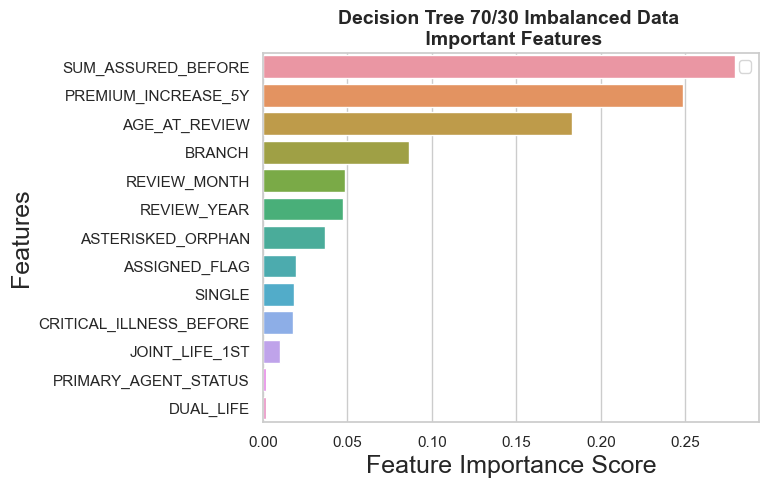

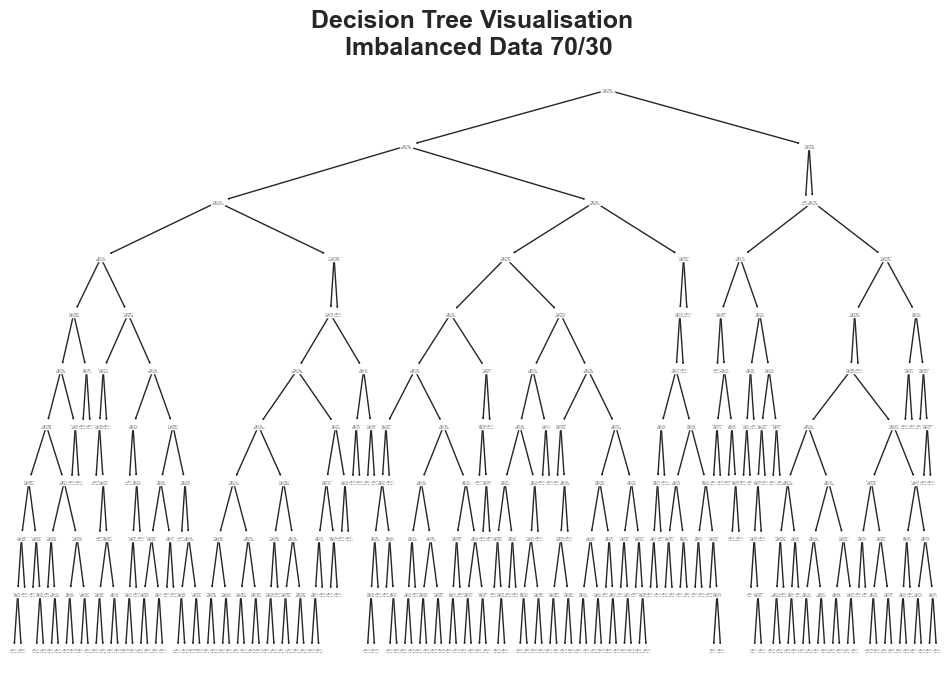

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


DT ROS 70/30 - Classification Report
              precision    recall  f1-score   support

         0.0       0.91      0.69      0.78      1863
         1.0       0.20      0.53      0.29       277

    accuracy                           0.67      2140
   macro avg       0.55      0.61      0.54      2140
weighted avg       0.82      0.67      0.72      2140



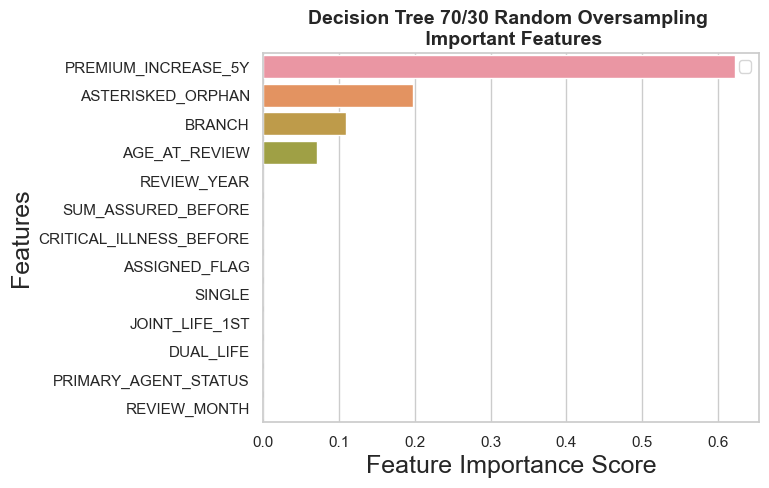

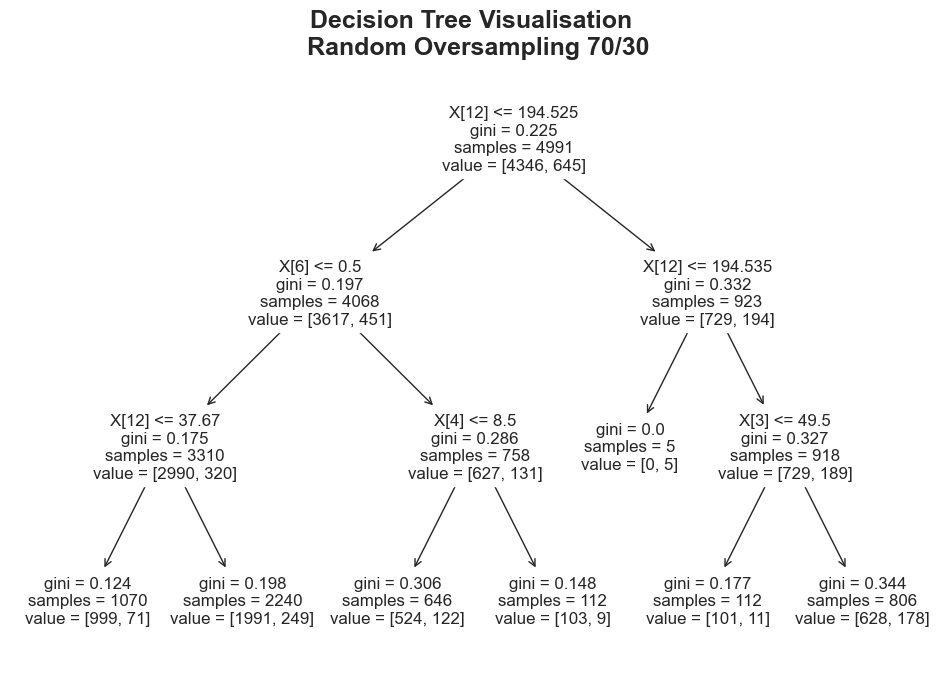

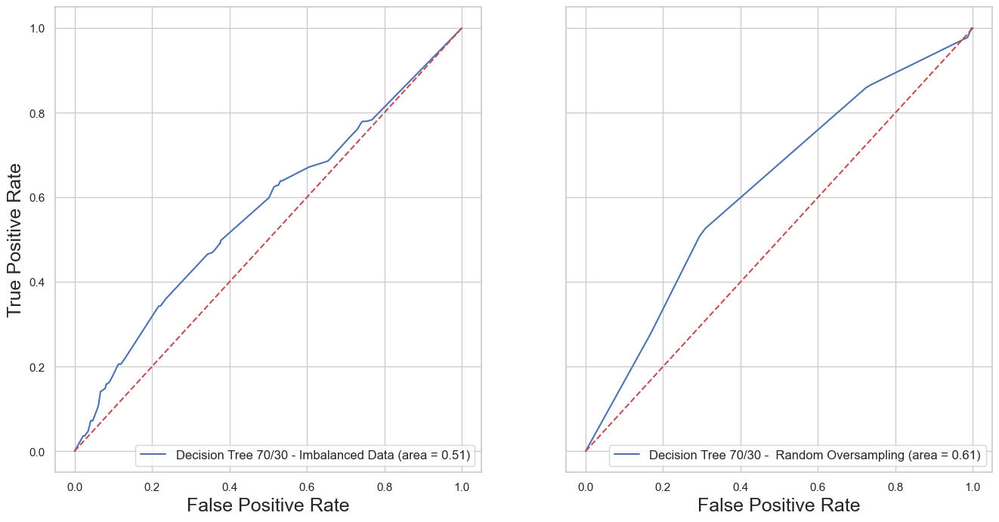

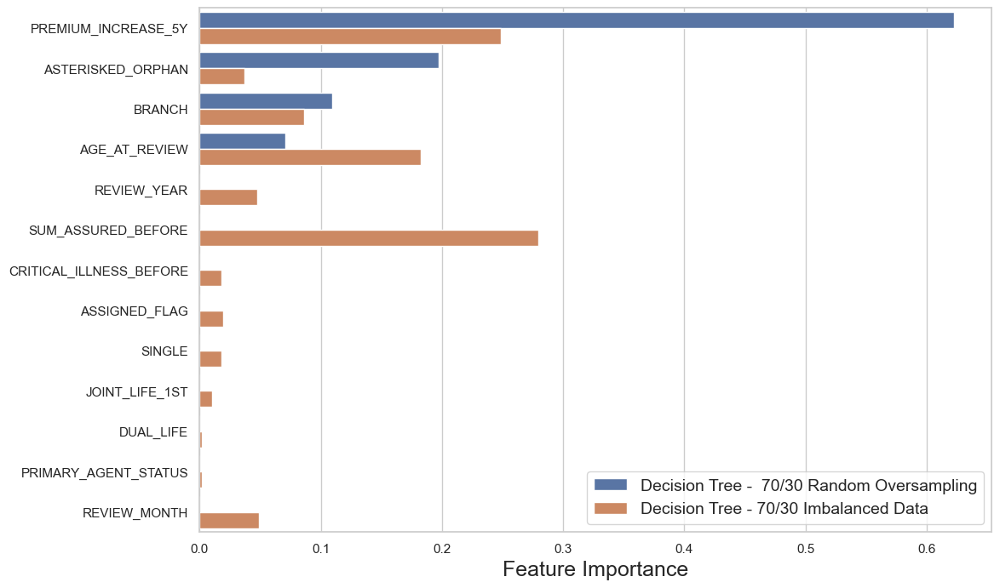

In [35]:
X_train = X_train_70
y_train = y_train_70
X_test = X_test_30
y_test = y_test_30
test_name = ["30pc_Test"]


model = DecisionTreeClassifier()
method = "IMB"

param_grid = {'max_depth': [10]}
stratified_kfold = StratifiedKFold(n_splits=5,shuffle=True,random_state=11)
gs = GridSearchCV(estimator=model,
                  param_grid=param_grid,
                  scoring='f1',
                  cv=stratified_kfold,
                  n_jobs=-1)

gs.fit(X_train,y_train)
best_model = gs.best_estimator_
# Call fit() method to train the model
best_model.fit(X_train,y_train)
# Predict the results
y_train_predict_1 = best_model.predict(X_train)
y_predict_1 = best_model.predict(X_test)
roc_auc_1= roc_auc_score(y_test, best_model.predict(X_test))
fpr_1, tpr_1, thresholds_1 = roc_curve(y_test,best_model.predict_proba(X_test)[:,1])
importances1=best_model.feature_importances_
feature_imp1 = pd.Series(importances1,index = X_df.columns.values).sort_values(ascending=False)
# Creating a bar plot
sns.barplot(x=feature_imp1,y=feature_imp1.index)
# Add labels to your graph
plt.xlabel('Feature Importance Score')
plt.ylabel('Features')
plt.title("Decision Tree 70/30 Imbalanced Data \n Important Features", fontsize = 14, fontweight = "bold")
plt.legend()
plt.show()


# Set the size of the figure
plt.figure(figsize = (12, 8))
# Display the tree by calling a method plot_tree()
tree.plot_tree(best_model.fit(X_train, y_train)) 
plt.title("Decision Tree Visualisation \n Imbalanced Data 70/30", fontsize = 18, fontweight = "bold")
#plt.show()

clf = DecisionTreeClassifier()
method = "ROS"
model = Pipeline([('resampler', RandomOverSampler(random_state = 42)),
             ('mms', MinMaxScaler()),
             ('clf',clf)])

param_grid = {'clf__max_depth': [3]}

stratified_kfold = StratifiedKFold(n_splits=5,shuffle=True,random_state=11)
gs = GridSearchCV(estimator=model,
                  param_grid=param_grid,
                  scoring='f1',
                  cv=stratified_kfold,
                  n_jobs=-1)
gs.fit(X_train,y_train)


best_model = gs.best_estimator_
# Call fit() method to train the model
best_model.fit(X_train,y_train)
# Predict the results
y_train_predict_2 = best_model.predict(X_train)
y_predict_2 = best_model.predict(X_test)

 # Compute confusion matrix
cnf_matrix_1 = confusion_matrix(y_test, y_predict_1)
cnf_matrix_2 = confusion_matrix(y_test, y_predict_2)

plt.show()

# print the classification_report based on y_test and y_predict) 
print(f'DT ROS 70/30 - Classification Report')
print(classification_report(y_test, y_predict_2))


roc_auc = roc_auc_score(y_test, best_model.predict(X_test))
fpr, tpr, thresholds = roc_curve(y_test,best_model.predict_proba(X_test)[:,1])
importances2=best_model.named_steps["clf"].feature_importances_
feature_imp2 = pd.Series(importances2,index = X_df.columns.values).sort_values(ascending=False)
# Creating a bar plot
sns.barplot(x=feature_imp2,y=feature_imp2.index)
# Add labels to your graph
plt.xlabel('Feature Importance Score')
plt.ylabel('Features')
plt.title("Decision Tree 70/30 Random Oversampling \n Important Features", fontsize = 14, fontweight = "bold")
plt.legend()
plt.show()

# Set the size of the figure
plt.figure(figsize = (12, 8))
# Display the tree by calling a method plot_tree()
tree.plot_tree(best_model.named_steps["clf"].fit(X_train, y_train)) 
plt.title("Decision Tree Visualisation \n Random Oversampling 70/30", fontsize = 18, fontweight = "bold")
#plt.show()


fig, axs = plt.subplots(1,2, sharey = True, figsize=(16,8))
axs[0].plot(fpr_1, tpr_1, label=f'Decision Tree 70/30 - Imbalanced Data (area = %0.2f)' % roc_auc_1)
axs[0].plot([0, 1], [0, 1],'r--')
axs[0].set_xlabel('False Positive Rate')
axs[0].set_ylabel('True Positive Rate')
axs[0].legend(loc="lower right",fontsize = 12)
axs[1].plot(fpr, tpr, label=f'Decision Tree 70/30 -  Random Oversampling (area = %0.2f)' % roc_auc)
axs[1].plot([0, 1], [0, 1],'r--')
axs[1].set_xlabel('False Positive Rate')
#axs[1].set_ylabel('True Positive Rate')
axs[1].legend(loc="lower right",fontsize = 12)
fig.show()


feature_imp1 = pd.DataFrame(feature_imp1)
feature_imp2 = pd.DataFrame(feature_imp2)
feature_imp1.rename(columns={0 :'Feature Importance'}, inplace=True )
feature_imp2.rename(columns={0 :'Feature Importance'}, inplace=True )
data = {'Model': ["Decision Tree - 70/30 Imbalanced Data"]}
feature_imp1_model = pd.DataFrame(data,index=feature_imp1.index)
feature_imp1["Model"] = feature_imp1_model["Model"]
data = {'Model': ["Decision Tree -  70/30 Random Oversampling"]}
feature_imp2_model = pd.DataFrame(data,index=feature_imp2.index)
feature_imp2["Model"] = feature_imp2_model["Model"]
feature_imp_concat = pd.concat([feature_imp2,feature_imp1])
feature_imp_concat = pd.DataFrame(feature_imp_concat)
#create grouped bar chart
plt.figure(figsize=(12,8))
sns.color_palette("GnBu")
plt.rcParams["axes.labelsize"] = 18
sns.barplot(x='Feature Importance',y=feature_imp_concat.index, hue = "Model",data=feature_imp_concat)
plt.legend(loc = "lower right",fontsize = 14)



## Feature Importance Comparison - Top Models (70/30)

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


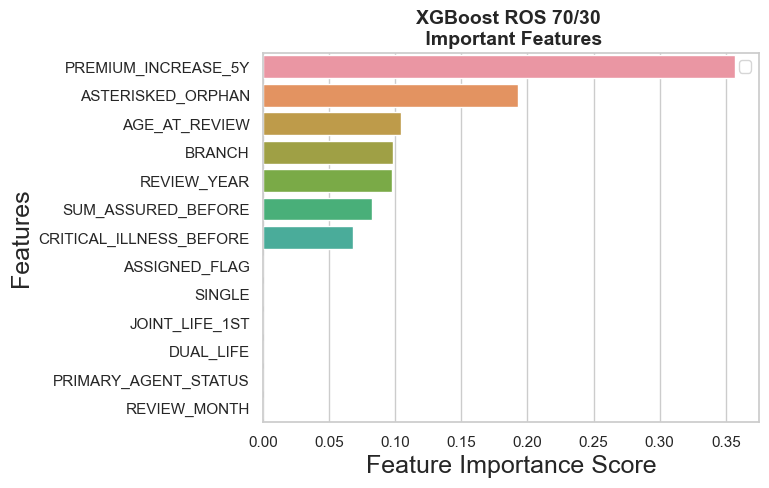

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


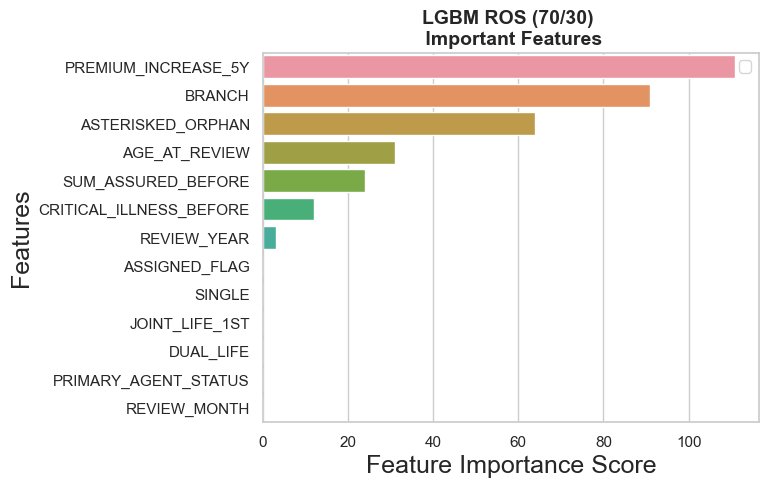

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


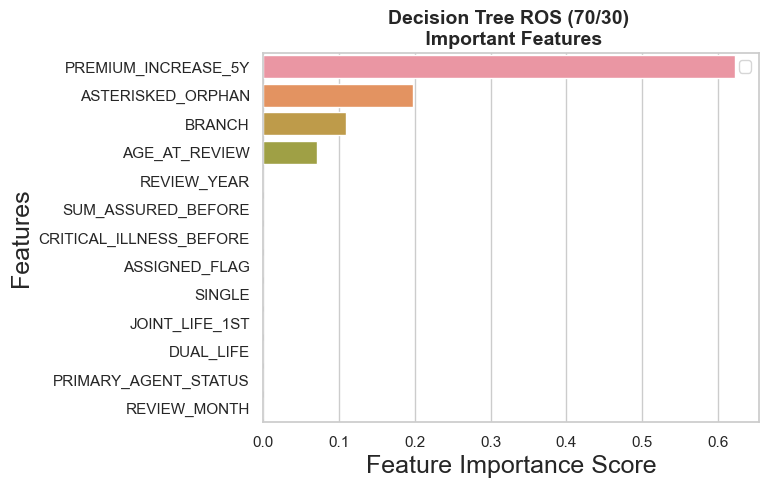

In [36]:
X_train = X_train_70
y_train = y_train_70
X_test = X_test_30
y_test = y_test_30

test_name = ["30pc_Test"]

clf1 = XGBClassifier() #ROS (max_depth = 1,n_estimators = 10)

model = Pipeline([('resampler', RandomOverSampler(random_state = 42)),
                     ('mms', MinMaxScaler()),
                     ('clf',clf1)])
        
param_grid = {'clf__learning_rate': [.01],'clf__max_depth': [3],'clf__n_estimators': [50]}
stratified_kfold = StratifiedKFold(n_splits=5,shuffle=True,random_state=11)


gs = GridSearchCV(estimator=model,
                          param_grid=param_grid,
                          scoring='f1',
                          cv=stratified_kfold,
                          n_jobs=-1)

gs.fit(X_train,y_train)
model = gs.best_estimator_
# Call fit() method to train the model
model.fit(X_train,y_train)
# Call fit() method to train the m
# Predict the results
y_train_predict_1 = model.predict(X_train)
y_predict_1 = model.predict(X_test)

importances1 = model.named_steps["clf"].feature_importances_
feature_imp1 = pd.Series(importances1,index = X_df.columns.values).sort_values(ascending=False)


# Creating a bar plot
sns.barplot(x=feature_imp1, y=feature_imp1.index)
# Add labels to your graph
plt.xlabel('Feature Importance Score')
plt.ylabel('Features')
plt.title("XGBoost ROS 70/30 \n Important Features", fontsize = 14, fontweight = "bold")
plt.legend()
plt.show()

clf2 = lgb.LGBMClassifier() #ROS (max_depth = 1,n_estimators = 10)

model = Pipeline([('resampler', RandomOverSampler(random_state = 42)),
                     ('mms', MinMaxScaler()),
                     ('clf',clf2)])
        
param_grid = {'clf__learning_rate': [.01],'clf__n_estimators': [50],'clf__max_depth': [3],'clf__num_leaves': [10]}
stratified_kfold = StratifiedKFold(n_splits=5,shuffle=True,random_state=11)


gs = GridSearchCV(estimator=model,
                          param_grid=param_grid,
                          scoring='f1',
                          cv=stratified_kfold,
                          n_jobs=-1)

gs.fit(X_train,y_train)
model = gs.best_estimator_
# Call fit() method to train the model
model.fit(X_train,y_train)
# Call fit() method to train the m
# Predict the results
y_train_predict_2 = model.predict(X_train)
y_predict_2 = model.predict(X_test)
importances2 = model.named_steps["clf"].feature_importances_
feature_imp2 = pd.Series(importances2,index = X_df.columns.values).sort_values(ascending=False)



sns.barplot(x=feature_imp2, y=feature_imp2.index)
# Add labels to your graph
plt.xlabel('Feature Importance Score')
plt.ylabel('Features')
plt.title("LGBM ROS (70/30) \n Important Features", fontsize = 14, fontweight = "bold")
plt.legend()
plt.show()


clf3 = DecisionTreeClassifier() #ROS (max_depth = 3)=

model = Pipeline([('resampler', RandomOverSampler(random_state = 42)),
                     ('mms', MinMaxScaler()),
                     ('clf',clf3)])
        
param_grid = {'clf__max_depth': [3]}
stratified_kfold = StratifiedKFold(n_splits=5,shuffle=True,random_state=11)

gs = GridSearchCV(estimator=model,
                          param_grid=param_grid,
                          scoring='f1',
                          cv=stratified_kfold,
                          n_jobs=-1)

gs.fit(X_train,y_train)

model = gs.best_estimator_
# Call fit() method to train the model
model.fit(X_train,y_train)
    
# Call fit() method to train the m

# Predict the results
y_train_predict_3 = model.predict(X_train)
y_predict_3 = model.predict(X_test)

importances3 = model.named_steps["clf"].feature_importances_
feature_imp3 = pd.Series(importances3,index = X_df.columns.values).sort_values(ascending=False)
# Creating a bar plot
#plt.plot(figsize = (16,16))
sns.barplot(x=feature_imp3, y=feature_imp3.index)
# Add labels to your graph
plt.xlabel('Feature Importance Score')
plt.ylabel('Features')
plt.title("Decision Tree ROS (70/30) \n Important Features", fontsize = 14, fontweight = "bold")
plt.legend()
plt.show()







In [37]:
feature_imp1 = pd.DataFrame(feature_imp1)
feature_imp2 = pd.DataFrame(feature_imp2)
feature_imp3 = pd.DataFrame(feature_imp3)
feature_imp1.rename(columns={0 :'Feature Importance'}, inplace=True )
feature_imp2.rename(columns={0 :'Feature Importance'}, inplace=True )
feature_imp3.rename(columns={0 :'Feature Importance'}, inplace=True )

In [38]:
data = {'Model': ["1. XGB ROS 70/30"]}
feature_imp1_model = pd.DataFrame(data,index=feature_imp1.index)
feature_imp1["Model"] = feature_imp1_model["Model"]

data = {'Model': ["2. LGBM ROS 70/30"]}
feature_imp2_model = pd.DataFrame(data,index=feature_imp2.index)
feature_imp2["Model"] = feature_imp2_model["Model"]

data = {'Model': ["3. DT ROS 70/30"]}
feature_imp3_model = pd.DataFrame(data,index=feature_imp3.index)
feature_imp3["Model"] = feature_imp3_model["Model"]

In [39]:
feature_imp_concat = pd.concat([feature_imp1,feature_imp3])
feature_imp_concat = pd.DataFrame(feature_imp_concat)


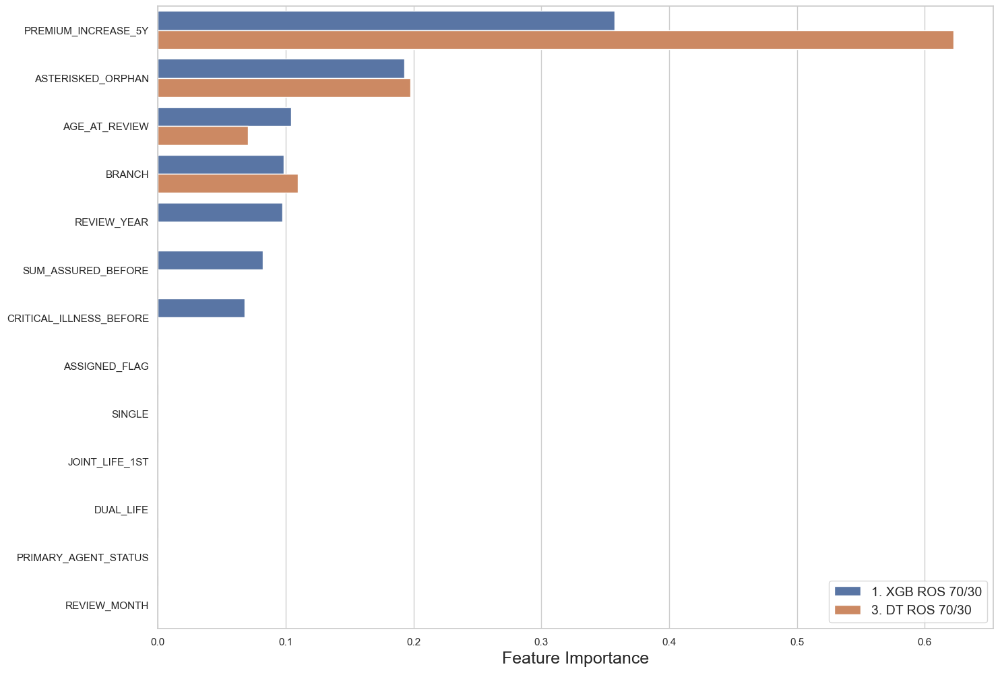

In [40]:
#create grouped bar chart
plt.figure(figsize=(16,12))
plt.rcParams["axes.labelsize"] = 18
sns.barplot(x='Feature Importance',y=feature_imp_concat.index, hue = "Model",data=feature_imp_concat)
plt.legend(loc = "lower right",fontsize = 14)

## Decision Tree 70/30 ROS - F1 Score by Max Depth

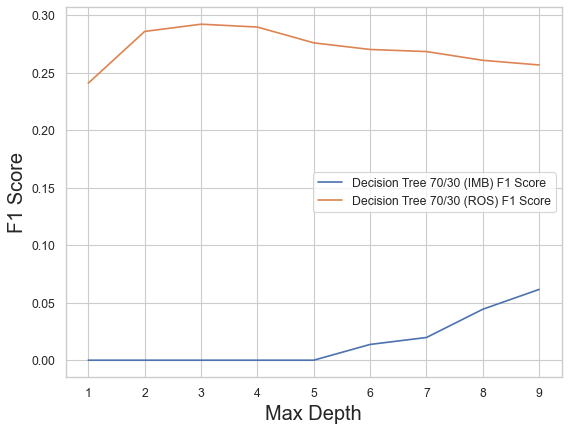

In [41]:
resampler = RandomOverSampler(random_state = 42)

X_test = X_test_30
y_test = y_test_30

model_name = 'DT'

# Declare arrays to store training and test accuracies
depth = np.arange(1, 10)
#train_f1 =np.empty(len(depth))
test_imb_f1 = np.empty(len(depth))
test_imb_roc_auc = np.empty(len(depth))
test_ros_f1 = np.empty(len(depth))
test_ros_roc_auc = np.empty(len(depth))

#for i, k in enumerate(depth):
for i, k in enumerate(depth):
       
    X_train = X_train_70
    y_train = y_train_70
    
    # Declare and initialise classifier
    model = DecisionTreeClassifier(max_depth = k)
    model.fit(X_train,y_train)

    # Predict the results
    #y_train_predict = model.predict(X_train)
    y_predict= model.predict(X_test)

    # Compute f1 score on the training set
    #train_f1[i] = metrics.f1_score(y_train, y_train_predict)
    
    # Compute f1 score on the test set
    test_imb_f1[i] = metrics.f1_score(y_test, y_predict) 
    test_imb_roc_auc[i] = roc_auc_score(y_test,y_predict)

#for i, k in enumerate(depth):
for i, k in enumerate(depth):
    
    X_train, y_train = resampler.fit_resample(X_train_70, y_train_70)
    
    # Declare and initialise classifier
    model = DecisionTreeClassifier(max_depth = k)
    model.fit(X_train,y_train)

    # Predict the results
    #y_train_predict = model.predict(X_train)
    y_predict= model.predict(X_test)

    # Compute f1 score on the training set
    #train_f1[i] = metrics.f1_score(y_train, y_train_predict)
    
    # Compute f1 score on the test set
    test_ros_f1[i] = metrics.f1_score(y_test, y_predict) 
    test_ros_roc_auc[i] = roc_auc_score(y_test,y_predict)
    
    # Visualise the accuracy based on the max_depth


from matplotlib.pyplot import figure
figure(figsize=(8, 6), dpi=80)
plt.plot(depth, test_imb_f1, label = 'Decision Tree 70/30 (IMB) F1 Score')
plt.plot(depth, test_ros_f1, label = 'Decision Tree 70/30 (ROS) F1 Score')
plt.legend()
plt.xlabel('Max Depth')
plt.ylabel('F1 Score')
plt.show()



